In [1]:
%cd /home/cug_fym/Swin-Transformer
import os
import time
import json
import random
import argparse
import datetime
import numpy as np
from torchvision import datasets, transforms
import torch
import torch.backends.cudnn as cudnn
import torch.distributed as dist

from timm.loss import LabelSmoothingCrossEntropy, SoftTargetCrossEntropy
from timm.utils import AverageMeter

from config import get_config
from models import build_model
from data import build_loader,build_test_loader
from lr_scheduler import build_scheduler
from optimizer import build_optimizer
from logger import create_logger
from utils import load_checkpoint, load_pretrained, save_checkpoint, NativeScalerWithGradNormCount, auto_resume_helper, \
    reduce_tensor

from timm.data.constants import IMAGENET_DEFAULT_MEAN, IMAGENET_DEFAULT_STD

def main(config):
    model = build_model(config)
    model.cuda()
    model_without_ddp = model
    print('{} devices in total'.format(torch.cuda.device_count()))
    if 'RANK' in os.environ and 'WORLD_SIZE' in os.environ:
        rank = int(os.environ["RANK"])
        world_size = int(os.environ['WORLD_SIZE'])
        model = torch.nn.parallel.DistributedDataParallel(model, device_ids=[config.LOCAL_RANK], broadcast_buffers=False, find_unused_parameters=True)
    else:
        rank=config.LOCAL_RANK
        world_size=1

    dataset_train, dataset_val, data_loader_train, data_loader_val, mixup_fn = build_loader(config)
    data_loader_test=build_test_loader(config)

    optimizer = build_optimizer(config, model)
    loss_scaler = NativeScalerWithGradNormCount()

    model.eval()

    if config.TRAIN.ACCUMULATION_STEPS > 1:
        lr_scheduler = build_scheduler(config, optimizer, len(data_loader_train) // config.TRAIN.ACCUMULATION_STEPS)
    else:
        lr_scheduler = build_scheduler(config, optimizer, len(data_loader_train))

    if config.AUG.MIXUP > 0.:
        # smoothing is handled with mixup label transform
        criterion = SoftTargetCrossEntropy()
    elif config.MODEL.LABEL_SMOOTHING > 0.:
        criterion = LabelSmoothingCrossEntropy(smoothing=config.MODEL.LABEL_SMOOTHING)
    else:
        criterion = torch.nn.CrossEntropyLoss()

    max_accuracy = 0.0

    if config.TRAIN.AUTO_RESUME:
        resume_file = auto_resume_helper(config.OUTPUT)
        if resume_file:
            if config.MODEL.RESUME:
                logger.warning(f"auto-resume changing resume file from {config.MODEL.RESUME} to {resume_file}")
            config.defrost()
            config.MODEL.RESUME = resume_file
            config.freeze()
            logger.info(f'auto resuming from {resume_file}')
        else:
            logger.info(f'no checkpoint found in {config.OUTPUT}, ignoring auto resume')

    if config.MODEL.RESUME:
        max_accuracy = load_checkpoint(config, model_without_ddp, optimizer, lr_scheduler, loss_scaler, logger)
        validate(config, data_loader_test, model)
        #logger.info(f"Accuracy of the network on the {len(dataset_val)} test images: {acc1:.1f}%")
        if config.EVAL_MODE:
            return

def parse_option():
    parser = argparse.ArgumentParser('Swin Transformer training and evaluation script', add_help=False)
    parser.add_argument('--cfg', type=str, metavar="FILE", help='path to config file',
                default='./configs/mynet/mynet_metrics_gid.yaml')
    parser.add_argument('--data-path', type=str, metavar="PATH", help='path to dataset',
                default='../GID_processed')
    parser.add_argument(
        "--opts",
        help="Modify config options by adding 'KEY VALUE' pairs. ",
        default=None,
        nargs='+',
    )

    # easy config modification
    parser.add_argument('--batch-size', type=int, help="batch size for single GPU")
    parser.add_argument('--zip', action='store_true', help='use zipped dataset instead of folder dataset')
    parser.add_argument('--cache-mode', type=str, default='part', choices=['no', 'full', 'part'],
                        help='no: no cache, '
                             'full: cache all data, '
                             'part: sharding the dataset into nonoverlapping pieces and only cache one piece')
    parser.add_argument('--pretrained',
                        help='pretrained weight from checkpoint, could be imagenet22k pretrained weight')
    parser.add_argument('--resume', help='resume from checkpoint')
    parser.add_argument('--accumulation-steps', type=int, help="gradient accumulation steps")
    parser.add_argument('--use-checkpoint', action='store_true',
                        help="whether to use gradient checkpointing to save memory")
    parser.add_argument('--disable_amp', action='store_true', help='Disable pytorch amp')
    parser.add_argument('--amp-opt-level', type=str, choices=['O0', 'O1', 'O2'],
                        help='mixed precision opt level, if O0, no amp is used (deprecated!)')
    parser.add_argument('--output', default='output', type=str, metavar='PATH',
                        help='root of output folder, the full path is <output>/<model_name>/<tag> (default: output)')
    parser.add_argument('--tag', help='tag of experiment')
    parser.add_argument('--eval', action='store_true', help='Perform evaluation only')
    parser.add_argument('--throughput', action='store_true', help='Test throughput only')

    # distributed training
    parser.add_argument("--local_rank", type=int, help='local rank for DistributedDataParallel',
                    default='0')

    # for acceleration
    parser.add_argument('--fused_window_process', action='store_true',
                        help='Fused window shift & window partition, similar for reversed part.')
    parser.add_argument('--fused_layernorm', action='store_true', help='Use fused layernorm.')
    ## overwrite optimizer in config (*.yaml) if specified, e.g., fused_adam/fused_lamb
    parser.add_argument('--optim', type=str,
                        help='overwrite optimizer if provided, can be adamw/sgd/fused_adam/fused_lamb.')

    args, unparsed = parser.parse_known_args()

    config = get_config(args)

    return args, config

pivix = np.array([
[0, 0, 0],  #0 背景
[150, 250,   0], #1 水浇地
[250, 150, 150], #2 交通用地
[200,   0,   0], #3 工业用地
[200, 150, 150], #4 农村住宅
[  0, 200, 250], #5 池塘
[  0,   0, 200], #6 河流
[200,   0, 200], #7 园地
[150, 200, 150], #8 旱耕地
[250,   0, 150],#9 城镇住宅
[150,   0, 250],#10 乔木林地
[150, 150, 250],#11 灌木林地
[  0, 150, 200],#12 湖泊
[  0, 120,  64],#13 水田
[250, 200,   0],#14 天然草地
[200, 200,   0] #15 人工草地
],dtype=np.int64)
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

def PA(output,target):
    return torch.sum(output.argmax(dim=1)==target,dim=[0,1,2])/(target.shape[0]*target.shape[1]*target.shape[2])

def MPA(output,target):
    num_classes=output.shape[1]
    acc=torch.cat([(torch.sum((output.argmax(dim=1)==target)&(target==k))/torch.sum(output.argmax(dim=1)==k)).view(-1) for k in range(num_classes)],dim=0)
    return torch.mean(acc[~torch.isnan(acc)],dim=0)

def KAPPA(output,target, pa=None):
    num_classes=output.shape[1]
    acc=torch.cat([(torch.sum(output.argmax(dim=1)==k)*torch.sum(target==k)).view(-1) for k in range(num_classes)],dim=0)
    Kc=torch.sum(acc)/((target.shape[0]*target.shape[1]*target.shape[2])**2)
    if(Kc == 1.0):
        return 1.0
    if pa is None:
        pa = PA(output,target)
    return (pa-Kc)/(1-Kc)

def MIoU(output,target):
    num_classes=output.shape[1]
    acc=torch.cat([(torch.sum((output.argmax(dim=1)==target)&(target==k))/torch.sum((output.argmax(dim=1)==k)|(target==k))).view(-1)
                   for k in range(num_classes)],dim=0)
    return torch.mean(acc[~torch.isnan(acc)])

def FWIoU(output,target):
    num_classes=output.shape[1]
    acc=torch.cat([(torch.sum((output.argmax(dim=1)==target)&(target==k))/torch.sum((output.argmax(dim=1)==k)|(target==k))).view(-1)
                   for k in range(num_classes)],dim=0)
    acc[torch.isnan(acc)]=0
    weight=torch.cat([torch.sum(output.argmax(dim=1)==k).view(-1) for k in range(num_classes)],dim=0)
    return torch.sum(torch.cat([(acc[k]*weight[k]).view(-1) for k in range(num_classes)],dim=0),dim=0)/torch.sum(weight)

class Evaluator(object):
    def __init__(self, num_class):
        self.num_class = num_class
        self.confusion_matrix = np.zeros((self.num_class,)*2)

    def Pixel_Accuracy(self):
        Acc = np.diag(self.confusion_matrix).sum() / self.confusion_matrix.sum()
        return Acc

    def Pixel_Accuracy_Class(self):
        Acc = np.diag(self.confusion_matrix) / self.confusion_matrix.sum(axis=0)
        Acc = np.nanmean(Acc)
        return Acc

    def Kappa(self):
        Kc = np.sum(np.sum(self.confusion_matrix, axis=1) * np.sum(self.confusion_matrix, axis=0)) / (self.confusion_matrix.sum()**2)
        if Kc==1.0:
            return 1.0
        Pa = self.Pixel_Accuracy()
        return (Pa-Kc)/(1-Kc)

    def Mean_Intersection_over_Union(self):
        MIoU = np.diag(self.confusion_matrix) / (
                    np.sum(self.confusion_matrix, axis=1) + np.sum(self.confusion_matrix, axis=0) -
                    np.diag(self.confusion_matrix))
        MIoU = np.nanmean(MIoU)
        return MIoU

    def Intersection_over_Union(self):
        IoU = np.diag(self.confusion_matrix) / (
                    np.sum(self.confusion_matrix, axis=1) + np.sum(self.confusion_matrix, axis=0) -
                    np.diag(self.confusion_matrix))
        return IoU

    def Frequency_Weighted_Intersection_over_Union(self):
        freq = np.sum(self.confusion_matrix, axis=1) / np.sum(self.confusion_matrix)
        iu = np.diag(self.confusion_matrix) / (
                    np.sum(self.confusion_matrix, axis=1) + np.sum(self.confusion_matrix, axis=0) -
                    np.diag(self.confusion_matrix))

        FWIoU = (freq[freq > 0] * iu[freq > 0]).sum()
        return FWIoU

    def _generate_matrix(self, pre_image, gt_image):
        mask = (gt_image >= 0) & (gt_image < self.num_class)
        label = self.num_class * gt_image[mask].astype('int') + pre_image[mask]
        count = np.bincount(label, minlength=self.num_class**2)
        confusion_matrix = count.reshape(self.num_class, self.num_class)
        return confusion_matrix

    def add_batch(self, pre_image, gt_image):
        assert gt_image.shape == pre_image.shape
        self.confusion_matrix += self._generate_matrix(gt_image, pre_image)

    def reset(self):
        self.confusion_matrix = np.zeros((self.num_class,) * 2)

@torch.no_grad()
def validate(config, data_loader, model):
    criterion = torch.nn.CrossEntropyLoss()
    model.eval()
    loss_meter = AverageMeter()
    pa_meter = AverageMeter()
    mpa_meter = AverageMeter()
    kappa_meter = AverageMeter()
    miou_meter = AverageMeter()
    fwiou_meter = AverageMeter()

    elevator = Evaluator(16)

    for idx, (images, target) in enumerate(data_loader):
        images = images.cuda(non_blocking=True)
        target = target.cuda(non_blocking=True)

        # compute output
        with torch.cuda.amp.autocast(enabled=config.AMP_ENABLE):
            output= model(images)
            loss = criterion(output, target)
            pa = PA(output, target)
            mpa = MPA(output, target)
            kappa = KAPPA(output, target, pa)
            miou = MIoU(output, target)
            fwiou = FWIoU(output,target)

#         un_norm = transforms.Compose([ transforms.Normalize(mean = [ 0., 0., 0. ],
#                                                      std = 1/np.array(IMAGENET_DEFAULT_STD)),
#                                 transforms.Normalize(mean = -np.array(IMAGENET_DEFAULT_MEAN),
#                                                      std = [ 1., 1., 1. ]),
#                                ])

        images_np=images.to('cpu').numpy()
        output_np=output.to('cpu').numpy()
        #output2_np=output2.to('cpu').numpy()
        groundTruth=target.to('cpu').numpy()
        elevator.add_batch(output.argmax(dim=1).to('cpu').numpy(),groundTruth)
        #print(output.shape,output2.shape)
        for k in range(images.shape[0]):
#             for i in range(5):
#                 plt.subplot(4,4,i+1)
#                 pic=np.ones((256,256,3),dtype=np.int64)
#                 pic[:,:,:]=pivix[output2_np[k,:,:,:,i].argmax(0)]
#                 plt.imshow(pic)
            plt.show()
            pic=np.ones((256,256,3),dtype=np.int64)
            plt.subplot(1,2,1)
            pic[:,:,:]=pivix[output_np[k,:,:,:].argmax(0)]
            plt.imshow(pic)
            plt.subplot(1,2,2)
            pic[:,:,:]=pivix[groundTruth[k,:,:]]
            plt.imshow(pic)
            plt.show()
            # measure accuracy and record loss

        loss_meter.update(loss.item(), target.size(0))
        pa_meter.update(pa.item()*100, target.size(0))
        mpa_meter.update(mpa.item()*100, target.size(0))
        kappa_meter.update(kappa*100, target.size(0))
        miou_meter.update(miou.item()*100, target.size(0))
        fwiou_meter.update(fwiou.item()*100, target.size(0))

        memory_used = torch.cuda.max_memory_allocated() / (1024.0 * 1024.0)
        logger.info(
                f'Test: [{idx}/{len(data_loader)}]\t'
                f'Loss {loss_meter.val:.4f} ({loss_meter.avg:.4f})\t'
                f'PA@1 {pa_meter.val:.4f} ({pa_meter.avg:.4f})\t'
                f'MPA@1 {mpa_meter.val:.4f} ({mpa_meter.avg:.4f})\t'
                f'KAPPA@1 {kappa_meter.val:.4f} ({kappa_meter.avg:.4f})\t'
                f'MIOU@1 {miou_meter.val:.4f} ({miou_meter.avg:.4f})\t'
                f'FWIOU@1 {fwiou_meter.val:.4f} ({fwiou_meter.avg:.4f})\t'
                f'Mem {memory_used:.0f}MB')

    logger.info(f'TOTAL\t'
                f'PA@1 {elevator.Pixel_Accuracy()*100:.4f}\t'
                f'MPA@1 {elevator.Pixel_Accuracy_Class()*100:.4f}\t'
                f'KAPPA@1 {elevator.Kappa()*100:.4f}\t'
                f'MIOU@1 {elevator.Mean_Intersection_over_Union()*100:.4f}\t'
                f'FWIOU@1 {elevator.Frequency_Weighted_Intersection_over_Union()*100:.4f}\t')
    print(elevator.Intersection_over_Union()*100)

/home/cug_fym/Swin-Transformer


/root/anaconda3/envs/swin/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Tutel has not been installed. To use Swin-MoE, please install Tutel; otherwise, just ignore this.
To use FusedLAMB or FusedAdam, please install apex.


=> merge config from ./configs/mynet/mynet_metrics_gid.yaml


/root/anaconda3/envs/swin/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


3 devices in total
local rank 0 / global rank 0 successfully build train dataset
local rank 0 / global rank 0 successfully build val dataset
All checkpoints founded in output/swanet_v5/default: ['best_param.pth', 'ckpt_epoch_140.pth']
The latest checkpoint founded: output/swanet_v5/default/best_param.pth
[2023-05-30 22:51:09 swanet_v5](182747771.py 72): INFO auto resuming from output/swanet_v5/default/best_param.pth
[2023-05-30 22:51:09 swanet_v5](utils.py 15): INFO ==============> Resuming form output/swanet_v5/default/best_param.pth....................
[2023-05-30 22:51:10 swanet_v5](utils.py 22): INFO <All keys matched successfully>
[2023-05-30 22:51:12 swanet_v5](utils.py 35): INFO => loaded successfully 'output/swanet_v5/default/best_param.pth' (epoch 158)


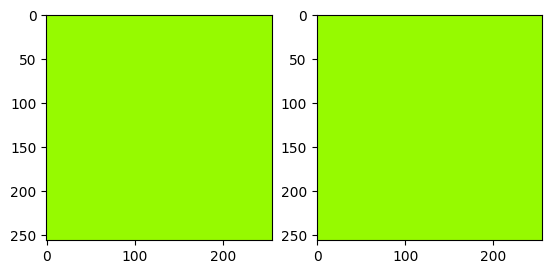

[2023-05-30 22:51:16 swanet_v5](182747771.py 311): INFO Test: [0/728]	Loss 0.0005 (0.0005)	PA@1 100.0000 (100.0000)	MPA@1 100.0000 (100.0000)	KAPPA@1 100.0000 (100.0000)	MIOU@1 100.0000 (100.0000)	FWIOU@1 100.0000 (100.0000)	Mem 44806MB


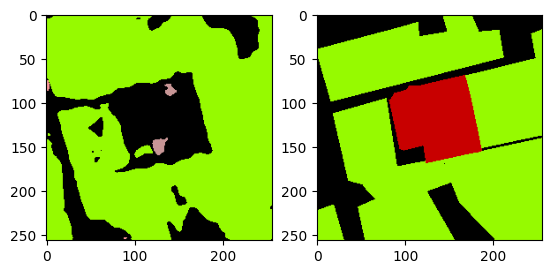

[2023-05-30 22:51:17 swanet_v5](182747771.py 311): INFO Test: [1/728]	Loss 1.6068 (0.8036)	PA@1 72.0490 (86.0245)	MPA@1 31.8997 (65.9498)	KAPPA@1 40.1211 (70.0605)	MIOU@1 21.6873 (60.8436)	FWIOU@1 65.4619 (82.7309)	Mem 44806MB


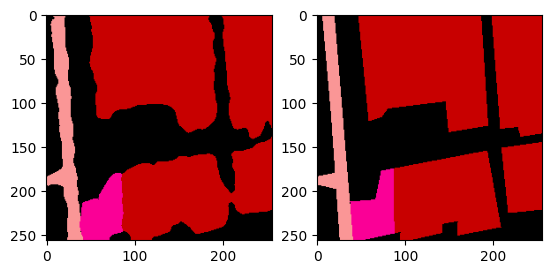

[2023-05-30 22:51:17 swanet_v5](182747771.py 311): INFO Test: [2/728]	Loss 0.1079 (0.5717)	PA@1 95.5643 (89.2044)	MPA@1 93.7984 (75.2327)	KAPPA@1 92.2664 (77.4625)	MIOU@1 89.1444 (70.2772)	FWIOU@1 91.5325 (85.6648)	Mem 44806MB


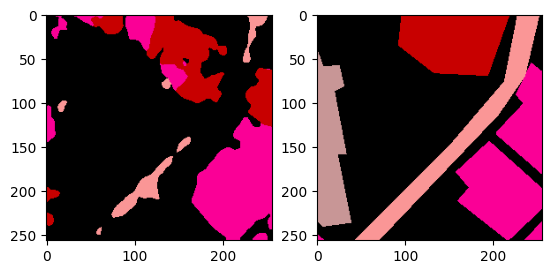

[2023-05-30 22:51:17 swanet_v5](182747771.py 311): INFO Test: [3/728]	Loss 1.5189 (0.8085)	PA@1 69.1162 (84.1824)	MPA@1 69.0576 (73.6889)	KAPPA@1 46.0968 (69.6211)	MIOU@1 36.1037 (61.7338)	FWIOU@1 59.1385 (79.0332)	Mem 44806MB


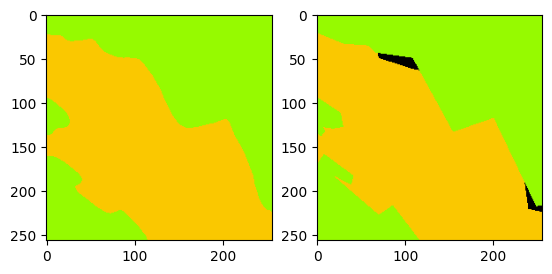

[2023-05-30 22:51:18 swanet_v5](182747771.py 311): INFO Test: [4/728]	Loss 0.0756 (0.6619)	PA@1 97.4915 (86.8442)	MPA@1 97.6027 (78.4717)	KAPPA@1 95.0012 (74.6971)	MIOU@1 63.9897 (62.1850)	FWIOU@1 95.9760 (82.4218)	Mem 44806MB


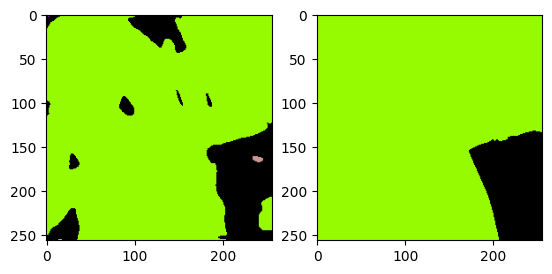

[2023-05-30 22:51:18 swanet_v5](182747771.py 311): INFO Test: [5/728]	Loss 0.2070 (0.5861)	PA@1 93.1458 (87.8944)	MPA@1 41.0845 (72.2405)	KAPPA@1 70.4830 (73.9948)	MIOU@1 37.8915 (58.1361)	FWIOU@1 87.4231 (83.2553)	Mem 44806MB


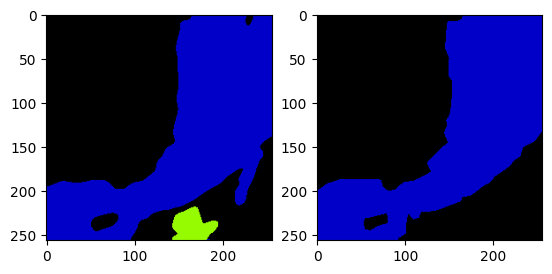

[2023-05-30 22:51:18 swanet_v5](182747771.py 311): INFO Test: [6/728]	Loss 0.1378 (0.5221)	PA@1 94.8196 (88.8838)	MPA@1 64.3926 (71.1193)	KAPPA@1 89.7179 (76.2409)	MIOU@1 61.3580 (58.5964)	FWIOU@1 90.0891 (84.2316)	Mem 44806MB


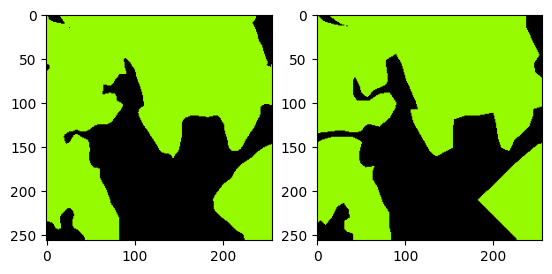

[2023-05-30 22:51:18 swanet_v5](182747771.py 311): INFO Test: [7/728]	Loss 0.0964 (0.4689)	PA@1 96.2845 (89.8088)	MPA@1 96.1287 (74.2455)	KAPPA@1 91.8790 (78.1957)	MIOU@1 92.2204 (62.7994)	FWIOU@1 92.8718 (85.3116)	Mem 44806MB


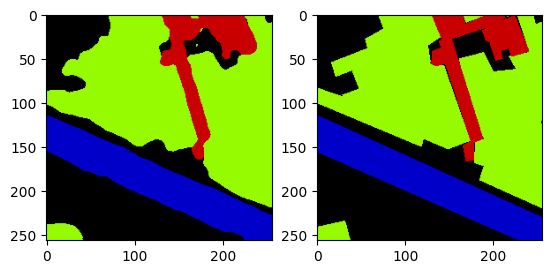

[2023-05-30 22:51:19 swanet_v5](182747771.py 311): INFO Test: [8/728]	Loss 0.1084 (0.4288)	PA@1 95.6467 (90.4575)	MPA@1 94.9165 (76.5423)	KAPPA@1 93.5152 (79.8979)	MIOU@1 90.9452 (65.9267)	FWIOU@1 91.7427 (86.0262)	Mem 44806MB


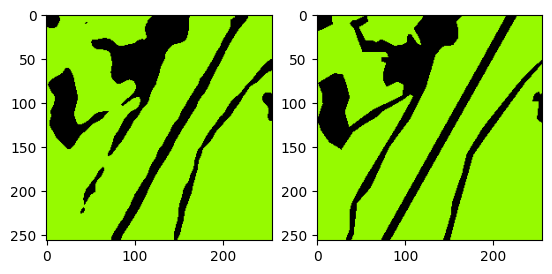

[2023-05-30 22:51:19 swanet_v5](182747771.py 311): INFO Test: [9/728]	Loss 0.1186 (0.3978)	PA@1 94.8303 (90.8948)	MPA@1 93.3716 (78.2252)	KAPPA@1 84.6039 (80.3685)	MIOU@1 86.0130 (67.9353)	FWIOU@1 90.4912 (86.4727)	Mem 44806MB


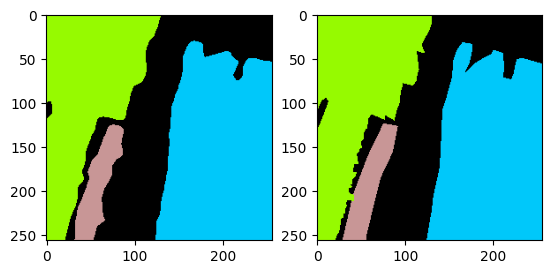

[2023-05-30 22:51:19 swanet_v5](182747771.py 311): INFO Test: [10/728]	Loss 0.0599 (0.3671)	PA@1 97.5174 (91.4968)	MPA@1 96.5111 (79.8876)	KAPPA@1 96.4125 (81.8270)	MIOU@1 93.1013 (70.2231)	FWIOU@1 95.2259 (87.2684)	Mem 44806MB


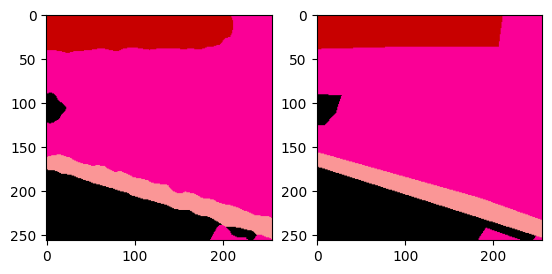

[2023-05-30 22:51:19 swanet_v5](182747771.py 311): INFO Test: [11/728]	Loss 0.0574 (0.3413)	PA@1 97.5815 (92.0039)	MPA@1 95.9715 (81.2279)	KAPPA@1 95.6439 (82.9784)	MIOU@1 93.2022 (72.1381)	FWIOU@1 95.2928 (87.9371)	Mem 44806MB


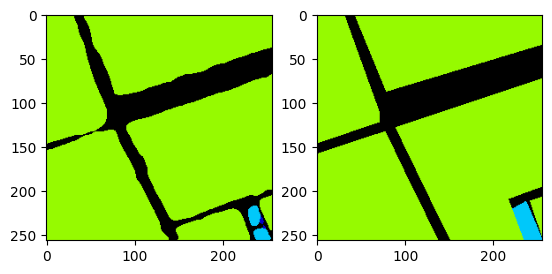

[2023-05-30 22:51:20 swanet_v5](182747771.py 311): INFO Test: [12/728]	Loss 0.1510 (0.3266)	PA@1 94.4260 (92.1902)	MPA@1 70.8389 (80.4288)	KAPPA@1 81.7454 (82.8836)	MIOU@1 55.9125 (70.8899)	FWIOU@1 90.1102 (88.1043)	Mem 44806MB


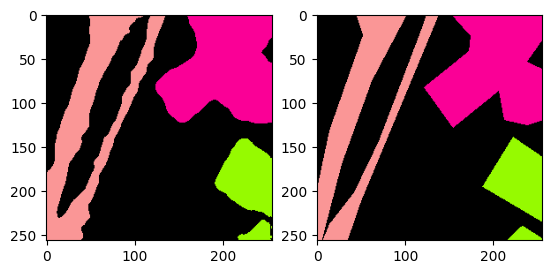

[2023-05-30 22:51:20 swanet_v5](182747771.py 311): INFO Test: [13/728]	Loss 0.1083 (0.3110)	PA@1 95.5582 (92.4308)	MPA@1 93.7435 (81.3798)	KAPPA@1 92.4253 (83.5651)	MIOU@1 90.0929 (72.2616)	FWIOU@1 91.4899 (88.3461)	Mem 44806MB


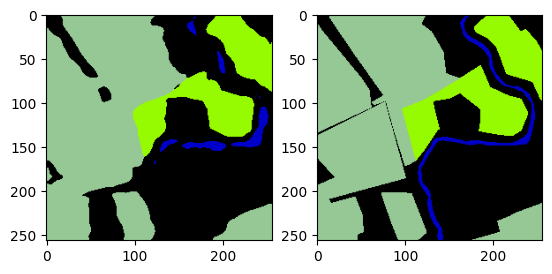

[2023-05-30 22:51:20 swanet_v5](182747771.py 311): INFO Test: [14/728]	Loss 0.1634 (0.3012)	PA@1 93.1519 (92.4788)	MPA@1 83.1520 (81.4980)	KAPPA@1 89.0722 (83.9323)	MIOU@1 73.3016 (72.3309)	FWIOU@1 88.2131 (88.3372)	Mem 44806MB


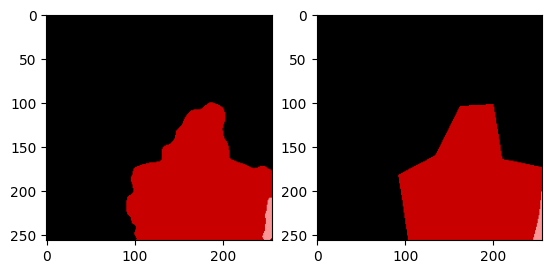

[2023-05-30 22:51:21 swanet_v5](182747771.py 311): INFO Test: [15/728]	Loss 0.0335 (0.2845)	PA@1 98.5764 (92.8599)	MPA@1 91.9684 (82.1524)	KAPPA@1 96.3986 (84.7114)	MIOU@1 88.5284 (73.3433)	FWIOU@1 97.2205 (88.8925)	Mem 44806MB


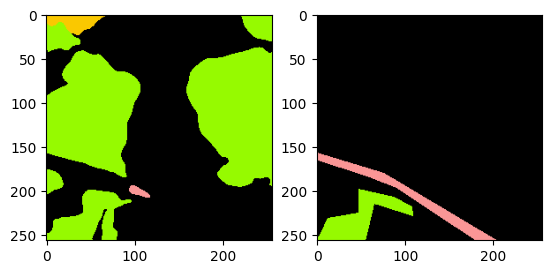

[2023-05-30 22:51:21 swanet_v5](182747771.py 311): INFO Test: [16/728]	Loss 2.9819 (0.4431)	PA@1 57.0587 (90.7540)	MPA@1 47.8874 (80.1368)	KAPPA@1 5.5687 (80.0560)	MIOU@1 17.7899 (70.0754)	FWIOU@1 34.8894 (85.7158)	Mem 44806MB


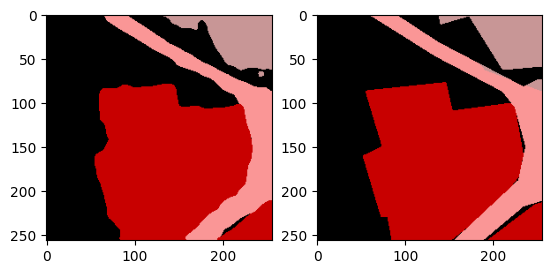

[2023-05-30 22:51:21 swanet_v5](182747771.py 311): INFO Test: [17/728]	Loss 0.0872 (0.4234)	PA@1 96.9360 (91.0974)	MPA@1 95.3784 (80.9835)	KAPPA@1 95.3357 (80.9048)	MIOU@1 91.9936 (71.2931)	FWIOU@1 94.0953 (86.1813)	Mem 44806MB


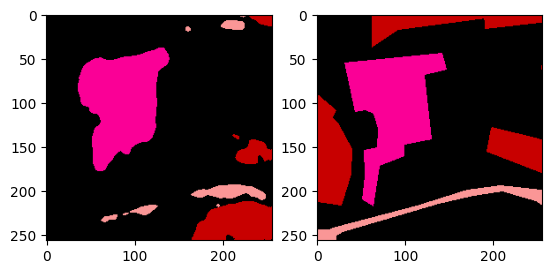

[2023-05-30 22:51:21 swanet_v5](182747771.py 311): INFO Test: [18/728]	Loss 1.3508 (0.4722)	PA@1 77.5665 (90.3853)	MPA@1 63.4304 (80.0597)	KAPPA@1 48.2808 (79.1878)	MIOU@1 48.5219 (70.0946)	FWIOU@1 69.3070 (85.2932)	Mem 44806MB


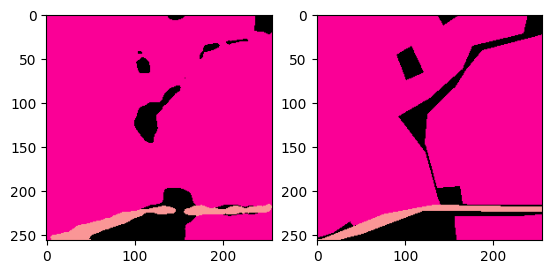

[2023-05-30 22:51:21 swanet_v5](182747771.py 311): INFO Test: [19/728]	Loss 0.1099 (0.4541)	PA@1 95.1630 (90.6242)	MPA@1 86.1410 (80.3637)	KAPPA@1 79.6566 (79.2112)	MIOU@1 73.6401 (70.2719)	FWIOU@1 91.9673 (85.6269)	Mem 44806MB


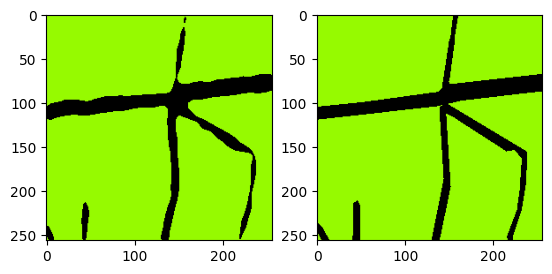

[2023-05-30 22:51:22 swanet_v5](182747771.py 311): INFO Test: [20/728]	Loss 0.0662 (0.4356)	PA@1 97.2763 (90.9409)	MPA@1 94.0529 (81.0156)	KAPPA@1 87.6540 (79.6133)	MIOU@1 88.7282 (71.1508)	FWIOU@1 94.8720 (86.0672)	Mem 44806MB


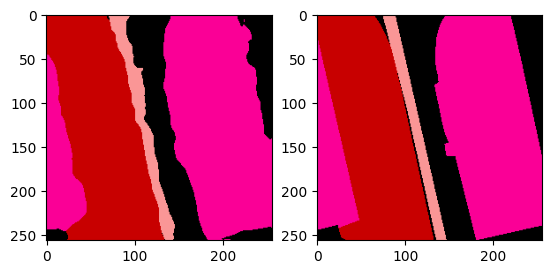

[2023-05-30 22:51:22 swanet_v5](182747771.py 311): INFO Test: [21/728]	Loss 0.0937 (0.4200)	PA@1 96.2387 (91.1817)	MPA@1 93.4061 (81.5788)	KAPPA@1 94.3292 (80.2822)	MIOU@1 88.6219 (71.9449)	FWIOU@1 92.9343 (86.3793)	Mem 44806MB


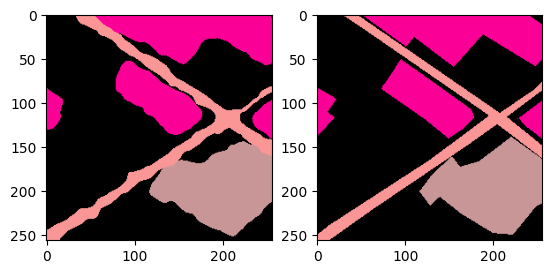

[2023-05-30 22:51:22 swanet_v5](182747771.py 311): INFO Test: [22/728]	Loss 0.1229 (0.4071)	PA@1 95.0882 (91.3516)	MPA@1 93.0934 (82.0795)	KAPPA@1 91.9569 (80.7898)	MIOU@1 88.7530 (72.6757)	FWIOU@1 90.6766 (86.5661)	Mem 44806MB


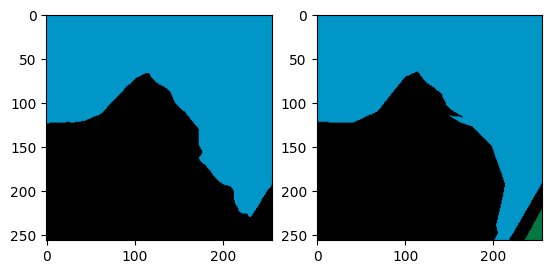

[2023-05-30 22:51:22 swanet_v5](182747771.py 311): INFO Test: [23/728]	Loss 0.1575 (0.3967)	PA@1 95.6772 (91.5318)	MPA@1 95.6697 (82.6457)	KAPPA@1 91.3888 (81.2314)	MIOU@1 61.4712 (72.2088)	FWIOU@1 92.2501 (86.8030)	Mem 44806MB


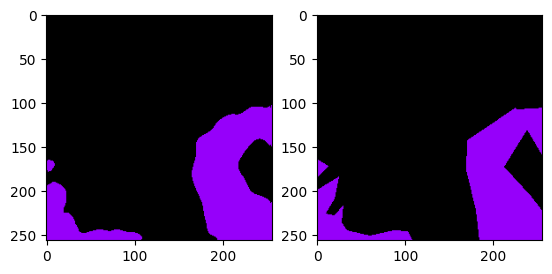

[2023-05-30 22:51:22 swanet_v5](182747771.py 311): INFO Test: [24/728]	Loss 0.0527 (0.3830)	PA@1 97.7539 (91.7807)	MPA@1 95.2410 (83.1495)	KAPPA@1 92.4079 (81.6784)	MIOU@1 92.7897 (73.0321)	FWIOU@1 95.6246 (87.1558)	Mem 44806MB


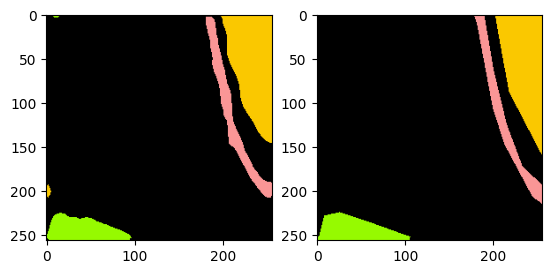

[2023-05-30 22:51:23 swanet_v5](182747771.py 311): INFO Test: [25/728]	Loss 0.0435 (0.3699)	PA@1 98.2193 (92.0283)	MPA@1 94.5432 (83.5877)	KAPPA@1 93.4034 (82.1294)	MIOU@1 89.9555 (73.6830)	FWIOU@1 96.5734 (87.5180)	Mem 44806MB


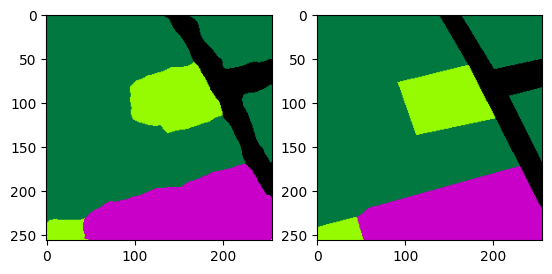

[2023-05-30 22:51:23 swanet_v5](182747771.py 311): INFO Test: [26/728]	Loss 0.0782 (0.3591)	PA@1 96.7484 (92.2032)	MPA@1 95.0685 (84.0130)	KAPPA@1 94.3727 (82.5828)	MIOU@1 91.2987 (74.3354)	FWIOU@1 93.7547 (87.7490)	Mem 44806MB


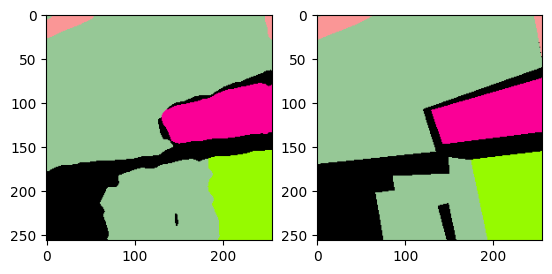

[2023-05-30 22:51:23 swanet_v5](182747771.py 311): INFO Test: [27/728]	Loss 0.1381 (0.3512)	PA@1 94.1299 (92.2720)	MPA@1 97.3697 (84.4900)	KAPPA@1 89.8577 (82.8427)	MIOU@1 86.5331 (74.7710)	FWIOU@1 89.4068 (87.8082)	Mem 44806MB


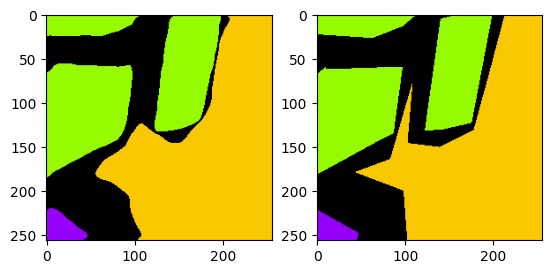

[2023-05-30 22:51:23 swanet_v5](182747771.py 311): INFO Test: [28/728]	Loss 0.1241 (0.3434)	PA@1 94.8074 (92.3594)	MPA@1 92.9996 (84.7834)	KAPPA@1 92.1134 (83.1623)	MIOU@1 88.8019 (75.2549)	FWIOU@1 90.4210 (87.8983)	Mem 44806MB


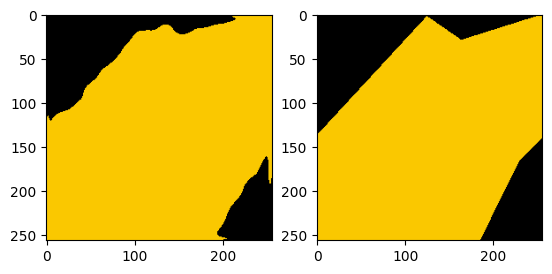

[2023-05-30 22:51:24 swanet_v5](182747771.py 311): INFO Test: [29/728]	Loss 0.0895 (0.3349)	PA@1 95.7474 (92.4723)	MPA@1 96.5956 (85.1772)	KAPPA@1 87.5230 (83.3077)	MIOU@1 88.4446 (75.6945)	FWIOU@1 92.2027 (88.0418)	Mem 44806MB


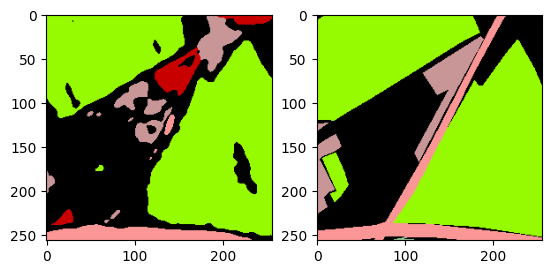

[2023-05-30 22:51:24 swanet_v5](182747771.py 311): INFO Test: [30/728]	Loss 0.7226 (0.3474)	PA@1 78.4058 (92.0186)	MPA@1 53.6189 (84.1591)	KAPPA@1 64.0763 (82.6873)	MIOU@1 32.7072 (74.3078)	FWIOU@1 67.3043 (87.3729)	Mem 44806MB


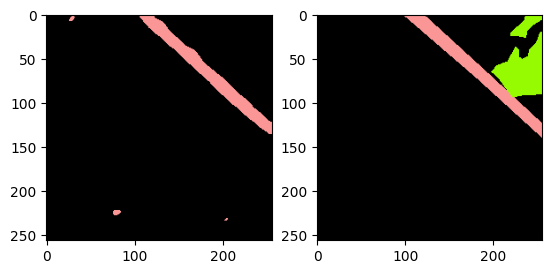

[2023-05-30 22:51:24 swanet_v5](182747771.py 311): INFO Test: [31/728]	Loss 0.4640 (0.3511)	PA@1 94.8898 (92.1083)	MPA@1 93.4933 (84.4508)	KAPPA@1 58.1565 (81.9207)	MIOU@1 59.8382 (73.8556)	FWIOU@1 94.2886 (87.5890)	Mem 44806MB


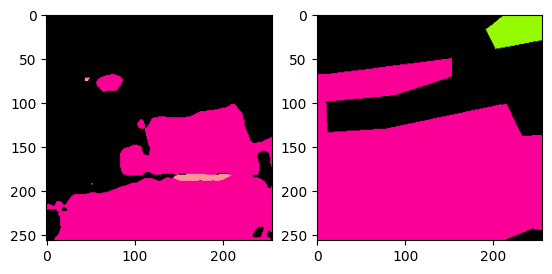

[2023-05-30 22:51:24 swanet_v5](182747771.py 311): INFO Test: [32/728]	Loss 1.4964 (0.3858)	PA@1 75.2838 (91.5985)	MPA@1 53.3643 (83.5088)	KAPPA@1 54.4358 (81.0879)	MIOU@1 31.1172 (72.5605)	FWIOU@1 61.4937 (86.7982)	Mem 44806MB


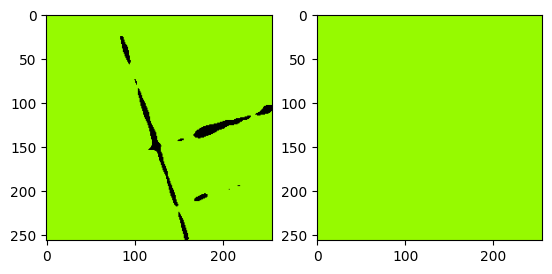

[2023-05-30 22:51:24 swanet_v5](182747771.py 311): INFO Test: [33/728]	Loss 0.0585 (0.3762)	PA@1 97.3282 (91.7670)	MPA@1 50.0000 (82.5233)	KAPPA@1 0.0000 (78.7029)	MIOU@1 48.6641 (71.8577)	FWIOU@1 94.7278 (87.0314)	Mem 44806MB


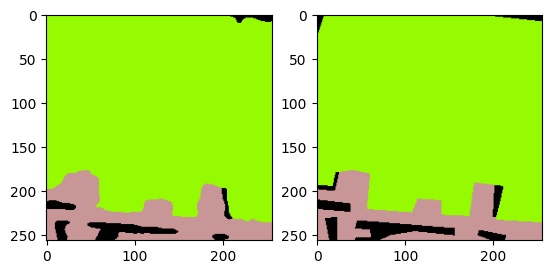

[2023-05-30 22:51:25 swanet_v5](182747771.py 311): INFO Test: [34/728]	Loss 0.0693 (0.3674)	PA@1 97.2473 (91.9236)	MPA@1 92.2380 (82.8008)	KAPPA@1 90.9596 (79.0531)	MIOU@1 80.9628 (72.1178)	FWIOU@1 95.2842 (87.2672)	Mem 44806MB


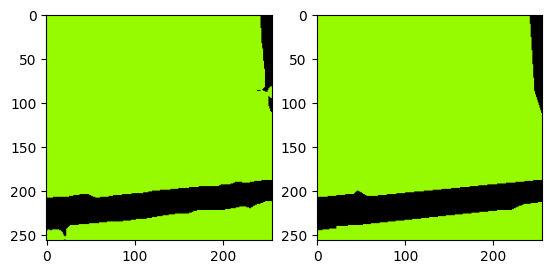

[2023-05-30 22:51:25 swanet_v5](182747771.py 311): INFO Test: [35/728]	Loss 0.0324 (0.3581)	PA@1 98.7259 (92.1125)	MPA@1 98.7682 (83.2444)	KAPPA@1 94.5809 (79.4844)	MIOU@1 94.7947 (72.7478)	FWIOU@1 97.5542 (87.5530)	Mem 44806MB


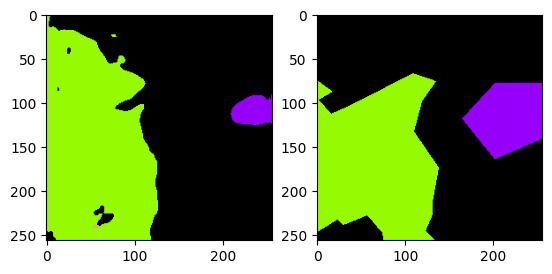

[2023-05-30 22:51:25 swanet_v5](182747771.py 311): INFO Test: [36/728]	Loss 1.1435 (0.3793)	PA@1 79.0405 (91.7592)	MPA@1 63.6214 (82.7140)	KAPPA@1 59.3825 (78.9411)	MIOU@1 39.6789 (71.8540)	FWIOU@1 67.6342 (87.0146)	Mem 44806MB


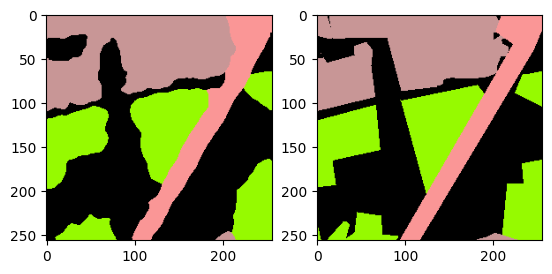

[2023-05-30 22:51:25 swanet_v5](182747771.py 311): INFO Test: [37/728]	Loss 0.1420 (0.3731)	PA@1 94.5755 (91.8333)	MPA@1 93.8092 (83.0060)	KAPPA@1 92.2895 (79.2924)	MIOU@1 89.4809 (72.3179)	FWIOU@1 89.7353 (87.0862)	Mem 44806MB


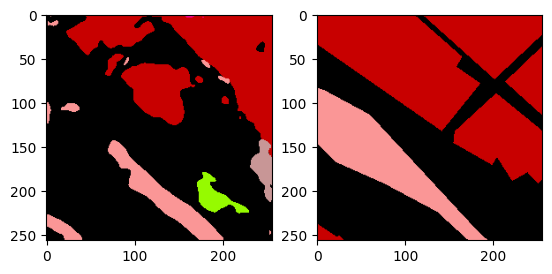

[2023-05-30 22:51:25 swanet_v5](182747771.py 311): INFO Test: [38/728]	Loss 1.3542 (0.3982)	PA@1 65.1733 (91.1497)	MPA@1 36.6716 (81.8179)	KAPPA@1 41.6242 (78.3266)	MIOU@1 22.1183 (71.0307)	FWIOU@1 49.4841 (86.1221)	Mem 44806MB


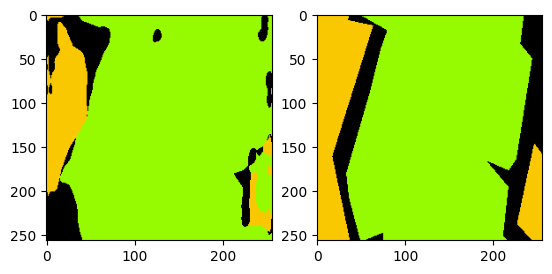

[2023-05-30 22:51:26 swanet_v5](182747771.py 311): INFO Test: [39/728]	Loss 0.6339 (0.4041)	PA@1 80.6061 (90.8862)	MPA@1 69.0003 (81.4975)	KAPPA@1 54.4992 (77.7309)	MIOU@1 50.0269 (70.5056)	FWIOU@1 74.5781 (85.8335)	Mem 44806MB


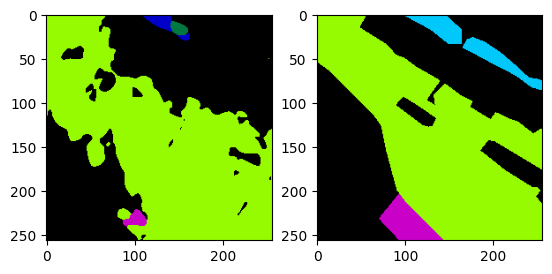

[2023-05-30 22:51:26 swanet_v5](182747771.py 311): INFO Test: [40/728]	Loss 0.7755 (0.4132)	PA@1 78.5919 (90.5863)	MPA@1 51.7593 (80.7722)	KAPPA@1 60.3947 (77.3081)	MIOU@1 25.7588 (69.4142)	FWIOU@1 67.8847 (85.3957)	Mem 44806MB


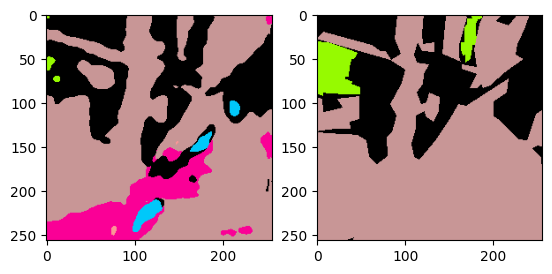

[2023-05-30 22:51:26 swanet_v5](182747771.py 311): INFO Test: [41/728]	Loss 0.9545 (0.4261)	PA@1 70.3964 (90.1056)	MPA@1 41.3943 (79.8346)	KAPPA@1 44.4300 (76.5252)	MIOU@1 21.1258 (68.2645)	FWIOU@1 54.3504 (84.6565)	Mem 44806MB


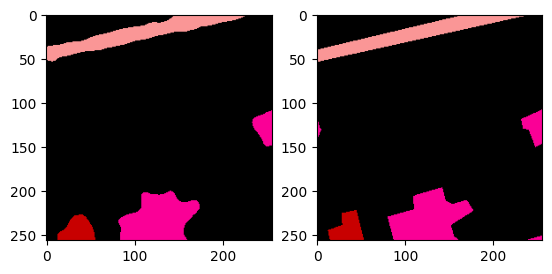

[2023-05-30 22:51:26 swanet_v5](182747771.py 311): INFO Test: [42/728]	Loss 0.0550 (0.4174)	PA@1 97.9202 (90.2873)	MPA@1 93.2907 (80.1475)	KAPPA@1 91.0926 (76.8640)	MIOU@1 86.9576 (68.6992)	FWIOU@1 96.0284 (84.9210)	Mem 44806MB


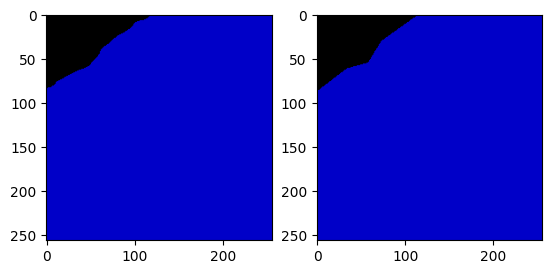

[2023-05-30 22:51:26 swanet_v5](182747771.py 311): INFO Test: [43/728]	Loss 0.0094 (0.4082)	PA@1 99.6429 (90.4999)	MPA@1 98.7467 (80.5702)	KAPPA@1 97.5617 (77.3344)	MIOU@1 97.6113 (69.3563)	FWIOU@1 99.2942 (85.2476)	Mem 44806MB


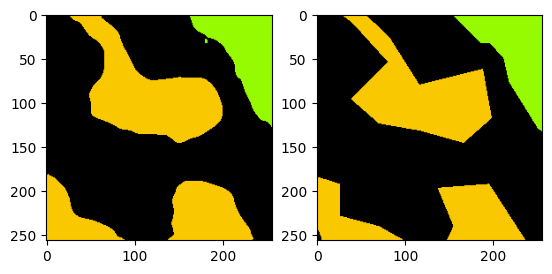

[2023-05-30 22:51:27 swanet_v5](182747771.py 311): INFO Test: [44/728]	Loss 0.1062 (0.4014)	PA@1 95.4987 (90.6110)	MPA@1 95.5874 (80.9040)	KAPPA@1 91.2920 (77.6446)	MIOU@1 91.4129 (69.8465)	FWIOU@1 91.3795 (85.3839)	Mem 44806MB


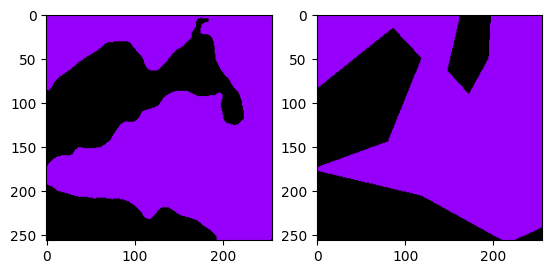

[2023-05-30 22:51:27 swanet_v5](182747771.py 311): INFO Test: [45/728]	Loss 0.3400 (0.4001)	PA@1 86.7371 (90.5268)	MPA@1 85.9118 (81.0128)	KAPPA@1 71.4226 (77.5093)	MIOU@1 75.1902 (69.9626)	FWIOU@1 76.8195 (85.1977)	Mem 44806MB


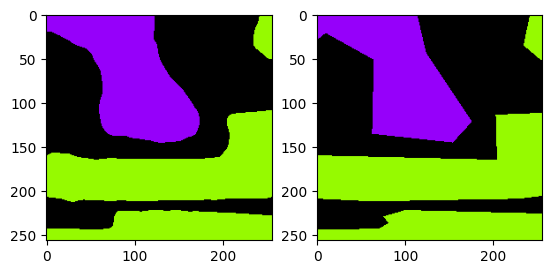

[2023-05-30 22:51:27 swanet_v5](182747771.py 311): INFO Test: [46/728]	Loss 0.0743 (0.3932)	PA@1 97.1390 (90.6675)	MPA@1 96.7749 (81.3482)	KAPPA@1 95.5078 (77.8923)	MIOU@1 94.4194 (70.4830)	FWIOU@1 94.4406 (85.3944)	Mem 44806MB


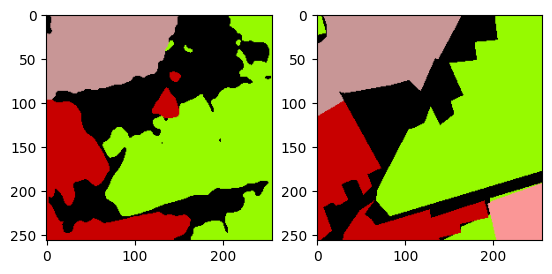

[2023-05-30 22:51:27 swanet_v5](182747771.py 311): INFO Test: [47/728]	Loss 0.9574 (0.4049)	PA@1 78.2547 (90.4089)	MPA@1 80.9590 (81.3401)	KAPPA@1 70.3141 (77.7344)	MIOU@1 56.1811 (70.1850)	FWIOU@1 67.0424 (85.0121)	Mem 44806MB


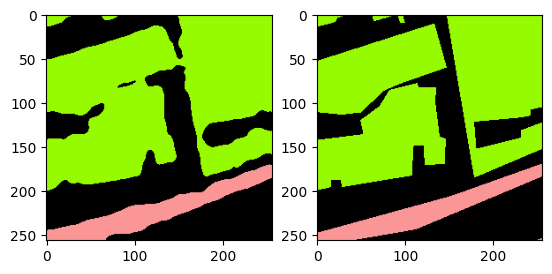

[2023-05-30 22:51:27 swanet_v5](182747771.py 311): INFO Test: [48/728]	Loss 0.1056 (0.3988)	PA@1 95.8099 (90.5191)	MPA@1 94.8262 (81.6153)	KAPPA@1 92.5454 (78.0367)	MIOU@1 68.4046 (70.1487)	FWIOU@1 92.0064 (85.1548)	Mem 44806MB


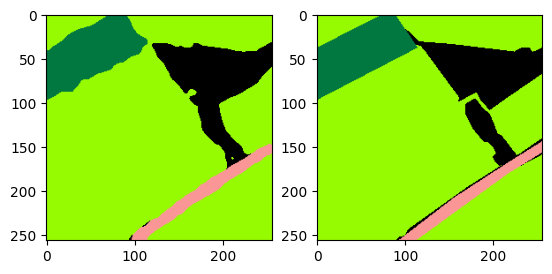

[2023-05-30 22:51:28 swanet_v5](182747771.py 311): INFO Test: [49/728]	Loss 0.0823 (0.3925)	PA@1 96.8964 (90.6467)	MPA@1 94.2583 (81.8682)	KAPPA@1 92.4990 (78.3259)	MIOU@1 89.8905 (70.5435)	FWIOU@1 94.1252 (85.3342)	Mem 44806MB


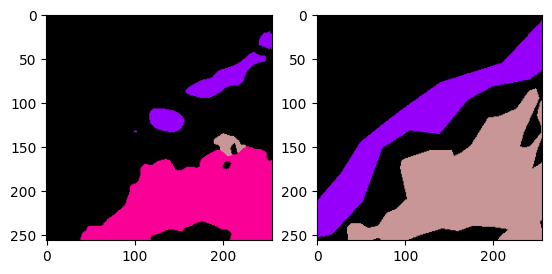

[2023-05-30 22:51:28 swanet_v5](182747771.py 311): INFO Test: [50/728]	Loss 2.1536 (0.4270)	PA@1 57.6126 (89.9989)	MPA@1 65.7703 (81.5525)	KAPPA@1 28.9142 (77.3570)	MIOU@1 24.1054 (69.6330)	FWIOU@1 53.1769 (84.7037)	Mem 44806MB


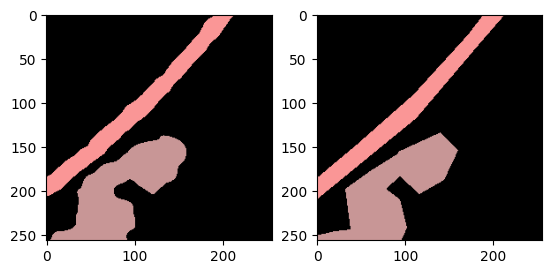

[2023-05-30 22:51:28 swanet_v5](182747771.py 311): INFO Test: [51/728]	Loss 0.0486 (0.4197)	PA@1 98.0026 (90.1529)	MPA@1 96.1386 (81.8330)	KAPPA@1 94.2379 (77.6817)	MIOU@1 93.0169 (70.0827)	FWIOU@1 96.1183 (84.9232)	Mem 44806MB


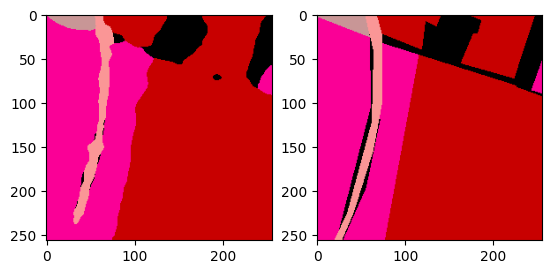

[2023-05-30 22:51:28 swanet_v5](182747771.py 311): INFO Test: [52/728]	Loss 0.1340 (0.4144)	PA@1 94.3710 (90.2324)	MPA@1 89.9914 (81.9870)	KAPPA@1 90.3960 (77.9216)	MIOU@1 78.4099 (70.2398)	FWIOU@1 90.4569 (85.0276)	Mem 44806MB


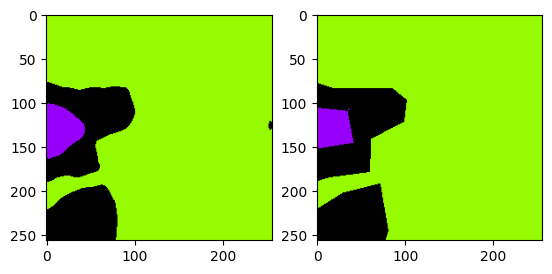

[2023-05-30 22:51:28 swanet_v5](182747771.py 311): INFO Test: [53/728]	Loss 0.0427 (0.4075)	PA@1 98.2849 (90.3816)	MPA@1 91.0850 (82.1554)	KAPPA@1 94.4604 (78.2278)	MIOU@1 88.0117 (70.5689)	FWIOU@1 96.7036 (85.2438)	Mem 44806MB


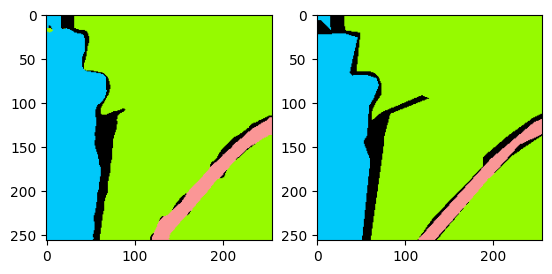

[2023-05-30 22:51:29 swanet_v5](182747771.py 311): INFO Test: [54/728]	Loss 0.0738 (0.4014)	PA@1 96.9711 (90.5014)	MPA@1 92.4408 (82.3424)	KAPPA@1 93.5178 (78.5058)	MIOU@1 84.3815 (70.8200)	FWIOU@1 94.9472 (85.4202)	Mem 44806MB


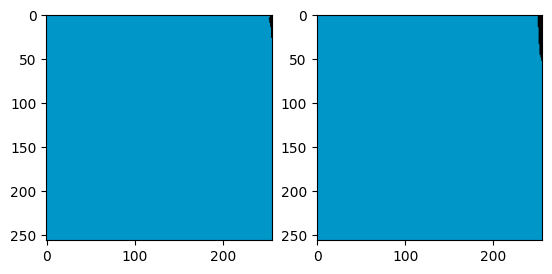

[2023-05-30 22:51:29 swanet_v5](182747771.py 311): INFO Test: [55/728]	Loss 0.0085 (0.3944)	PA@1 99.6887 (90.6654)	MPA@1 99.8442 (82.6550)	KAPPA@1 32.8093 (77.6898)	MIOU@1 59.6868 (70.6212)	FWIOU@1 99.6274 (85.6739)	Mem 44806MB


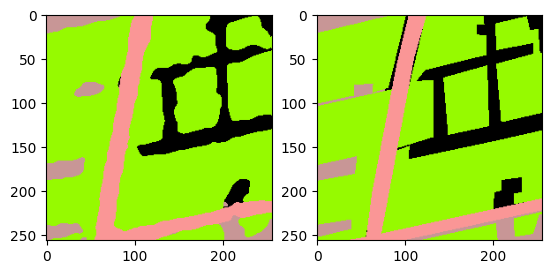

[2023-05-30 22:51:29 swanet_v5](182747771.py 311): INFO Test: [56/728]	Loss 0.1577 (0.3902)	PA@1 94.0140 (90.7242)	MPA@1 89.7786 (82.7800)	KAPPA@1 87.4708 (77.8614)	MIOU@1 81.4703 (70.8116)	FWIOU@1 89.0544 (85.7332)	Mem 44806MB


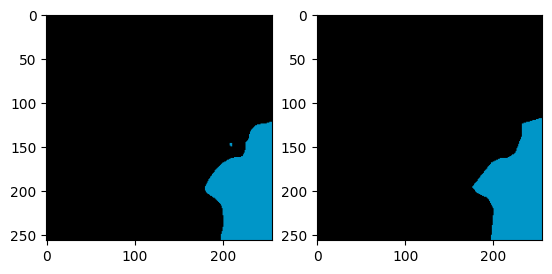

[2023-05-30 22:51:29 swanet_v5](182747771.py 311): INFO Test: [57/728]	Loss 0.0146 (0.3838)	PA@1 99.5300 (90.8760)	MPA@1 99.3504 (83.0656)	KAPPA@1 97.5176 (78.2003)	MIOU@1 97.5664 (71.2729)	FWIOU@1 99.0770 (85.9633)	Mem 44806MB


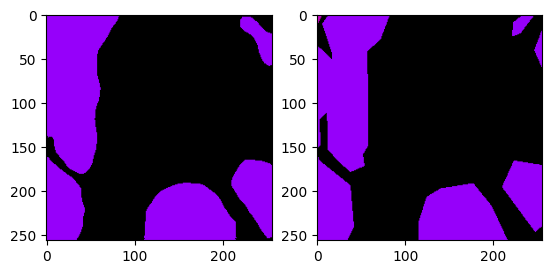

[2023-05-30 22:51:30 swanet_v5](182747771.py 311): INFO Test: [58/728]	Loss 0.1006 (0.3790)	PA@1 95.7687 (90.9589)	MPA@1 94.2030 (83.2544)	KAPPA@1 90.4037 (78.4072)	MIOU@1 60.6136 (71.0922)	FWIOU@1 91.8851 (86.0637)	Mem 44806MB


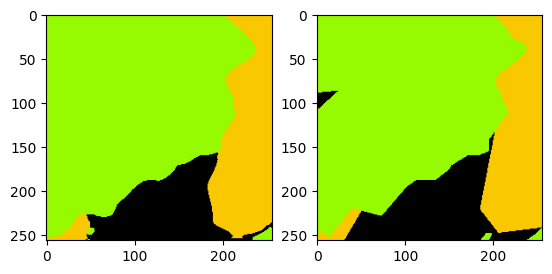

[2023-05-30 22:51:30 swanet_v5](182747771.py 311): INFO Test: [59/728]	Loss 0.0811 (0.3740)	PA@1 97.0490 (91.0604)	MPA@1 96.6069 (83.4770)	KAPPA@1 94.2891 (78.6719)	MIOU@1 91.5225 (71.4327)	FWIOU@1 94.4326 (86.2032)	Mem 44806MB


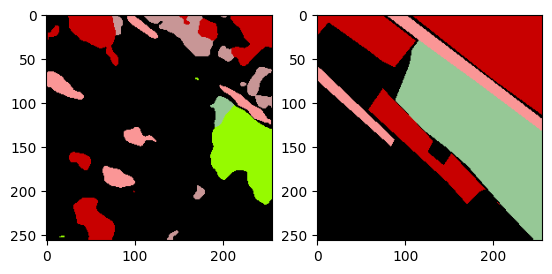

[2023-05-30 22:51:30 swanet_v5](182747771.py 311): INFO Test: [60/728]	Loss 2.1474 (0.4031)	PA@1 48.5291 (90.3632)	MPA@1 45.7879 (82.8591)	KAPPA@1 20.8192 (77.7234)	MIOU@1 17.1723 (70.5432)	FWIOU@1 40.4430 (85.4530)	Mem 44806MB


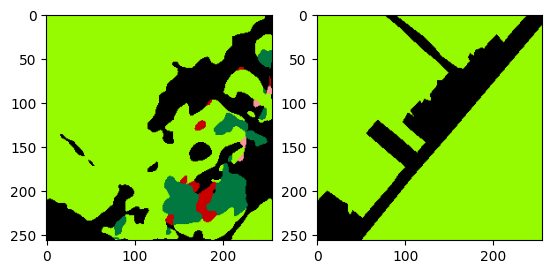

[2023-05-30 22:51:30 swanet_v5](182747771.py 311): INFO Test: [61/728]	Loss 0.9426 (0.4118)	PA@1 69.9005 (90.0332)	MPA@1 26.9564 (81.9574)	KAPPA@1 27.3774 (76.9114)	MIOU@1 20.1871 (69.7310)	FWIOU@1 52.7847 (84.9261)	Mem 44806MB


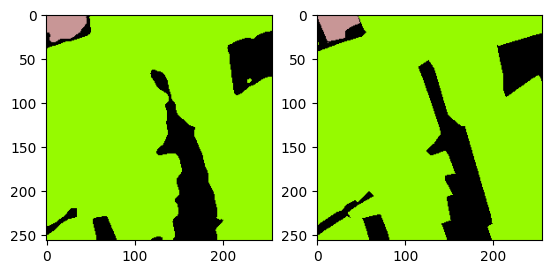

[2023-05-30 22:51:31 swanet_v5](182747771.py 311): INFO Test: [62/728]	Loss 0.0730 (0.4064)	PA@1 97.0139 (90.1440)	MPA@1 92.2070 (82.1201)	KAPPA@1 89.7723 (77.1156)	MIOU@1 86.8054 (70.0020)	FWIOU@1 94.4562 (85.0774)	Mem 44806MB


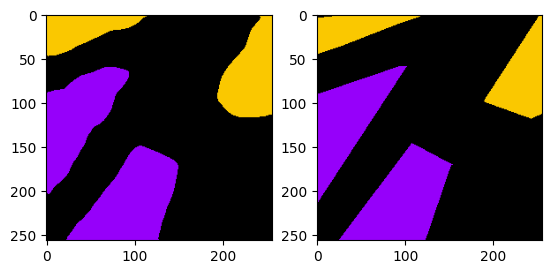

[2023-05-30 22:51:31 swanet_v5](182747771.py 311): INFO Test: [63/728]	Loss 0.0880 (0.4014)	PA@1 96.4706 (90.2428)	MPA@1 93.1393 (82.2923)	KAPPA@1 92.8937 (77.3621)	MIOU@1 90.8646 (70.3280)	FWIOU@1 93.1437 (85.2034)	Mem 44806MB


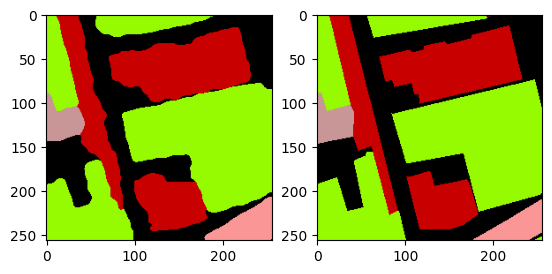

[2023-05-30 22:51:31 swanet_v5](182747771.py 311): INFO Test: [64/728]	Loss 0.1401 (0.3974)	PA@1 94.4733 (90.3079)	MPA@1 93.4599 (82.4641)	KAPPA@1 91.9647 (77.5868)	MIOU@1 88.8013 (70.6122)	FWIOU@1 89.6634 (85.2720)	Mem 44806MB


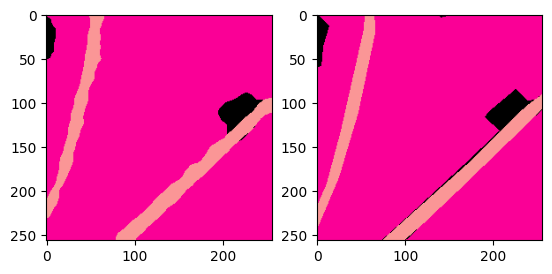

[2023-05-30 22:51:31 swanet_v5](182747771.py 311): INFO Test: [65/728]	Loss 0.0721 (0.3925)	PA@1 97.3694 (90.4149)	MPA@1 92.5660 (82.6172)	KAPPA@1 88.5646 (77.7531)	MIOU@1 82.2720 (70.7889)	FWIOU@1 95.1813 (85.4221)	Mem 44806MB


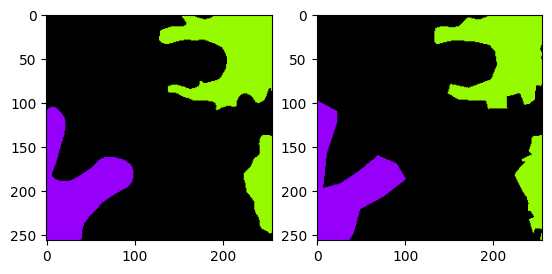

[2023-05-30 22:51:32 swanet_v5](182747771.py 311): INFO Test: [66/728]	Loss 0.0649 (0.3876)	PA@1 97.3465 (90.5183)	MPA@1 94.7241 (82.7979)	KAPPA@1 93.5250 (77.9885)	MIOU@1 92.2481 (71.1091)	FWIOU@1 94.8314 (85.5626)	Mem 44806MB


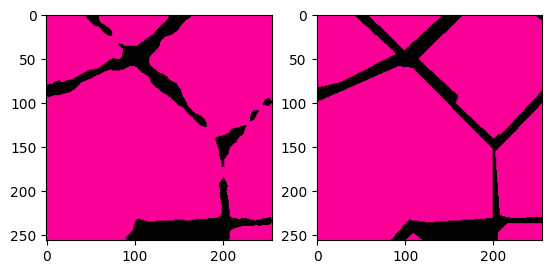

[2023-05-30 22:51:32 swanet_v5](182747771.py 311): INFO Test: [67/728]	Loss 0.0883 (0.3832)	PA@1 96.1746 (90.6015)	MPA@1 92.4400 (82.9397)	KAPPA@1 82.8515 (78.0600)	MIOU@1 84.8427 (71.3111)	FWIOU@1 93.0062 (85.6720)	Mem 44806MB


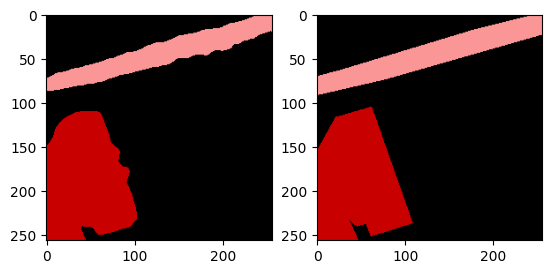

[2023-05-30 22:51:32 swanet_v5](182747771.py 311): INFO Test: [68/728]	Loss 0.0483 (0.3783)	PA@1 98.1293 (90.7106)	MPA@1 98.0851 (83.1592)	KAPPA@1 95.6832 (78.3154)	MIOU@1 94.2215 (71.6431)	FWIOU@1 96.3841 (85.8273)	Mem 44806MB


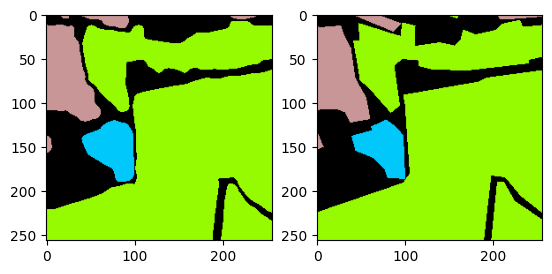

[2023-05-30 22:51:32 swanet_v5](182747771.py 311): INFO Test: [69/728]	Loss 0.1026 (0.3744)	PA@1 95.9671 (90.7857)	MPA@1 93.4405 (83.3061)	KAPPA@1 92.3512 (78.5159)	MIOU@1 89.3351 (71.8959)	FWIOU@1 92.4486 (85.9219)	Mem 44806MB


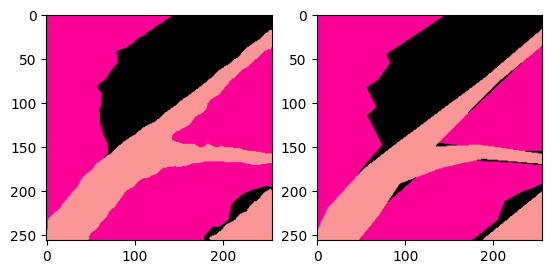

[2023-05-30 22:51:33 swanet_v5](182747771.py 311): INFO Test: [70/728]	Loss 0.0851 (0.3703)	PA@1 96.8536 (90.8712)	MPA@1 96.1290 (83.4867)	KAPPA@1 94.8609 (78.7461)	MIOU@1 92.8692 (72.1913)	FWIOU@1 93.9260 (86.0346)	Mem 44806MB


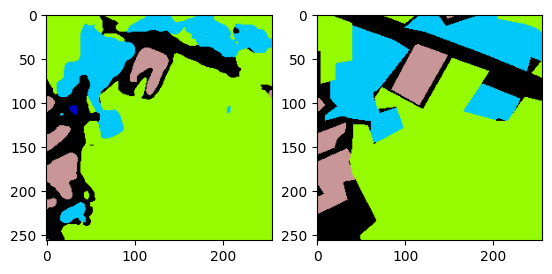

[2023-05-30 22:51:33 swanet_v5](182747771.py 311): INFO Test: [71/728]	Loss 0.6470 (0.3742)	PA@1 80.1819 (90.7227)	MPA@1 65.7758 (83.2407)	KAPPA@1 65.6895 (78.5648)	MIOU@1 47.0265 (71.8418)	FWIOU@1 70.2740 (85.8157)	Mem 44806MB


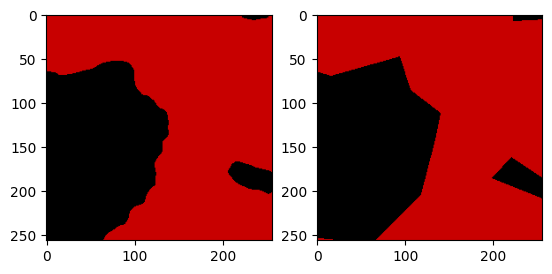

[2023-05-30 22:51:33 swanet_v5](182747771.py 311): INFO Test: [72/728]	Loss 0.0374 (0.3695)	PA@1 98.4909 (90.8291)	MPA@1 98.5638 (83.4506)	KAPPA@1 96.7449 (78.8138)	MIOU@1 96.8005 (72.1837)	FWIOU@1 97.0357 (85.9694)	Mem 44806MB


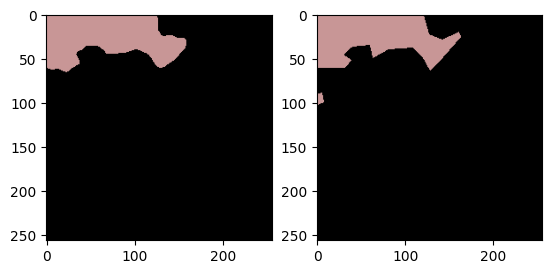

[2023-05-30 22:51:33 swanet_v5](182747771.py 311): INFO Test: [73/728]	Loss 0.0279 (0.3649)	PA@1 98.9059 (90.9383)	MPA@1 96.2834 (83.6240)	KAPPA@1 94.1705 (79.0213)	MIOU@1 94.4328 (72.4843)	FWIOU@1 97.8548 (86.1300)	Mem 44806MB


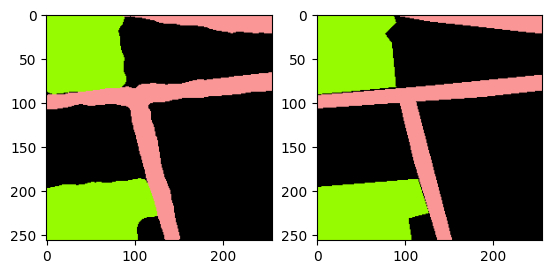

[2023-05-30 22:51:34 swanet_v5](182747771.py 311): INFO Test: [74/728]	Loss 0.0568 (0.3608)	PA@1 97.6730 (91.0281)	MPA@1 95.8872 (83.7875)	KAPPA@1 95.7052 (79.2438)	MIOU@1 94.2661 (72.7748)	FWIOU@1 95.4405 (86.2542)	Mem 44806MB


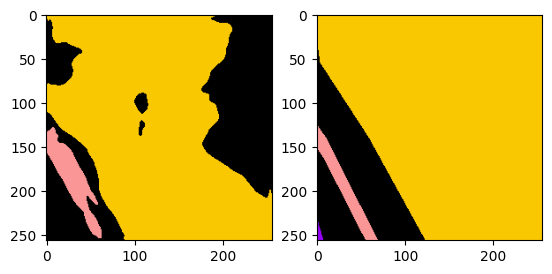

[2023-05-30 22:51:34 swanet_v5](182747771.py 311): INFO Test: [75/728]	Loss 1.1734 (0.3715)	PA@1 69.6091 (90.7462)	MPA@1 59.9745 (83.4742)	KAPPA@1 26.8409 (78.5543)	MIOU@1 36.9847 (72.3038)	FWIOU@1 53.4275 (85.8222)	Mem 44806MB


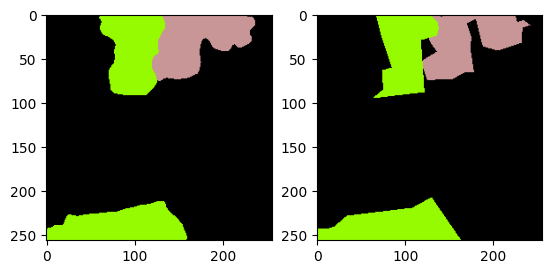

[2023-05-30 22:51:34 swanet_v5](182747771.py 311): INFO Test: [76/728]	Loss 0.0650 (0.3675)	PA@1 97.3587 (90.8321)	MPA@1 93.5006 (83.6044)	KAPPA@1 92.9577 (78.7413)	MIOU@1 91.1728 (72.5489)	FWIOU@1 94.8511 (85.9395)	Mem 44806MB


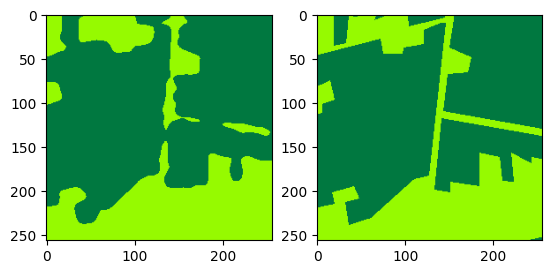

[2023-05-30 22:51:34 swanet_v5](182747771.py 311): INFO Test: [77/728]	Loss 0.0942 (0.3640)	PA@1 96.0098 (90.8985)	MPA@1 95.8172 (83.7610)	KAPPA@1 91.2301 (78.9015)	MIOU@1 91.6286 (72.7935)	FWIOU@1 92.3695 (86.0219)	Mem 44806MB


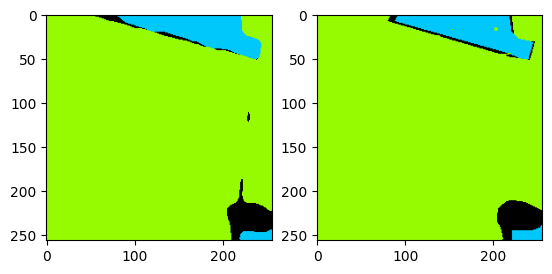

[2023-05-30 22:51:35 swanet_v5](182747771.py 311): INFO Test: [78/728]	Loss 0.0358 (0.3599)	PA@1 98.6084 (90.9961)	MPA@1 91.3814 (83.8574)	KAPPA@1 92.5538 (79.0743)	MIOU@1 86.0517 (72.9613)	FWIOU@1 97.4416 (86.1665)	Mem 44806MB


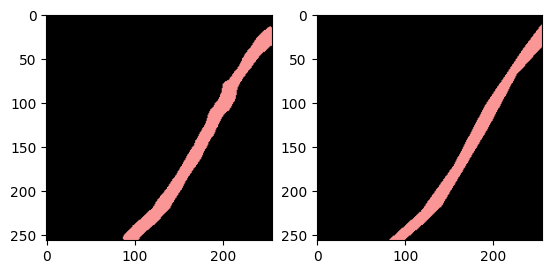

[2023-05-30 22:51:35 swanet_v5](182747771.py 311): INFO Test: [79/728]	Loss 0.0254 (0.3557)	PA@1 98.9655 (91.0957)	MPA@1 93.5828 (83.9790)	KAPPA@1 91.1572 (79.2253)	MIOU@1 91.7938 (73.1967)	FWIOU@1 97.9720 (86.3141)	Mem 44806MB


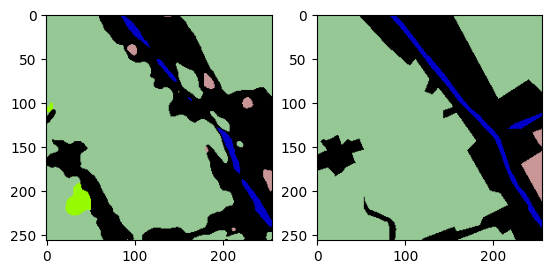

[2023-05-30 22:51:35 swanet_v5](182747771.py 311): INFO Test: [80/728]	Loss 0.4155 (0.3564)	PA@1 86.6135 (91.0404)	MPA@1 56.0219 (83.6338)	KAPPA@1 72.1368 (79.1378)	MIOU@1 42.5301 (72.8181)	FWIOU@1 77.4904 (86.2051)	Mem 44806MB


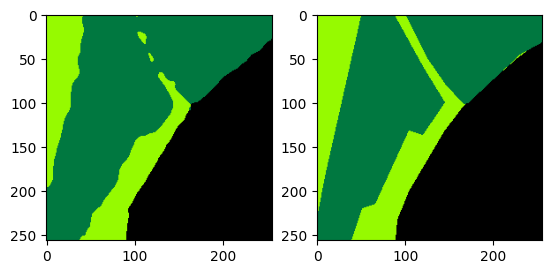

[2023-05-30 22:51:35 swanet_v5](182747771.py 311): INFO Test: [81/728]	Loss 0.0787 (0.3530)	PA@1 96.4798 (91.1067)	MPA@1 96.8855 (83.7954)	KAPPA@1 94.3837 (79.3237)	MIOU@1 91.5291 (73.0463)	FWIOU@1 93.4774 (86.2938)	Mem 44806MB


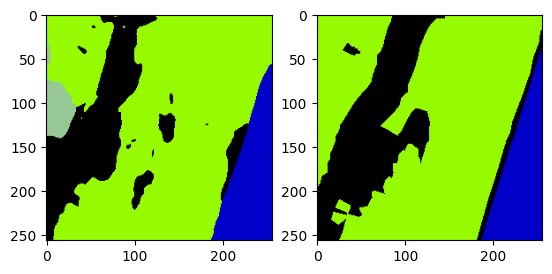

[2023-05-30 22:51:36 swanet_v5](182747771.py 311): INFO Test: [82/728]	Loss 0.4896 (0.3547)	PA@1 84.2743 (91.0244)	MPA@1 53.1846 (83.4266)	KAPPA@1 69.7778 (79.2087)	MIOU@1 45.8781 (72.7190)	FWIOU@1 73.7054 (86.1421)	Mem 44806MB


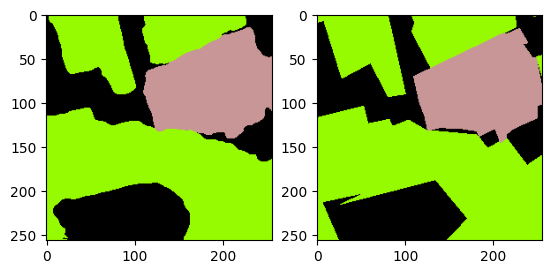

[2023-05-30 22:51:36 swanet_v5](182747771.py 311): INFO Test: [83/728]	Loss 0.1071 (0.3517)	PA@1 95.8862 (91.0823)	MPA@1 95.4005 (83.5692)	KAPPA@1 93.2594 (79.3760)	MIOU@1 91.9560 (72.9480)	FWIOU@1 92.1433 (86.2136)	Mem 44806MB


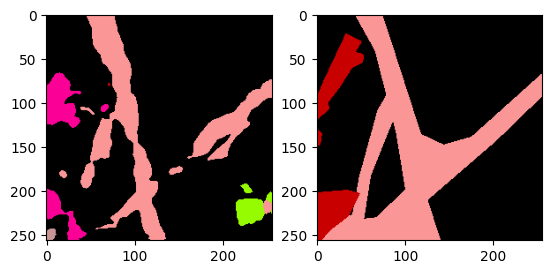

[2023-05-30 22:51:36 swanet_v5](182747771.py 311): INFO Test: [84/728]	Loss 1.2111 (0.3618)	PA@1 77.1133 (90.9179)	MPA@1 27.6142 (82.9109)	KAPPA@1 45.0920 (78.9726)	MIOU@1 20.7411 (72.3338)	FWIOU@1 67.3377 (85.9915)	Mem 44806MB


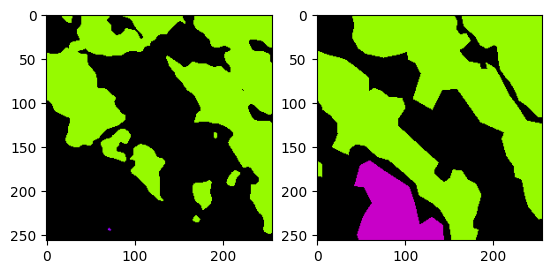

[2023-05-30 22:51:36 swanet_v5](182747771.py 311): INFO Test: [85/728]	Loss 1.0915 (0.3703)	PA@1 74.7528 (90.7300)	MPA@1 51.8734 (82.5500)	KAPPA@1 54.1668 (78.6842)	MIOU@1 32.0236 (71.8651)	FWIOU@1 63.2049 (85.7266)	Mem 44806MB


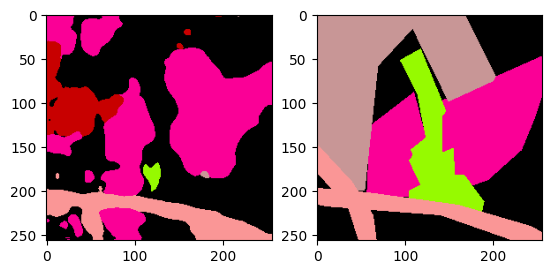

[2023-05-30 22:51:37 swanet_v5](182747771.py 311): INFO Test: [86/728]	Loss 2.7471 (0.3977)	PA@1 50.4166 (90.2666)	MPA@1 47.8527 (82.1512)	KAPPA@1 35.8832 (78.1922)	MIOU@1 27.6391 (71.3567)	FWIOU@1 44.0397 (85.2474)	Mem 44806MB


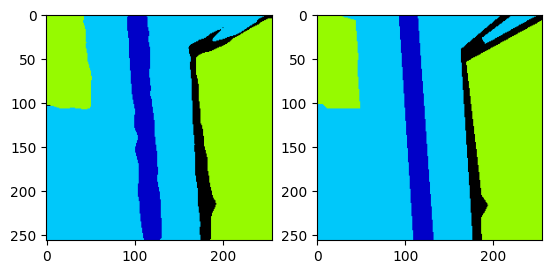

[2023-05-30 22:51:37 swanet_v5](182747771.py 311): INFO Test: [87/728]	Loss 0.0641 (0.3939)	PA@1 97.3221 (90.3468)	MPA@1 94.7574 (82.2944)	KAPPA@1 95.5556 (78.3895)	MIOU@1 89.7662 (71.5659)	FWIOU@1 94.9792 (85.3580)	Mem 44806MB


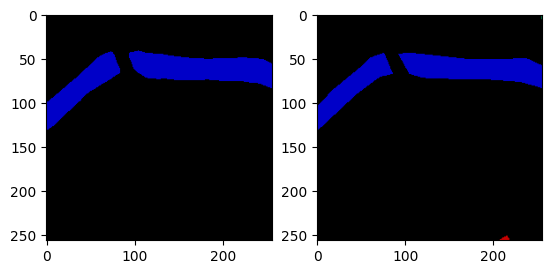

[2023-05-30 22:51:37 swanet_v5](182747771.py 311): INFO Test: [88/728]	Loss 0.0238 (0.3897)	PA@1 99.0707 (90.4448)	MPA@1 96.0514 (82.4490)	KAPPA@1 94.8305 (78.5743)	MIOU@1 47.6897 (71.2977)	FWIOU@1 98.2318 (85.5026)	Mem 44806MB


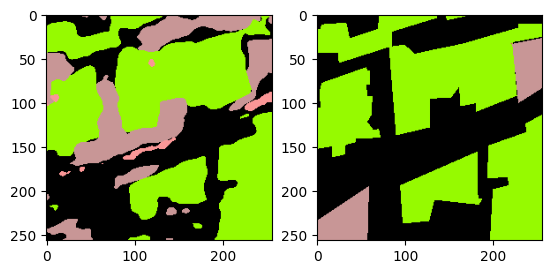

[2023-05-30 22:51:37 swanet_v5](182747771.py 311): INFO Test: [89/728]	Loss 0.6856 (0.3930)	PA@1 75.1678 (90.2750)	MPA@1 48.5944 (82.0728)	KAPPA@1 59.3553 (78.3607)	MIOU@1 31.3320 (70.8536)	FWIOU@1 61.9240 (85.2407)	Mem 44806MB


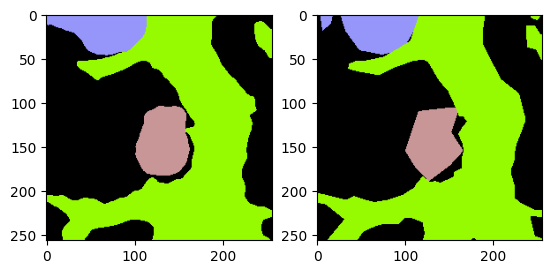

[2023-05-30 22:51:38 swanet_v5](182747771.py 311): INFO Test: [90/728]	Loss 0.0997 (0.3898)	PA@1 96.0785 (90.3388)	MPA@1 92.7999 (82.1907)	KAPPA@1 93.4284 (78.5263)	MIOU@1 90.1603 (71.0658)	FWIOU@1 92.4522 (85.3199)	Mem 44806MB


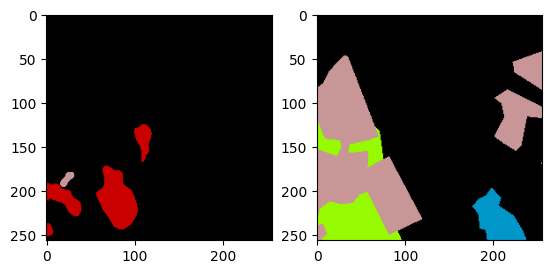

[2023-05-30 22:51:38 swanet_v5](182747771.py 311): INFO Test: [91/728]	Loss 2.8951 (0.4170)	PA@1 68.3044 (90.0993)	MPA@1 57.3438 (81.9206)	KAPPA@1 9.1916 (77.7727)	MIOU@1 14.5075 (70.4510)	FWIOU@1 67.5342 (85.1266)	Mem 44806MB


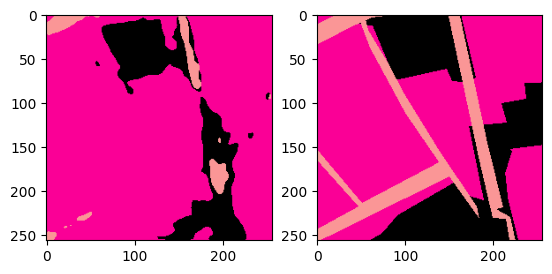

[2023-05-30 22:51:38 swanet_v5](182747771.py 311): INFO Test: [92/728]	Loss 1.2426 (0.4259)	PA@1 74.7131 (89.9339)	MPA@1 80.3565 (81.9038)	KAPPA@1 46.0881 (77.4320)	MIOU@1 45.3205 (70.1808)	FWIOU@1 66.2820 (84.9239)	Mem 44806MB


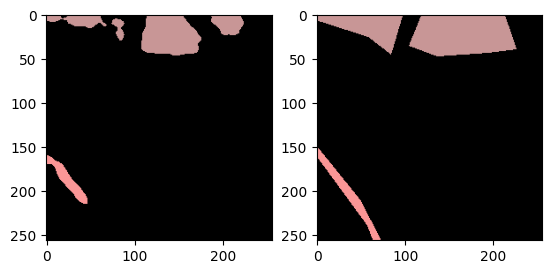

[2023-05-30 22:51:38 swanet_v5](182747771.py 311): INFO Test: [93/728]	Loss 0.1699 (0.4232)	PA@1 94.0964 (89.9782)	MPA@1 91.6657 (82.0077)	KAPPA@1 67.4404 (77.3257)	MIOU@1 66.1194 (70.1376)	FWIOU@1 90.7294 (84.9857)	Mem 44806MB


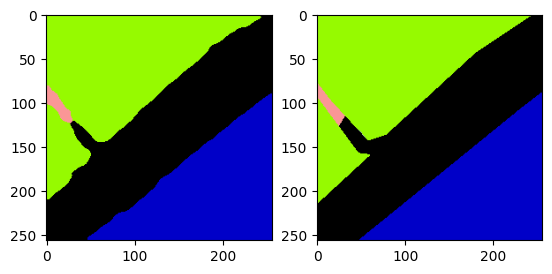

[2023-05-30 22:51:39 swanet_v5](182747771.py 311): INFO Test: [94/728]	Loss 0.0471 (0.4192)	PA@1 98.4207 (90.0670)	MPA@1 95.5812 (82.1506)	KAPPA@1 97.6295 (77.5394)	MIOU@1 74.3993 (70.1824)	FWIOU@1 96.9141 (85.1113)	Mem 44806MB


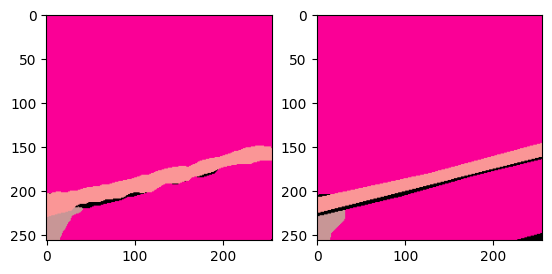

[2023-05-30 22:51:39 swanet_v5](182747771.py 311): INFO Test: [95/728]	Loss 0.0575 (0.4154)	PA@1 97.7402 (90.1470)	MPA@1 83.0411 (82.1598)	KAPPA@1 86.0861 (77.6284)	MIOU@1 70.0454 (70.1810)	FWIOU@1 96.6066 (85.2310)	Mem 44806MB


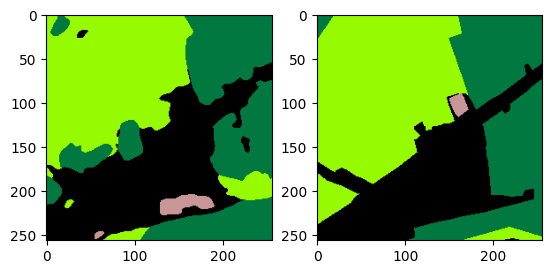

[2023-05-30 22:51:39 swanet_v5](182747771.py 311): INFO Test: [96/728]	Loss 0.6106 (0.4174)	PA@1 82.1960 (90.0650)	MPA@1 62.4062 (81.9562)	KAPPA@1 73.4253 (77.5851)	MIOU@1 53.3634 (70.0076)	FWIOU@1 70.0104 (85.0741)	Mem 44806MB


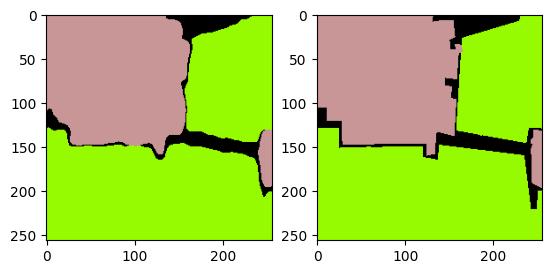

[2023-05-30 22:51:39 swanet_v5](182747771.py 311): INFO Test: [97/728]	Loss 0.0661 (0.4139)	PA@1 97.4136 (90.1400)	MPA@1 95.3870 (82.0932)	KAPPA@1 95.1917 (77.7648)	MIOU@1 88.0126 (70.1913)	FWIOU@1 95.4389 (85.1799)	Mem 44806MB


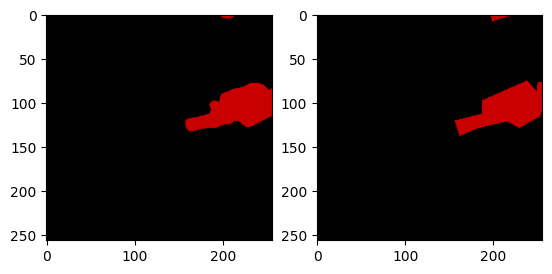

[2023-05-30 22:51:39 swanet_v5](182747771.py 311): INFO Test: [98/728]	Loss 0.0145 (0.4098)	PA@1 99.4064 (90.2336)	MPA@1 97.4624 (82.2485)	KAPPA@1 93.6875 (77.9256)	MIOU@1 94.0281 (70.4321)	FWIOU@1 98.8556 (85.3180)	Mem 44806MB


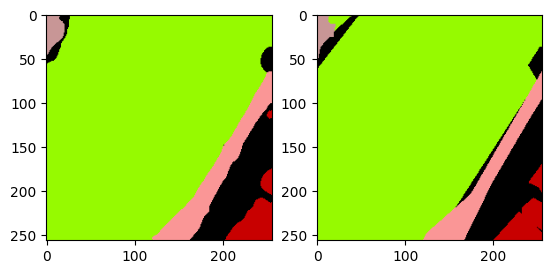

[2023-05-30 22:51:40 swanet_v5](182747771.py 311): INFO Test: [99/728]	Loss 0.0680 (0.4064)	PA@1 97.4182 (90.3054)	MPA@1 91.6973 (82.3430)	KAPPA@1 92.7238 (78.0736)	MIOU@1 87.0675 (70.5985)	FWIOU@1 95.2542 (85.4174)	Mem 44806MB


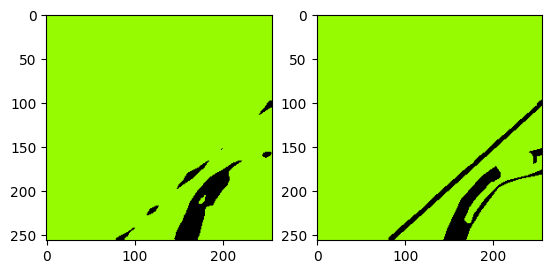

[2023-05-30 22:51:40 swanet_v5](182747771.py 311): INFO Test: [100/728]	Loss 0.0599 (0.4030)	PA@1 96.8994 (90.3707)	MPA@1 86.1540 (82.3807)	KAPPA@1 63.2872 (77.9272)	MIOU@1 72.4127 (70.6164)	FWIOU@1 94.9326 (85.5116)	Mem 44806MB


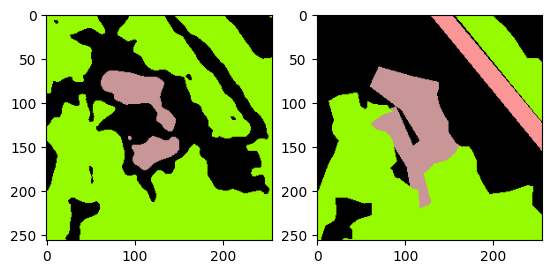

[2023-05-30 22:51:40 swanet_v5](182747771.py 311): INFO Test: [101/728]	Loss 1.2577 (0.4114)	PA@1 67.0609 (90.1422)	MPA@1 76.7083 (82.3251)	KAPPA@1 45.7019 (77.6112)	MIOU@1 38.7856 (70.3044)	FWIOU@1 54.6769 (85.2093)	Mem 44806MB


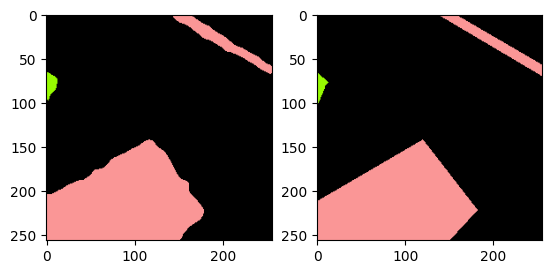

[2023-05-30 22:51:40 swanet_v5](182747771.py 311): INFO Test: [102/728]	Loss 0.0322 (0.4077)	PA@1 98.6603 (90.2249)	MPA@1 91.5982 (82.4151)	KAPPA@1 96.2802 (77.7925)	MIOU@1 89.5223 (70.4910)	FWIOU@1 97.3612 (85.3273)	Mem 44806MB


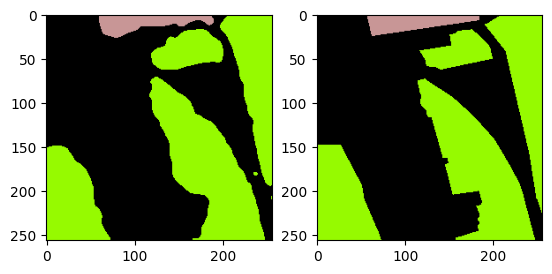

[2023-05-30 22:51:40 swanet_v5](182747771.py 311): INFO Test: [103/728]	Loss 0.0985 (0.4047)	PA@1 95.9564 (90.2800)	MPA@1 94.3413 (82.5298)	KAPPA@1 92.0355 (77.9294)	MIOU@1 89.5079 (70.6738)	FWIOU@1 92.2354 (85.3937)	Mem 44806MB


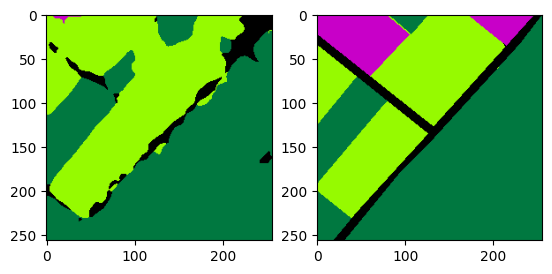

[2023-05-30 22:51:41 swanet_v5](182747771.py 311): INFO Test: [104/728]	Loss 1.1306 (0.4116)	PA@1 78.7979 (90.1706)	MPA@1 76.4092 (82.4715)	KAPPA@1 63.6265 (77.7932)	MIOU@1 43.6579 (70.4165)	FWIOU@1 71.8293 (85.2645)	Mem 44806MB


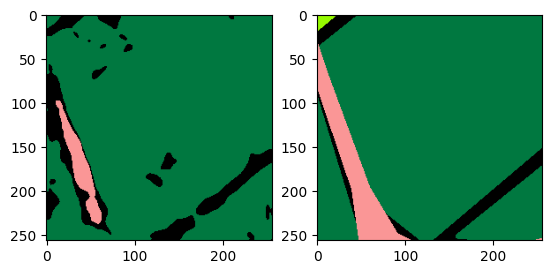

[2023-05-30 22:51:41 swanet_v5](182747771.py 311): INFO Test: [105/728]	Loss 0.4472 (0.4119)	PA@1 89.3936 (90.1633)	MPA@1 77.2009 (82.4218)	KAPPA@1 56.1391 (77.5889)	MIOU@1 40.2154 (70.1316)	FWIOU@1 83.4567 (85.2474)	Mem 44806MB


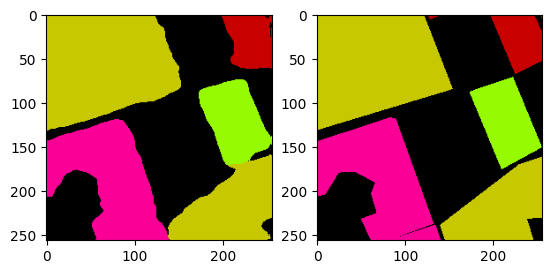

[2023-05-30 22:51:41 swanet_v5](182747771.py 311): INFO Test: [106/728]	Loss 0.0939 (0.4090)	PA@1 95.8420 (90.2164)	MPA@1 94.4878 (82.5345)	KAPPA@1 94.1230 (77.7435)	MIOU@1 90.9215 (70.3259)	FWIOU@1 92.1099 (85.3116)	Mem 44806MB


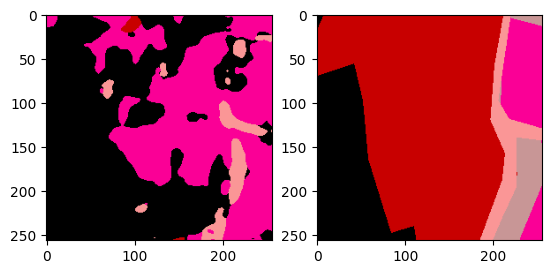

[2023-05-30 22:51:41 swanet_v5](182747771.py 311): INFO Test: [107/728]	Loss 5.2019 (0.4534)	PA@1 29.4708 (89.6539)	MPA@1 54.6502 (82.2764)	KAPPA@1 17.4313 (77.1850)	MIOU@1 18.7346 (69.8482)	FWIOU@1 27.3809 (84.7752)	Mem 44806MB


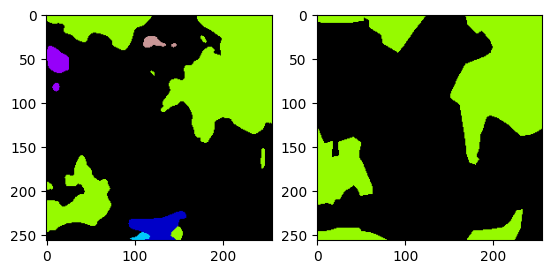

[2023-05-30 22:51:41 swanet_v5](182747771.py 311): INFO Test: [108/728]	Loss 0.5434 (0.4542)	PA@1 82.4127 (89.5875)	MPA@1 27.5881 (81.7746)	KAPPA@1 59.0963 (77.0191)	MIOU@1 22.9256 (69.4177)	FWIOU@1 70.1453 (84.6410)	Mem 44806MB


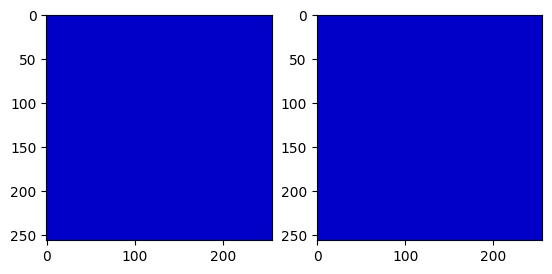

[2023-05-30 22:51:42 swanet_v5](182747771.py 311): INFO Test: [109/728]	Loss 0.0011 (0.4501)	PA@1 100.0000 (89.6821)	MPA@1 100.0000 (81.9403)	KAPPA@1 100.0000 (77.2280)	MIOU@1 100.0000 (69.6957)	FWIOU@1 100.0000 (84.7806)	Mem 44806MB


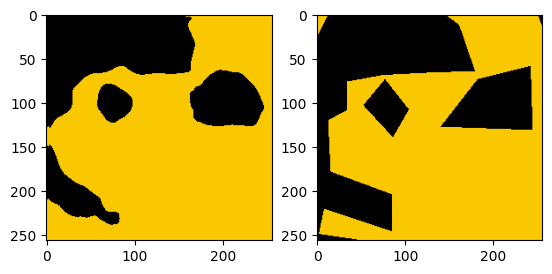

[2023-05-30 22:51:42 swanet_v5](182747771.py 311): INFO Test: [110/728]	Loss 0.1940 (0.4478)	PA@1 92.0792 (89.7037)	MPA@1 93.2246 (82.0420)	KAPPA@1 82.5638 (77.2761)	MIOU@1 84.0233 (69.8248)	FWIOU@1 85.6794 (84.7887)	Mem 44806MB


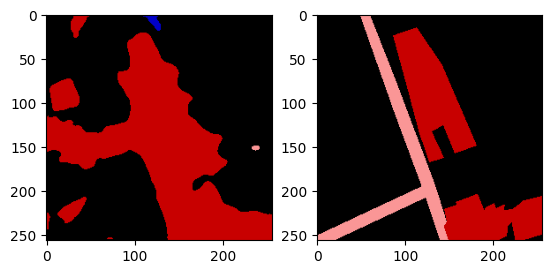

[2023-05-30 22:51:42 swanet_v5](182747771.py 311): INFO Test: [111/728]	Loss 0.9771 (0.4525)	PA@1 73.3948 (89.5581)	MPA@1 33.4486 (81.6081)	KAPPA@1 41.8990 (76.9602)	MIOU@1 28.3188 (69.4542)	FWIOU@1 60.6626 (84.5733)	Mem 44806MB


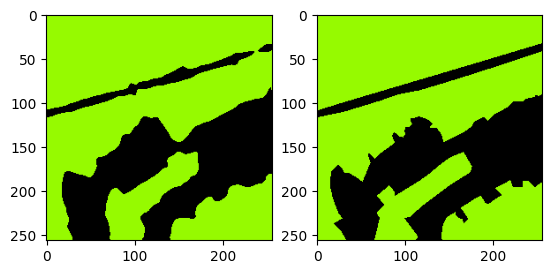

[2023-05-30 22:51:42 swanet_v5](182747771.py 311): INFO Test: [112/728]	Loss 0.0901 (0.4493)	PA@1 96.3608 (89.6183)	MPA@1 96.1766 (81.7370)	KAPPA@1 91.7643 (77.0912)	MIOU@1 92.1245 (69.6548)	FWIOU@1 93.0291 (84.6481)	Mem 44806MB


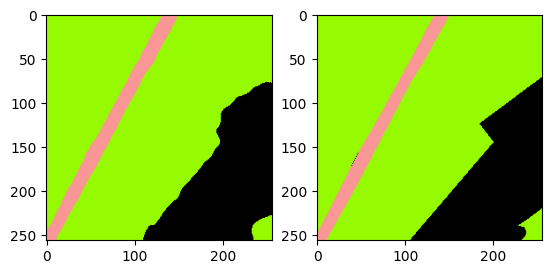

[2023-05-30 22:51:42 swanet_v5](182747771.py 311): INFO Test: [113/728]	Loss 0.0341 (0.4456)	PA@1 98.5977 (89.6971)	MPA@1 96.9282 (81.8703)	KAPPA@1 96.7549 (77.2637)	MIOU@1 95.5964 (69.8824)	FWIOU@1 97.2359 (84.7585)	Mem 44806MB


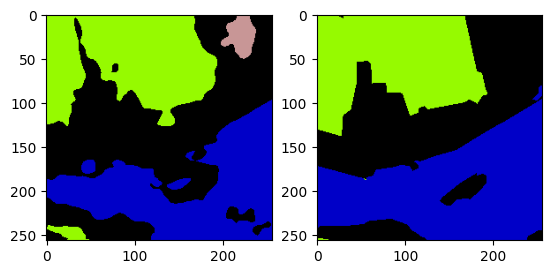

[2023-05-30 22:51:43 swanet_v5](182747771.py 311): INFO Test: [114/728]	Loss 0.4109 (0.4453)	PA@1 85.1212 (89.6573)	MPA@1 66.5137 (81.7367)	KAPPA@1 77.6688 (77.2672)	MIOU@1 57.4939 (69.7747)	FWIOU@1 73.9503 (84.6645)	Mem 44806MB


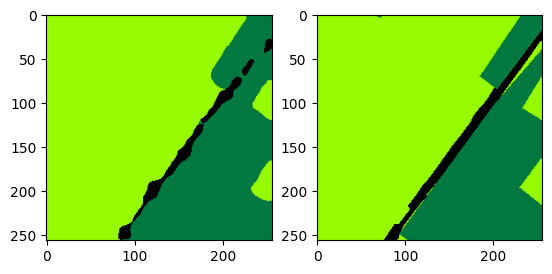

[2023-05-30 22:51:43 swanet_v5](182747771.py 311): INFO Test: [115/728]	Loss 0.0674 (0.4421)	PA@1 97.3389 (89.7235)	MPA@1 93.5817 (81.8389)	KAPPA@1 94.4156 (77.4150)	MIOU@1 84.4557 (69.9012)	FWIOU@1 95.2117 (84.7555)	Mem 44806MB


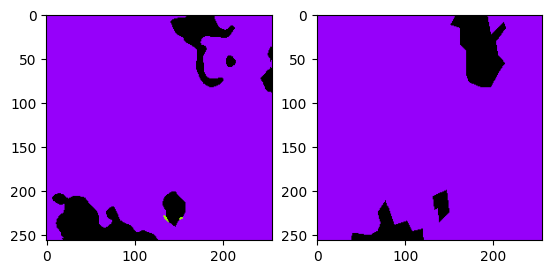

[2023-05-30 22:51:43 swanet_v5](182747771.py 311): INFO Test: [116/728]	Loss 0.1986 (0.4400)	PA@1 92.8833 (89.7505)	MPA@1 49.9820 (81.5666)	KAPPA@1 55.1652 (77.2249)	MIOU@1 44.8207 (69.6869)	FWIOU@1 87.5557 (84.7794)	Mem 44806MB


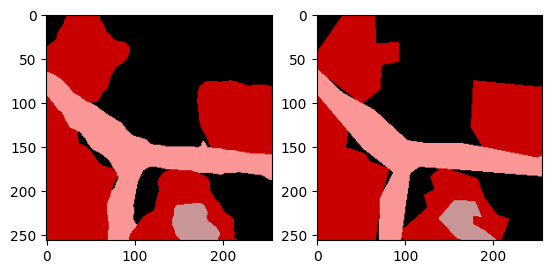

[2023-05-30 22:51:43 swanet_v5](182747771.py 311): INFO Test: [117/728]	Loss 0.1079 (0.4372)	PA@1 95.8130 (89.8019)	MPA@1 93.0653 (81.6640)	KAPPA@1 93.5069 (77.3629)	MIOU@1 88.2025 (69.8438)	FWIOU@1 91.9879 (84.8405)	Mem 44806MB


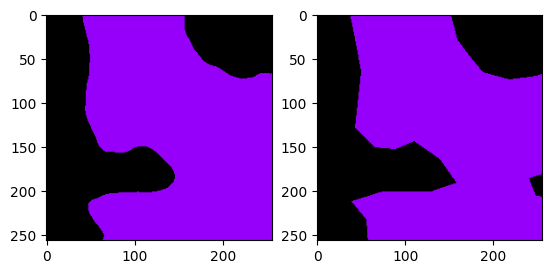

[2023-05-30 22:51:43 swanet_v5](182747771.py 311): INFO Test: [118/728]	Loss 0.0621 (0.4340)	PA@1 97.1786 (89.8639)	MPA@1 97.2359 (81.7949)	KAPPA@1 93.8557 (77.5015)	MIOU@1 94.0523 (70.0472)	FWIOU@1 94.5418 (84.9220)	Mem 44806MB


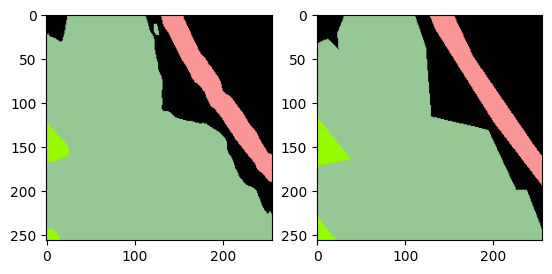

[2023-05-30 22:51:44 swanet_v5](182747771.py 311): INFO Test: [119/728]	Loss 0.0720 (0.4310)	PA@1 97.0383 (89.9237)	MPA@1 97.5088 (81.9258)	KAPPA@1 93.9609 (77.6386)	MIOU@1 86.2802 (70.1825)	FWIOU@1 94.5128 (85.0019)	Mem 44806MB


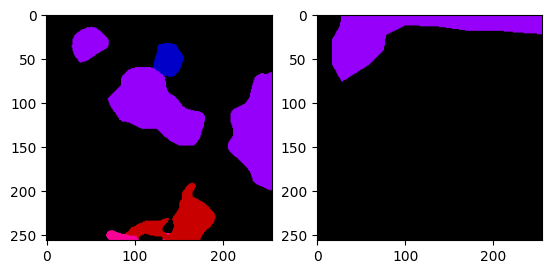

[2023-05-30 22:51:44 swanet_v5](182747771.py 311): INFO Test: [120/728]	Loss 1.0535 (0.4362)	PA@1 70.2820 (89.7614)	MPA@1 19.8818 (81.4131)	KAPPA@1 -1.9110 (76.9812)	MIOU@1 15.3395 (69.7292)	FWIOU@1 54.8746 (84.7529)	Mem 44806MB


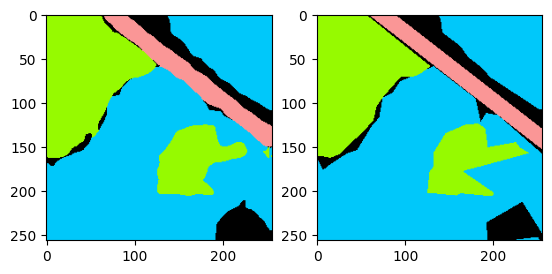

[2023-05-30 22:51:44 swanet_v5](182747771.py 311): INFO Test: [121/728]	Loss 0.0972 (0.4334)	PA@1 96.3684 (89.8155)	MPA@1 94.6803 (81.5218)	KAPPA@1 93.7793 (77.1189)	MIOU@1 89.0643 (69.8877)	FWIOU@1 93.2789 (84.8228)	Mem 44806MB


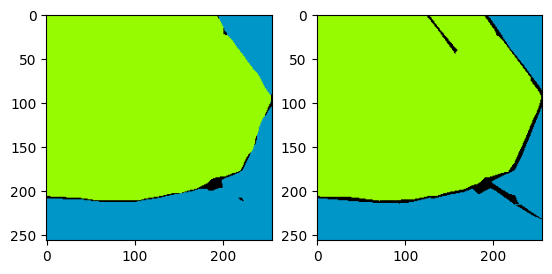

[2023-05-30 22:51:44 swanet_v5](182747771.py 311): INFO Test: [122/728]	Loss 0.0564 (0.4303)	PA@1 97.8897 (89.8812)	MPA@1 96.6002 (81.6444)	KAPPA@1 95.0494 (77.2646)	MIOU@1 75.7455 (69.9354)	FWIOU@1 97.1605 (84.9231)	Mem 44806MB


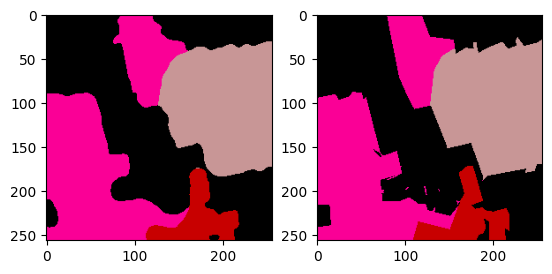

[2023-05-30 22:51:45 swanet_v5](182747771.py 311): INFO Test: [123/728]	Loss 0.0775 (0.4275)	PA@1 96.8536 (89.9374)	MPA@1 96.1035 (81.7610)	KAPPA@1 95.3836 (77.4108)	MIOU@1 92.4094 (70.1166)	FWIOU@1 93.9248 (84.9957)	Mem 44806MB


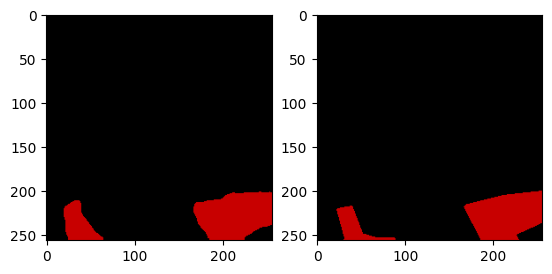

[2023-05-30 22:51:45 swanet_v5](182747771.py 311): INFO Test: [124/728]	Loss 0.0246 (0.4242)	PA@1 99.0540 (90.0103)	MPA@1 95.0414 (81.8673)	KAPPA@1 93.0466 (77.5359)	MIOU@1 93.4386 (70.3032)	FWIOU@1 98.1407 (85.1009)	Mem 44806MB


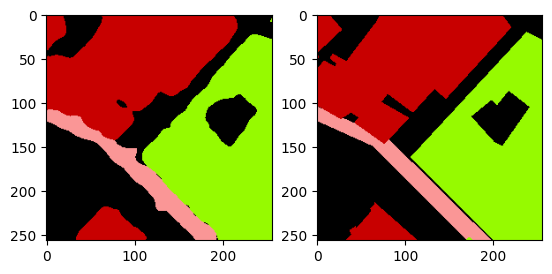

[2023-05-30 22:51:45 swanet_v5](182747771.py 311): INFO Test: [125/728]	Loss 0.0961 (0.4216)	PA@1 96.1380 (90.0589)	MPA@1 94.3599 (81.9664)	KAPPA@1 94.5131 (77.6706)	MIOU@1 91.0953 (70.4682)	FWIOU@1 92.6417 (85.1607)	Mem 44806MB


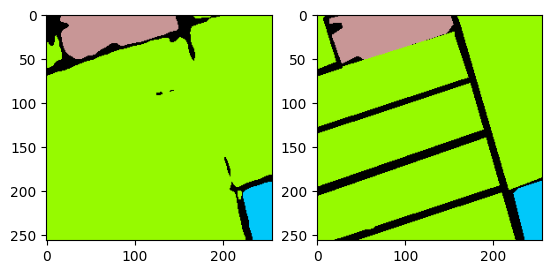

[2023-05-30 22:51:45 swanet_v5](182747771.py 311): INFO Test: [126/728]	Loss 0.4489 (0.4219)	PA@1 87.8784 (90.0418)	MPA@1 84.4115 (81.9857)	KAPPA@1 63.2871 (77.5573)	MIOU@1 71.9070 (70.4795)	FWIOU@1 83.9537 (85.1512)	Mem 44806MB


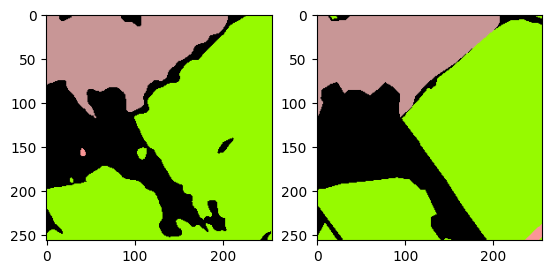

[2023-05-30 22:51:46 swanet_v5](182747771.py 311): INFO Test: [127/728]	Loss 0.2162 (0.4202)	PA@1 92.0273 (90.0573)	MPA@1 68.4113 (81.8796)	KAPPA@1 86.8703 (77.6301)	MIOU@1 63.1033 (70.4219)	FWIOU@1 85.7658 (85.1560)	Mem 44806MB


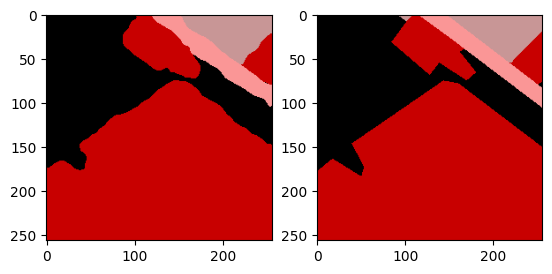

[2023-05-30 22:51:46 swanet_v5](182747771.py 311): INFO Test: [128/728]	Loss 0.0604 (0.4175)	PA@1 97.5662 (90.1155)	MPA@1 95.0658 (81.9818)	KAPPA@1 95.5171 (77.7688)	MIOU@1 73.4958 (70.4457)	FWIOU@1 95.2926 (85.2346)	Mem 44806MB


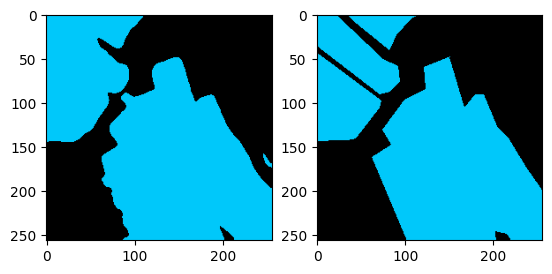

[2023-05-30 22:51:46 swanet_v5](182747771.py 311): INFO Test: [129/728]	Loss 0.0826 (0.4149)	PA@1 96.2006 (90.1623)	MPA@1 96.6099 (82.0943)	KAPPA@1 92.2795 (77.8804)	MIOU@1 92.5639 (70.6159)	FWIOU@1 92.7123 (85.2921)	Mem 44806MB


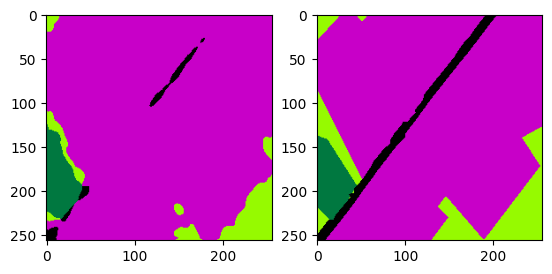

[2023-05-30 22:51:46 swanet_v5](182747771.py 311): INFO Test: [130/728]	Loss 0.2184 (0.4134)	PA@1 91.8076 (90.1749)	MPA@1 93.6300 (82.1824)	KAPPA@1 70.4788 (77.8239)	MIOU@1 64.9080 (70.5723)	FWIOU@1 88.1281 (85.3138)	Mem 44806MB


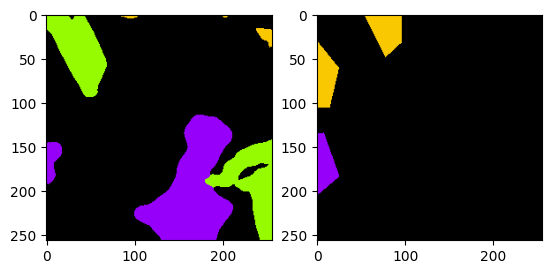

[2023-05-30 22:51:47 swanet_v5](182747771.py 311): INFO Test: [131/728]	Loss 1.2785 (0.4199)	PA@1 70.5490 (90.0262)	MPA@1 28.4411 (81.7753)	KAPPA@1 0.2993 (77.2366)	MIOU@1 19.3717 (70.1844)	FWIOU@1 53.1051 (85.0698)	Mem 44806MB


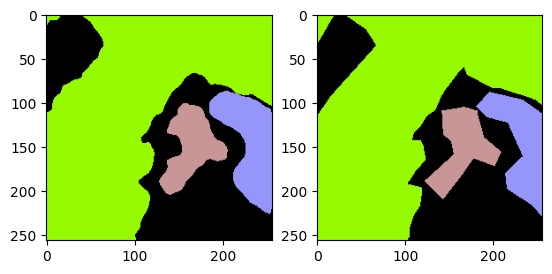

[2023-05-30 22:51:47 swanet_v5](182747771.py 311): INFO Test: [132/728]	Loss 0.0882 (0.4174)	PA@1 96.2219 (90.0728)	MPA@1 93.1095 (81.8605)	KAPPA@1 93.4765 (77.3587)	MIOU@1 89.0142 (70.3260)	FWIOU@1 92.8333 (85.1281)	Mem 44806MB


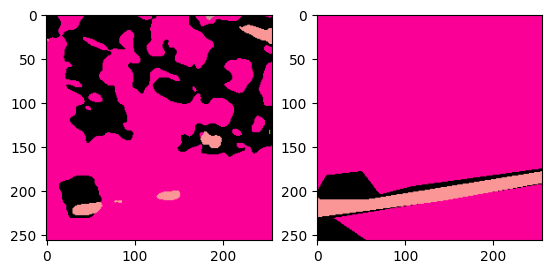

[2023-05-30 22:51:47 swanet_v5](182747771.py 311): INFO Test: [133/728]	Loss 1.4837 (0.4254)	PA@1 59.0714 (89.8414)	MPA@1 26.5467 (81.4477)	KAPPA@1 -1.5639 (76.7697)	MIOU@1 14.9460 (69.9127)	FWIOU@1 39.7682 (84.7896)	Mem 44806MB


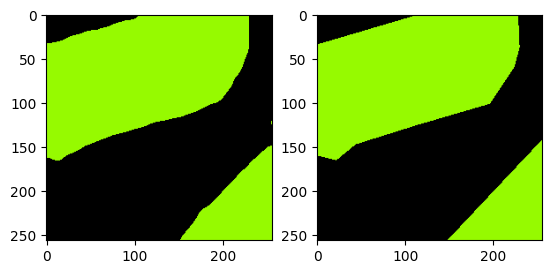

[2023-05-30 22:51:47 swanet_v5](182747771.py 311): INFO Test: [134/728]	Loss 0.0222 (0.4224)	PA@1 99.1119 (89.9101)	MPA@1 99.1116 (81.5786)	KAPPA@1 98.2239 (76.9286)	MIOU@1 98.2395 (70.1225)	FWIOU@1 98.2395 (84.8893)	Mem 44806MB


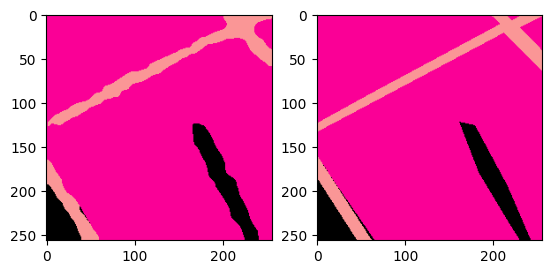

[2023-05-30 22:51:48 swanet_v5](182747771.py 311): INFO Test: [135/728]	Loss 0.0632 (0.4198)	PA@1 97.6578 (89.9671)	MPA@1 93.3336 (81.6650)	KAPPA@1 91.1244 (77.0330)	MIOU@1 89.0797 (70.2619)	FWIOU@1 95.4997 (84.9673)	Mem 44806MB


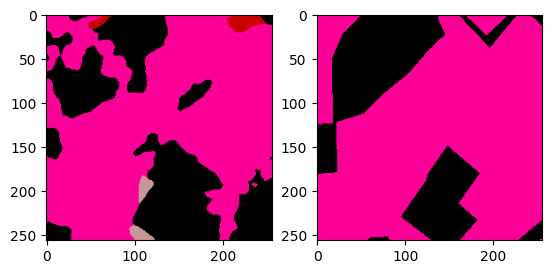

[2023-05-30 22:51:48 swanet_v5](182747771.py 311): INFO Test: [136/728]	Loss 0.6739 (0.4216)	PA@1 79.6173 (89.8915)	MPA@1 38.2819 (81.3483)	KAPPA@1 52.7525 (76.8558)	MIOU@1 25.3089 (69.9338)	FWIOU@1 65.9756 (84.8287)	Mem 44806MB


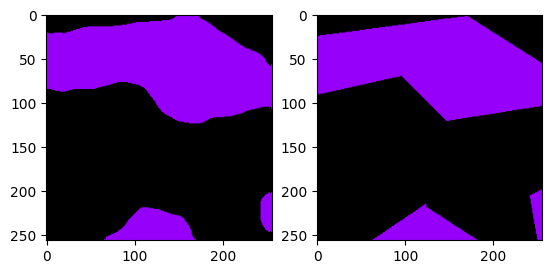

[2023-05-30 22:51:48 swanet_v5](182747771.py 311): INFO Test: [137/728]	Loss 0.0651 (0.4190)	PA@1 97.2549 (89.9449)	MPA@1 96.6224 (81.4590)	KAPPA@1 94.0427 (76.9803)	MIOU@1 94.2264 (70.1098)	FWIOU@1 94.6450 (84.8998)	Mem 44806MB


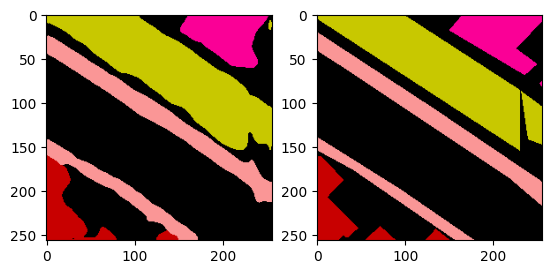

[2023-05-30 22:51:48 swanet_v5](182747771.py 311): INFO Test: [138/728]	Loss 0.1480 (0.4171)	PA@1 93.7820 (89.9725)	MPA@1 91.3935 (81.5305)	KAPPA@1 90.1919 (77.0754)	MIOU@1 86.8941 (70.2306)	FWIOU@1 88.2750 (84.9241)	Mem 44806MB


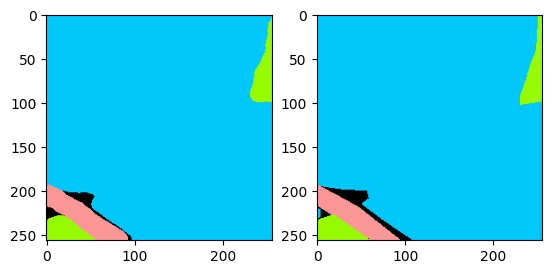

[2023-05-30 22:51:48 swanet_v5](182747771.py 311): INFO Test: [139/728]	Loss 0.0320 (0.4143)	PA@1 98.7930 (90.0355)	MPA@1 94.0836 (81.6201)	KAPPA@1 92.1169 (77.1828)	MIOU@1 82.1101 (70.3154)	FWIOU@1 97.9873 (85.0174)	Mem 44806MB


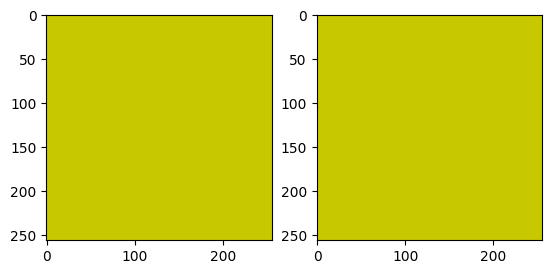

[2023-05-30 22:51:49 swanet_v5](182747771.py 311): INFO Test: [140/728]	Loss 0.0001 (0.4114)	PA@1 100.0000 (90.1061)	MPA@1 100.0000 (81.7505)	KAPPA@1 100.0000 (77.3446)	MIOU@1 100.0000 (70.5260)	FWIOU@1 100.0000 (85.1236)	Mem 44806MB


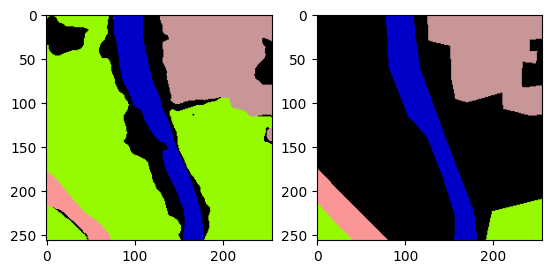

[2023-05-30 22:51:49 swanet_v5](182747771.py 311): INFO Test: [141/728]	Loss 3.1698 (0.4308)	PA@1 46.4523 (89.7987)	MPA@1 63.9128 (81.6249)	KAPPA@1 36.1349 (77.0544)	MIOU@1 46.4750 (70.3566)	FWIOU@1 34.4381 (84.7667)	Mem 44806MB


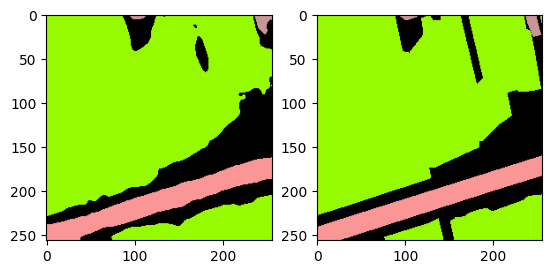

[2023-05-30 22:51:49 swanet_v5](182747771.py 311): INFO Test: [142/728]	Loss 0.0885 (0.4284)	PA@1 96.2082 (89.8435)	MPA@1 92.7206 (81.7025)	KAPPA@1 91.7078 (77.1569)	MIOU@1 85.4541 (70.4622)	FWIOU@1 92.9593 (84.8240)	Mem 44806MB


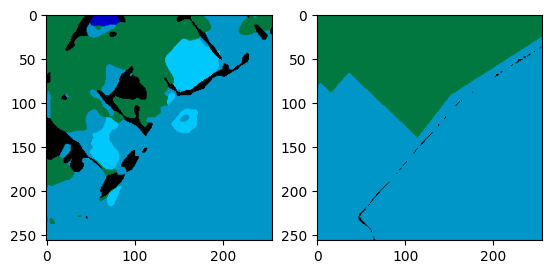

[2023-05-30 22:51:49 swanet_v5](182747771.py 311): INFO Test: [143/728]	Loss 0.6512 (0.4300)	PA@1 73.4924 (89.7300)	MPA@1 33.7251 (81.3693)	KAPPA@1 48.6544 (76.9590)	MIOU@1 25.0802 (70.1470)	FWIOU@1 57.2131 (84.6323)	Mem 44806MB


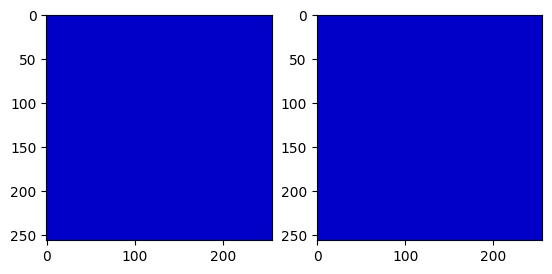

[2023-05-30 22:51:49 swanet_v5](182747771.py 311): INFO Test: [144/728]	Loss 0.0002 (0.4270)	PA@1 100.0000 (89.8008)	MPA@1 100.0000 (81.4978)	KAPPA@1 100.0000 (77.1179)	MIOU@1 100.0000 (70.3529)	FWIOU@1 100.0000 (84.7382)	Mem 44806MB


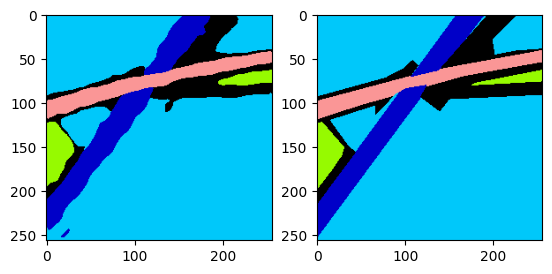

[2023-05-30 22:51:50 swanet_v5](182747771.py 311): INFO Test: [145/728]	Loss 0.0973 (0.4248)	PA@1 96.1182 (89.8441)	MPA@1 91.7161 (81.5678)	KAPPA@1 92.1283 (77.2207)	MIOU@1 86.5295 (70.4637)	FWIOU@1 92.8061 (84.7935)	Mem 44806MB


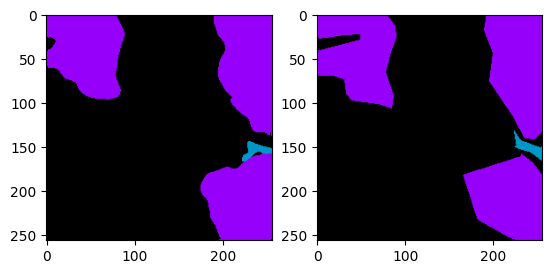

[2023-05-30 22:51:50 swanet_v5](182747771.py 311): INFO Test: [146/728]	Loss 0.1135 (0.4226)	PA@1 95.5917 (89.8832)	MPA@1 86.0808 (81.5985)	KAPPA@1 89.8807 (77.3068)	MIOU@1 75.8139 (70.5001)	FWIOU@1 91.7386 (84.8407)	Mem 44806MB


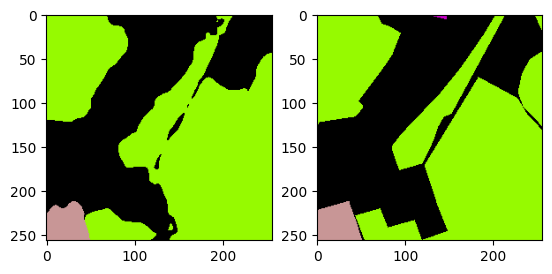

[2023-05-30 22:51:50 swanet_v5](182747771.py 311): INFO Test: [147/728]	Loss 0.1082 (0.4205)	PA@1 95.4071 (89.9205)	MPA@1 96.0373 (81.6960)	KAPPA@1 91.1691 (77.4005)	MIOU@1 69.1412 (70.4909)	FWIOU@1 91.3496 (84.8847)	Mem 44806MB


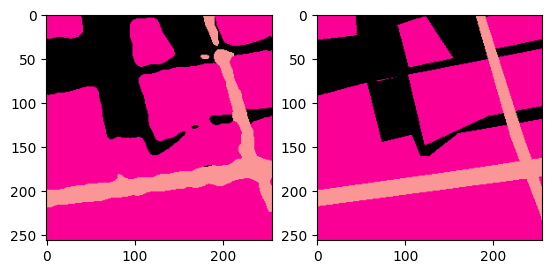

[2023-05-30 22:51:50 swanet_v5](182747771.py 311): INFO Test: [148/728]	Loss 0.1117 (0.4184)	PA@1 95.4056 (89.9573)	MPA@1 93.1263 (81.7727)	KAPPA@1 91.0358 (77.4920)	MIOU@1 88.5950 (70.6124)	FWIOU@1 91.2412 (84.9274)	Mem 44806MB


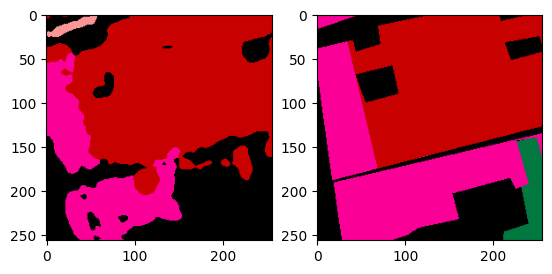

[2023-05-30 22:51:50 swanet_v5](182747771.py 311): INFO Test: [149/728]	Loss 1.3927 (0.4249)	PA@1 75.0854 (89.8582)	MPA@1 57.8267 (81.6131)	KAPPA@1 62.3024 (77.3907)	MIOU@1 35.6909 (70.3796)	FWIOU@1 64.5439 (84.7915)	Mem 44806MB


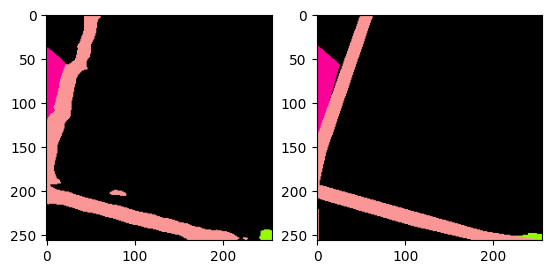

[2023-05-30 22:51:51 swanet_v5](182747771.py 311): INFO Test: [150/728]	Loss 0.0678 (0.4226)	PA@1 97.2305 (89.9070)	MPA@1 85.2701 (81.6373)	KAPPA@1 86.9861 (77.4542)	MIOU@1 73.7445 (70.4019)	FWIOU@1 94.8583 (84.8582)	Mem 44806MB


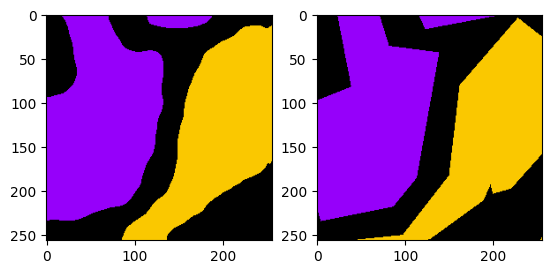

[2023-05-30 22:51:51 swanet_v5](182747771.py 311): INFO Test: [151/728]	Loss 0.1093 (0.4205)	PA@1 95.3186 (89.9426)	MPA@1 95.2175 (81.7267)	KAPPA@1 92.9535 (77.5562)	MIOU@1 91.0624 (70.5378)	FWIOU@1 91.1619 (84.8996)	Mem 44806MB


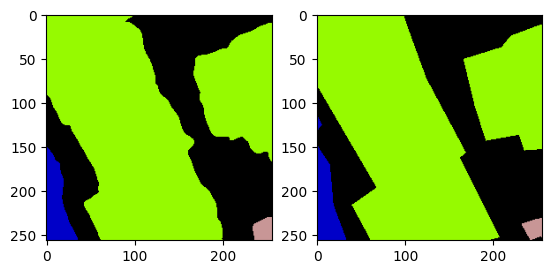

[2023-05-30 22:51:51 swanet_v5](182747771.py 311): INFO Test: [152/728]	Loss 0.0686 (0.4182)	PA@1 97.1634 (89.9898)	MPA@1 93.1322 (81.8012)	KAPPA@1 94.2631 (77.6654)	MIOU@1 90.0043 (70.6650)	FWIOU@1 94.5307 (84.9626)	Mem 44806MB


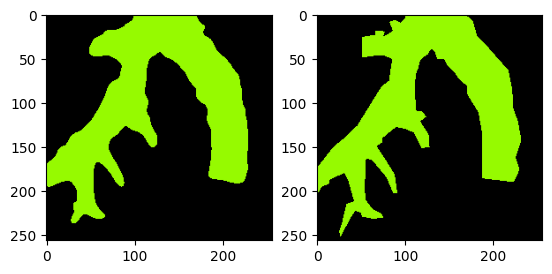

[2023-05-30 22:51:51 swanet_v5](182747771.py 311): INFO Test: [153/728]	Loss 0.0738 (0.4160)	PA@1 97.2076 (90.0367)	MPA@1 96.5774 (81.8972)	KAPPA@1 93.5779 (77.7687)	MIOU@1 93.8019 (70.8153)	FWIOU@1 94.5763 (85.0250)	Mem 44806MB


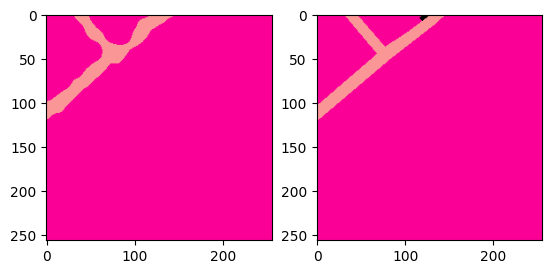

[2023-05-30 22:51:51 swanet_v5](182747771.py 311): INFO Test: [154/728]	Loss 0.0305 (0.4135)	PA@1 98.9380 (90.0941)	MPA@1 92.6797 (81.9667)	KAPPA@1 88.4382 (77.8376)	MIOU@1 59.6642 (70.7433)	FWIOU@1 98.0295 (85.1089)	Mem 44806MB


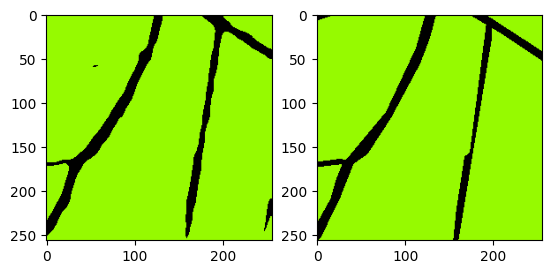

[2023-05-30 22:51:52 swanet_v5](182747771.py 311): INFO Test: [155/728]	Loss 0.0575 (0.4112)	PA@1 97.5983 (90.1422)	MPA@1 91.6945 (82.0291)	KAPPA@1 85.6850 (77.8879)	MIOU@1 87.1950 (70.8488)	FWIOU@1 95.4459 (85.1752)	Mem 44806MB


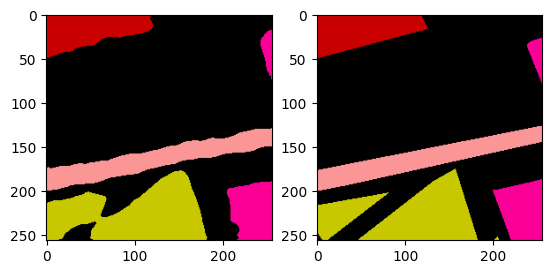

[2023-05-30 22:51:52 swanet_v5](182747771.py 311): INFO Test: [156/728]	Loss 0.0986 (0.4092)	PA@1 95.8984 (90.1789)	MPA@1 94.6534 (82.1095)	KAPPA@1 92.0130 (77.9778)	MIOU@1 89.8320 (70.9697)	FWIOU@1 92.1160 (85.2194)	Mem 44806MB


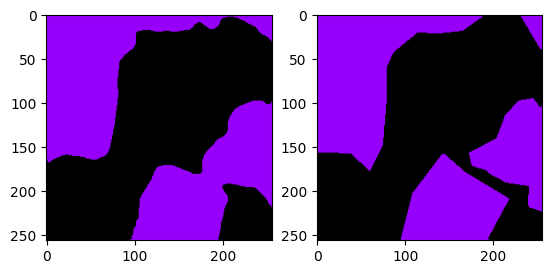

[2023-05-30 22:51:52 swanet_v5](182747771.py 311): INFO Test: [157/728]	Loss 0.1091 (0.4073)	PA@1 95.1035 (90.2100)	MPA@1 95.0479 (82.1914)	KAPPA@1 90.1007 (78.0546)	MIOU@1 90.5721 (71.0938)	FWIOU@1 90.6683 (85.2539)	Mem 44806MB


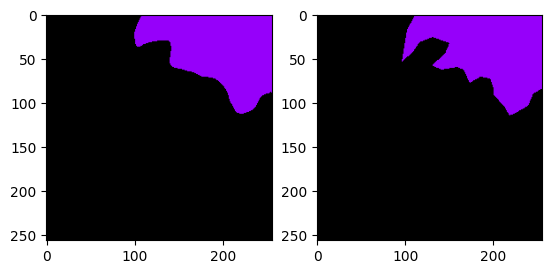

[2023-05-30 22:51:52 swanet_v5](182747771.py 311): INFO Test: [158/728]	Loss 0.0278 (0.4049)	PA@1 98.8785 (90.2646)	MPA@1 98.1798 (82.2919)	KAPPA@1 95.9678 (78.1672)	MIOU@1 96.0815 (71.2509)	FWIOU@1 97.8053 (85.3328)	Mem 44806MB


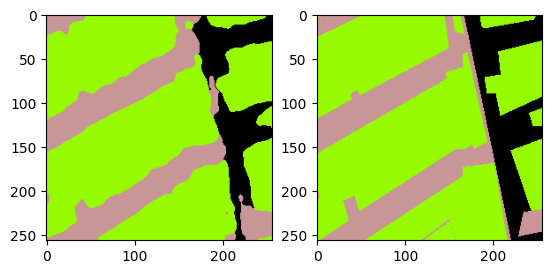

[2023-05-30 22:51:52 swanet_v5](182747771.py 311): INFO Test: [159/728]	Loss 0.1513 (0.4033)	PA@1 93.7531 (90.2864)	MPA@1 92.7124 (82.3571)	KAPPA@1 87.8245 (78.2276)	MIOU@1 83.9128 (71.3301)	FWIOU@1 88.5631 (85.3530)	Mem 44806MB


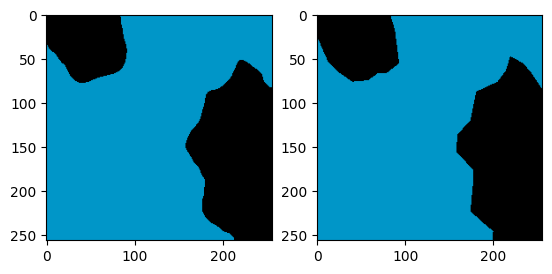

[2023-05-30 22:51:53 swanet_v5](182747771.py 311): INFO Test: [160/728]	Loss 0.0297 (0.4010)	PA@1 98.8327 (90.3394)	MPA@1 98.9428 (82.4601)	KAPPA@1 97.2893 (78.3460)	MIOU@1 97.3303 (71.4916)	FWIOU@1 97.7034 (85.4297)	Mem 44806MB


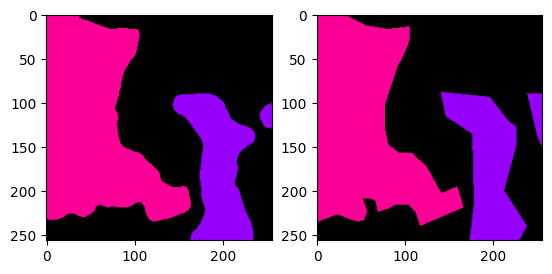

[2023-05-30 22:51:53 swanet_v5](182747771.py 311): INFO Test: [161/728]	Loss 0.0940 (0.3991)	PA@1 96.0587 (90.3747)	MPA@1 95.3698 (82.5398)	KAPPA@1 93.3712 (78.4387)	MIOU@1 90.8485 (71.6110)	FWIOU@1 92.4945 (85.4733)	Mem 44806MB


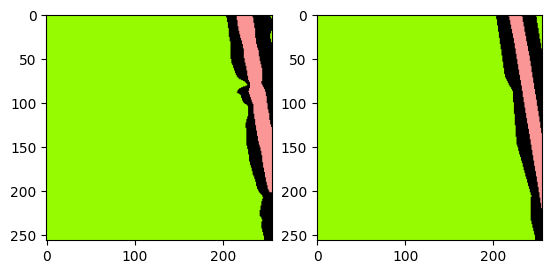

[2023-05-30 22:51:53 swanet_v5](182747771.py 311): INFO Test: [162/728]	Loss 0.0365 (0.3969)	PA@1 98.3292 (90.4235)	MPA@1 92.9966 (82.6039)	KAPPA@1 92.1112 (78.5226)	MIOU@1 87.6858 (71.7097)	FWIOU@1 96.9212 (85.5435)	Mem 44806MB


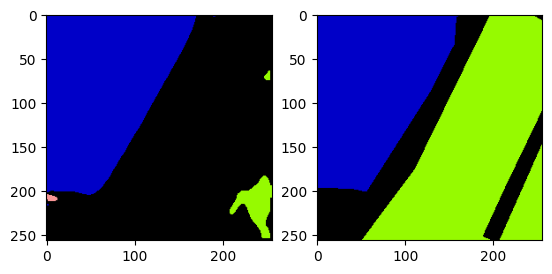

[2023-05-30 22:51:53 swanet_v5](182747771.py 311): INFO Test: [163/728]	Loss 2.7860 (0.4115)	PA@1 55.1605 (90.2085)	MPA@1 52.1602 (82.4183)	KAPPA@1 39.3903 (78.2840)	MIOU@1 32.2277 (71.4689)	FWIOU@1 52.6525 (85.3430)	Mem 44806MB


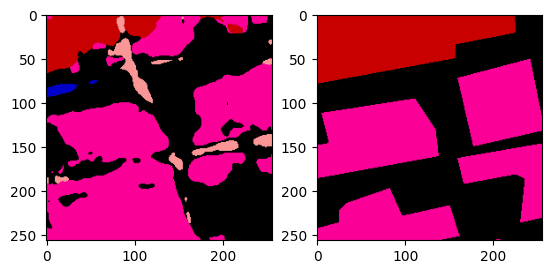

[2023-05-30 22:51:53 swanet_v5](182747771.py 311): INFO Test: [164/728]	Loss 1.1805 (0.4161)	PA@1 65.9637 (90.0616)	MPA@1 46.4039 (82.2000)	KAPPA@1 45.5889 (78.0858)	MIOU@1 29.3006 (71.2134)	FWIOU@1 49.3142 (85.1246)	Mem 44806MB


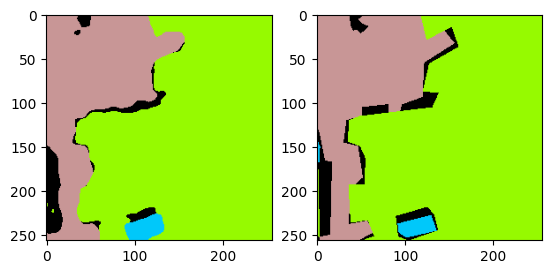

[2023-05-30 22:51:54 swanet_v5](182747771.py 311): INFO Test: [165/728]	Loss 0.0991 (0.4142)	PA@1 96.1014 (90.0980)	MPA@1 86.2420 (82.2244)	KAPPA@1 91.9689 (78.1695)	MIOU@1 77.2726 (71.2499)	FWIOU@1 93.5186 (85.1752)	Mem 44806MB


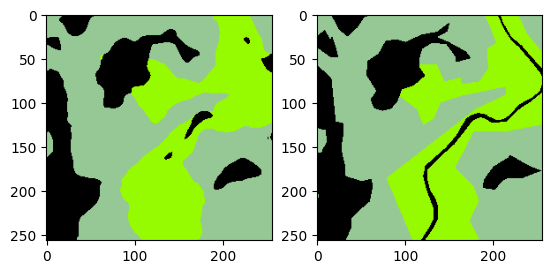

[2023-05-30 22:51:54 swanet_v5](182747771.py 311): INFO Test: [166/728]	Loss 0.1905 (0.4129)	PA@1 92.4057 (90.1118)	MPA@1 91.6653 (82.2809)	KAPPA@1 87.7158 (78.2266)	MIOU@1 84.3337 (71.3282)	FWIOU@1 86.0209 (85.1803)	Mem 44806MB


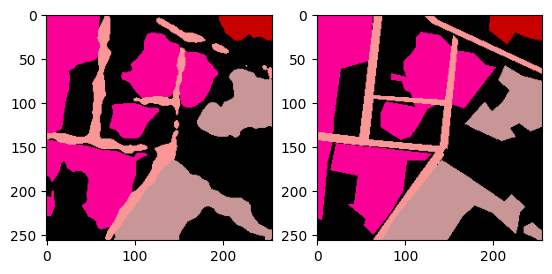

[2023-05-30 22:51:54 swanet_v5](182747771.py 311): INFO Test: [167/728]	Loss 0.2165 (0.4117)	PA@1 91.0645 (90.1175)	MPA@1 91.0050 (82.3328)	KAPPA@1 87.1411 (78.2797)	MIOU@1 82.5737 (71.3951)	FWIOU@1 83.9144 (85.1727)	Mem 44806MB


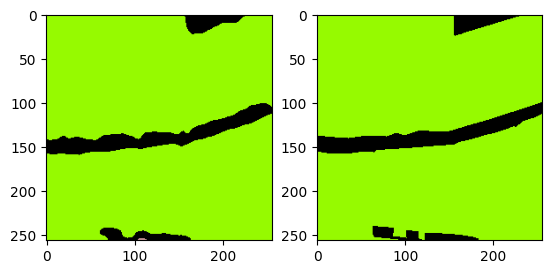

[2023-05-30 22:51:54 swanet_v5](182747771.py 311): INFO Test: [168/728]	Loss 0.0482 (0.4096)	PA@1 98.0881 (90.1646)	MPA@1 63.5517 (82.2217)	KAPPA@1 88.5887 (78.3407)	MIOU@1 59.7147 (71.3260)	FWIOU@1 96.4142 (85.2392)	Mem 44806MB


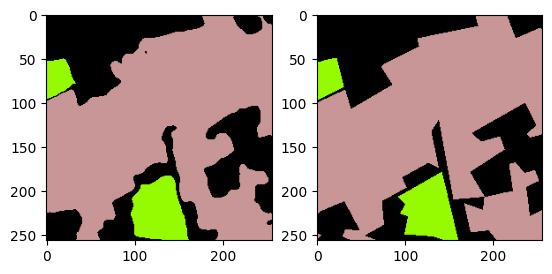

[2023-05-30 22:51:54 swanet_v5](182747771.py 311): INFO Test: [169/728]	Loss 0.1150 (0.4078)	PA@1 95.2408 (90.1945)	MPA@1 94.3649 (82.2931)	KAPPA@1 90.7767 (78.4139)	MIOU@1 89.7480 (71.4344)	FWIOU@1 91.0539 (85.2735)	Mem 44806MB


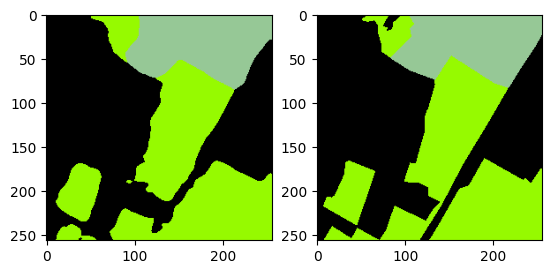

[2023-05-30 22:51:55 swanet_v5](182747771.py 311): INFO Test: [170/728]	Loss 0.0976 (0.4060)	PA@1 95.8389 (90.2275)	MPA@1 95.9572 (82.3730)	KAPPA@1 93.1525 (78.5000)	MIOU@1 92.6239 (71.5583)	FWIOU@1 92.0309 (85.3130)	Mem 44806MB


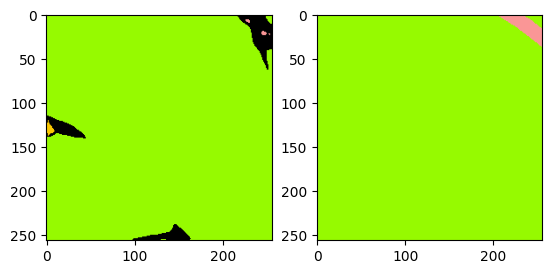

[2023-05-30 22:51:55 swanet_v5](182747771.py 311): INFO Test: [171/728]	Loss 0.1031 (0.4043)	PA@1 96.4371 (90.2636)	MPA@1 49.9483 (82.1845)	KAPPA@1 22.1595 (78.1725)	MIOU@1 25.6461 (71.2914)	FWIOU@1 94.0102 (85.3635)	Mem 44806MB


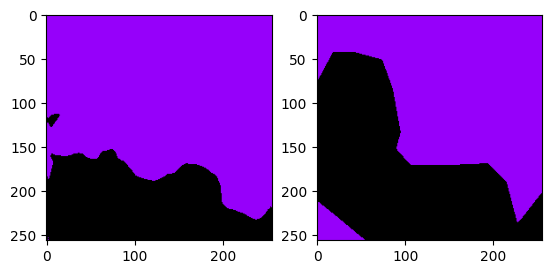

[2023-05-30 22:51:55 swanet_v5](182747771.py 311): INFO Test: [172/728]	Loss 0.6720 (0.4058)	PA@1 80.0369 (90.2045)	MPA@1 83.9916 (82.1950)	KAPPA@1 58.1683 (78.0568)	MIOU@1 64.9794 (71.2549)	FWIOU@1 68.3205 (85.2650)	Mem 44806MB


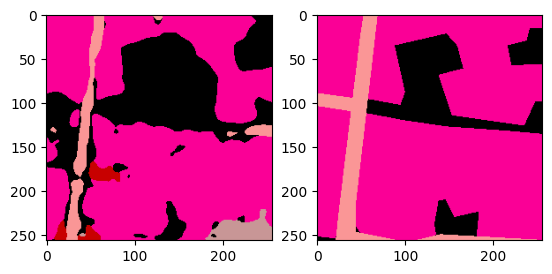

[2023-05-30 22:51:55 swanet_v5](182747771.py 311): INFO Test: [173/728]	Loss 0.7883 (0.4080)	PA@1 76.5182 (90.1258)	MPA@1 45.3706 (81.9833)	KAPPA@1 51.6743 (77.9052)	MIOU@1 32.2172 (71.0305)	FWIOU@1 61.0761 (85.1260)	Mem 44806MB


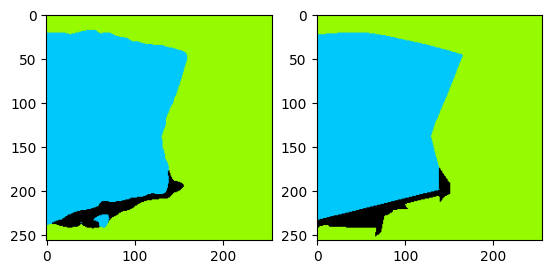

[2023-05-30 22:51:55 swanet_v5](182747771.py 311): INFO Test: [174/728]	Loss 0.0454 (0.4059)	PA@1 98.2361 (90.1722)	MPA@1 95.1875 (82.0588)	KAPPA@1 96.6086 (78.0121)	MIOU@1 87.6356 (71.1254)	FWIOU@1 96.7757 (85.1926)	Mem 44806MB


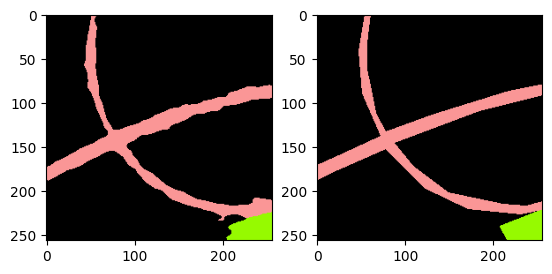

[2023-05-30 22:51:56 swanet_v5](182747771.py 311): INFO Test: [175/728]	Loss 0.0689 (0.4040)	PA@1 97.3007 (90.2127)	MPA@1 92.9654 (82.1208)	KAPPA@1 88.5968 (78.0722)	MIOU@1 89.5613 (71.2302)	FWIOU@1 94.8184 (85.2473)	Mem 44806MB


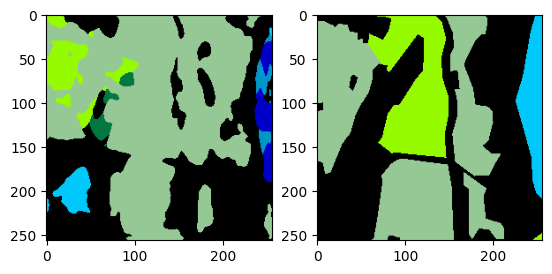

[2023-05-30 22:51:56 swanet_v5](182747771.py 311): INFO Test: [176/728]	Loss 1.7707 (0.4117)	PA@1 51.1490 (89.9920)	MPA@1 17.7343 (81.7570)	KAPPA@1 24.6692 (77.7705)	MIOU@1 12.6159 (70.8990)	FWIOU@1 37.7807 (84.9791)	Mem 44806MB


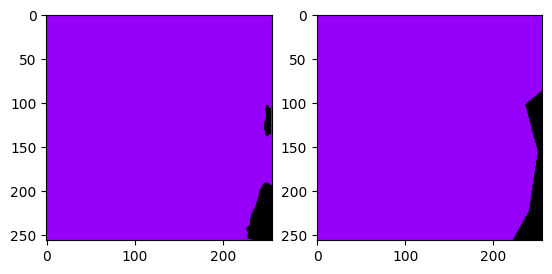

[2023-05-30 22:51:56 swanet_v5](182747771.py 311): INFO Test: [177/728]	Loss 0.0354 (0.4096)	PA@1 98.2666 (90.0385)	MPA@1 94.7432 (81.8299)	KAPPA@1 70.7621 (77.7311)	MIOU@1 77.0042 (70.9333)	FWIOU@1 97.2084 (85.0478)	Mem 44806MB


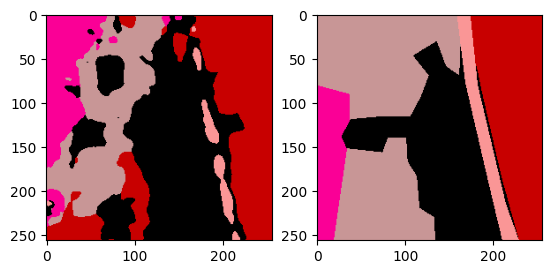

[2023-05-30 22:51:56 swanet_v5](182747771.py 311): INFO Test: [178/728]	Loss 1.2093 (0.4141)	PA@1 68.4982 (89.9181)	MPA@1 71.2862 (81.7710)	KAPPA@1 57.9901 (77.6209)	MIOU@1 48.0408 (70.8054)	FWIOU@1 55.6843 (84.8838)	Mem 44806MB


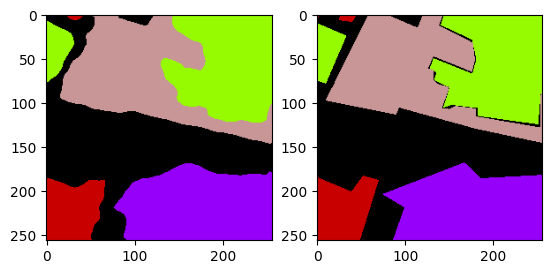

[2023-05-30 22:51:57 swanet_v5](182747771.py 311): INFO Test: [179/728]	Loss 0.1101 (0.4124)	PA@1 95.8679 (89.9512)	MPA@1 95.7487 (81.8487)	KAPPA@1 94.6023 (77.7152)	MIOU@1 92.5094 (70.9260)	FWIOU@1 92.1233 (84.9240)	Mem 44806MB


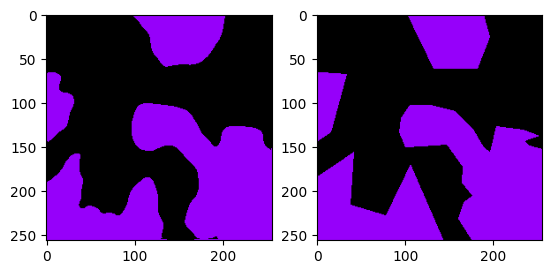

[2023-05-30 22:51:57 swanet_v5](182747771.py 311): INFO Test: [180/728]	Loss 0.1333 (0.4109)	PA@1 94.8074 (89.9780)	MPA@1 94.7792 (81.9201)	KAPPA@1 89.3861 (77.7797)	MIOU@1 89.9311 (71.0310)	FWIOU@1 90.1464 (84.9528)	Mem 44806MB


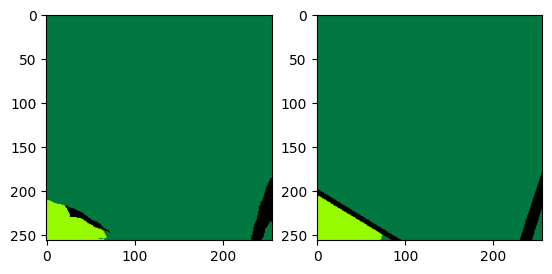

[2023-05-30 22:51:57 swanet_v5](182747771.py 311): INFO Test: [181/728]	Loss 0.0331 (0.4088)	PA@1 98.6511 (90.0257)	MPA@1 92.5595 (81.9786)	KAPPA@1 86.0185 (77.8250)	MIOU@1 80.1397 (71.0811)	FWIOU@1 97.7236 (85.0230)	Mem 44806MB


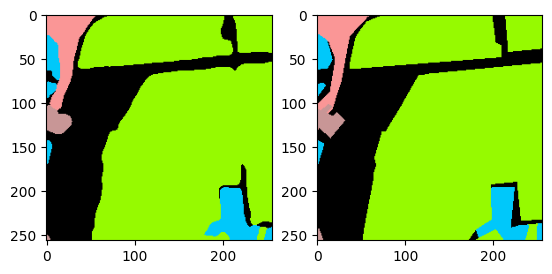

[2023-05-30 22:51:57 swanet_v5](182747771.py 311): INFO Test: [182/728]	Loss 0.0896 (0.4070)	PA@1 96.6553 (90.0619)	MPA@1 91.7195 (82.0318)	KAPPA@1 93.3683 (77.9099)	MIOU@1 85.7260 (71.1611)	FWIOU@1 93.6484 (85.0701)	Mem 44806MB


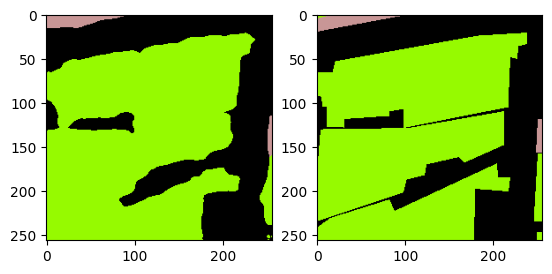

[2023-05-30 22:51:57 swanet_v5](182747771.py 311): INFO Test: [183/728]	Loss 0.0998 (0.4054)	PA@1 96.0571 (90.0945)	MPA@1 94.3485 (82.0988)	KAPPA@1 91.8303 (77.9855)	MIOU@1 87.6564 (71.2507)	FWIOU@1 92.4795 (85.1104)	Mem 44806MB


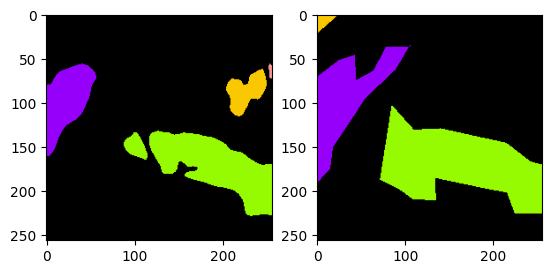

[2023-05-30 22:51:58 swanet_v5](182747771.py 311): INFO Test: [184/728]	Loss 0.4454 (0.4056)	PA@1 86.1755 (90.0733)	MPA@1 56.2554 (81.9591)	KAPPA@1 63.7434 (77.9086)	MIOU@1 39.8031 (71.0807)	FWIOU@1 77.7210 (85.0705)	Mem 44806MB


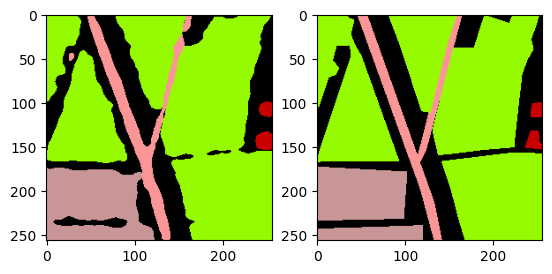

[2023-05-30 22:51:58 swanet_v5](182747771.py 311): INFO Test: [185/728]	Loss 0.1363 (0.4041)	PA@1 94.5633 (90.0974)	MPA@1 90.5307 (82.0052)	KAPPA@1 91.0465 (77.9792)	MIOU@1 84.7020 (71.1540)	FWIOU@1 89.9878 (85.0969)	Mem 44806MB


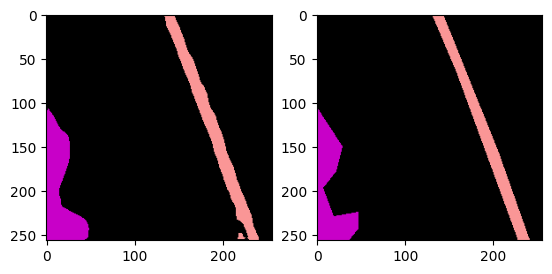

[2023-05-30 22:51:58 swanet_v5](182747771.py 311): INFO Test: [186/728]	Loss 0.0428 (0.4022)	PA@1 98.1781 (90.1406)	MPA@1 91.1930 (82.0543)	KAPPA@1 90.8088 (78.0478)	MIOU@1 88.9460 (71.2491)	FWIOU@1 96.4408 (85.1576)	Mem 44806MB


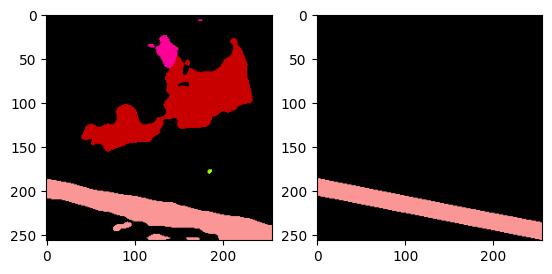

[2023-05-30 22:51:58 swanet_v5](182747771.py 311): INFO Test: [187/728]	Loss 0.4891 (0.4027)	PA@1 83.1223 (90.1033)	MPA@1 34.5524 (81.8016)	KAPPA@1 41.6359 (77.8541)	MIOU@1 30.4513 (71.0321)	FWIOU@1 69.3635 (85.0735)	Mem 44806MB


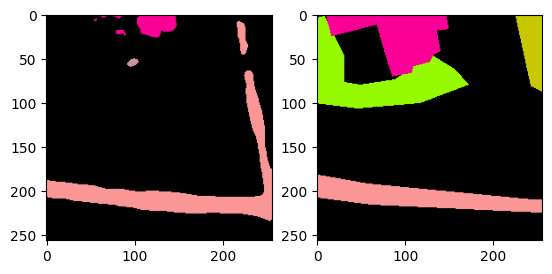

[2023-05-30 22:51:59 swanet_v5](182747771.py 311): INFO Test: [188/728]	Loss 1.7729 (0.4099)	PA@1 75.0687 (90.0238)	MPA@1 59.3857 (81.6830)	KAPPA@1 33.0349 (77.6170)	MIOU@1 25.0412 (70.7888)	FWIOU@1 70.1769 (84.9947)	Mem 44806MB


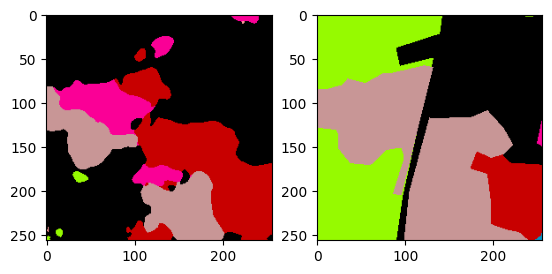

[2023-05-30 22:51:59 swanet_v5](182747771.py 311): INFO Test: [189/728]	Loss 2.6600 (0.4218)	PA@1 47.2687 (89.7987)	MPA@1 46.8048 (81.4994)	KAPPA@1 31.7080 (77.3754)	MIOU@1 17.0434 (70.5059)	FWIOU@1 37.6095 (84.7453)	Mem 44806MB


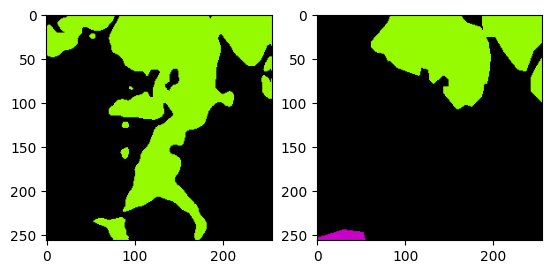

[2023-05-30 22:51:59 swanet_v5](182747771.py 311): INFO Test: [190/728]	Loss 0.7042 (0.4232)	PA@1 81.0059 (89.7527)	MPA@1 74.3089 (81.4618)	KAPPA@1 54.1676 (77.2539)	MIOU@1 42.2231 (70.3578)	FWIOU@1 67.3006 (84.6540)	Mem 44806MB


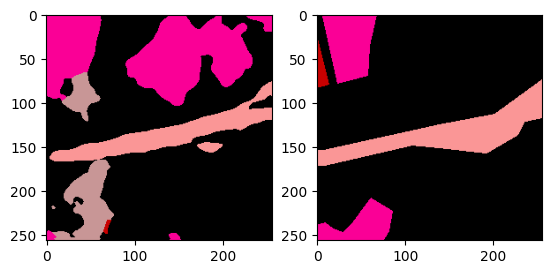

[2023-05-30 22:51:59 swanet_v5](182747771.py 311): INFO Test: [191/728]	Loss 1.0391 (0.4264)	PA@1 71.7545 (89.6590)	MPA@1 41.2602 (81.2524)	KAPPA@1 38.7729 (77.0534)	MIOU@1 31.2470 (70.1541)	FWIOU@1 54.5771 (84.4973)	Mem 44806MB


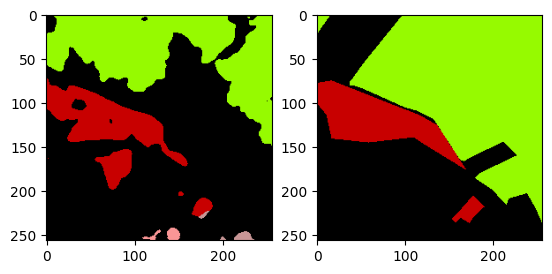

[2023-05-30 22:52:00 swanet_v5](182747771.py 311): INFO Test: [192/728]	Loss 1.2088 (0.4305)	PA@1 64.4485 (89.5283)	MPA@1 42.7490 (81.0529)	KAPPA@1 40.1299 (76.8621)	MIOU@1 31.0939 (69.9517)	FWIOU@1 48.7793 (84.3123)	Mem 44806MB


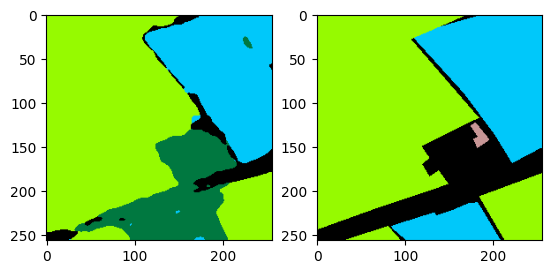

[2023-05-30 22:52:00 swanet_v5](182747771.py 311): INFO Test: [193/728]	Loss 0.8382 (0.4326)	PA@1 79.7745 (89.4781)	MPA@1 68.8975 (80.9903)	KAPPA@1 67.6856 (76.8148)	MIOU@1 39.0892 (69.7926)	FWIOU@1 71.4923 (84.2462)	Mem 44806MB


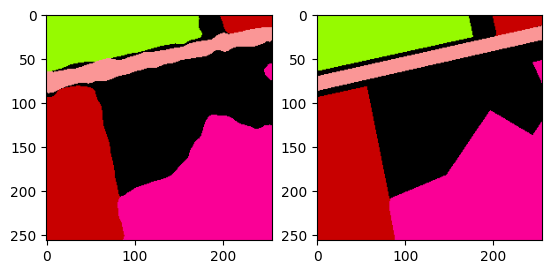

[2023-05-30 22:52:00 swanet_v5](182747771.py 311): INFO Test: [194/728]	Loss 0.0720 (0.4308)	PA@1 96.9696 (89.5165)	MPA@1 95.3680 (81.0640)	KAPPA@1 95.9836 (76.9131)	MIOU@1 93.3323 (69.9134)	FWIOU@1 94.1737 (84.2971)	Mem 44806MB


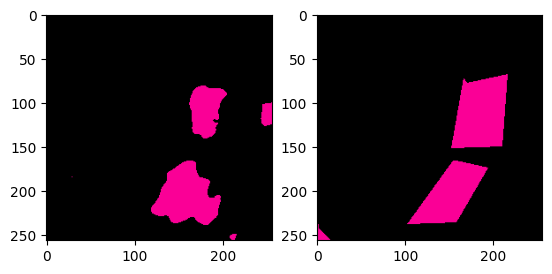

[2023-05-30 22:52:00 swanet_v5](182747771.py 311): INFO Test: [195/728]	Loss 0.2441 (0.4298)	PA@1 92.9367 (89.5339)	MPA@1 85.8012 (81.0882)	KAPPA@1 61.3830 (76.8339)	MIOU@1 70.4067 (69.9159)	FWIOU@1 88.6578 (84.3194)	Mem 44806MB


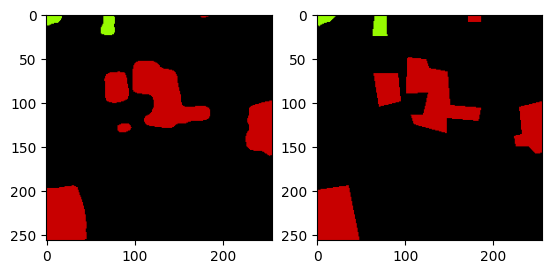

[2023-05-30 22:52:01 swanet_v5](182747771.py 311): INFO Test: [196/728]	Loss 0.0527 (0.4279)	PA@1 97.8897 (89.5763)	MPA@1 95.7226 (81.1624)	KAPPA@1 91.2284 (76.9069)	MIOU@1 89.2215 (70.0139)	FWIOU@1 95.9400 (84.3783)	Mem 44806MB


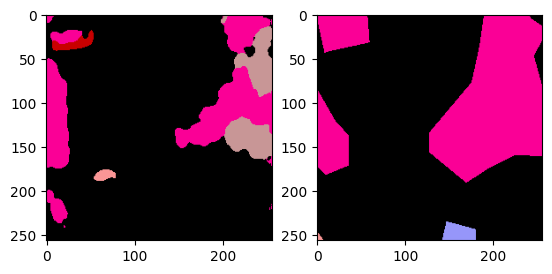

[2023-05-30 22:52:01 swanet_v5](182747771.py 311): INFO Test: [197/728]	Loss 0.8310 (0.4299)	PA@1 76.8188 (89.5119)	MPA@1 32.9974 (80.9192)	KAPPA@1 44.9221 (76.7454)	MIOU@1 19.2336 (69.7574)	FWIOU@1 67.2503 (84.2918)	Mem 44806MB


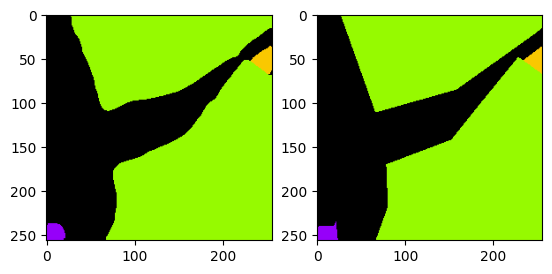

[2023-05-30 22:52:01 swanet_v5](182747771.py 311): INFO Test: [198/728]	Loss 0.0324 (0.4279)	PA@1 98.7122 (89.5581)	MPA@1 91.3165 (80.9714)	KAPPA@1 97.2878 (76.8486)	MIOU@1 88.0457 (69.8493)	FWIOU@1 97.4687 (84.3581)	Mem 44806MB


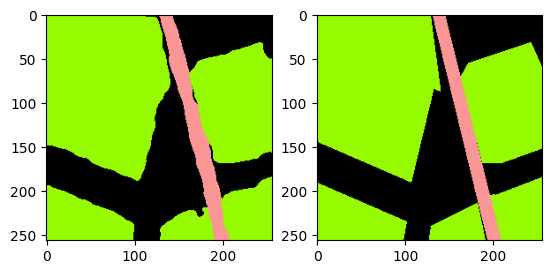

[2023-05-30 22:52:01 swanet_v5](182747771.py 311): INFO Test: [199/728]	Loss 0.0756 (0.4262)	PA@1 97.0764 (89.5957)	MPA@1 93.8226 (81.0357)	KAPPA@1 94.2622 (76.9357)	MIOU@1 90.9448 (69.9548)	FWIOU@1 94.3498 (84.4080)	Mem 44806MB


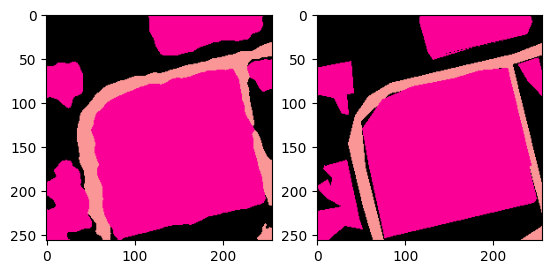

[2023-05-30 22:52:02 swanet_v5](182747771.py 311): INFO Test: [200/728]	Loss 0.1507 (0.4248)	PA@1 93.9194 (89.6172)	MPA@1 89.8698 (81.0796)	KAPPA@1 88.9961 (76.9957)	MIOU@1 84.0471 (70.0249)	FWIOU@1 88.7347 (84.4295)	Mem 44806MB


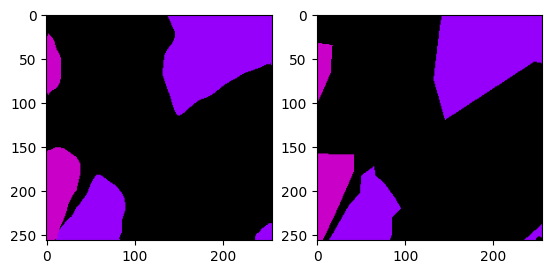

[2023-05-30 22:52:02 swanet_v5](182747771.py 311): INFO Test: [201/728]	Loss 0.0635 (0.4230)	PA@1 97.5098 (89.6563)	MPA@1 94.7870 (81.1475)	KAPPA@1 94.0387 (77.0801)	MIOU@1 91.3155 (70.1303)	FWIOU@1 95.1765 (84.4827)	Mem 44806MB


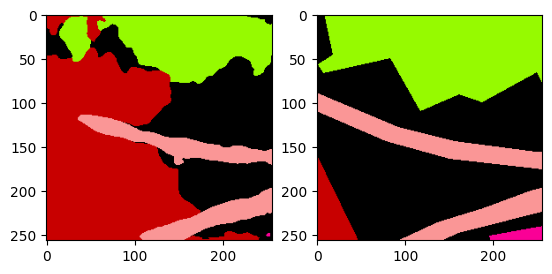

[2023-05-30 22:52:02 swanet_v5](182747771.py 311): INFO Test: [202/728]	Loss 2.8956 (0.4352)	PA@1 52.3010 (89.4723)	MPA@1 74.3357 (81.1139)	KAPPA@1 37.6636 (76.8859)	MIOU@1 35.3836 (69.9591)	FWIOU@1 32.0572 (84.2245)	Mem 44806MB


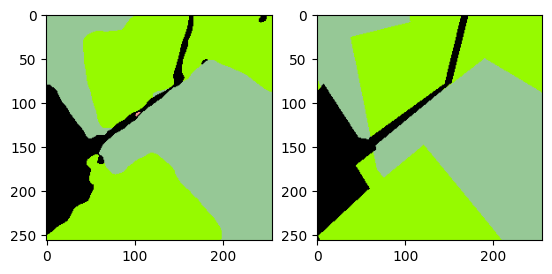

[2023-05-30 22:52:02 swanet_v5](182747771.py 311): INFO Test: [203/728]	Loss 0.0853 (0.4335)	PA@1 96.7148 (89.5078)	MPA@1 72.0884 (81.0697)	KAPPA@1 94.5081 (76.9723)	MIOU@1 69.0291 (69.9546)	FWIOU@1 93.6951 (84.2709)	Mem 44806MB


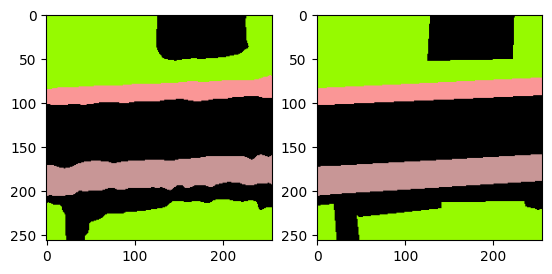

[2023-05-30 22:52:03 swanet_v5](182747771.py 311): INFO Test: [204/728]	Loss 0.0747 (0.4317)	PA@1 96.8674 (89.5437)	MPA@1 96.2250 (81.1436)	KAPPA@1 95.2276 (77.0613)	MIOU@1 93.2041 (70.0680)	FWIOU@1 93.9370 (84.3181)	Mem 44806MB


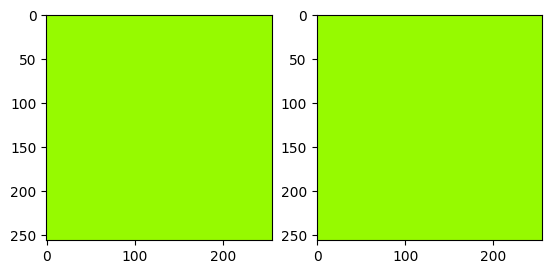

[2023-05-30 22:52:03 swanet_v5](182747771.py 311): INFO Test: [205/728]	Loss 0.0005 (0.4296)	PA@1 100.0000 (89.5945)	MPA@1 100.0000 (81.2352)	KAPPA@1 100.0000 (77.1727)	MIOU@1 100.0000 (70.2133)	FWIOU@1 100.0000 (84.3942)	Mem 44806MB


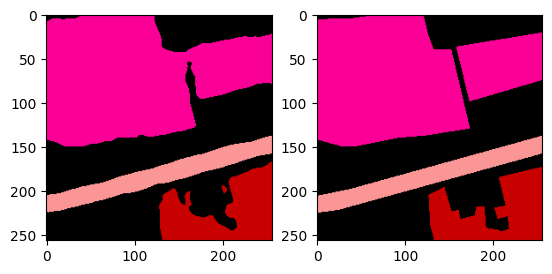

[2023-05-30 22:52:03 swanet_v5](182747771.py 311): INFO Test: [206/728]	Loss 0.0769 (0.4279)	PA@1 96.8704 (89.6296)	MPA@1 95.4800 (81.3040)	KAPPA@1 95.1573 (77.2596)	MIOU@1 92.5848 (70.3214)	FWIOU@1 93.9576 (84.4404)	Mem 44806MB


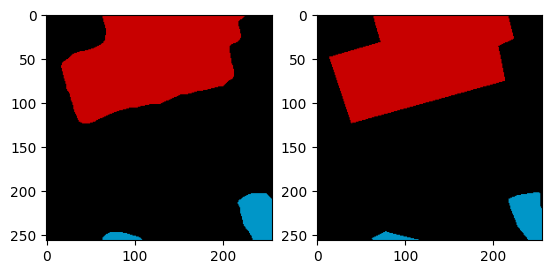

[2023-05-30 22:52:03 swanet_v5](182747771.py 311): INFO Test: [207/728]	Loss 0.0323 (0.4260)	PA@1 98.7350 (89.6734)	MPA@1 96.3246 (81.3762)	KAPPA@1 97.0729 (77.3548)	MIOU@1 94.8181 (70.4391)	FWIOU@1 97.5049 (84.5032)	Mem 44806MB


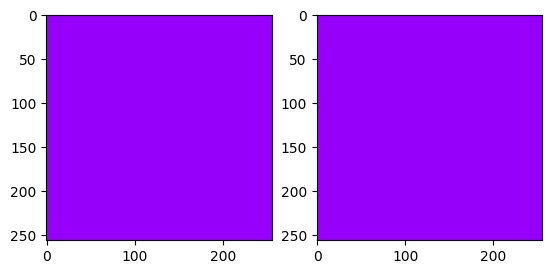

[2023-05-30 22:52:04 swanet_v5](182747771.py 311): INFO Test: [208/728]	Loss 0.0010 (0.4240)	PA@1 100.0000 (89.7228)	MPA@1 100.0000 (81.4653)	KAPPA@1 100.0000 (77.4632)	MIOU@1 100.0000 (70.5806)	FWIOU@1 100.0000 (84.5773)	Mem 44806MB


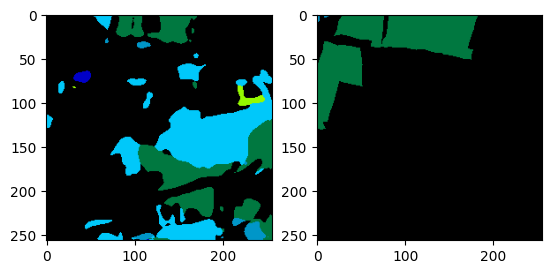

[2023-05-30 22:52:04 swanet_v5](182747771.py 311): INFO Test: [209/728]	Loss 1.2948 (0.4281)	PA@1 64.3158 (89.6018)	MPA@1 18.5897 (81.1659)	KAPPA@1 3.6080 (77.1115)	MIOU@1 12.8160 (70.3055)	FWIOU@1 46.8830 (84.3978)	Mem 44806MB


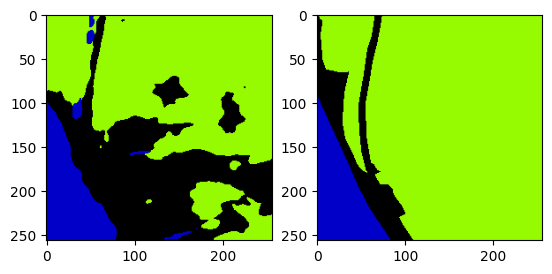

[2023-05-30 22:52:04 swanet_v5](182747771.py 311): INFO Test: [210/728]	Loss 1.0439 (0.4311)	PA@1 67.2363 (89.4958)	MPA@1 67.2035 (81.0997)	KAPPA@1 37.0240 (76.9215)	MIOU@1 55.0118 (70.2330)	FWIOU@1 48.4932 (84.2277)	Mem 44806MB


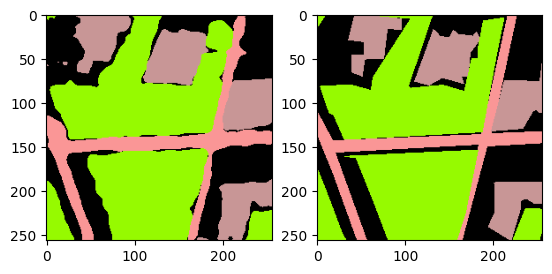

[2023-05-30 22:52:04 swanet_v5](182747771.py 311): INFO Test: [211/728]	Loss 0.2173 (0.4300)	PA@1 91.3132 (89.5044)	MPA@1 88.7610 (81.1359)	KAPPA@1 87.4114 (76.9710)	MIOU@1 82.0250 (70.2886)	FWIOU@1 84.4864 (84.2289)	Mem 44806MB


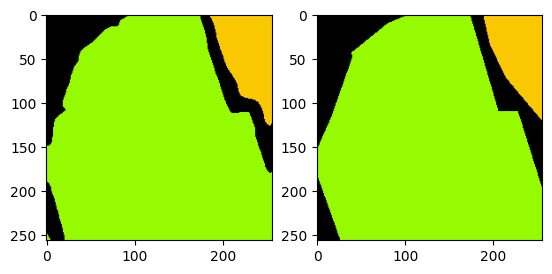

[2023-05-30 22:52:04 swanet_v5](182747771.py 311): INFO Test: [212/728]	Loss 0.0462 (0.4282)	PA@1 98.1339 (89.5449)	MPA@1 97.1002 (81.2108)	KAPPA@1 94.9487 (77.0554)	MIOU@1 93.3103 (70.3967)	FWIOU@1 96.4754 (84.2864)	Mem 44806MB


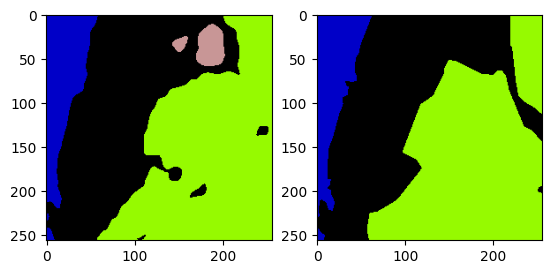

[2023-05-30 22:52:05 swanet_v5](182747771.py 311): INFO Test: [213/728]	Loss 0.2764 (0.4275)	PA@1 90.5228 (89.5495)	MPA@1 69.8354 (81.1577)	KAPPA@1 84.1360 (77.0885)	MIOU@1 64.7863 (70.3705)	FWIOU@1 82.6200 (84.2786)	Mem 44806MB


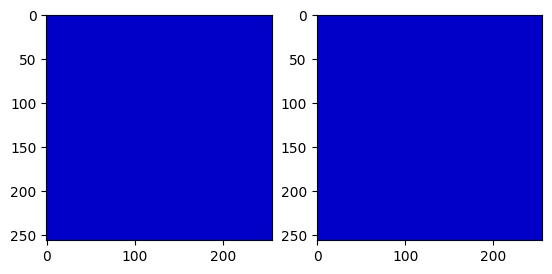

[2023-05-30 22:52:05 swanet_v5](182747771.py 311): INFO Test: [214/728]	Loss 0.0001 (0.4255)	PA@1 100.0000 (89.5981)	MPA@1 100.0000 (81.2453)	KAPPA@1 100.0000 (77.1950)	MIOU@1 100.0000 (70.5083)	FWIOU@1 100.0000 (84.3517)	Mem 44806MB


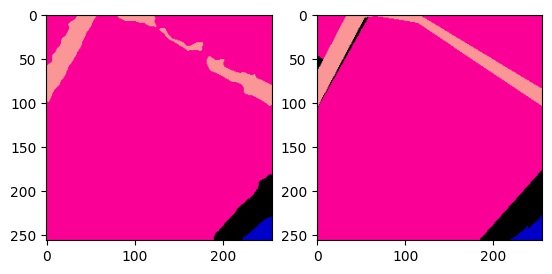

[2023-05-30 22:52:05 swanet_v5](182747771.py 311): INFO Test: [215/728]	Loss 0.0697 (0.4239)	PA@1 97.2351 (89.6334)	MPA@1 94.1053 (81.3048)	KAPPA@1 86.2453 (77.2370)	MIOU@1 84.4847 (70.5730)	FWIOU@1 95.0253 (84.4012)	Mem 44806MB


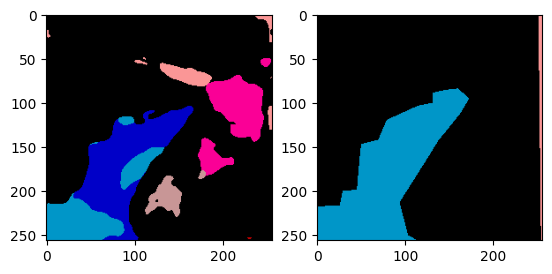

[2023-05-30 22:52:05 swanet_v5](182747771.py 311): INFO Test: [216/728]	Loss 0.7915 (0.4256)	PA@1 75.9155 (89.5702)	MPA@1 30.0408 (81.0686)	KAPPA@1 41.3872 (77.0717)	MIOU@1 18.2142 (70.3317)	FWIOU@1 63.0899 (84.3029)	Mem 44806MB


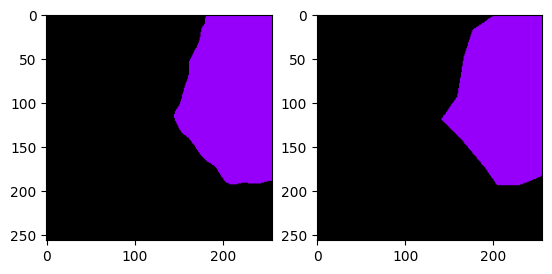

[2023-05-30 22:52:05 swanet_v5](182747771.py 311): INFO Test: [217/728]	Loss 0.0239 (0.4237)	PA@1 99.0189 (89.6136)	MPA@1 98.4017 (81.1481)	KAPPA@1 97.4283 (77.1651)	MIOU@1 97.4684 (70.4562)	FWIOU@1 98.0563 (84.3660)	Mem 44806MB


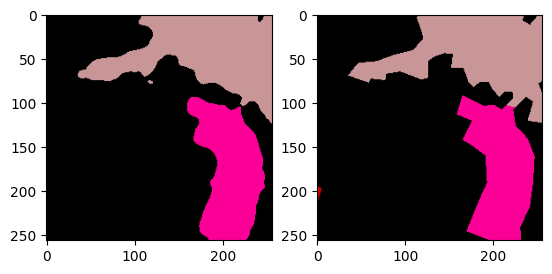

[2023-05-30 22:52:06 swanet_v5](182747771.py 311): INFO Test: [218/728]	Loss 0.0742 (0.4222)	PA@1 97.3419 (89.6488)	MPA@1 96.5958 (81.2186)	KAPPA@1 94.6542 (77.2450)	MIOU@1 70.3705 (70.4558)	FWIOU@1 94.9113 (84.4142)	Mem 44806MB


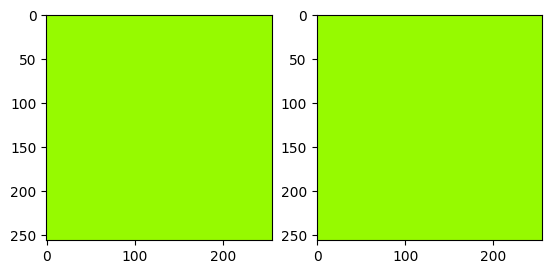

[2023-05-30 22:52:06 swanet_v5](182747771.py 311): INFO Test: [219/728]	Loss 0.0004 (0.4202)	PA@1 100.0000 (89.6959)	MPA@1 100.0000 (81.3040)	KAPPA@1 100.0000 (77.3484)	MIOU@1 100.0000 (70.5901)	FWIOU@1 100.0000 (84.4850)	Mem 44806MB


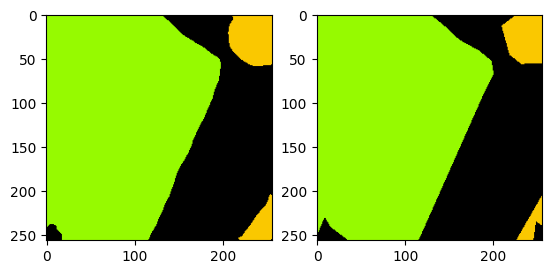

[2023-05-30 22:52:06 swanet_v5](182747771.py 311): INFO Test: [220/728]	Loss 0.0451 (0.4185)	PA@1 98.0804 (89.7338)	MPA@1 92.9313 (81.3566)	KAPPA@1 96.1722 (77.4336)	MIOU@1 91.0735 (70.6828)	FWIOU@1 96.2663 (84.5383)	Mem 44806MB


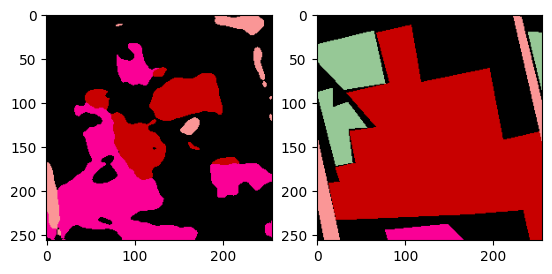

[2023-05-30 22:52:06 swanet_v5](182747771.py 311): INFO Test: [221/728]	Loss 3.8728 (0.4341)	PA@1 43.3609 (89.5250)	MPA@1 52.1206 (81.2249)	KAPPA@1 21.8594 (77.1833)	MIOU@1 21.4147 (70.4609)	FWIOU@1 32.9667 (84.3060)	Mem 44806MB


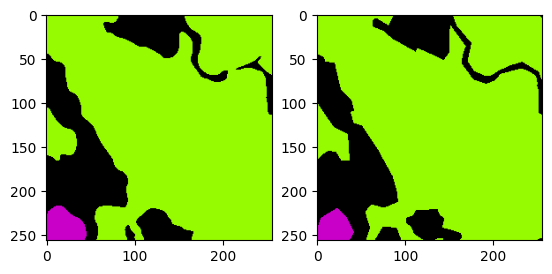

[2023-05-30 22:52:06 swanet_v5](182747771.py 311): INFO Test: [222/728]	Loss 0.0855 (0.4325)	PA@1 96.1914 (89.5548)	MPA@1 89.3164 (81.2612)	KAPPA@1 89.9916 (77.2407)	MIOU@1 85.7467 (70.5294)	FWIOU@1 92.7762 (84.3440)	Mem 44806MB


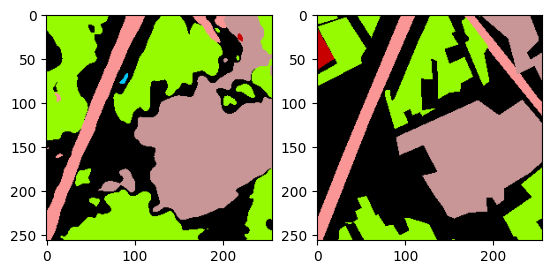

[2023-05-30 22:52:07 swanet_v5](182747771.py 311): INFO Test: [223/728]	Loss 0.8908 (0.4346)	PA@1 72.9446 (89.4807)	MPA@1 50.1351 (81.1223)	KAPPA@1 62.0366 (77.1728)	MIOU@1 40.1699 (70.3939)	FWIOU@1 59.0754 (84.2312)	Mem 44806MB


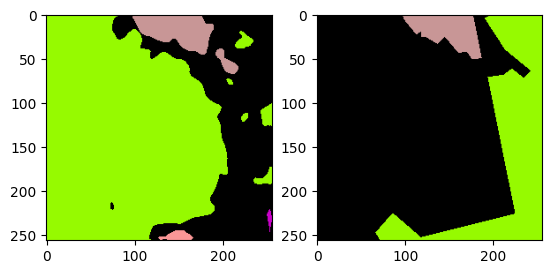

[2023-05-30 22:52:07 swanet_v5](182747771.py 311): INFO Test: [224/728]	Loss 5.1341 (0.4555)	PA@1 16.7831 (89.1576)	MPA@1 24.3636 (80.8700)	KAPPA@1 -29.6811 (76.6979)	MIOU@1 18.5883 (70.1636)	FWIOU@1 8.9247 (83.8965)	Mem 44806MB


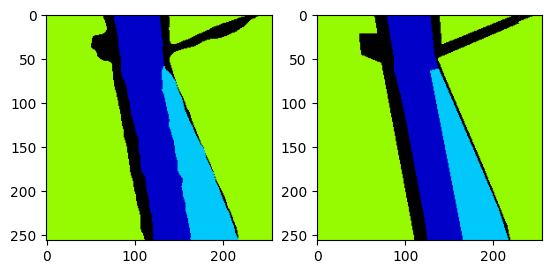

[2023-05-30 22:52:07 swanet_v5](182747771.py 311): INFO Test: [225/728]	Loss 0.0574 (0.4537)	PA@1 97.6257 (89.1951)	MPA@1 96.6161 (80.9397)	KAPPA@1 95.6089 (76.7816)	MIOU@1 91.8373 (70.2596)	FWIOU@1 95.6345 (83.9485)	Mem 44806MB


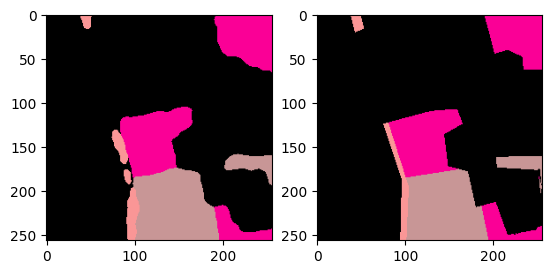

[2023-05-30 22:52:07 swanet_v5](182747771.py 311): INFO Test: [226/728]	Loss 0.0776 (0.4520)	PA@1 96.7773 (89.2285)	MPA@1 69.5138 (80.8893)	KAPPA@1 92.3812 (76.8503)	MIOU@1 65.5316 (70.2387)	FWIOU@1 93.9318 (83.9924)	Mem 44806MB


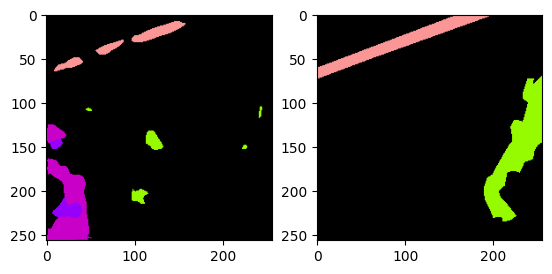

[2023-05-30 22:52:07 swanet_v5](182747771.py 311): INFO Test: [227/728]	Loss 0.4147 (0.4519)	PA@1 85.8978 (89.2139)	MPA@1 40.2519 (80.7111)	KAPPA@1 15.6808 (76.5820)	MIOU@1 26.0483 (70.0449)	FWIOU@1 79.9066 (83.9745)	Mem 44806MB


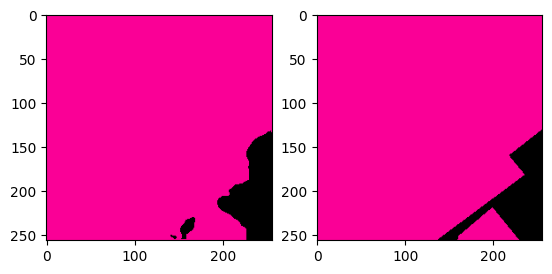

[2023-05-30 22:52:08 swanet_v5](182747771.py 311): INFO Test: [228/728]	Loss 0.0331 (0.4501)	PA@1 98.6099 (89.2549)	MPA@1 97.1184 (80.7827)	KAPPA@1 89.7948 (76.6397)	MIOU@1 90.6154 (70.1347)	FWIOU@1 97.4092 (84.0332)	Mem 44806MB


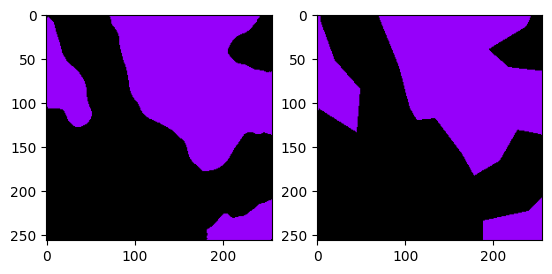

[2023-05-30 22:52:08 swanet_v5](182747771.py 311): INFO Test: [229/728]	Loss 0.0666 (0.4484)	PA@1 97.4213 (89.2904)	MPA@1 97.1998 (80.8541)	KAPPA@1 94.6747 (76.7181)	MIOU@1 94.8166 (70.2420)	FWIOU@1 94.9687 (84.0807)	Mem 44806MB


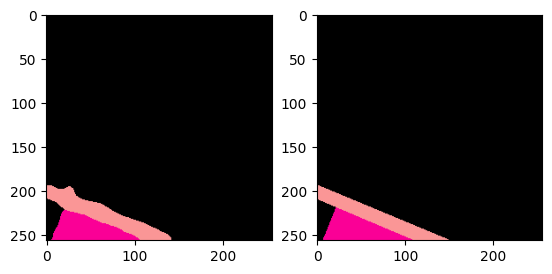

[2023-05-30 22:52:08 swanet_v5](182747771.py 311): INFO Test: [230/728]	Loss 0.0201 (0.4465)	PA@1 99.2126 (89.3333)	MPA@1 93.2923 (80.9080)	KAPPA@1 93.6681 (76.7915)	MIOU@1 91.5647 (70.3344)	FWIOU@1 98.4585 (84.1430)	Mem 44806MB


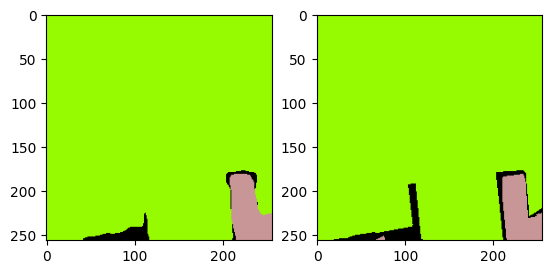

[2023-05-30 22:52:08 swanet_v5](182747771.py 311): INFO Test: [231/728]	Loss 0.0394 (0.4448)	PA@1 98.3917 (89.3724)	MPA@1 93.9191 (80.9641)	KAPPA@1 85.9360 (76.8309)	MIOU@1 78.8102 (70.3709)	FWIOU@1 97.5476 (84.2007)	Mem 44806MB


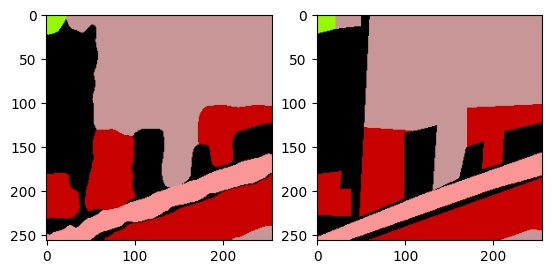

[2023-05-30 22:52:09 swanet_v5](182747771.py 311): INFO Test: [232/728]	Loss 0.1084 (0.4433)	PA@1 95.4819 (89.3986)	MPA@1 93.7932 (81.0191)	KAPPA@1 93.5449 (76.9027)	MIOU@1 89.4769 (70.4529)	FWIOU@1 91.5056 (84.2321)	Mem 44806MB


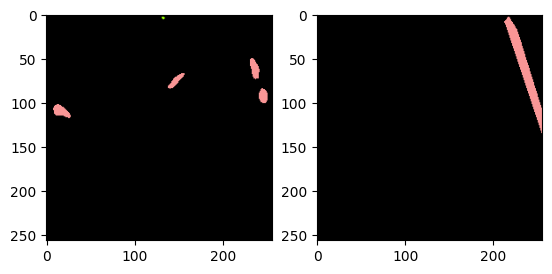

[2023-05-30 22:52:09 swanet_v5](182747771.py 311): INFO Test: [233/728]	Loss 0.0702 (0.4417)	PA@1 98.0438 (89.4356)	MPA@1 48.4523 (80.8799)	KAPPA@1 30.4877 (76.7043)	MIOU@1 38.9150 (70.3181)	FWIOU@1 97.2639 (84.2878)	Mem 44806MB


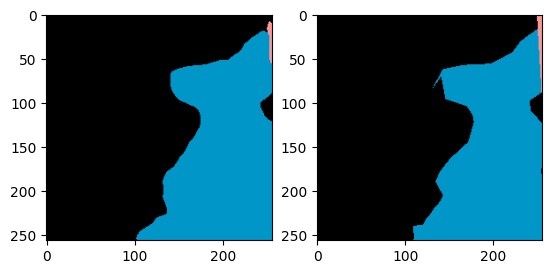

[2023-05-30 22:52:09 swanet_v5](182747771.py 311): INFO Test: [234/728]	Loss 0.0456 (0.4401)	PA@1 98.3078 (89.4733)	MPA@1 98.5734 (80.9552)	KAPPA@1 96.3113 (76.7877)	MIOU@1 58.7099 (70.2687)	FWIOU@1 96.8654 (84.3413)	Mem 44806MB


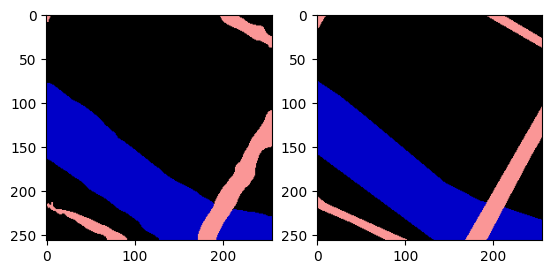

[2023-05-30 22:52:09 swanet_v5](182747771.py 311): INFO Test: [235/728]	Loss 0.0586 (0.4384)	PA@1 97.4777 (89.5072)	MPA@1 94.3143 (81.0118)	KAPPA@1 94.5415 (76.8630)	MIOU@1 90.8965 (70.3561)	FWIOU@1 95.1490 (84.3871)	Mem 44806MB


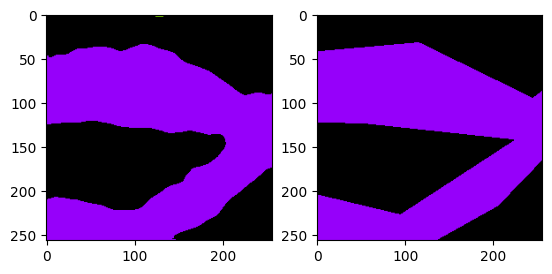

[2023-05-30 22:52:09 swanet_v5](182747771.py 311): INFO Test: [236/728]	Loss 0.0734 (0.4369)	PA@1 97.0734 (89.5392)	MPA@1 64.7436 (80.9432)	KAPPA@1 94.1485 (76.9359)	MIOU@1 62.9023 (70.3247)	FWIOU@1 94.3120 (84.4290)	Mem 44806MB


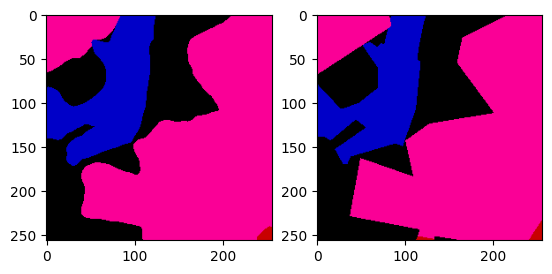

[2023-05-30 22:52:10 swanet_v5](182747771.py 311): INFO Test: [237/728]	Loss 0.0826 (0.4354)	PA@1 96.6736 (89.5691)	MPA@1 93.7882 (80.9972)	KAPPA@1 94.3041 (77.0089)	MIOU@1 84.2702 (70.3833)	FWIOU@1 93.6770 (84.4678)	Mem 44806MB


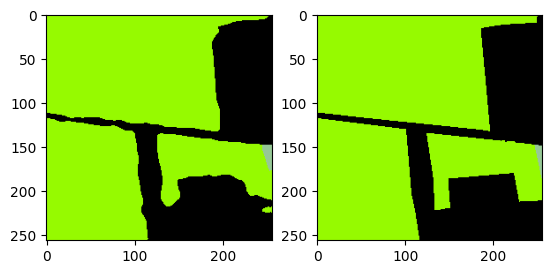

[2023-05-30 22:52:10 swanet_v5](182747771.py 311): INFO Test: [238/728]	Loss 0.0544 (0.4338)	PA@1 97.8241 (89.6037)	MPA@1 92.0456 (81.0434)	KAPPA@1 95.0122 (77.0842)	MIOU@1 87.5657 (70.4552)	FWIOU@1 95.7614 (84.5151)	Mem 44806MB


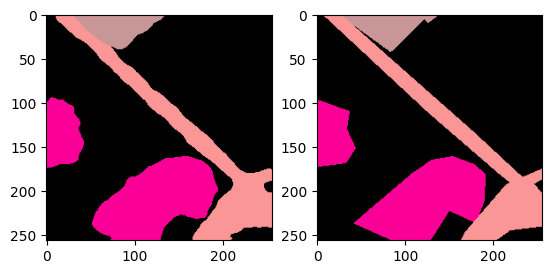

[2023-05-30 22:52:10 swanet_v5](182747771.py 311): INFO Test: [239/728]	Loss 0.0735 (0.4323)	PA@1 96.9894 (89.6344)	MPA@1 95.1893 (81.1023)	KAPPA@1 94.1835 (77.1554)	MIOU@1 92.3047 (70.5462)	FWIOU@1 94.1610 (84.5553)	Mem 44806MB


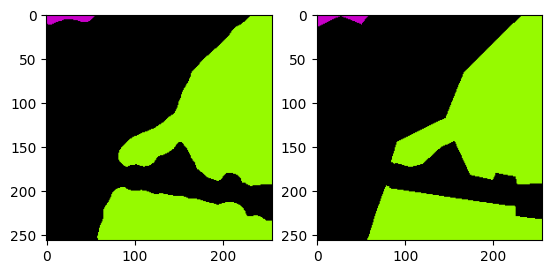

[2023-05-30 22:52:10 swanet_v5](182747771.py 311): INFO Test: [240/728]	Loss 0.0414 (0.4307)	PA@1 98.4497 (89.6710)	MPA@1 94.5064 (81.1580)	KAPPA@1 96.8353 (77.2371)	MIOU@1 90.4238 (70.6287)	FWIOU@1 96.9585 (84.6067)	Mem 44806MB


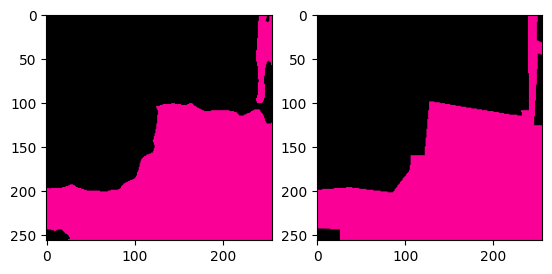

[2023-05-30 22:52:10 swanet_v5](182747771.py 311): INFO Test: [241/728]	Loss 0.0372 (0.4291)	PA@1 98.4802 (89.7074)	MPA@1 98.3946 (81.2292)	KAPPA@1 96.9062 (77.3184)	MIOU@1 96.9540 (70.7375)	FWIOU@1 97.0049 (84.6580)	Mem 44806MB


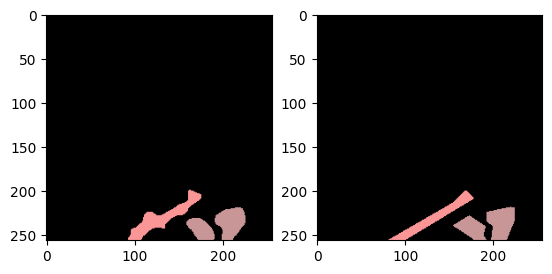

[2023-05-30 22:52:11 swanet_v5](182747771.py 311): INFO Test: [242/728]	Loss 0.0278 (0.4274)	PA@1 98.8754 (89.7452)	MPA@1 87.6849 (81.2557)	KAPPA@1 85.1711 (77.3507)	MIOU@1 82.1700 (70.7845)	FWIOU@1 97.8652 (84.7123)	Mem 44806MB


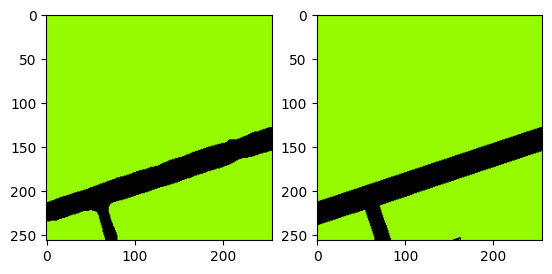

[2023-05-30 22:52:11 swanet_v5](182747771.py 311): INFO Test: [243/728]	Loss 0.0222 (0.4258)	PA@1 99.1913 (89.7839)	MPA@1 99.3469 (81.3299)	KAPPA@1 96.0184 (77.4272)	MIOU@1 64.0974 (70.7571)	FWIOU@1 98.4360 (84.7686)	Mem 44806MB


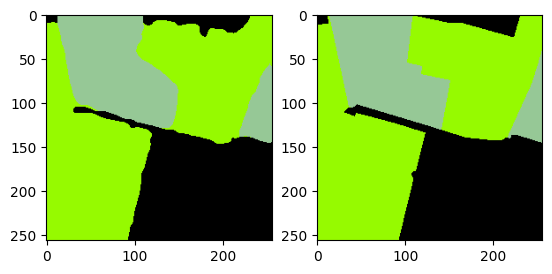

[2023-05-30 22:52:11 swanet_v5](182747771.py 311): INFO Test: [244/728]	Loss 0.0755 (0.4243)	PA@1 97.0566 (89.8136)	MPA@1 96.4397 (81.3916)	KAPPA@1 95.2983 (77.5001)	MIOU@1 93.9567 (70.8518)	FWIOU@1 94.2723 (84.8074)	Mem 44806MB


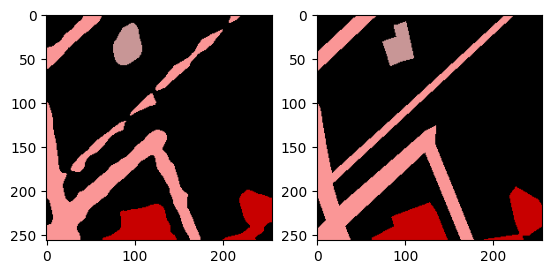

[2023-05-30 22:52:11 swanet_v5](182747771.py 311): INFO Test: [245/728]	Loss 0.0964 (0.4230)	PA@1 95.8771 (89.8382)	MPA@1 92.5885 (81.4371)	KAPPA@1 89.1620 (77.5476)	MIOU@1 86.8286 (70.9167)	FWIOU@1 92.2354 (84.8376)	Mem 44806MB


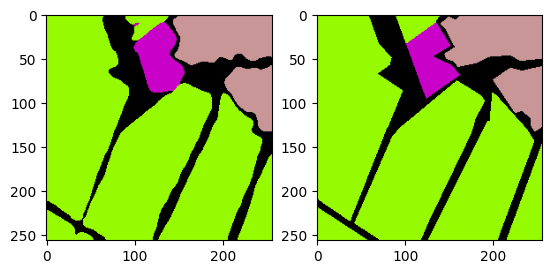

[2023-05-30 22:52:11 swanet_v5](182747771.py 311): INFO Test: [246/728]	Loss 0.0991 (0.4217)	PA@1 95.8054 (89.8624)	MPA@1 92.7744 (81.4830)	KAPPA@1 91.8319 (77.6054)	MIOU@1 88.1639 (70.9866)	FWIOU@1 92.1860 (84.8673)	Mem 44806MB


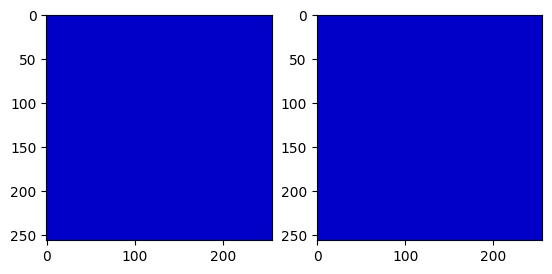

[2023-05-30 22:52:12 swanet_v5](182747771.py 311): INFO Test: [247/728]	Loss 0.0006 (0.4200)	PA@1 100.0000 (89.9032)	MPA@1 100.0000 (81.5576)	KAPPA@1 100.0000 (77.6957)	MIOU@1 100.0000 (71.1036)	FWIOU@1 100.0000 (84.9283)	Mem 44806MB


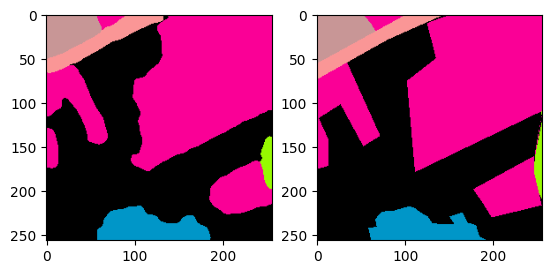

[2023-05-30 22:52:12 swanet_v5](182747771.py 311): INFO Test: [248/728]	Loss 0.0924 (0.4187)	PA@1 96.4844 (89.9297)	MPA@1 93.0509 (81.6038)	KAPPA@1 94.2971 (77.7624)	MIOU@1 87.9222 (71.1711)	FWIOU@1 93.2492 (84.9617)	Mem 44806MB


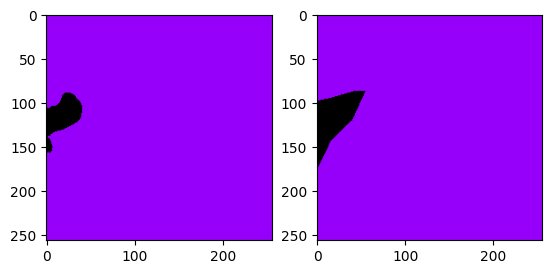

[2023-05-30 22:52:12 swanet_v5](182747771.py 311): INFO Test: [249/728]	Loss 0.0310 (0.4171)	PA@1 98.6435 (89.9645)	MPA@1 98.1566 (81.6700)	KAPPA@1 74.8422 (77.7507)	MIOU@1 79.6304 (71.2049)	FWIOU@1 97.8017 (85.0131)	Mem 44806MB


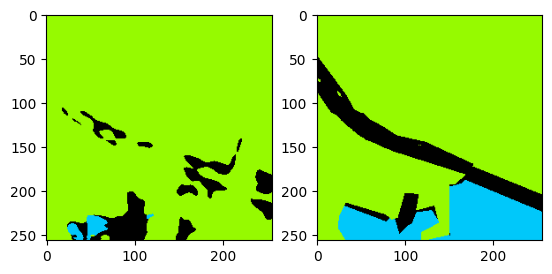

[2023-05-30 22:52:12 swanet_v5](182747771.py 311): INFO Test: [250/728]	Loss 1.0628 (0.4197)	PA@1 78.7811 (89.9200)	MPA@1 73.5371 (81.6376)	KAPPA@1 27.8072 (77.5517)	MIOU@1 36.0232 (71.0648)	FWIOU@1 74.9431 (84.9730)	Mem 44806MB


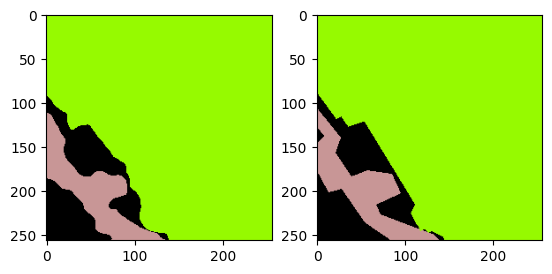

[2023-05-30 22:52:12 swanet_v5](182747771.py 311): INFO Test: [251/728]	Loss 0.0550 (0.4182)	PA@1 97.7325 (89.9510)	MPA@1 94.2476 (81.6876)	KAPPA@1 93.1425 (77.6136)	MIOU@1 88.2949 (71.1331)	FWIOU@1 95.8243 (85.0160)	Mem 44806MB


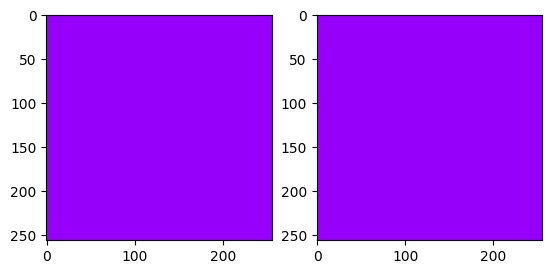

[2023-05-30 22:52:13 swanet_v5](182747771.py 311): INFO Test: [252/728]	Loss 0.0015 (0.4166)	PA@1 100.0000 (89.9907)	MPA@1 100.0000 (81.7600)	KAPPA@1 100.0000 (77.7021)	MIOU@1 100.0000 (71.2472)	FWIOU@1 100.0000 (85.0753)	Mem 44806MB


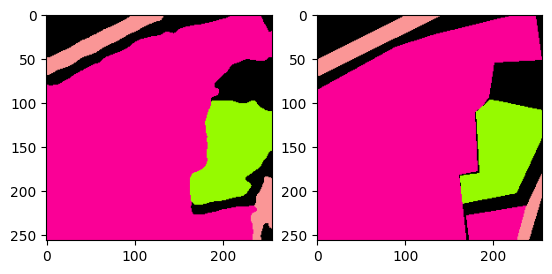

[2023-05-30 22:52:13 swanet_v5](182747771.py 311): INFO Test: [253/728]	Loss 0.0897 (0.4153)	PA@1 96.4020 (90.0159)	MPA@1 93.3973 (81.8058)	KAPPA@1 92.8895 (77.7618)	MIOU@1 87.8835 (71.3127)	FWIOU@1 93.3567 (85.1079)	Mem 44806MB


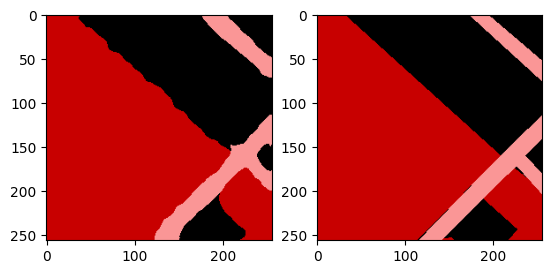

[2023-05-30 22:52:13 swanet_v5](182747771.py 311): INFO Test: [254/728]	Loss 0.0673 (0.4139)	PA@1 97.7295 (90.0462)	MPA@1 95.6079 (81.8600)	KAPPA@1 95.8439 (77.8328)	MIOU@1 92.7512 (71.3968)	FWIOU@1 95.6082 (85.1491)	Mem 44806MB


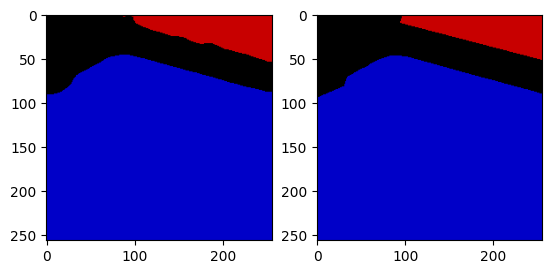

[2023-05-30 22:52:13 swanet_v5](182747771.py 311): INFO Test: [255/728]	Loss 0.0189 (0.4124)	PA@1 99.2783 (90.0822)	MPA@1 98.3792 (81.9245)	KAPPA@1 98.2704 (77.9126)	MIOU@1 96.9223 (71.4965)	FWIOU@1 98.5848 (85.2015)	Mem 44806MB


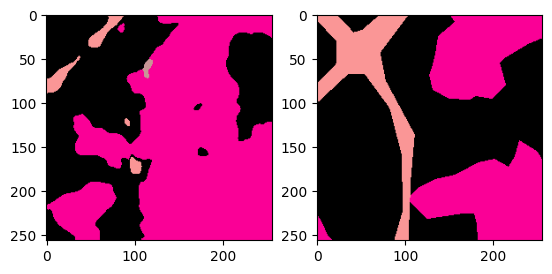

[2023-05-30 22:52:14 swanet_v5](182747771.py 311): INFO Test: [256/728]	Loss 1.5841 (0.4170)	PA@1 60.1700 (89.9658)	MPA@1 55.0224 (81.8198)	KAPPA@1 32.1463 (77.7345)	MIOU@1 27.0709 (71.3237)	FWIOU@1 45.0135 (85.0452)	Mem 44806MB


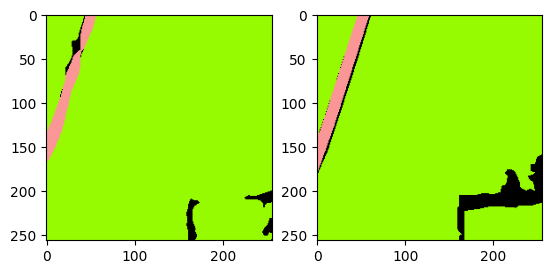

[2023-05-30 22:52:14 swanet_v5](182747771.py 311): INFO Test: [257/728]	Loss 0.1901 (0.4161)	PA@1 94.8120 (89.9846)	MPA@1 82.3322 (81.8218)	KAPPA@1 56.8566 (77.6536)	MIOU@1 62.8502 (71.2908)	FWIOU@1 93.1014 (85.0764)	Mem 44806MB


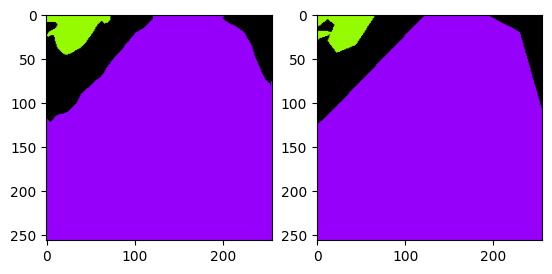

[2023-05-30 22:52:14 swanet_v5](182747771.py 311): INFO Test: [258/728]	Loss 0.0416 (0.4146)	PA@1 98.1720 (90.0162)	MPA@1 92.5324 (81.8632)	KAPPA@1 93.1761 (77.7135)	MIOU@1 89.1716 (71.3599)	FWIOU@1 96.4919 (85.1205)	Mem 44806MB


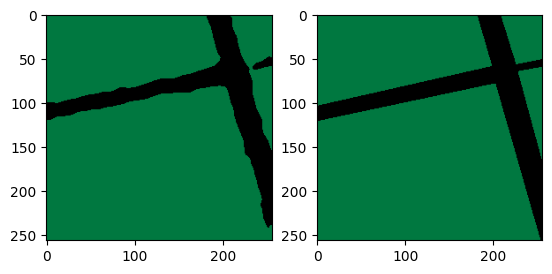

[2023-05-30 22:52:14 swanet_v5](182747771.py 311): INFO Test: [259/728]	Loss 0.0464 (0.4132)	PA@1 98.0545 (90.0472)	MPA@1 97.0566 (81.9216)	KAPPA@1 92.3758 (77.7699)	MIOU@1 92.7825 (71.4422)	FWIOU@1 96.2825 (85.1634)	Mem 44806MB


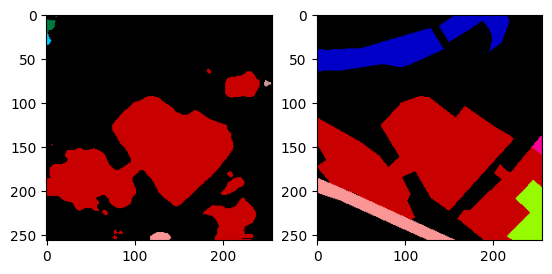

[2023-05-30 22:52:15 swanet_v5](182747771.py 311): INFO Test: [260/728]	Loss 1.2291 (0.4163)	PA@1 75.6317 (89.9919)	MPA@1 41.9994 (81.7686)	KAPPA@1 53.8566 (77.6783)	MIOU@1 16.0496 (71.2300)	FWIOU@1 68.3358 (85.0989)	Mem 44806MB


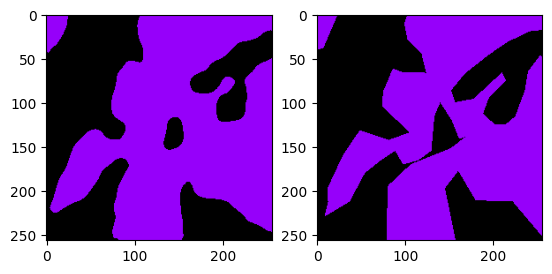

[2023-05-30 22:52:15 swanet_v5](182747771.py 311): INFO Test: [261/728]	Loss 0.1777 (0.4154)	PA@1 92.5308 (90.0016)	MPA@1 93.4917 (81.8134)	KAPPA@1 84.8568 (77.7057)	MIOU@1 85.8873 (71.2860)	FWIOU@1 86.2234 (85.1032)	Mem 44806MB


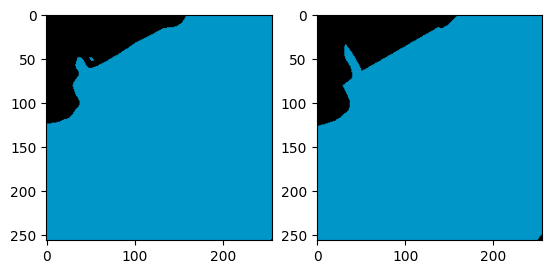

[2023-05-30 22:52:15 swanet_v5](182747771.py 311): INFO Test: [262/728]	Loss 0.0206 (0.4139)	PA@1 99.2386 (90.0367)	MPA@1 98.6788 (81.8775)	KAPPA@1 96.6579 (77.7777)	MIOU@1 96.7417 (71.3827)	FWIOU@1 98.5073 (85.1542)	Mem 44806MB


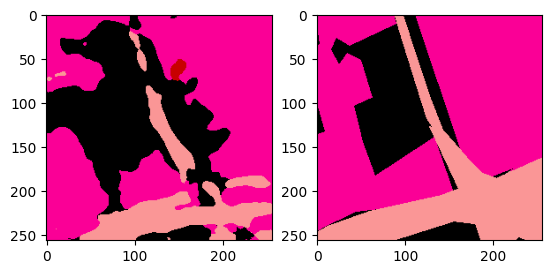

[2023-05-30 22:52:15 swanet_v5](182747771.py 311): INFO Test: [263/728]	Loss 0.8829 (0.4157)	PA@1 75.2960 (89.9809)	MPA@1 57.9229 (81.7868)	KAPPA@1 59.1711 (77.7073)	MIOU@1 34.8110 (71.2442)	FWIOU@1 60.0503 (85.0591)	Mem 44806MB


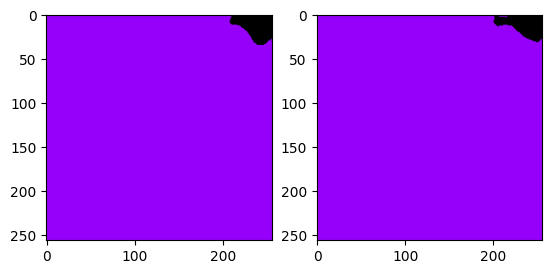

[2023-05-30 22:52:16 swanet_v5](182747771.py 311): INFO Test: [264/728]	Loss 0.0074 (0.4142)	PA@1 99.6918 (90.0176)	MPA@1 95.0049 (81.8367)	KAPPA@1 90.8734 (77.7570)	MIOU@1 91.6120 (71.3211)	FWIOU@1 99.4067 (85.1132)	Mem 44806MB


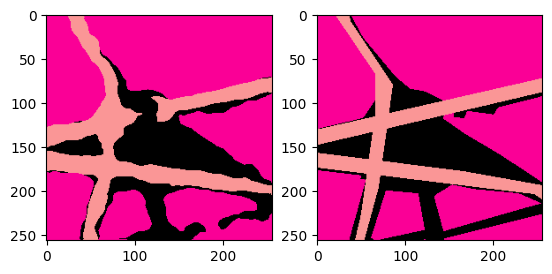

[2023-05-30 22:52:16 swanet_v5](182747771.py 311): INFO Test: [265/728]	Loss 0.1880 (0.4133)	PA@1 91.9128 (90.0247)	MPA@1 88.3665 (81.8612)	KAPPA@1 85.6680 (77.7867)	MIOU@1 80.7070 (71.3564)	FWIOU@1 85.4600 (85.1145)	Mem 44806MB


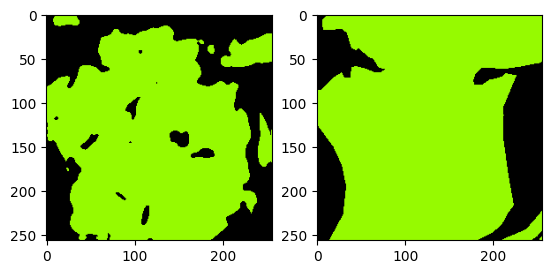

[2023-05-30 22:52:16 swanet_v5](182747771.py 311): INFO Test: [266/728]	Loss 0.6739 (0.4143)	PA@1 80.3787 (89.9885)	MPA@1 73.2061 (81.8288)	KAPPA@1 50.8936 (77.6860)	MIOU@1 61.4602 (71.3193)	FWIOU@1 66.6887 (85.0455)	Mem 44806MB


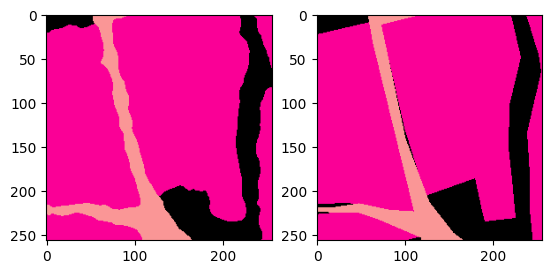

[2023-05-30 22:52:16 swanet_v5](182747771.py 311): INFO Test: [267/728]	Loss 0.1001 (0.4131)	PA@1 95.9213 (90.0107)	MPA@1 92.4137 (81.8683)	KAPPA@1 89.9952 (77.7319)	MIOU@1 87.1110 (71.3782)	FWIOU@1 92.2787 (85.0725)	Mem 44806MB


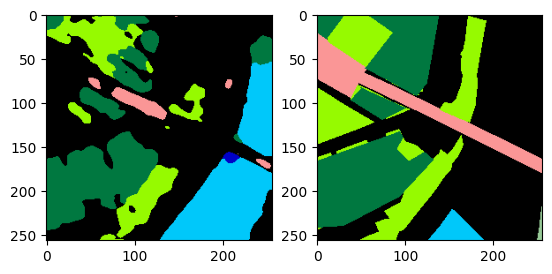

[2023-05-30 22:52:16 swanet_v5](182747771.py 311): INFO Test: [268/728]	Loss 1.8152 (0.4183)	PA@1 59.8419 (89.8985)	MPA@1 52.6953 (81.7598)	KAPPA@1 40.4534 (77.5933)	MIOU@1 25.3413 (71.2071)	FWIOU@1 42.8967 (84.9157)	Mem 44806MB


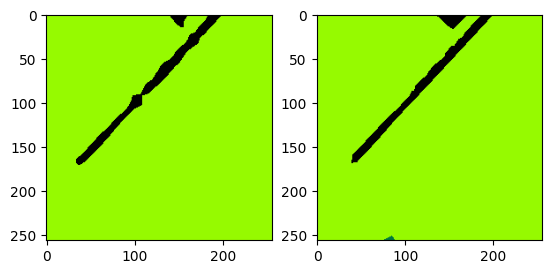

[2023-05-30 22:52:17 swanet_v5](182747771.py 311): INFO Test: [269/728]	Loss 0.0262 (0.4169)	PA@1 99.1470 (89.9328)	MPA@1 94.4271 (81.8067)	KAPPA@1 87.8733 (77.6314)	MIOU@1 59.7264 (71.1646)	FWIOU@1 98.4312 (84.9658)	Mem 44806MB


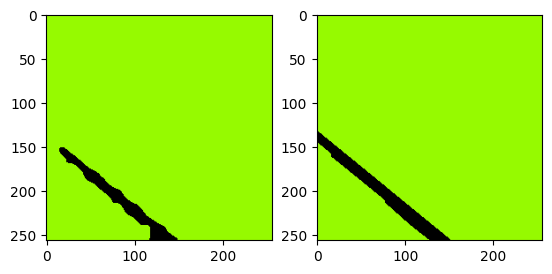

[2023-05-30 22:52:17 swanet_v5](182747771.py 311): INFO Test: [270/728]	Loss 0.0277 (0.4154)	PA@1 98.9334 (89.9660)	MPA@1 97.5747 (81.8649)	KAPPA@1 83.4875 (77.6530)	MIOU@1 85.6806 (71.2181)	FWIOU@1 98.1307 (85.0144)	Mem 44806MB


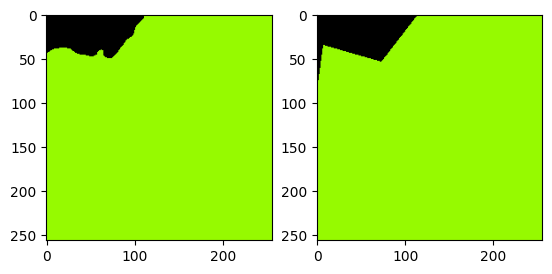

[2023-05-30 22:52:17 swanet_v5](182747771.py 311): INFO Test: [271/728]	Loss 0.0161 (0.4140)	PA@1 99.4598 (90.0009)	MPA@1 99.0760 (81.9282)	KAPPA@1 95.6587 (77.7192)	MIOU@1 95.8171 (71.3086)	FWIOU@1 98.9554 (85.0656)	Mem 44806MB


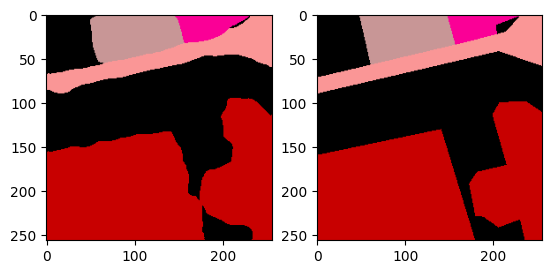

[2023-05-30 22:52:17 swanet_v5](182747771.py 311): INFO Test: [272/728]	Loss 0.0783 (0.4127)	PA@1 96.6690 (90.0253)	MPA@1 95.2885 (81.9771)	KAPPA@1 94.9477 (77.7823)	MIOU@1 92.7899 (71.3872)	FWIOU@1 93.5841 (85.0968)	Mem 44806MB


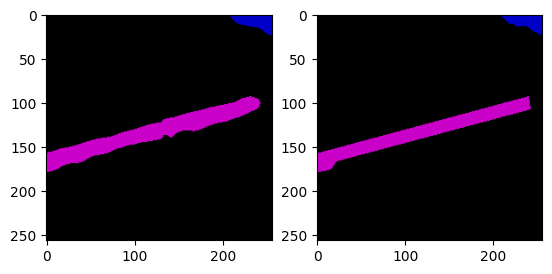

[2023-05-30 22:52:18 swanet_v5](182747771.py 311): INFO Test: [273/728]	Loss 0.0315 (0.4114)	PA@1 98.5886 (90.0566)	MPA@1 93.0878 (82.0177)	KAPPA@1 89.9604 (77.8268)	MIOU@1 91.6341 (71.4611)	FWIOU@1 97.2105 (85.1410)	Mem 44806MB


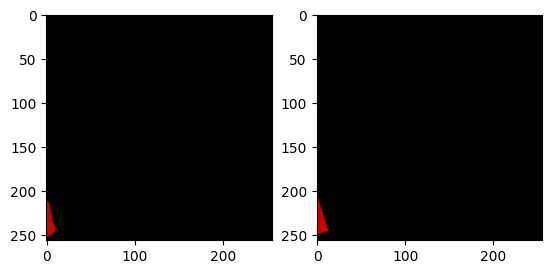

[2023-05-30 22:52:18 swanet_v5](182747771.py 311): INFO Test: [274/728]	Loss 0.0032 (0.4099)	PA@1 99.9039 (90.0924)	MPA@1 95.5257 (82.0668)	KAPPA@1 88.6004 (77.8659)	MIOU@1 89.7576 (71.5277)	FWIOU@1 99.8199 (85.1944)	Mem 44806MB


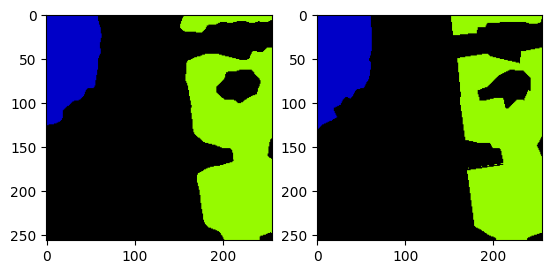

[2023-05-30 22:52:18 swanet_v5](182747771.py 311): INFO Test: [275/728]	Loss 0.0550 (0.4086)	PA@1 97.9370 (90.1208)	MPA@1 97.8695 (82.1241)	KAPPA@1 95.8935 (77.9313)	MIOU@1 95.6910 (71.6152)	FWIOU@1 95.9704 (85.2335)	Mem 44806MB


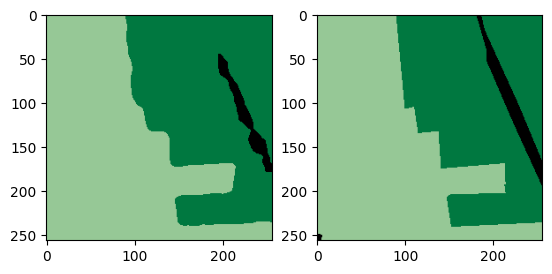

[2023-05-30 22:52:18 swanet_v5](182747771.py 311): INFO Test: [276/728]	Loss 0.0592 (0.4073)	PA@1 97.7432 (90.1483)	MPA@1 96.3236 (82.1753)	KAPPA@1 95.6839 (77.9953)	MIOU@1 84.2006 (71.6607)	FWIOU@1 96.0675 (85.2726)	Mem 44806MB


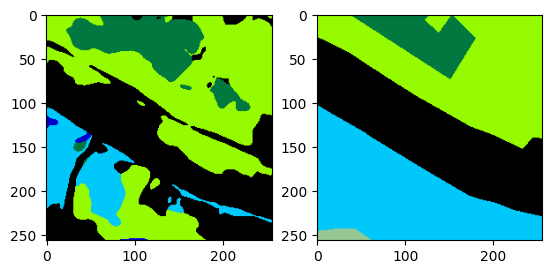

[2023-05-30 22:52:18 swanet_v5](182747771.py 311): INFO Test: [277/728]	Loss 1.2811 (0.4105)	PA@1 63.5239 (90.0526)	MPA@1 55.5684 (82.0796)	KAPPA@1 49.6461 (77.8934)	MIOU@1 31.7552 (71.5171)	FWIOU@1 48.7588 (85.1412)	Mem 44806MB


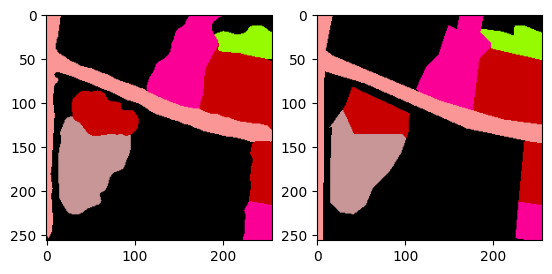

[2023-05-30 22:52:19 swanet_v5](182747771.py 311): INFO Test: [278/728]	Loss 0.0841 (0.4093)	PA@1 96.5759 (90.0759)	MPA@1 95.4058 (82.1274)	KAPPA@1 94.9090 (77.9544)	MIOU@1 91.4236 (71.5885)	FWIOU@1 93.3965 (85.1708)	Mem 44806MB


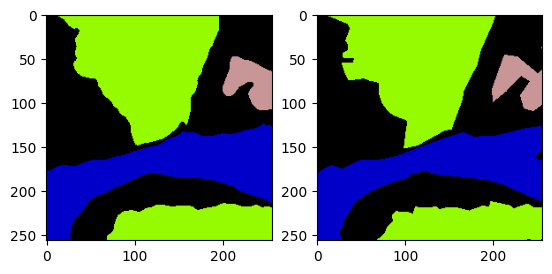

[2023-05-30 22:52:19 swanet_v5](182747771.py 311): INFO Test: [279/728]	Loss 0.0967 (0.4082)	PA@1 96.2265 (90.0979)	MPA@1 94.6185 (82.1720)	KAPPA@1 94.3227 (78.0128)	MIOU@1 90.7720 (71.6570)	FWIOU@1 92.7842 (85.1980)	Mem 44806MB


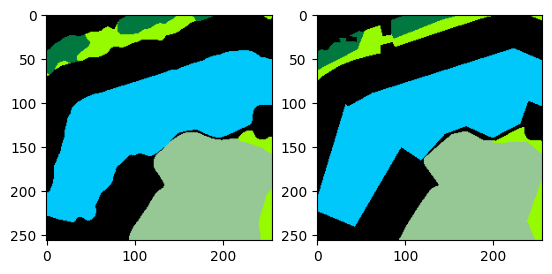

[2023-05-30 22:52:19 swanet_v5](182747771.py 311): INFO Test: [280/728]	Loss 0.1182 (0.4071)	PA@1 95.2591 (90.1163)	MPA@1 89.8052 (82.1992)	KAPPA@1 93.3238 (78.0673)	MIOU@1 83.5553 (71.6993)	FWIOU@1 91.3483 (85.2199)	Mem 44806MB


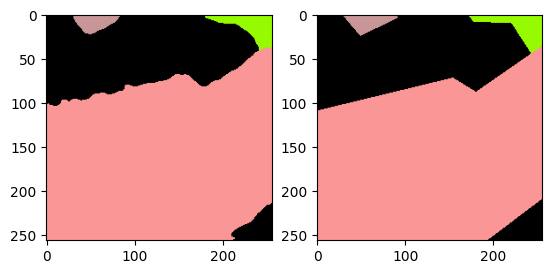

[2023-05-30 22:52:19 swanet_v5](182747771.py 311): INFO Test: [281/728]	Loss 0.0577 (0.4059)	PA@1 97.4976 (90.1424)	MPA@1 97.0617 (82.2519)	KAPPA@1 94.6033 (78.1259)	MIOU@1 90.0889 (71.7645)	FWIOU@1 95.2240 (85.2554)	Mem 44806MB


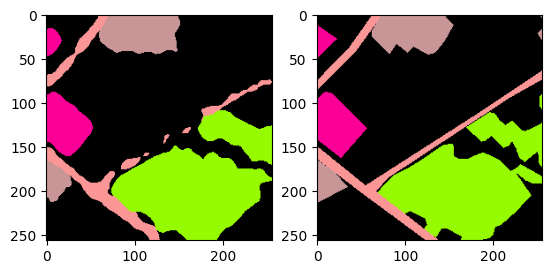

[2023-05-30 22:52:19 swanet_v5](182747771.py 311): INFO Test: [282/728]	Loss 0.1465 (0.4050)	PA@1 93.7134 (90.1551)	MPA@1 90.7801 (82.2820)	KAPPA@1 89.0819 (78.1646)	MIOU@1 84.3342 (71.8089)	FWIOU@1 88.4756 (85.2667)	Mem 44806MB


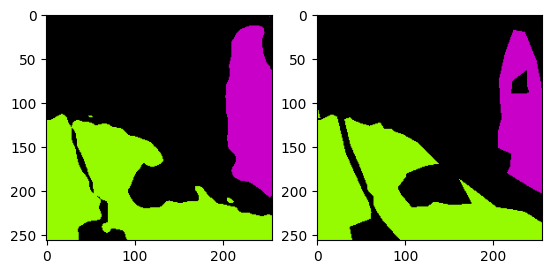

[2023-05-30 22:52:20 swanet_v5](182747771.py 311): INFO Test: [283/728]	Loss 0.1041 (0.4039)	PA@1 95.5917 (90.1742)	MPA@1 92.2675 (82.3172)	KAPPA@1 91.8880 (78.2130)	MIOU@1 89.4415 (71.8710)	FWIOU@1 91.5044 (85.2887)	Mem 44806MB


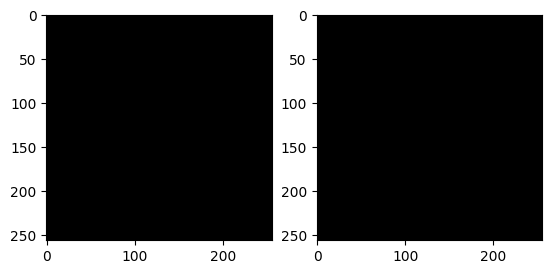

[2023-05-30 22:52:20 swanet_v5](182747771.py 311): INFO Test: [284/728]	Loss 0.0002 (0.4025)	PA@1 100.0000 (90.2087)	MPA@1 100.0000 (82.3792)	KAPPA@1 100.0000 (78.2894)	MIOU@1 100.0000 (71.9697)	FWIOU@1 100.0000 (85.3403)	Mem 44806MB


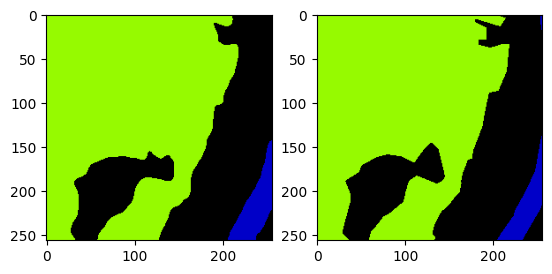

[2023-05-30 22:52:20 swanet_v5](182747771.py 311): INFO Test: [285/728]	Loss 0.0626 (0.4013)	PA@1 97.5494 (90.2344)	MPA@1 93.9367 (82.4196)	KAPPA@1 95.0587 (78.3481)	MIOU@1 91.0703 (72.0365)	FWIOU@1 95.2598 (85.3750)	Mem 44806MB


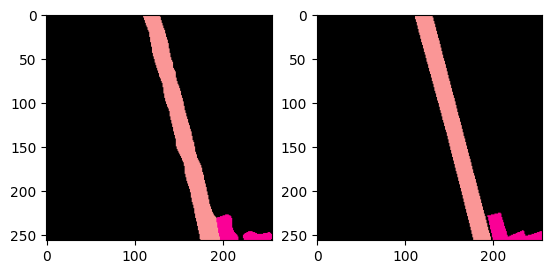

[2023-05-30 22:52:20 swanet_v5](182747771.py 311): INFO Test: [286/728]	Loss 0.0240 (0.4000)	PA@1 98.9624 (90.2648)	MPA@1 95.2899 (82.4645)	KAPPA@1 93.6923 (78.4015)	MIOU@1 90.3319 (72.1003)	FWIOU@1 97.9944 (85.4190)	Mem 44806MB


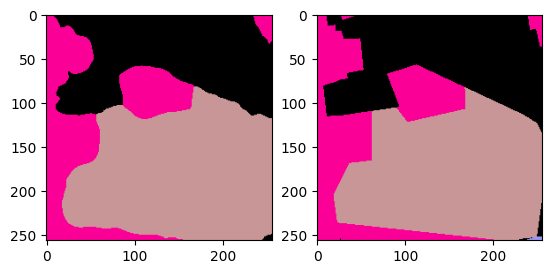

[2023-05-30 22:52:20 swanet_v5](182747771.py 311): INFO Test: [287/728]	Loss 0.1030 (0.3990)	PA@1 96.0251 (90.2848)	MPA@1 96.0870 (82.5118)	KAPPA@1 93.7547 (78.4548)	MIOU@1 68.6651 (72.0883)	FWIOU@1 92.5206 (85.4436)	Mem 44806MB


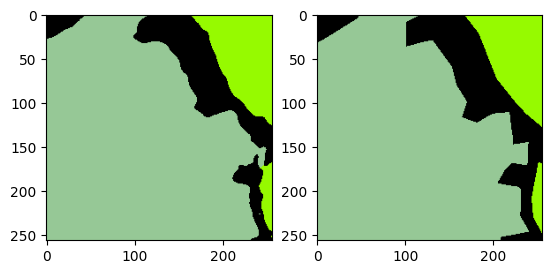

[2023-05-30 22:52:21 swanet_v5](182747771.py 311): INFO Test: [288/728]	Loss 0.0752 (0.3979)	PA@1 97.0505 (90.3082)	MPA@1 96.8045 (82.5612)	KAPPA@1 93.1648 (78.5057)	MIOU@1 91.3562 (72.1550)	FWIOU@1 94.5607 (85.4752)	Mem 44806MB


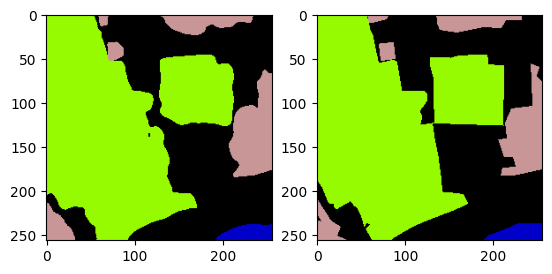

[2023-05-30 22:52:21 swanet_v5](182747771.py 311): INFO Test: [289/728]	Loss 0.0898 (0.3968)	PA@1 96.2494 (90.3287)	MPA@1 94.9757 (82.6040)	KAPPA@1 93.6620 (78.5580)	MIOU@1 90.7210 (72.2190)	FWIOU@1 92.8329 (85.5006)	Mem 44806MB


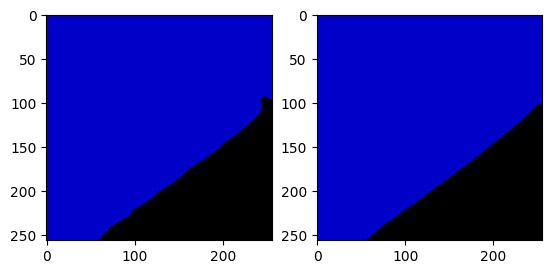

[2023-05-30 22:52:21 swanet_v5](182747771.py 311): INFO Test: [290/728]	Loss 0.0114 (0.3955)	PA@1 99.4766 (90.3601)	MPA@1 99.4204 (82.6618)	KAPPA@1 98.5436 (78.6267)	MIOU@1 98.5571 (72.3095)	FWIOU@1 98.9623 (85.5468)	Mem 44806MB


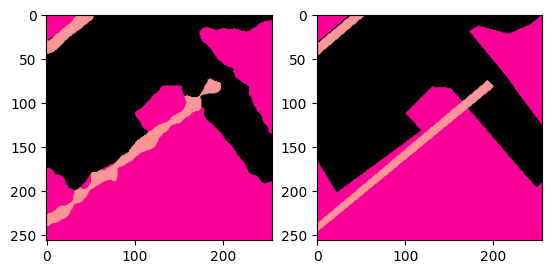

[2023-05-30 22:52:21 swanet_v5](182747771.py 311): INFO Test: [291/728]	Loss 0.1118 (0.3945)	PA@1 95.4056 (90.3774)	MPA@1 87.2804 (82.6776)	KAPPA@1 91.5993 (78.6711)	MIOU@1 82.2670 (72.3436)	FWIOU@1 91.3576 (85.5667)	Mem 44806MB


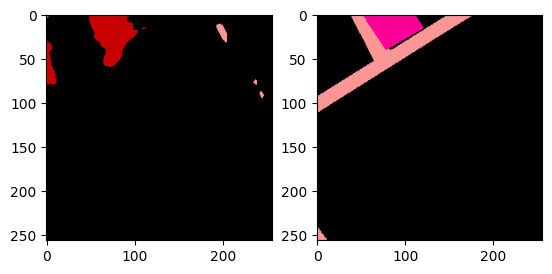

[2023-05-30 22:52:21 swanet_v5](182747771.py 311): INFO Test: [292/728]	Loss 0.6026 (0.3952)	PA@1 90.4861 (90.3778)	MPA@1 31.3737 (82.5025)	KAPPA@1 21.7526 (78.4768)	MIOU@1 23.3204 (72.1763)	FWIOU@1 89.6791 (85.5807)	Mem 44806MB


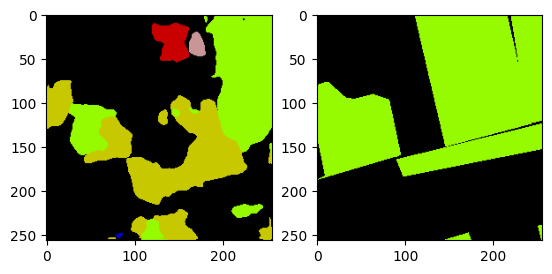

[2023-05-30 22:52:22 swanet_v5](182747771.py 311): INFO Test: [293/728]	Loss 1.5124 (0.3990)	PA@1 62.6099 (90.2833)	MPA@1 27.7791 (82.3164)	KAPPA@1 35.6700 (78.3312)	MIOU@1 16.9168 (71.9884)	FWIOU@1 46.2284 (85.4469)	Mem 44806MB


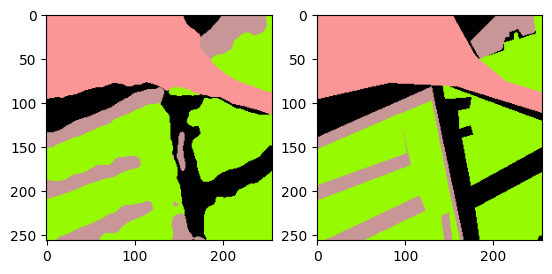

[2023-05-30 22:52:22 swanet_v5](182747771.py 311): INFO Test: [294/728]	Loss 0.1578 (0.3982)	PA@1 93.7195 (90.2949)	MPA@1 91.9866 (82.3492)	KAPPA@1 90.8785 (78.3738)	MIOU@1 85.1831 (72.0331)	FWIOU@1 88.6335 (85.4577)	Mem 44806MB


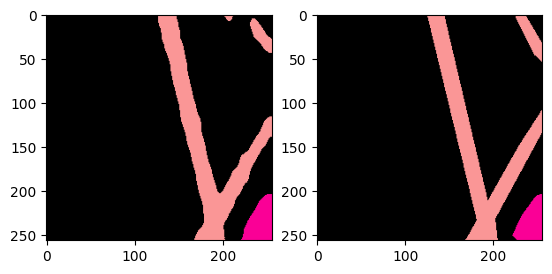

[2023-05-30 22:52:22 swanet_v5](182747771.py 311): INFO Test: [295/728]	Loss 0.0505 (0.3970)	PA@1 97.9187 (90.3207)	MPA@1 95.6724 (82.3942)	KAPPA@1 91.2844 (78.4174)	MIOU@1 92.7643 (72.1031)	FWIOU@1 96.0111 (85.4934)	Mem 44806MB


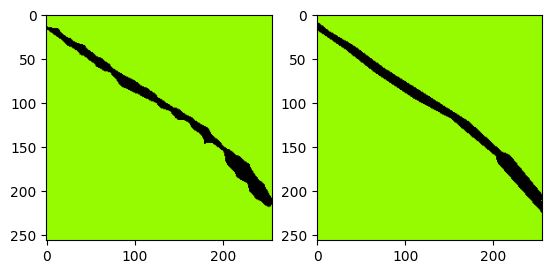

[2023-05-30 22:52:22 swanet_v5](182747771.py 311): INFO Test: [296/728]	Loss 0.0280 (0.3958)	PA@1 98.9426 (90.3497)	MPA@1 96.0069 (82.4400)	KAPPA@1 89.4322 (78.4545)	MIOU@1 90.3456 (72.1646)	FWIOU@1 98.0139 (85.5355)	Mem 44806MB


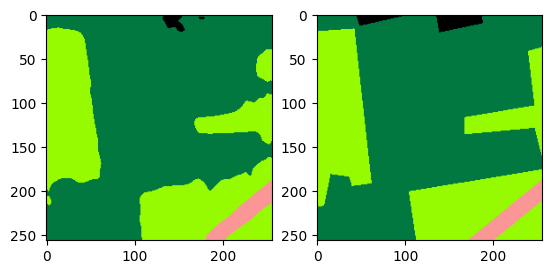

[2023-05-30 22:52:22 swanet_v5](182747771.py 311): INFO Test: [297/728]	Loss 0.1263 (0.3949)	PA@1 94.6503 (90.3642)	MPA@1 92.6033 (82.4741)	KAPPA@1 88.8745 (78.4894)	MIOU@1 72.4615 (72.1655)	FWIOU@1 90.7598 (85.5530)	Mem 44806MB


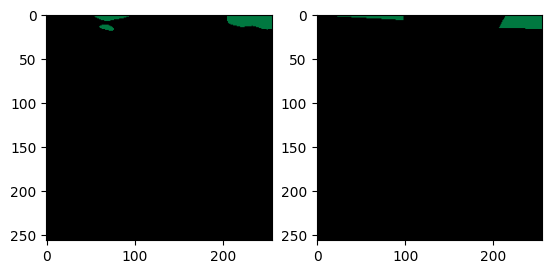

[2023-05-30 22:52:23 swanet_v5](182747771.py 311): INFO Test: [298/728]	Loss 0.0230 (0.3936)	PA@1 99.2798 (90.3940)	MPA@1 91.0670 (82.5029)	KAPPA@1 78.1606 (78.4883)	MIOU@1 81.9572 (72.1983)	FWIOU@1 98.7180 (85.5971)	Mem 44806MB


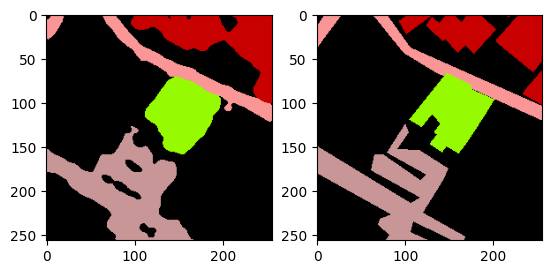

[2023-05-30 22:52:23 swanet_v5](182747771.py 311): INFO Test: [299/728]	Loss 0.1515 (0.3928)	PA@1 93.7378 (90.4051)	MPA@1 89.0281 (82.5246)	KAPPA@1 88.2697 (78.5209)	MIOU@1 84.6376 (72.2398)	FWIOU@1 88.1680 (85.6056)	Mem 44806MB


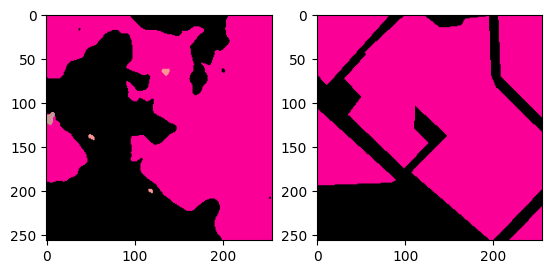

[2023-05-30 22:52:23 swanet_v5](182747771.py 311): INFO Test: [300/728]	Loss 0.8921 (0.3945)	PA@1 75.4974 (90.3556)	MPA@1 36.8015 (82.3727)	KAPPA@1 48.6409 (78.4217)	MIOU@1 29.4434 (72.0976)	FWIOU@1 59.7258 (85.5197)	Mem 44806MB


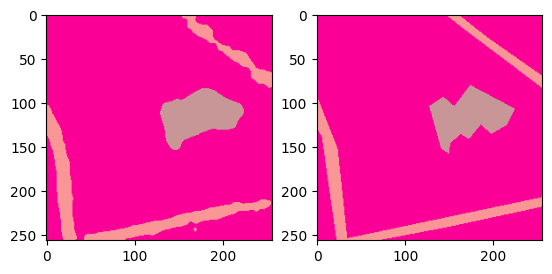

[2023-05-30 22:52:23 swanet_v5](182747771.py 311): INFO Test: [301/728]	Loss 0.0731 (0.3934)	PA@1 97.0184 (90.3777)	MPA@1 91.3288 (82.4024)	KAPPA@1 88.6933 (78.4557)	MIOU@1 87.5060 (72.1486)	FWIOU@1 94.2767 (85.5487)	Mem 44806MB


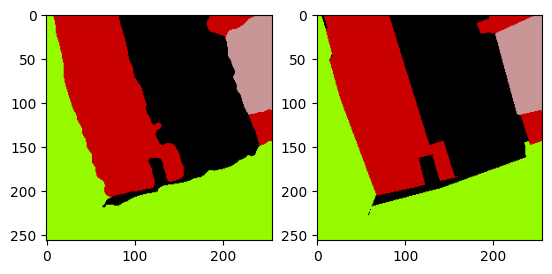

[2023-05-30 22:52:23 swanet_v5](182747771.py 311): INFO Test: [302/728]	Loss 0.0633 (0.3923)	PA@1 97.5464 (90.4013)	MPA@1 97.3046 (82.4516)	KAPPA@1 96.5082 (78.5153)	MIOU@1 95.1638 (72.2246)	FWIOU@1 95.2324 (85.5806)	Mem 44806MB


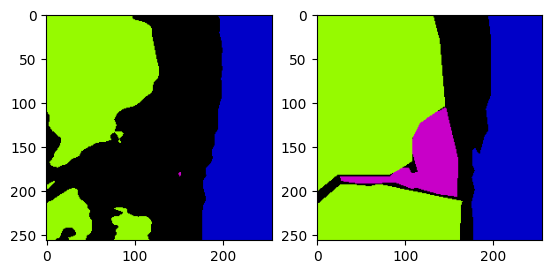

[2023-05-30 22:52:24 swanet_v5](182747771.py 311): INFO Test: [303/728]	Loss 1.1119 (0.3947)	PA@1 71.7331 (90.3399)	MPA@1 84.0047 (82.4567)	KAPPA@1 60.2406 (78.4551)	MIOU@1 48.1845 (72.1455)	FWIOU@1 58.8052 (85.4925)	Mem 44806MB


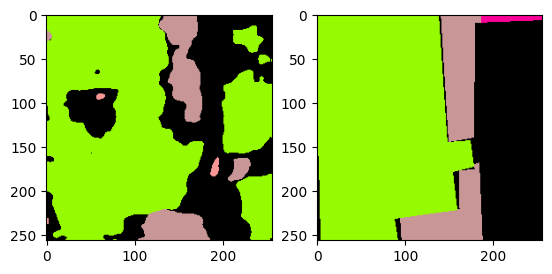

[2023-05-30 22:52:24 swanet_v5](182747771.py 311): INFO Test: [304/728]	Loss 1.1724 (0.3972)	PA@1 72.7814 (90.2823)	MPA@1 54.9964 (82.3666)	KAPPA@1 51.5773 (78.3670)	MIOU@1 32.3609 (72.0150)	FWIOU@1 59.3938 (85.4070)	Mem 44806MB


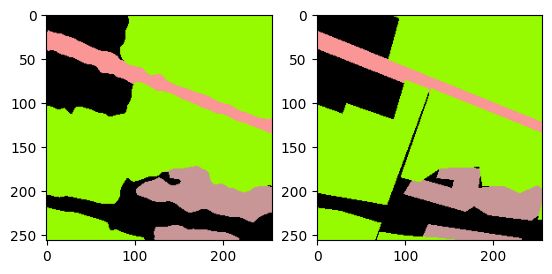

[2023-05-30 22:52:24 swanet_v5](182747771.py 311): INFO Test: [305/728]	Loss 0.1138 (0.3963)	PA@1 95.9244 (90.3008)	MPA@1 92.5765 (82.4000)	KAPPA@1 92.7408 (78.4140)	MIOU@1 88.2309 (72.0680)	FWIOU@1 92.2391 (85.4293)	Mem 44806MB


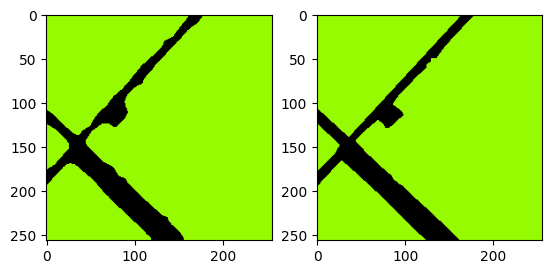

[2023-05-30 22:52:24 swanet_v5](182747771.py 311): INFO Test: [306/728]	Loss 0.0325 (0.3951)	PA@1 98.6771 (90.3281)	MPA@1 96.8351 (82.4470)	KAPPA@1 93.3161 (78.4625)	MIOU@1 93.6546 (72.1383)	FWIOU@1 97.4428 (85.4684)	Mem 44806MB


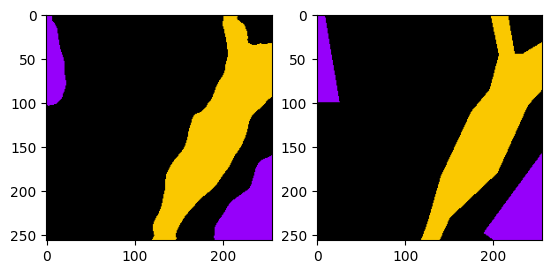

[2023-05-30 22:52:24 swanet_v5](182747771.py 311): INFO Test: [307/728]	Loss 0.0692 (0.3941)	PA@1 97.0291 (90.3498)	MPA@1 94.3571 (82.4857)	KAPPA@1 93.0288 (78.5098)	MIOU@1 91.8529 (72.2024)	FWIOU@1 94.2105 (85.4968)	Mem 44806MB


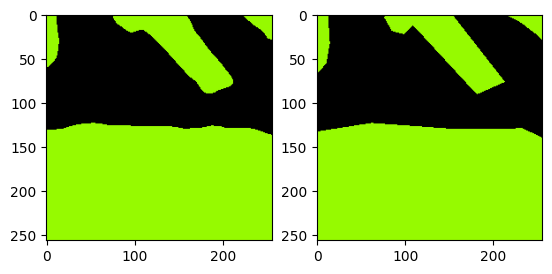

[2023-05-30 22:52:25 swanet_v5](182747771.py 311): INFO Test: [308/728]	Loss 0.0299 (0.3929)	PA@1 98.7808 (90.3771)	MPA@1 98.8174 (82.5385)	KAPPA@1 97.4771 (78.5712)	MIOU@1 97.5096 (72.2843)	FWIOU@1 97.5939 (85.5360)	Mem 44806MB


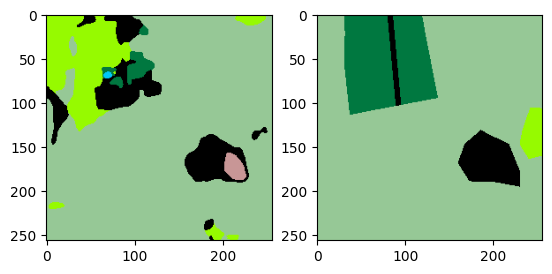

[2023-05-30 22:52:25 swanet_v5](182747771.py 311): INFO Test: [309/728]	Loss 1.0521 (0.3950)	PA@1 76.2604 (90.3316)	MPA@1 39.0647 (82.3983)	KAPPA@1 40.9496 (78.4498)	MIOU@1 21.9086 (72.1218)	FWIOU@1 68.0255 (85.4795)	Mem 44806MB


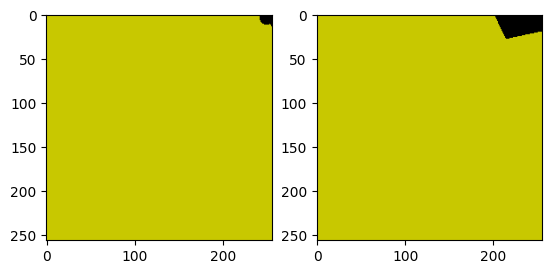

[2023-05-30 22:52:25 swanet_v5](182747771.py 311): INFO Test: [310/728]	Loss 0.0375 (0.3939)	PA@1 98.4467 (90.3577)	MPA@1 99.2213 (82.4524)	KAPPA@1 25.1290 (78.2784)	MIOU@1 56.5199 (72.0716)	FWIOU@1 98.2199 (85.5204)	Mem 44806MB


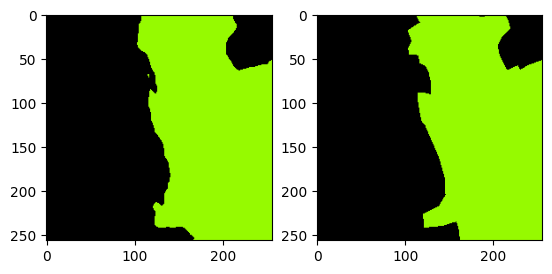

[2023-05-30 22:52:25 swanet_v5](182747771.py 311): INFO Test: [311/728]	Loss 0.0462 (0.3928)	PA@1 98.1308 (90.3826)	MPA@1 98.0820 (82.5025)	KAPPA@1 96.2442 (78.3360)	MIOU@1 96.3136 (72.1493)	FWIOU@1 96.3288 (85.5551)	Mem 44806MB


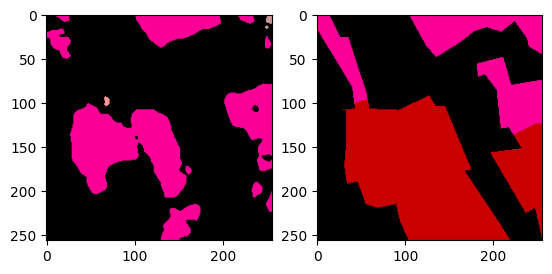

[2023-05-30 22:52:26 swanet_v5](182747771.py 311): INFO Test: [312/728]	Loss 4.2153 (0.4050)	PA@1 57.2922 (90.2769)	MPA@1 24.2887 (82.3165)	KAPPA@1 26.6310 (78.1708)	MIOU@1 17.8777 (71.9759)	FWIOU@1 55.0353 (85.4576)	Mem 44806MB


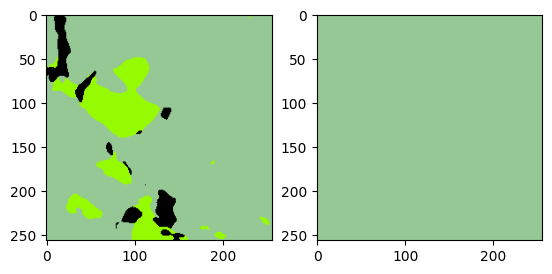

[2023-05-30 22:52:26 swanet_v5](182747771.py 311): INFO Test: [313/728]	Loss 0.3913 (0.4049)	PA@1 84.1354 (90.2573)	MPA@1 33.3333 (82.1605)	KAPPA@1 0.0000 (77.9218)	MIOU@1 28.0451 (71.8360)	FWIOU@1 70.7877 (85.4109)	Mem 44806MB


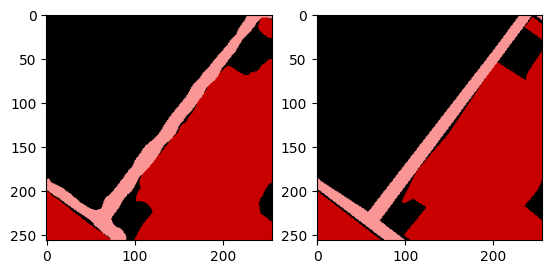

[2023-05-30 22:52:26 swanet_v5](182747771.py 311): INFO Test: [314/728]	Loss 0.0523 (0.4038)	PA@1 97.9553 (90.2817)	MPA@1 96.2319 (82.2052)	KAPPA@1 96.3523 (77.9803)	MIOU@1 94.0560 (71.9065)	FWIOU@1 96.0021 (85.4445)	Mem 44806MB


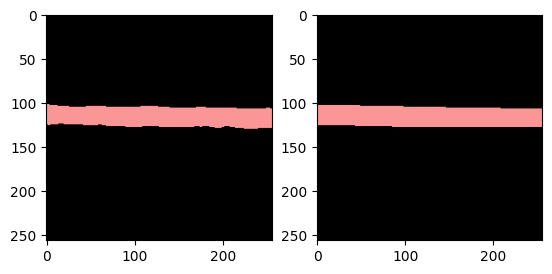

[2023-05-30 22:52:26 swanet_v5](182747771.py 311): INFO Test: [315/728]	Loss 0.0129 (0.4026)	PA@1 99.5071 (90.3109)	MPA@1 98.8174 (82.2577)	KAPPA@1 96.8975 (78.0402)	MIOU@1 96.9763 (71.9859)	FWIOU@1 99.0328 (85.4875)	Mem 44806MB


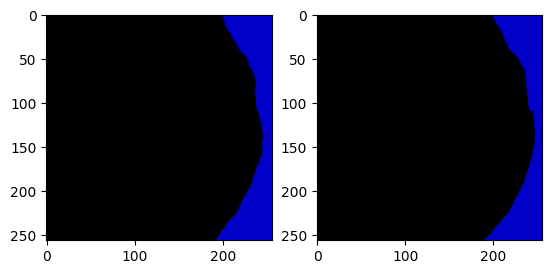

[2023-05-30 22:52:27 swanet_v5](182747771.py 311): INFO Test: [316/728]	Loss 0.0126 (0.4013)	PA@1 99.5758 (90.3402)	MPA@1 98.2943 (82.3083)	KAPPA@1 97.8304 (78.1026)	MIOU@1 97.8675 (72.0675)	FWIOU@1 99.1553 (85.5306)	Mem 44806MB


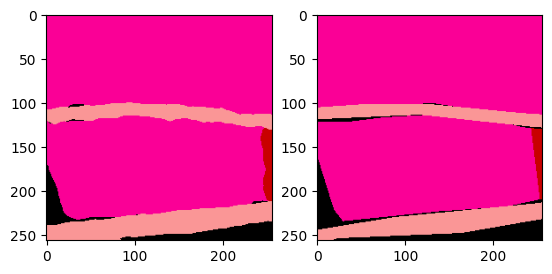

[2023-05-30 22:52:27 swanet_v5](182747771.py 311): INFO Test: [317/728]	Loss 0.0789 (0.4003)	PA@1 96.9833 (90.3611)	MPA@1 90.8029 (82.3350)	KAPPA@1 91.3654 (78.1443)	MIOU@1 82.6961 (72.1009)	FWIOU@1 94.6092 (85.5591)	Mem 44806MB


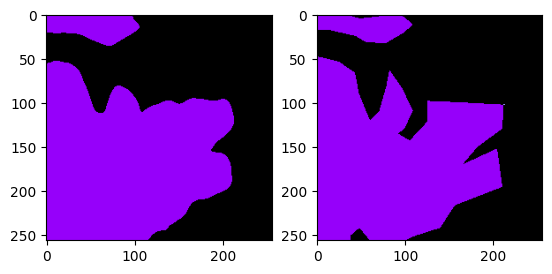

[2023-05-30 22:52:27 swanet_v5](182747771.py 311): INFO Test: [318/728]	Loss 0.1017 (0.3994)	PA@1 96.0114 (90.3788)	MPA@1 96.1183 (82.3783)	KAPPA@1 92.0256 (78.1879)	MIOU@1 61.5527 (72.0679)	FWIOU@1 92.3351 (85.5804)	Mem 44806MB


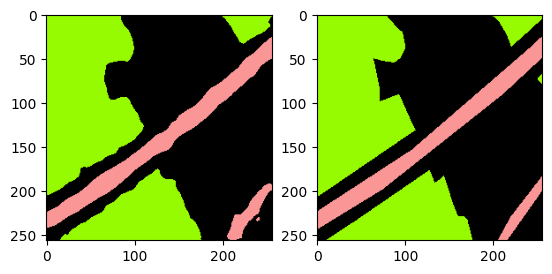

[2023-05-30 22:52:27 swanet_v5](182747771.py 311): INFO Test: [319/728]	Loss 0.0756 (0.3984)	PA@1 97.0428 (90.3996)	MPA@1 95.4984 (82.4193)	KAPPA@1 94.8527 (78.2399)	MIOU@1 92.5080 (72.1317)	FWIOU@1 94.2742 (85.6076)	Mem 44806MB


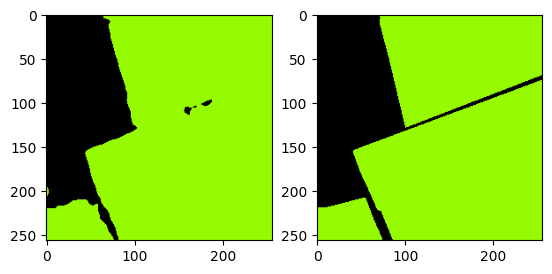

[2023-05-30 22:52:27 swanet_v5](182747771.py 311): INFO Test: [320/728]	Loss 0.0460 (0.3973)	PA@1 98.1201 (90.4236)	MPA@1 98.1166 (82.4682)	KAPPA@1 95.0514 (78.2923)	MIOU@1 95.1977 (72.2036)	FWIOU@1 96.3521 (85.6410)	Mem 44806MB


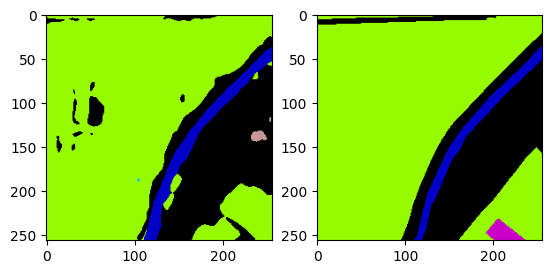

[2023-05-30 22:52:28 swanet_v5](182747771.py 311): INFO Test: [321/728]	Loss 0.3079 (0.3970)	PA@1 90.6876 (90.4245)	MPA@1 51.8784 (82.3732)	KAPPA@1 79.2226 (78.2952)	MIOU@1 40.2126 (72.1042)	FWIOU@1 83.8919 (85.6356)	Mem 44806MB


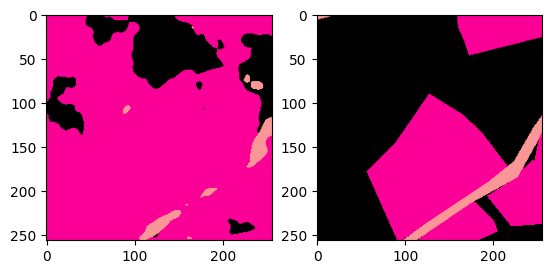

[2023-05-30 22:52:28 swanet_v5](182747771.py 311): INFO Test: [322/728]	Loss 2.5033 (0.4035)	PA@1 50.7385 (90.3016)	MPA@1 67.8675 (82.3282)	KAPPA@1 19.9497 (78.1146)	MIOU@1 35.3042 (71.9903)	FWIOU@1 37.8606 (85.4877)	Mem 44806MB


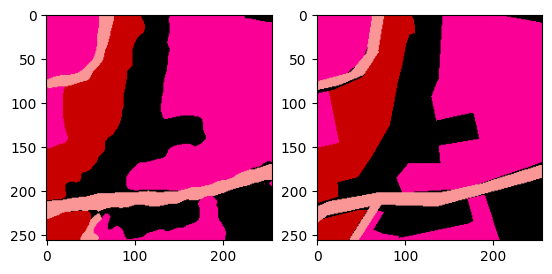

[2023-05-30 22:52:28 swanet_v5](182747771.py 311): INFO Test: [323/728]	Loss 0.1163 (0.4026)	PA@1 95.5139 (90.3177)	MPA@1 94.4823 (82.3658)	KAPPA@1 93.3444 (78.1616)	MIOU@1 89.9596 (72.0458)	FWIOU@1 91.4870 (85.5062)	Mem 44806MB


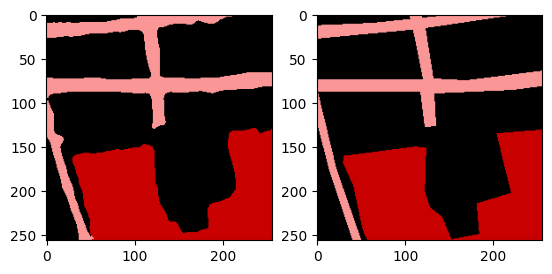

[2023-05-30 22:52:28 swanet_v5](182747771.py 311): INFO Test: [324/728]	Loss 0.0903 (0.4017)	PA@1 96.4279 (90.3365)	MPA@1 94.3186 (82.4025)	KAPPA@1 93.4829 (78.2087)	MIOU@1 91.6448 (72.1061)	FWIOU@1 93.0916 (85.5295)	Mem 44806MB


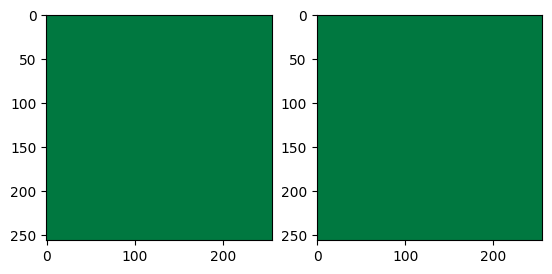

[2023-05-30 22:52:29 swanet_v5](182747771.py 311): INFO Test: [325/728]	Loss 0.0017 (0.4004)	PA@1 100.0000 (90.3661)	MPA@1 100.0000 (82.4565)	KAPPA@1 100.0000 (78.2755)	MIOU@1 100.0000 (72.1916)	FWIOU@1 100.0000 (85.5739)	Mem 44806MB


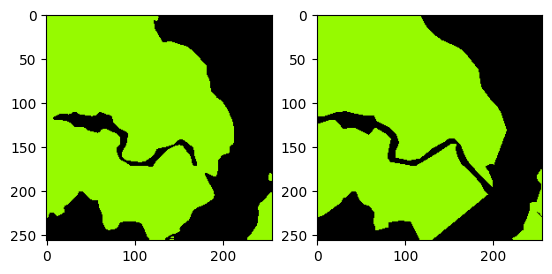

[2023-05-30 22:52:29 swanet_v5](182747771.py 311): INFO Test: [326/728]	Loss 0.0757 (0.3995)	PA@1 96.9635 (90.3863)	MPA@1 96.7649 (82.5003)	KAPPA@1 93.4849 (78.3221)	MIOU@1 93.7035 (72.2574)	FWIOU@1 94.1196 (85.6001)	Mem 44806MB


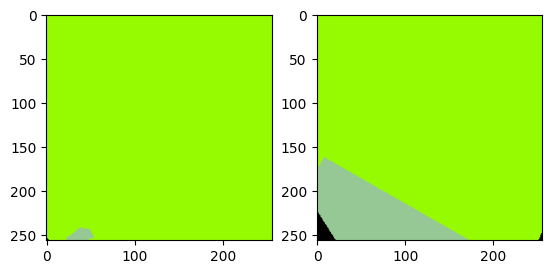

[2023-05-30 22:52:29 swanet_v5](182747771.py 311): INFO Test: [327/728]	Loss 0.7928 (0.4007)	PA@1 87.5565 (90.3777)	MPA@1 95.7212 (82.5406)	KAPPA@1 6.0945 (78.1018)	MIOU@1 30.9145 (72.1314)	FWIOU@1 87.1124 (85.6047)	Mem 44806MB


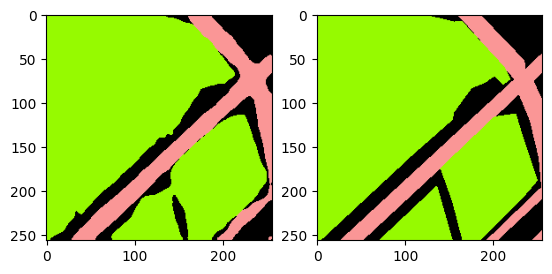

[2023-05-30 22:52:29 swanet_v5](182747771.py 311): INFO Test: [328/728]	Loss 0.0953 (0.3997)	PA@1 95.9152 (90.3945)	MPA@1 94.0366 (82.5755)	KAPPA@1 91.4981 (78.1426)	MIOU@1 87.9199 (72.1794)	FWIOU@1 92.5274 (85.6257)	Mem 44806MB


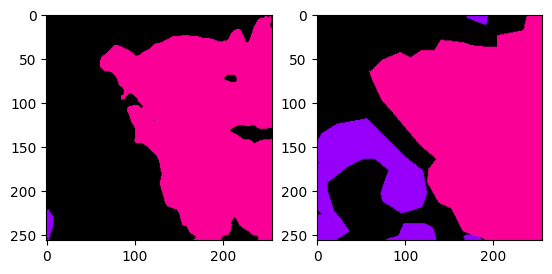

[2023-05-30 22:52:30 swanet_v5](182747771.py 311): INFO Test: [329/728]	Loss 1.0473 (0.4017)	PA@1 80.3223 (90.3640)	MPA@1 84.7508 (82.5821)	KAPPA@1 65.5834 (78.1045)	MIOU@1 51.2126 (72.1158)	FWIOU@1 75.2203 (85.5942)	Mem 44806MB


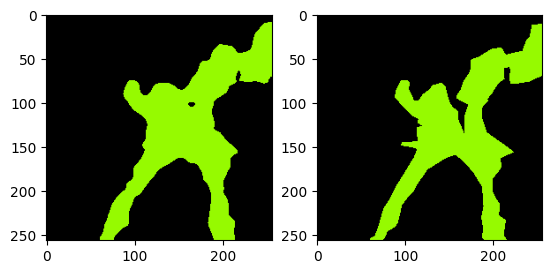

[2023-05-30 22:52:30 swanet_v5](182747771.py 311): INFO Test: [330/728]	Loss 0.0805 (0.4007)	PA@1 96.6812 (90.3831)	MPA@1 93.9386 (82.6164)	KAPPA@1 90.7314 (78.1427)	MIOU@1 91.2426 (72.1736)	FWIOU@1 93.5501 (85.6182)	Mem 44806MB


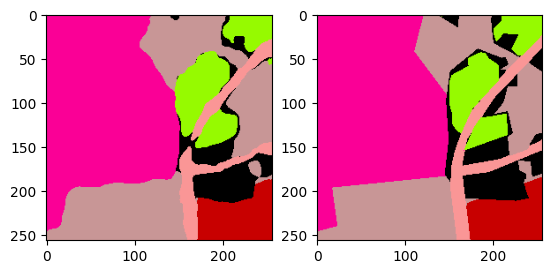

[2023-05-30 22:52:30 swanet_v5](182747771.py 311): INFO Test: [331/728]	Loss 0.1512 (0.4000)	PA@1 93.6890 (90.3930)	MPA@1 91.6457 (82.6436)	KAPPA@1 91.3399 (78.1824)	MIOU@1 83.7228 (72.2084)	FWIOU@1 89.1376 (85.6288)	Mem 44806MB


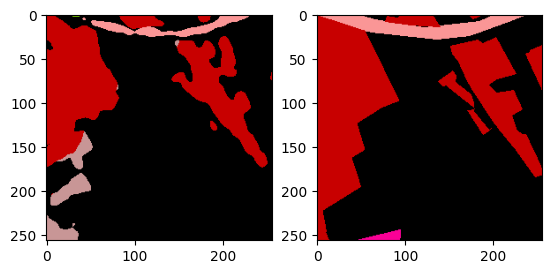

[2023-05-30 22:52:30 swanet_v5](182747771.py 311): INFO Test: [332/728]	Loss 0.4530 (0.4001)	PA@1 86.9278 (90.3826)	MPA@1 56.4337 (82.5649)	KAPPA@1 71.9305 (78.1636)	MIOU@1 33.9949 (72.0937)	FWIOU@1 78.4201 (85.6072)	Mem 44806MB


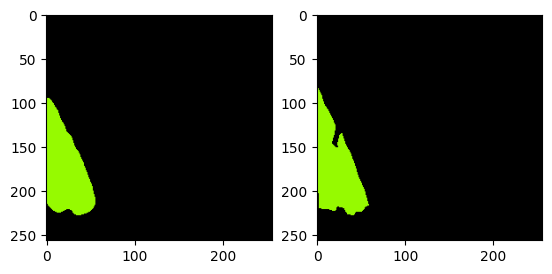

[2023-05-30 22:52:30 swanet_v5](182747771.py 311): INFO Test: [333/728]	Loss 0.0144 (0.3990)	PA@1 99.4614 (90.4098)	MPA@1 97.3904 (82.6093)	KAPPA@1 95.8149 (78.2165)	MIOU@1 95.9618 (72.1651)	FWIOU@1 98.9388 (85.6471)	Mem 44806MB


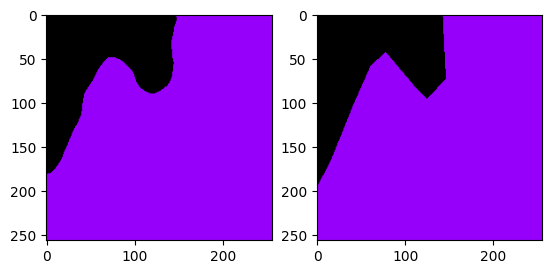

[2023-05-30 22:52:31 swanet_v5](182747771.py 311): INFO Test: [334/728]	Loss 0.0245 (0.3979)	PA@1 99.0417 (90.4356)	MPA@1 98.5646 (82.6569)	KAPPA@1 97.0977 (78.2728)	MIOU@1 97.1530 (72.2397)	FWIOU@1 98.1111 (85.6843)	Mem 44806MB


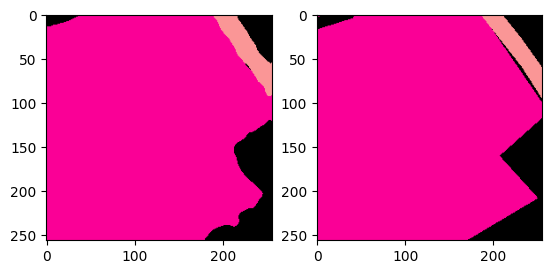

[2023-05-30 22:52:31 swanet_v5](182747771.py 311): INFO Test: [335/728]	Loss 0.0381 (0.3968)	PA@1 98.5016 (90.4596)	MPA@1 94.8378 (82.6932)	KAPPA@1 93.4472 (78.3180)	MIOU@1 90.5358 (72.2942)	FWIOU@1 97.1645 (85.7185)	Mem 44806MB


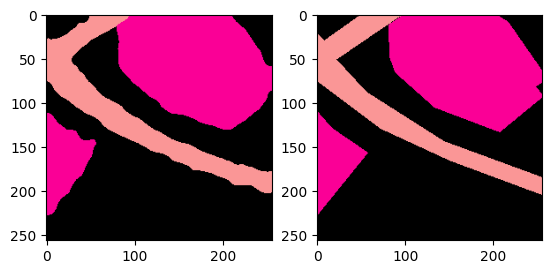

[2023-05-30 22:52:31 swanet_v5](182747771.py 311): INFO Test: [336/728]	Loss 0.0739 (0.3958)	PA@1 96.7621 (90.4783)	MPA@1 95.0046 (82.7297)	KAPPA@1 94.4534 (78.3659)	MIOU@1 92.5203 (72.3542)	FWIOU@1 93.7288 (85.7422)	Mem 44806MB


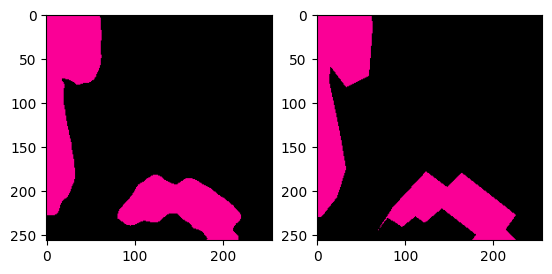

[2023-05-30 22:52:31 swanet_v5](182747771.py 311): INFO Test: [337/728]	Loss 0.0393 (0.3948)	PA@1 98.4528 (90.5019)	MPA@1 97.3341 (82.7729)	KAPPA@1 95.4634 (78.4165)	MIOU@1 95.5944 (72.4229)	FWIOU@1 96.9611 (85.7754)	Mem 44806MB


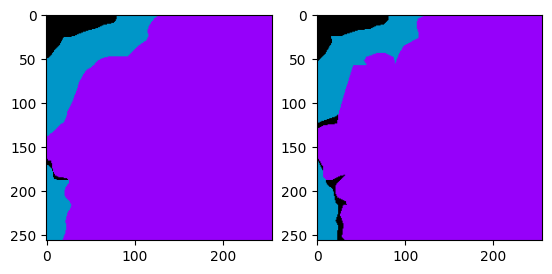

[2023-05-30 22:52:32 swanet_v5](182747771.py 311): INFO Test: [338/728]	Loss 0.0694 (0.3938)	PA@1 97.7478 (90.5232)	MPA@1 93.6743 (82.8051)	KAPPA@1 91.5524 (78.4552)	MIOU@1 84.7126 (72.4592)	FWIOU@1 95.8624 (85.8052)	Mem 44806MB


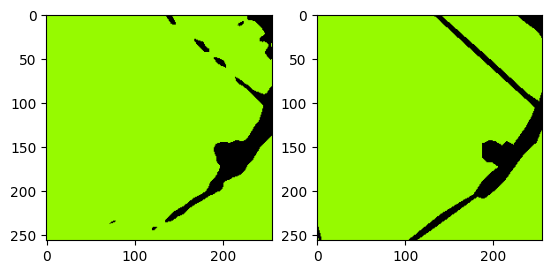

[2023-05-30 22:52:32 swanet_v5](182747771.py 311): INFO Test: [339/728]	Loss 0.0641 (0.3928)	PA@1 97.1436 (90.5427)	MPA@1 91.0039 (82.8292)	KAPPA@1 78.0984 (78.4542)	MIOU@1 81.5645 (72.4860)	FWIOU@1 94.9242 (85.8320)	Mem 44806MB


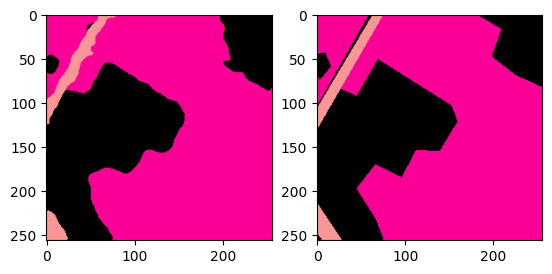

[2023-05-30 22:52:32 swanet_v5](182747771.py 311): INFO Test: [340/728]	Loss 0.0776 (0.3919)	PA@1 96.9391 (90.5615)	MPA@1 91.7567 (82.8554)	KAPPA@1 93.6874 (78.4988)	MIOU@1 86.0792 (72.5258)	FWIOU@1 94.1975 (85.8565)	Mem 44806MB


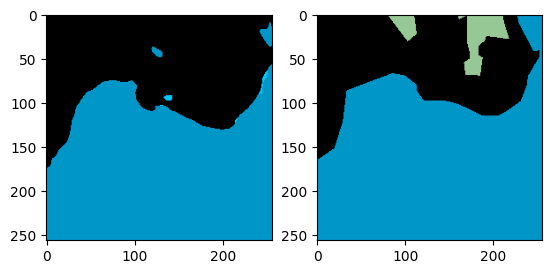

[2023-05-30 22:52:32 swanet_v5](182747771.py 311): INFO Test: [341/728]	Loss 0.4913 (0.3922)	PA@1 90.5121 (90.5613)	MPA@1 59.2633 (82.7864)	KAPPA@1 80.8106 (78.5056)	MIOU@1 42.1954 (72.4371)	FWIOU@1 85.3450 (85.8550)	Mem 44806MB


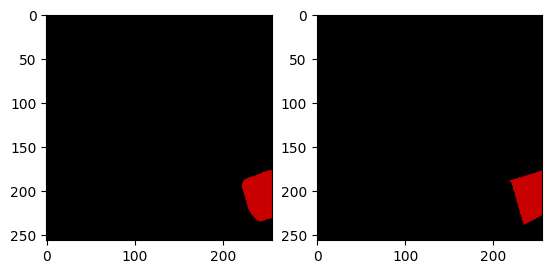

[2023-05-30 22:52:32 swanet_v5](182747771.py 311): INFO Test: [342/728]	Loss 0.0068 (0.3911)	PA@1 99.7910 (90.5882)	MPA@1 98.6312 (82.8326)	KAPPA@1 95.4406 (78.5550)	MIOU@1 95.6305 (72.5048)	FWIOU@1 99.5948 (85.8951)	Mem 44806MB


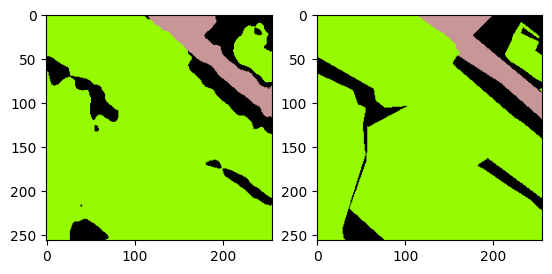

[2023-05-30 22:52:33 swanet_v5](182747771.py 311): INFO Test: [343/728]	Loss 0.1084 (0.3903)	PA@1 95.7550 (90.6033)	MPA@1 93.2509 (82.8629)	KAPPA@1 87.0828 (78.5798)	MIOU@1 85.2755 (72.5419)	FWIOU@1 92.3808 (85.9139)	Mem 44806MB


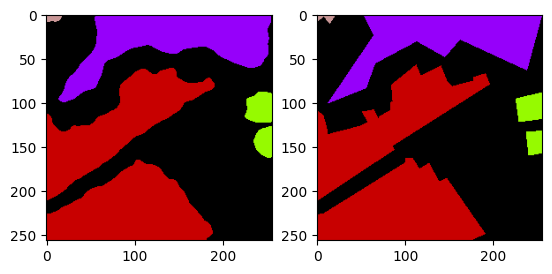

[2023-05-30 22:52:33 swanet_v5](182747771.py 311): INFO Test: [344/728]	Loss 0.0934 (0.3894)	PA@1 96.1945 (90.6195)	MPA@1 89.9238 (82.8833)	KAPPA@1 93.8990 (78.6242)	MIOU@1 85.2950 (72.5789)	FWIOU@1 92.6724 (85.9335)	Mem 44806MB


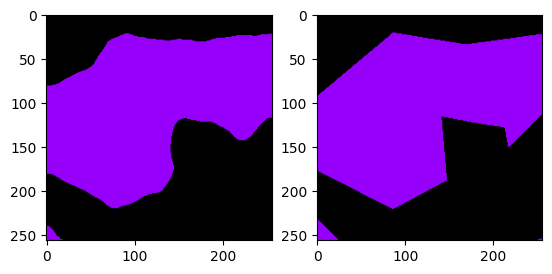

[2023-05-30 22:52:33 swanet_v5](182747771.py 311): INFO Test: [345/728]	Loss 0.0581 (0.3884)	PA@1 97.7158 (90.6400)	MPA@1 97.7181 (82.9262)	KAPPA@1 95.4255 (78.6727)	MIOU@1 95.5279 (72.6452)	FWIOU@1 95.5339 (85.9613)	Mem 44806MB


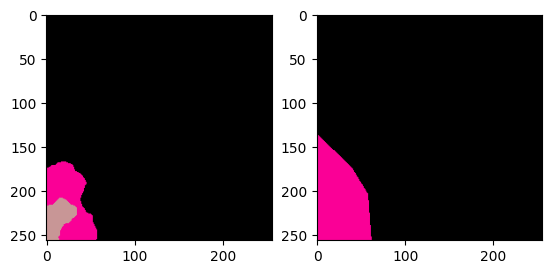

[2023-05-30 22:52:33 swanet_v5](182747771.py 311): INFO Test: [346/728]	Loss 0.0830 (0.3876)	PA@1 96.2143 (90.6560)	MPA@1 65.9175 (82.8772)	KAPPA@1 71.6043 (78.6523)	MIOU@1 50.4248 (72.5811)	FWIOU@1 94.1881 (85.9850)	Mem 44806MB


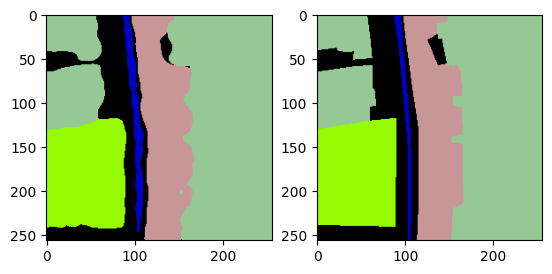

[2023-05-30 22:52:33 swanet_v5](182747771.py 311): INFO Test: [347/728]	Loss 0.0938 (0.3867)	PA@1 96.3333 (90.6724)	MPA@1 90.0465 (82.8978)	KAPPA@1 94.5938 (78.6982)	MIOU@1 85.9580 (72.6196)	FWIOU@1 93.1678 (86.0056)	Mem 44806MB


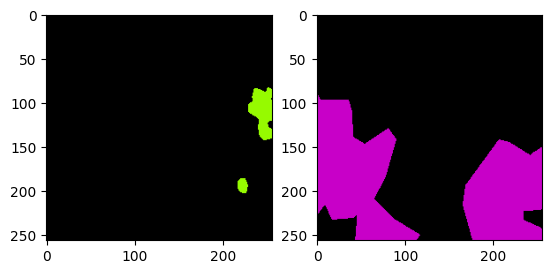

[2023-05-30 22:52:34 swanet_v5](182747771.py 311): INFO Test: [348/728]	Loss 2.1967 (0.3919)	PA@1 70.0699 (90.6133)	MPA@1 35.7206 (82.7626)	KAPPA@1 -0.9860 (78.4698)	MIOU@1 23.4152 (72.4786)	FWIOU@1 68.8973 (85.9566)	Mem 44806MB


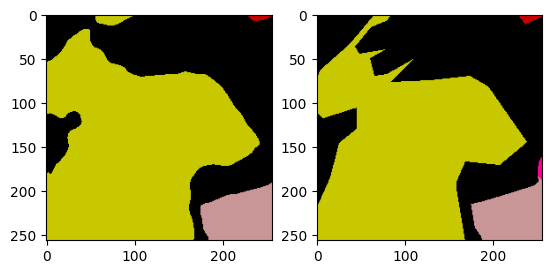

[2023-05-30 22:52:34 swanet_v5](182747771.py 311): INFO Test: [349/728]	Loss 0.1530 (0.3912)	PA@1 93.7332 (90.6222)	MPA@1 96.6877 (82.8024)	KAPPA@1 88.5330 (78.4986)	MIOU@1 58.6287 (72.4390)	FWIOU@1 88.5601 (85.9641)	Mem 44806MB


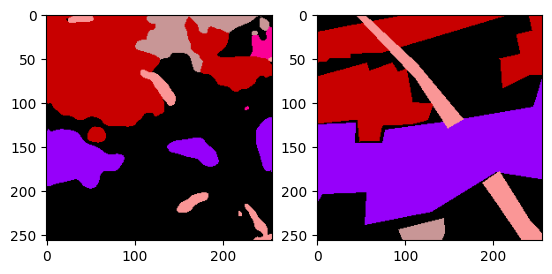

[2023-05-30 22:52:34 swanet_v5](182747771.py 311): INFO Test: [350/728]	Loss 2.1834 (0.3963)	PA@1 51.7563 (90.5115)	MPA@1 43.9194 (82.6916)	KAPPA@1 31.8684 (78.3657)	MIOU@1 22.6134 (72.2971)	FWIOU@1 36.9929 (85.8245)	Mem 44806MB


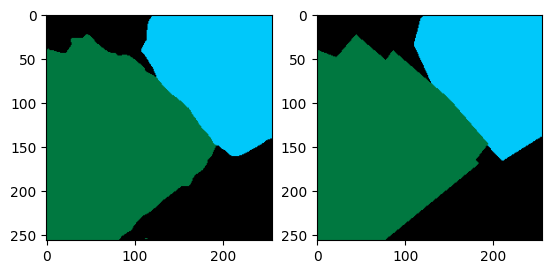

[2023-05-30 22:52:34 swanet_v5](182747771.py 311): INFO Test: [351/728]	Loss 0.0399 (0.3953)	PA@1 98.4863 (90.5342)	MPA@1 98.6350 (82.7369)	KAPPA@1 97.6229 (78.4204)	MIOU@1 96.8297 (72.3668)	FWIOU@1 97.0401 (85.8564)	Mem 44806MB


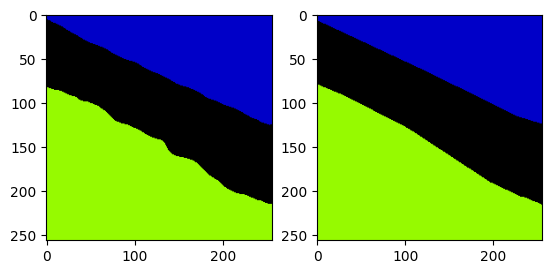

[2023-05-30 22:52:34 swanet_v5](182747771.py 311): INFO Test: [352/728]	Loss 0.0285 (0.3943)	PA@1 98.8403 (90.5577)	MPA@1 98.7923 (82.7824)	KAPPA@1 98.2245 (78.4765)	MIOU@1 97.6596 (72.4384)	FWIOU@1 97.7126 (85.8900)	Mem 44806MB


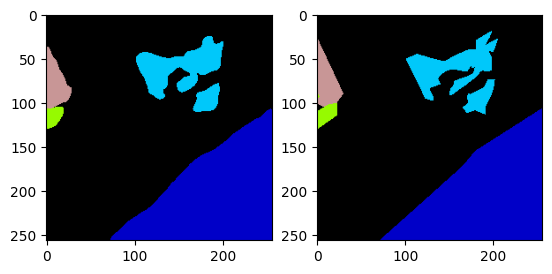

[2023-05-30 22:52:35 swanet_v5](182747771.py 311): INFO Test: [353/728]	Loss 0.0569 (0.3933)	PA@1 97.5098 (90.5773)	MPA@1 93.5723 (82.8129)	KAPPA@1 94.6900 (78.5223)	MIOU@1 86.3076 (72.4776)	FWIOU@1 95.2607 (85.9165)	Mem 44806MB


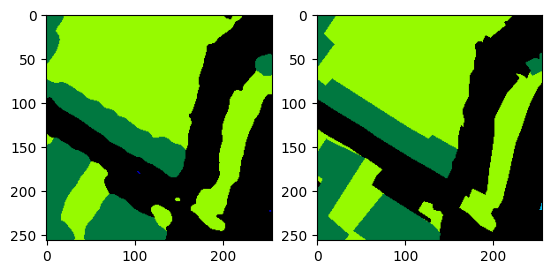

[2023-05-30 22:52:35 swanet_v5](182747771.py 311): INFO Test: [354/728]	Loss 0.1144 (0.3925)	PA@1 95.8206 (90.5921)	MPA@1 71.7444 (82.7817)	KAPPA@1 93.4348 (78.5644)	MIOU@1 55.1589 (72.4288)	FWIOU@1 92.0092 (85.9336)	Mem 44806MB


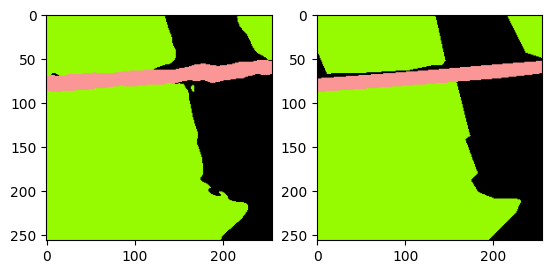

[2023-05-30 22:52:35 swanet_v5](182747771.py 311): INFO Test: [355/728]	Loss 0.0537 (0.3916)	PA@1 97.6852 (90.6120)	MPA@1 95.0733 (82.8162)	KAPPA@1 95.3047 (78.6114)	MIOU@1 92.5277 (72.4853)	FWIOU@1 95.5212 (85.9605)	Mem 44806MB


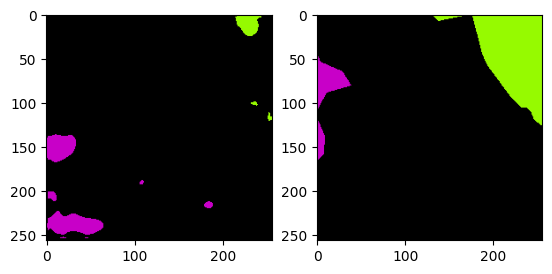

[2023-05-30 22:52:35 swanet_v5](182747771.py 311): INFO Test: [356/728]	Loss 0.5428 (0.3920)	PA@1 85.6750 (90.5982)	MPA@1 65.6711 (82.7682)	KAPPA@1 10.0977 (78.4195)	MIOU@1 33.1496 (72.3751)	FWIOU@1 82.1939 (85.9500)	Mem 44806MB


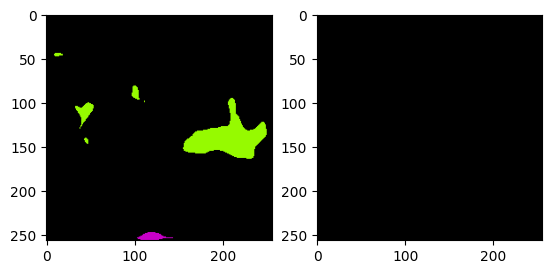

[2023-05-30 22:52:35 swanet_v5](182747771.py 311): INFO Test: [357/728]	Loss 0.1354 (0.3913)	PA@1 94.8029 (90.6099)	MPA@1 33.3333 (82.6301)	KAPPA@1 0.0000 (78.2004)	MIOU@1 31.6010 (72.2612)	FWIOU@1 89.8758 (85.9610)	Mem 44806MB


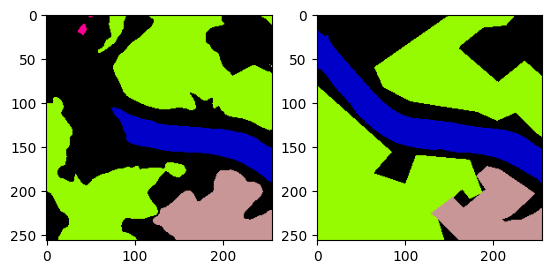

[2023-05-30 22:52:36 swanet_v5](182747771.py 311): INFO Test: [358/728]	Loss 0.9319 (0.3928)	PA@1 73.4467 (90.5621)	MPA@1 65.5347 (82.5825)	KAPPA@1 60.7351 (78.1518)	MIOU@1 50.3279 (72.2001)	FWIOU@1 57.8032 (85.8825)	Mem 44806MB


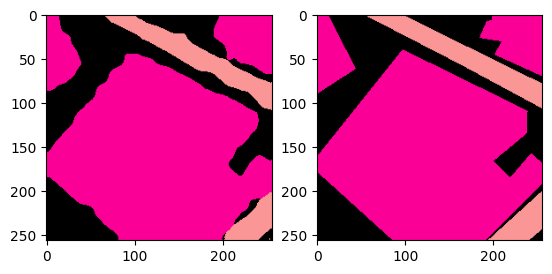

[2023-05-30 22:52:36 swanet_v5](182747771.py 311): INFO Test: [359/728]	Loss 0.0836 (0.3919)	PA@1 96.7346 (90.5793)	MPA@1 95.8223 (82.6193)	KAPPA@1 93.5982 (78.1947)	MIOU@1 91.0553 (72.2525)	FWIOU@1 93.7751 (85.9045)	Mem 44806MB


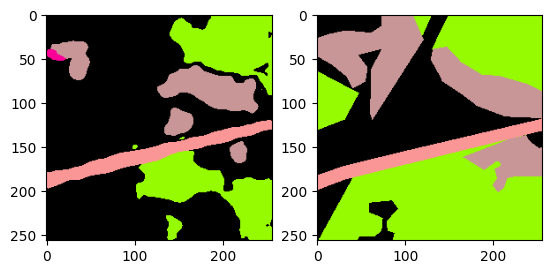

[2023-05-30 22:52:36 swanet_v5](182747771.py 311): INFO Test: [360/728]	Loss 2.0486 (0.3965)	PA@1 59.9716 (90.4945)	MPA@1 62.7264 (82.5642)	KAPPA@1 42.9108 (78.0969)	MIOU@1 41.1822 (72.1664)	FWIOU@1 43.7904 (85.7878)	Mem 44806MB


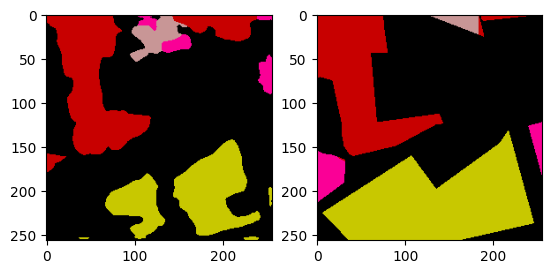

[2023-05-30 22:52:36 swanet_v5](182747771.py 311): INFO Test: [361/728]	Loss 0.8657 (0.3978)	PA@1 73.3429 (90.4471)	MPA@1 50.5382 (82.4757)	KAPPA@1 54.3833 (78.0314)	MIOU@1 37.0360 (72.0694)	FWIOU@1 60.3384 (85.7175)	Mem 44806MB


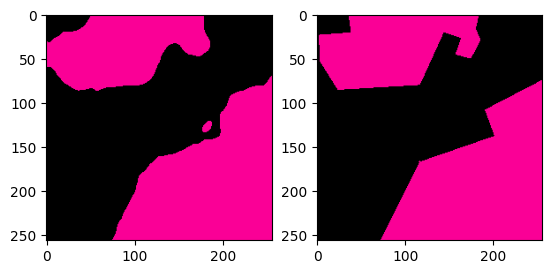

[2023-05-30 22:52:36 swanet_v5](182747771.py 311): INFO Test: [362/728]	Loss 0.0623 (0.3969)	PA@1 97.5388 (90.4666)	MPA@1 97.5227 (82.5172)	KAPPA@1 95.0700 (78.0784)	MIOU@1 95.1887 (72.1330)	FWIOU@1 95.1953 (85.7436)	Mem 44806MB


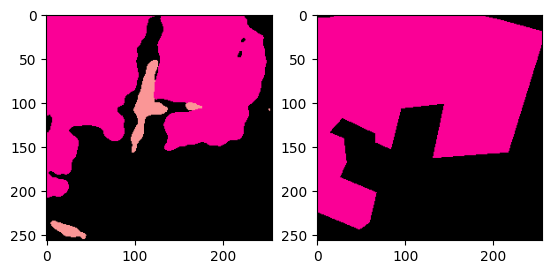

[2023-05-30 22:52:37 swanet_v5](182747771.py 311): INFO Test: [363/728]	Loss 0.4656 (0.3971)	PA@1 85.7971 (90.4538)	MPA@1 59.2394 (82.4532)	KAPPA@1 72.5733 (78.0632)	MIOU@1 51.4682 (72.0763)	FWIOU@1 74.7315 (85.7133)	Mem 44806MB


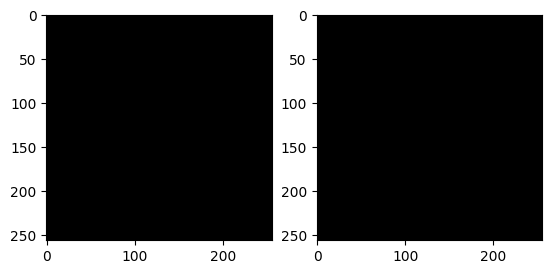

[2023-05-30 22:52:37 swanet_v5](182747771.py 311): INFO Test: [364/728]	Loss 0.0006 (0.3960)	PA@1 100.0000 (90.4800)	MPA@1 100.0000 (82.5013)	KAPPA@1 100.0000 (78.1233)	MIOU@1 100.0000 (72.1528)	FWIOU@1 100.0000 (85.7525)	Mem 44806MB


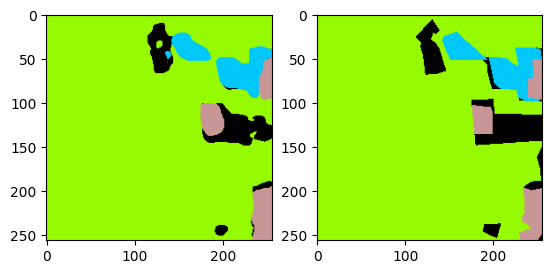

[2023-05-30 22:52:37 swanet_v5](182747771.py 311): INFO Test: [365/728]	Loss 0.0910 (0.3952)	PA@1 96.6644 (90.4969)	MPA@1 91.6649 (82.5263)	KAPPA@1 87.0464 (78.1477)	MIOU@1 82.0392 (72.1798)	FWIOU@1 94.1697 (85.7755)	Mem 44806MB


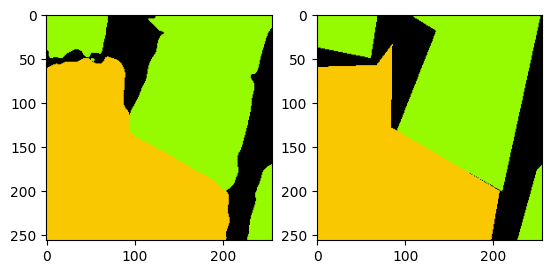

[2023-05-30 22:52:37 swanet_v5](182747771.py 311): INFO Test: [366/728]	Loss 0.0880 (0.3943)	PA@1 96.2311 (90.5125)	MPA@1 96.2467 (82.5637)	KAPPA@1 93.9947 (78.1909)	MIOU@1 90.6445 (72.2301)	FWIOU@1 93.0519 (85.7953)	Mem 44806MB


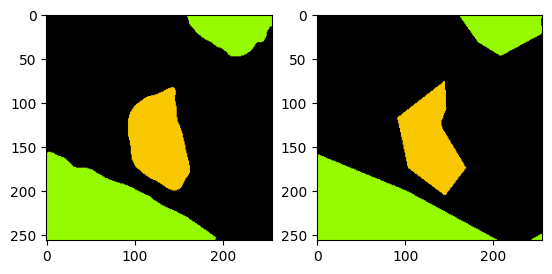

[2023-05-30 22:52:37 swanet_v5](182747771.py 311): INFO Test: [367/728]	Loss 0.0607 (0.3934)	PA@1 97.4762 (90.5314)	MPA@1 94.8701 (82.5971)	KAPPA@1 94.4316 (78.2350)	MIOU@1 92.3024 (72.2846)	FWIOU@1 95.0870 (85.8206)	Mem 44806MB


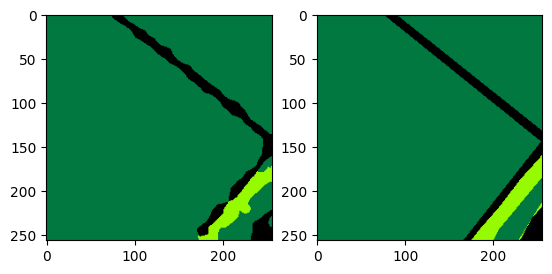

[2023-05-30 22:52:38 swanet_v5](182747771.py 311): INFO Test: [368/728]	Loss 0.0706 (0.3926)	PA@1 97.1619 (90.5494)	MPA@1 90.0329 (82.6173)	KAPPA@1 82.4311 (78.2464)	MIOU@1 79.3225 (72.3037)	FWIOU@1 94.8580 (85.8451)	Mem 44806MB


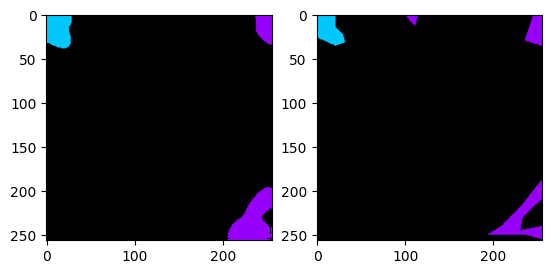

[2023-05-30 22:52:38 swanet_v5](182747771.py 311): INFO Test: [369/728]	Loss 0.0488 (0.3916)	PA@1 97.8622 (90.5691)	MPA@1 80.8720 (82.6126)	KAPPA@1 76.1007 (78.2406)	MIOU@1 76.5724 (72.3153)	FWIOU@1 95.9985 (85.8725)	Mem 44806MB


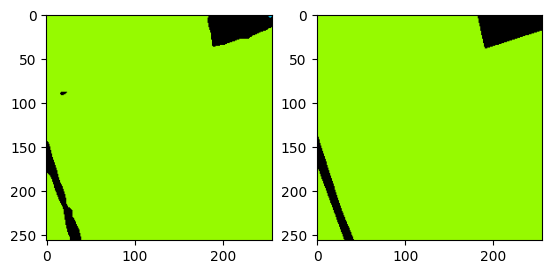

[2023-05-30 22:52:38 swanet_v5](182747771.py 311): INFO Test: [370/728]	Loss 0.0153 (0.3906)	PA@1 99.4324 (90.5930)	MPA@1 65.2753 (82.5658)	KAPPA@1 93.7383 (78.2824)	MIOU@1 62.7157 (72.2894)	FWIOU@1 98.9100 (85.9076)	Mem 44806MB


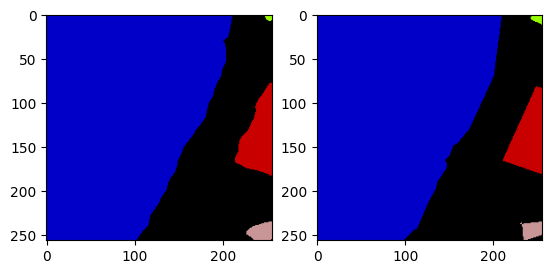

[2023-05-30 22:52:38 swanet_v5](182747771.py 311): INFO Test: [371/728]	Loss 0.0316 (0.3896)	PA@1 98.7106 (90.6149)	MPA@1 94.2769 (82.5973)	KAPPA@1 97.3304 (78.3336)	MIOU@1 80.1940 (72.3106)	FWIOU@1 97.5503 (85.9389)	Mem 44806MB


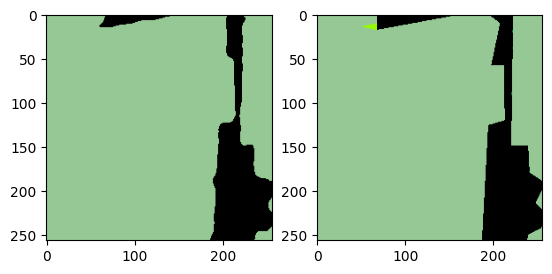

[2023-05-30 22:52:38 swanet_v5](182747771.py 311): INFO Test: [372/728]	Loss 0.0619 (0.3888)	PA@1 97.8806 (90.6343)	MPA@1 97.2669 (82.6367)	KAPPA@1 91.2192 (78.3681)	MIOU@1 45.9882 (72.2401)	FWIOU@1 96.1125 (85.9662)	Mem 44806MB


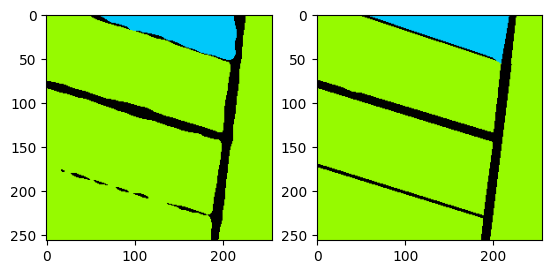

[2023-05-30 22:52:39 swanet_v5](182747771.py 311): INFO Test: [373/728]	Loss 0.0490 (0.3879)	PA@1 97.9843 (90.6540)	MPA@1 94.9016 (82.6695)	KAPPA@1 92.6310 (78.4063)	MIOU@1 90.1912 (72.2881)	FWIOU@1 96.2444 (85.9937)	Mem 44806MB


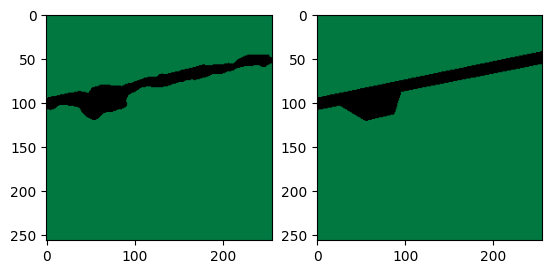

[2023-05-30 22:52:39 swanet_v5](182747771.py 311): INFO Test: [374/728]	Loss 0.0356 (0.3869)	PA@1 98.7061 (90.6755)	MPA@1 98.0296 (82.7104)	KAPPA@1 89.8090 (78.4367)	MIOU@1 90.6345 (72.3370)	FWIOU@1 97.6088 (86.0247)	Mem 44806MB


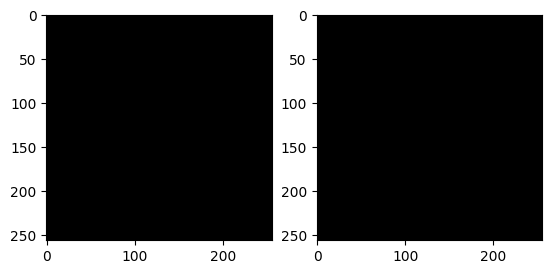

[2023-05-30 22:52:39 swanet_v5](182747771.py 311): INFO Test: [375/728]	Loss 0.0004 (0.3859)	PA@1 100.0000 (90.7003)	MPA@1 100.0000 (82.7564)	KAPPA@1 100.0000 (78.4940)	MIOU@1 100.0000 (72.4106)	FWIOU@1 100.0000 (86.0618)	Mem 44806MB


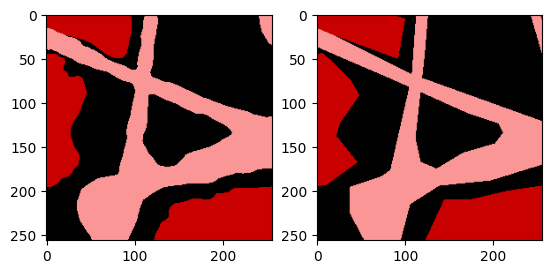

[2023-05-30 22:52:39 swanet_v5](182747771.py 311): INFO Test: [376/728]	Loss 0.0988 (0.3851)	PA@1 95.9015 (90.7141)	MPA@1 95.6519 (82.7906)	KAPPA@1 93.4435 (78.5337)	MIOU@1 92.1581 (72.4629)	FWIOU@1 92.1209 (86.0779)	Mem 44806MB


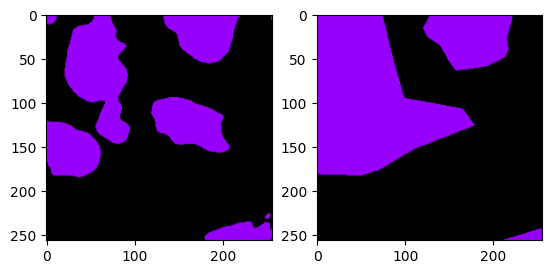

[2023-05-30 22:52:40 swanet_v5](182747771.py 311): INFO Test: [377/728]	Loss 0.5271 (0.3855)	PA@1 80.4581 (90.6869)	MPA@1 81.0973 (82.7861)	KAPPA@1 56.0434 (78.4742)	MIOU@1 64.2924 (72.4413)	FWIOU@1 68.9170 (86.0325)	Mem 44806MB


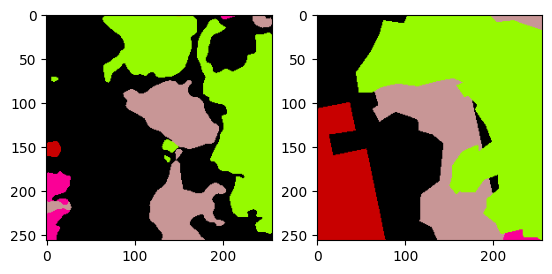

[2023-05-30 22:52:40 swanet_v5](182747771.py 311): INFO Test: [378/728]	Loss 1.4232 (0.3882)	PA@1 65.4114 (90.6202)	MPA@1 55.5601 (82.7143)	KAPPA@1 51.2250 (78.4023)	MIOU@1 29.7001 (72.3285)	FWIOU@1 51.4943 (85.9414)	Mem 44806MB


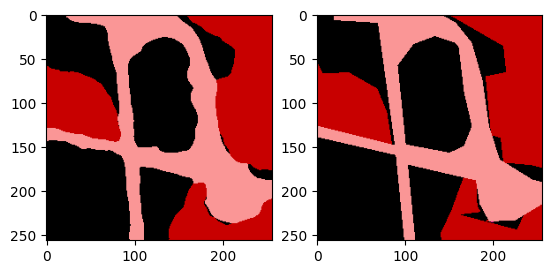

[2023-05-30 22:52:40 swanet_v5](182747771.py 311): INFO Test: [379/728]	Loss 0.1177 (0.3875)	PA@1 95.2682 (90.6325)	MPA@1 94.7250 (82.7459)	KAPPA@1 92.6948 (78.4399)	MIOU@1 68.2061 (72.3177)	FWIOU@1 90.9696 (85.9546)	Mem 44806MB


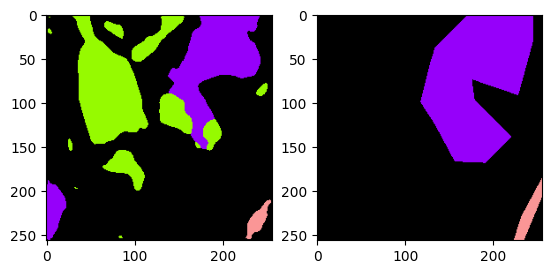

[2023-05-30 22:52:40 swanet_v5](182747771.py 311): INFO Test: [380/728]	Loss 1.0504 (0.3893)	PA@1 72.7203 (90.5855)	MPA@1 63.2814 (82.6948)	KAPPA@1 37.5630 (78.3326)	MIOU@1 41.3978 (72.2365)	FWIOU@1 55.7345 (85.8753)	Mem 44806MB


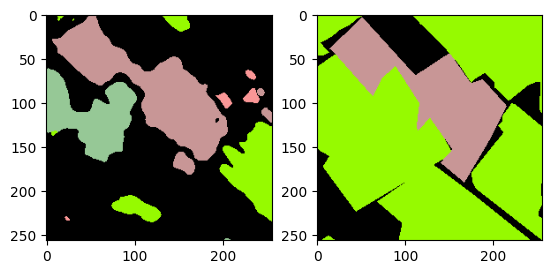

[2023-05-30 22:52:40 swanet_v5](182747771.py 311): INFO Test: [381/728]	Loss 3.3197 (0.3969)	PA@1 39.7125 (90.4523)	MPA@1 42.3747 (82.5893)	KAPPA@1 24.8488 (78.1926)	MIOU@1 22.9823 (72.1076)	FWIOU@1 30.4572 (85.7302)	Mem 44806MB


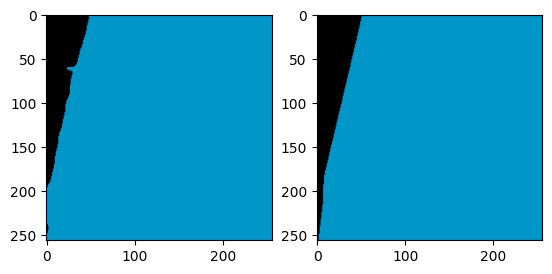

[2023-05-30 22:52:41 swanet_v5](182747771.py 311): INFO Test: [382/728]	Loss 0.0373 (0.3960)	PA@1 98.5382 (90.4734)	MPA@1 99.2098 (82.6326)	KAPPA@1 90.3302 (78.2243)	MIOU@1 91.0539 (72.1571)	FWIOU@1 97.3149 (85.7605)	Mem 44806MB


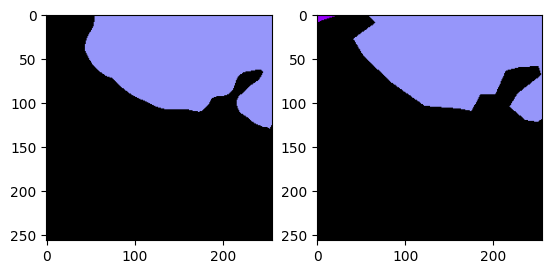

[2023-05-30 22:52:41 swanet_v5](182747771.py 311): INFO Test: [383/728]	Loss 0.0622 (0.3951)	PA@1 97.4167 (90.4915)	MPA@1 95.9655 (82.6674)	KAPPA@1 93.7740 (78.2648)	MIOU@1 62.8487 (72.1328)	FWIOU@1 95.1149 (85.7848)	Mem 44806MB


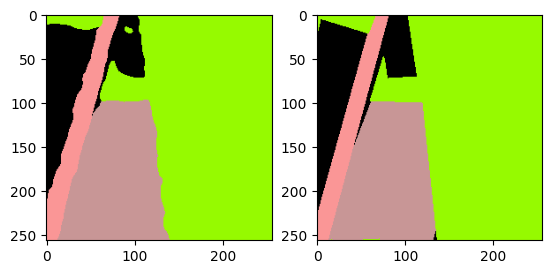

[2023-05-30 22:52:41 swanet_v5](182747771.py 311): INFO Test: [384/728]	Loss 0.0529 (0.3942)	PA@1 97.9996 (90.5110)	MPA@1 96.3990 (82.7030)	KAPPA@1 96.6969 (78.3126)	MIOU@1 93.6544 (72.1887)	FWIOU@1 96.1429 (85.8117)	Mem 44806MB


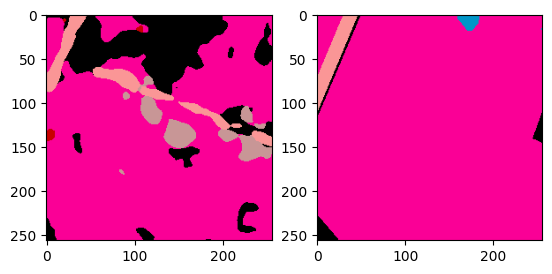

[2023-05-30 22:52:41 swanet_v5](182747771.py 311): INFO Test: [385/728]	Loss 1.0038 (0.3958)	PA@1 73.9624 (90.4681)	MPA@1 28.0920 (82.5616)	KAPPA@1 14.5637 (78.1475)	MIOU@1 18.6012 (72.0499)	FWIOU@1 55.8063 (85.7340)	Mem 44806MB


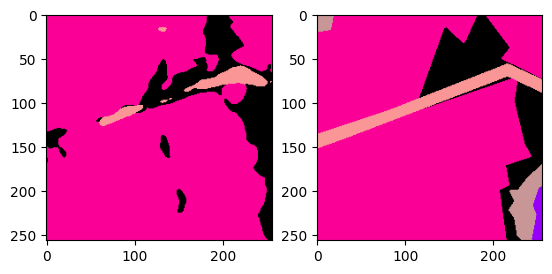

[2023-05-30 22:52:41 swanet_v5](182747771.py 311): INFO Test: [386/728]	Loss 0.9839 (0.3973)	PA@1 83.8608 (90.4510)	MPA@1 76.1067 (82.5449)	KAPPA@1 52.0930 (78.0802)	MIOU@1 32.3033 (71.9472)	FWIOU@1 77.8048 (85.7135)	Mem 44806MB


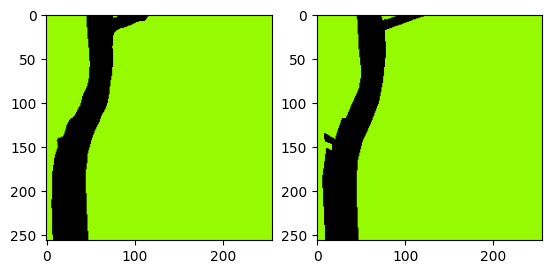

[2023-05-30 22:52:41 swanet_v5](182747771.py 311): INFO Test: [387/728]	Loss 0.0243 (0.3964)	PA@1 98.9914 (90.4730)	MPA@1 97.7708 (82.5841)	KAPPA@1 95.7505 (78.1257)	MIOU@1 95.8835 (72.0089)	FWIOU@1 98.0222 (85.7452)	Mem 44806MB


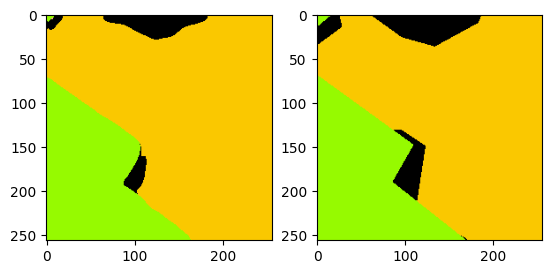

[2023-05-30 22:52:42 swanet_v5](182747771.py 311): INFO Test: [388/728]	Loss 0.0764 (0.3956)	PA@1 96.4600 (90.4884)	MPA@1 72.7191 (82.5588)	KAPPA@1 92.3835 (78.1624)	MIOU@1 62.4496 (71.9843)	FWIOU@1 94.2844 (85.7672)	Mem 44806MB


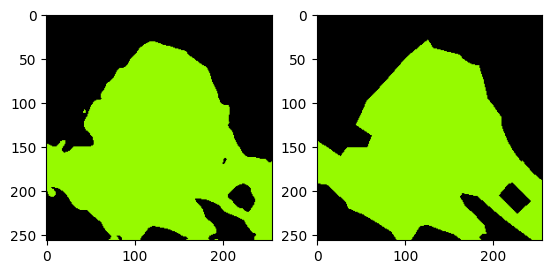

[2023-05-30 22:52:42 swanet_v5](182747771.py 311): INFO Test: [389/728]	Loss 0.0819 (0.3948)	PA@1 96.3043 (90.5033)	MPA@1 96.5013 (82.5945)	KAPPA@1 92.5830 (78.1993)	MIOU@1 92.8448 (72.0378)	FWIOU@1 92.8842 (85.7854)	Mem 44806MB


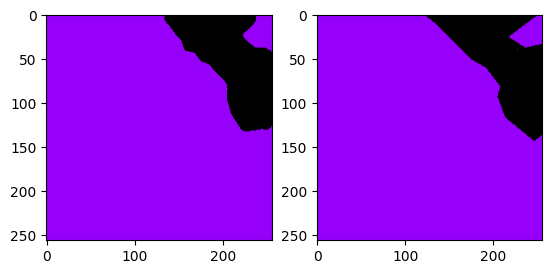

[2023-05-30 22:52:42 swanet_v5](182747771.py 311): INFO Test: [390/728]	Loss 0.0302 (0.3938)	PA@1 98.8617 (90.5247)	MPA@1 97.8594 (82.6336)	KAPPA@1 95.1007 (78.2426)	MIOU@1 95.2776 (72.0972)	FWIOU@1 97.7841 (85.8161)	Mem 44806MB


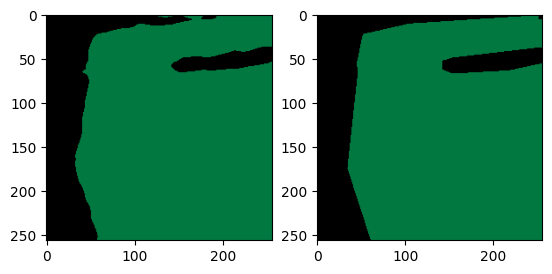

[2023-05-30 22:52:42 swanet_v5](182747771.py 311): INFO Test: [391/728]	Loss 0.0484 (0.3929)	PA@1 98.0423 (90.5439)	MPA@1 97.7031 (82.6720)	KAPPA@1 94.5316 (78.2841)	MIOU@1 94.7161 (72.1549)	FWIOU@1 96.2049 (85.8426)	Mem 44806MB


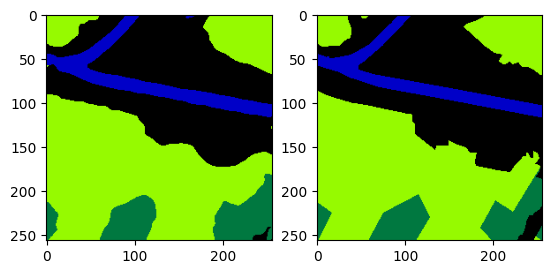

[2023-05-30 22:52:43 swanet_v5](182747771.py 311): INFO Test: [392/728]	Loss 0.1105 (0.3922)	PA@1 95.5307 (90.5566)	MPA@1 92.3956 (82.6967)	KAPPA@1 92.8929 (78.3213)	MIOU@1 88.9714 (72.1977)	FWIOU@1 91.4584 (85.8569)	Mem 44806MB


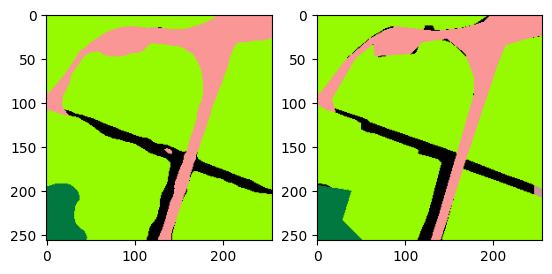

[2023-05-30 22:52:43 swanet_v5](182747771.py 311): INFO Test: [393/728]	Loss 0.0966 (0.3915)	PA@1 96.8536 (90.5726)	MPA@1 93.2864 (82.7236)	KAPPA@1 92.1979 (78.3565)	MIOU@1 70.7626 (72.1941)	FWIOU@1 94.1921 (85.8781)	Mem 44806MB


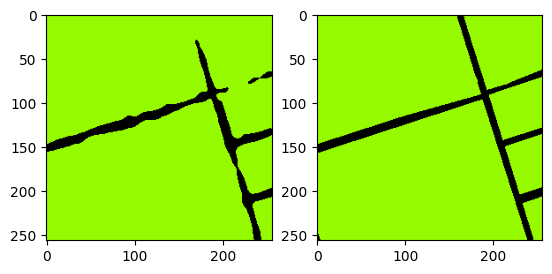

[2023-05-30 22:52:43 swanet_v5](182747771.py 311): INFO Test: [394/728]	Loss 0.0560 (0.3906)	PA@1 97.8027 (90.5909)	MPA@1 92.3493 (82.7480)	KAPPA@1 83.3505 (78.3691)	MIOU@1 85.4358 (72.2276)	FWIOU@1 95.9553 (85.9036)	Mem 44806MB


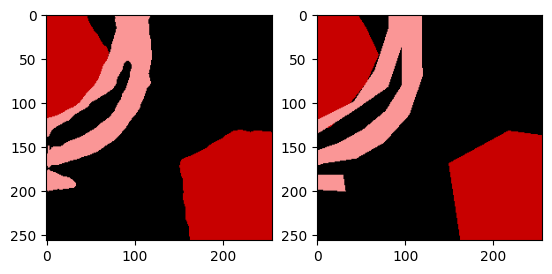

[2023-05-30 22:52:43 swanet_v5](182747771.py 311): INFO Test: [395/728]	Loss 0.0550 (0.3898)	PA@1 97.8882 (90.6093)	MPA@1 97.1504 (82.7844)	KAPPA@1 96.1215 (78.4140)	MIOU@1 94.2838 (72.2833)	FWIOU@1 95.9127 (85.9289)	Mem 44806MB


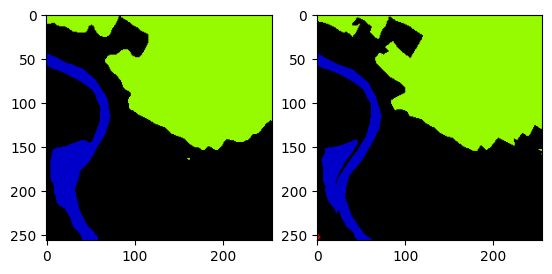

[2023-05-30 22:52:43 swanet_v5](182747771.py 311): INFO Test: [396/728]	Loss 0.0749 (0.3890)	PA@1 97.3480 (90.6263)	MPA@1 94.4905 (82.8138)	KAPPA@1 95.0692 (78.4559)	MIOU@1 69.1893 (72.2755)	FWIOU@1 94.8593 (85.9513)	Mem 44806MB


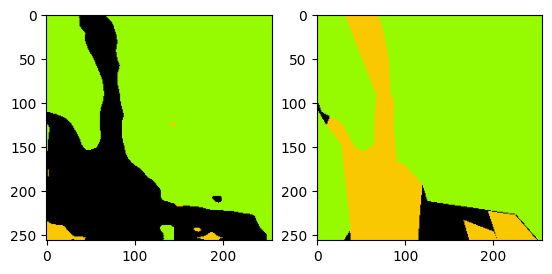

[2023-05-30 22:52:44 swanet_v5](182747771.py 311): INFO Test: [397/728]	Loss 1.2339 (0.3911)	PA@1 70.6573 (90.5761)	MPA@1 45.5510 (82.7202)	KAPPA@1 39.8199 (78.3589)	MIOU@1 34.2723 (72.1800)	FWIOU@1 63.6625 (85.8953)	Mem 44806MB


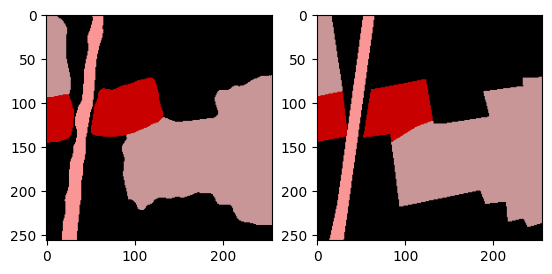

[2023-05-30 22:52:44 swanet_v5](182747771.py 311): INFO Test: [398/728]	Loss 0.0789 (0.3903)	PA@1 96.7285 (90.5915)	MPA@1 94.1778 (82.7489)	KAPPA@1 94.4699 (78.3992)	MIOU@1 90.7134 (72.2265)	FWIOU@1 93.6860 (85.9149)	Mem 44806MB


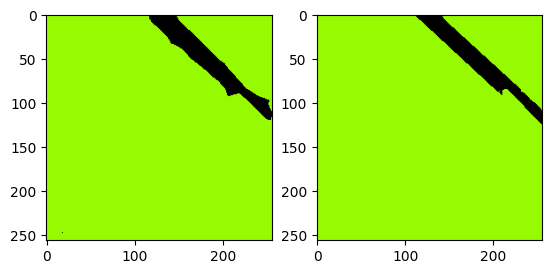

[2023-05-30 22:52:44 swanet_v5](182747771.py 311): INFO Test: [399/728]	Loss 0.0238 (0.3894)	PA@1 99.0540 (90.6127)	MPA@1 93.4037 (82.7756)	KAPPA@1 89.5105 (78.4270)	MIOU@1 90.4203 (72.2720)	FWIOU@1 98.1718 (85.9455)	Mem 44806MB


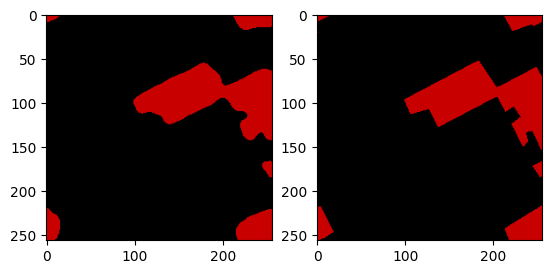

[2023-05-30 22:52:44 swanet_v5](182747771.py 311): INFO Test: [400/728]	Loss 0.0346 (0.3885)	PA@1 98.6954 (90.6328)	MPA@1 96.8551 (82.8107)	KAPPA@1 94.7148 (78.4676)	MIOU@1 94.9162 (72.3284)	FWIOU@1 97.4437 (85.9742)	Mem 44806MB


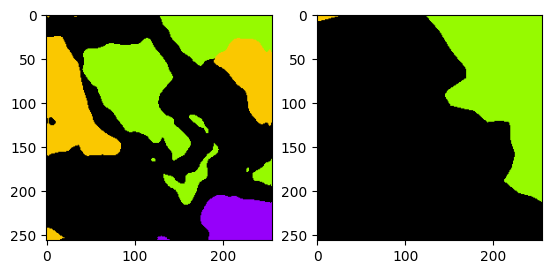

[2023-05-30 22:52:44 swanet_v5](182747771.py 311): INFO Test: [401/728]	Loss 1.8041 (0.3920)	PA@1 53.7613 (90.5411)	MPA@1 29.1441 (82.6772)	KAPPA@1 10.9454 (78.2997)	MIOU@1 18.4337 (72.1944)	FWIOU@1 34.4269 (85.8460)	Mem 44806MB


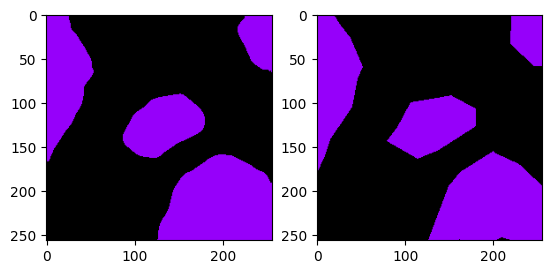

[2023-05-30 22:52:45 swanet_v5](182747771.py 311): INFO Test: [402/728]	Loss 0.0571 (0.3912)	PA@1 97.9370 (90.5595)	MPA@1 97.4426 (82.7138)	KAPPA@1 95.3537 (78.3420)	MIOU@1 95.4702 (72.2521)	FWIOU@1 95.9575 (85.8710)	Mem 44806MB


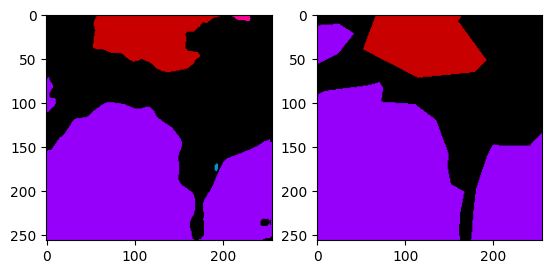

[2023-05-30 22:52:45 swanet_v5](182747771.py 311): INFO Test: [403/728]	Loss 0.4148 (0.3913)	PA@1 87.3352 (90.5515)	MPA@1 53.1429 (82.6406)	KAPPA@1 78.5465 (78.3425)	MIOU@1 45.4087 (72.1857)	FWIOU@1 77.3486 (85.8500)	Mem 44806MB


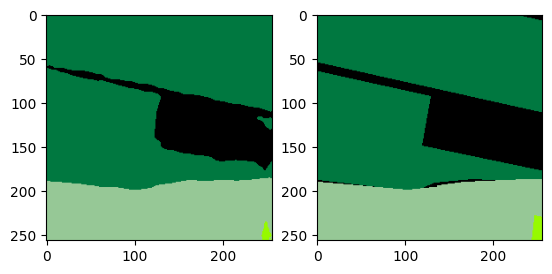

[2023-05-30 22:52:45 swanet_v5](182747771.py 311): INFO Test: [404/728]	Loss 0.0675 (0.3905)	PA@1 97.4365 (90.5685)	MPA@1 98.3455 (82.6794)	KAPPA@1 95.3965 (78.3846)	MIOU@1 82.2167 (72.2105)	FWIOU@1 95.2906 (85.8733)	Mem 44806MB


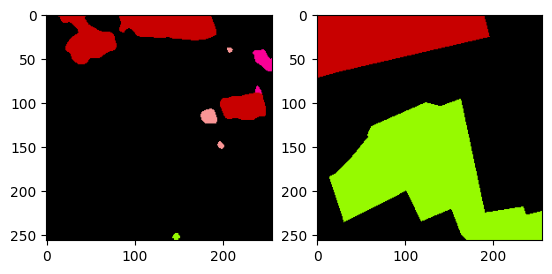

[2023-05-30 22:52:45 swanet_v5](182747771.py 311): INFO Test: [405/728]	Loss 2.9393 (0.3967)	PA@1 60.8963 (90.4954)	MPA@1 27.7373 (82.5441)	KAPPA@1 18.3756 (78.2368)	MIOU@1 20.5578 (72.0832)	FWIOU@1 55.9217 (85.7995)	Mem 44806MB


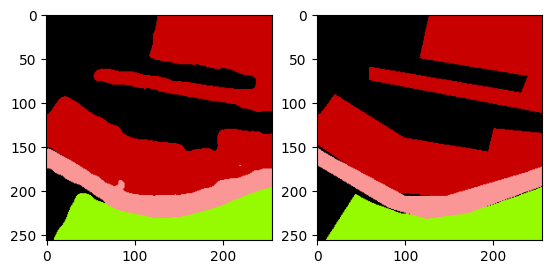

[2023-05-30 22:52:45 swanet_v5](182747771.py 311): INFO Test: [406/728]	Loss 0.0710 (0.3959)	PA@1 97.3221 (90.5122)	MPA@1 96.2720 (82.5778)	KAPPA@1 96.0330 (78.2805)	MIOU@1 94.1352 (72.1374)	FWIOU@1 94.7872 (85.8216)	Mem 44806MB


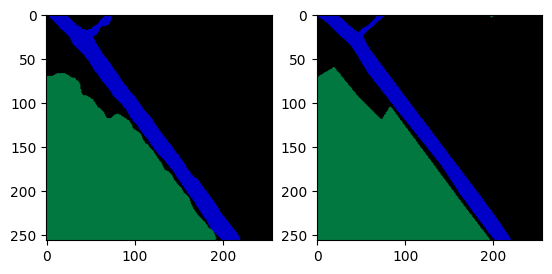

[2023-05-30 22:52:46 swanet_v5](182747771.py 311): INFO Test: [407/728]	Loss 0.0464 (0.3951)	PA@1 98.2620 (90.5312)	MPA@1 96.0438 (82.6108)	KAPPA@1 96.8471 (78.3260)	MIOU@1 94.5396 (72.1923)	FWIOU@1 96.5812 (85.8479)	Mem 44806MB


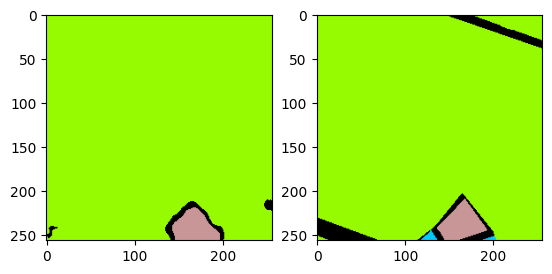

[2023-05-30 22:52:46 swanet_v5](182747771.py 311): INFO Test: [408/728]	Loss 0.1834 (0.3946)	PA@1 95.6329 (90.5436)	MPA@1 72.9088 (82.5871)	KAPPA@1 52.9083 (78.2639)	MIOU@1 43.3293 (72.1217)	FWIOU@1 94.7806 (85.8698)	Mem 44806MB


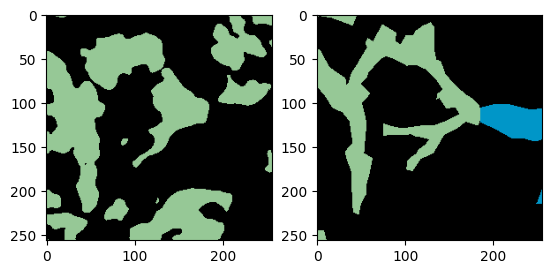

[2023-05-30 22:52:46 swanet_v5](182747771.py 311): INFO Test: [409/728]	Loss 1.0220 (0.3961)	PA@1 71.5179 (90.4972)	MPA@1 64.1594 (82.5421)	KAPPA@1 33.3127 (78.1542)	MIOU@1 34.2024 (72.0293)	FWIOU@1 55.8690 (85.7966)	Mem 44806MB


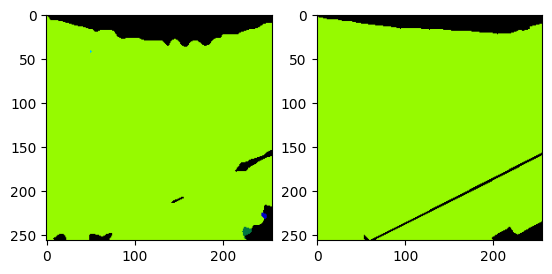

[2023-05-30 22:52:46 swanet_v5](182747771.py 311): INFO Test: [410/728]	Loss 0.1295 (0.3955)	PA@1 94.9844 (90.5082)	MPA@1 32.5817 (82.4206)	KAPPA@1 70.2913 (78.1351)	MIOU@1 30.5567 (71.9284)	FWIOU@1 90.6313 (85.8084)	Mem 44806MB


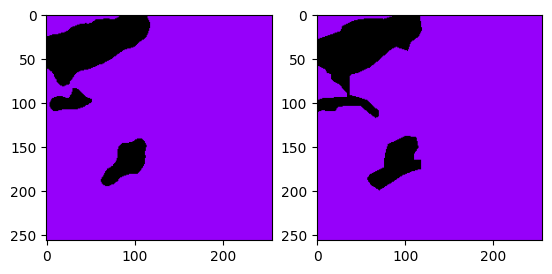

[2023-05-30 22:52:46 swanet_v5](182747771.py 311): INFO Test: [411/728]	Loss 0.0588 (0.3946)	PA@1 97.5082 (90.5251)	MPA@1 96.0933 (82.4538)	KAPPA@1 88.3913 (78.1600)	MIOU@1 89.3505 (71.9706)	FWIOU@1 95.3723 (85.8316)	Mem 44806MB


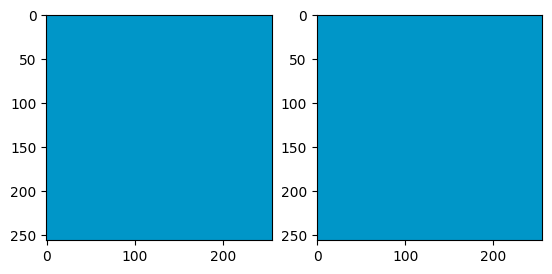

[2023-05-30 22:52:47 swanet_v5](182747771.py 311): INFO Test: [412/728]	Loss 0.0002 (0.3937)	PA@1 100.0000 (90.5481)	MPA@1 100.0000 (82.4963)	KAPPA@1 100.0000 (78.2129)	MIOU@1 100.0000 (72.0385)	FWIOU@1 100.0000 (85.8659)	Mem 44806MB


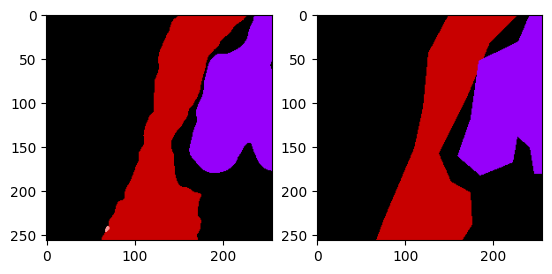

[2023-05-30 22:52:47 swanet_v5](182747771.py 311): INFO Test: [413/728]	Loss 0.0609 (0.3929)	PA@1 97.4548 (90.5648)	MPA@1 72.8803 (82.4730)	KAPPA@1 95.5398 (78.2547)	MIOU@1 70.9794 (72.0360)	FWIOU@1 95.0372 (85.8880)	Mem 44806MB


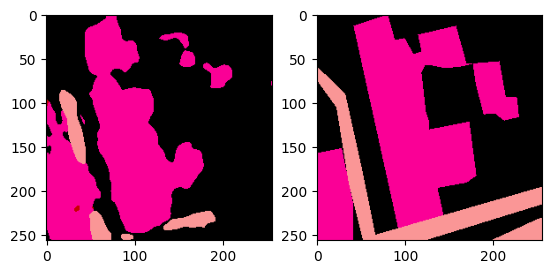

[2023-05-30 22:52:47 swanet_v5](182747771.py 311): INFO Test: [414/728]	Loss 0.8393 (0.3940)	PA@1 78.0579 (90.5346)	MPA@1 62.4245 (82.4247)	KAPPA@1 60.1591 (78.2111)	MIOU@1 41.2634 (71.9618)	FWIOU@1 66.3279 (85.8409)	Mem 44806MB


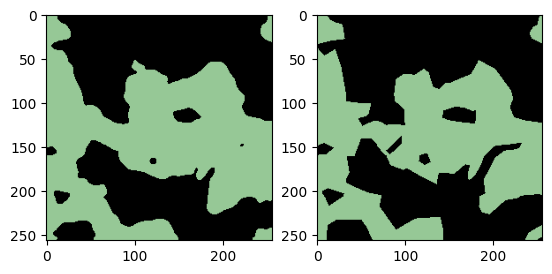

[2023-05-30 22:52:47 swanet_v5](182747771.py 311): INFO Test: [415/728]	Loss 0.1560 (0.3934)	PA@1 93.3472 (90.5414)	MPA@1 93.3950 (82.4511)	KAPPA@1 86.7058 (78.2315)	MIOU@1 87.5100 (71.9992)	FWIOU@1 87.5056 (85.8449)	Mem 44806MB


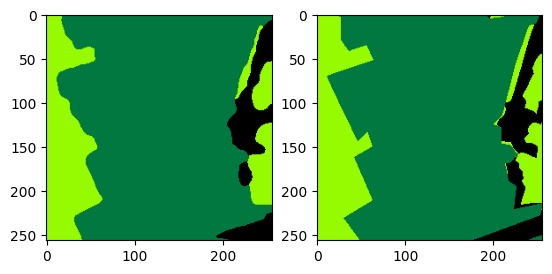

[2023-05-30 22:52:47 swanet_v5](182747771.py 311): INFO Test: [416/728]	Loss 0.1009 (0.3927)	PA@1 96.4600 (90.5556)	MPA@1 95.1683 (82.4816)	KAPPA@1 91.7956 (78.2641)	MIOU@1 87.5442 (72.0365)	FWIOU@1 93.4308 (85.8631)	Mem 44806MB


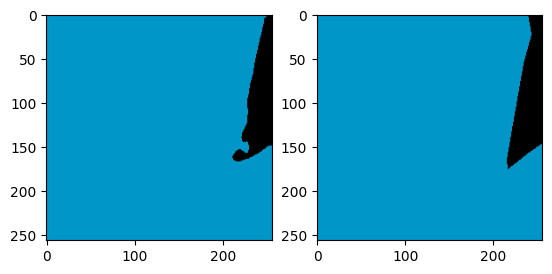

[2023-05-30 22:52:48 swanet_v5](182747771.py 311): INFO Test: [417/728]	Loss 0.0213 (0.3918)	PA@1 98.9792 (90.5757)	MPA@1 98.7577 (82.5205)	KAPPA@1 90.8866 (78.2943)	MIOU@1 91.5636 (72.0832)	FWIOU@1 98.1075 (85.8924)	Mem 44806MB


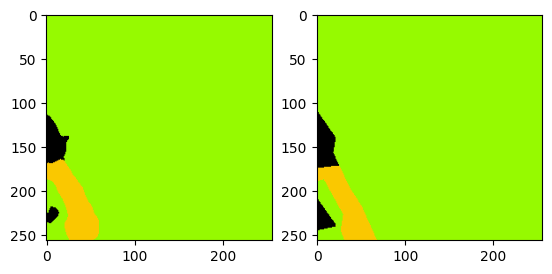

[2023-05-30 22:52:48 swanet_v5](182747771.py 311): INFO Test: [418/728]	Loss 0.0368 (0.3909)	PA@1 98.5092 (90.5947)	MPA@1 90.8360 (82.5404)	KAPPA@1 86.7297 (78.3144)	MIOU@1 81.2402 (72.1050)	FWIOU@1 97.2873 (85.9196)	Mem 44806MB


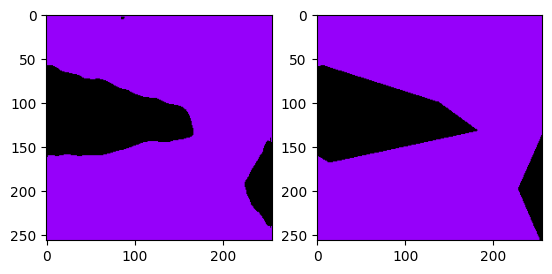

[2023-05-30 22:52:48 swanet_v5](182747771.py 311): INFO Test: [419/728]	Loss 0.0474 (0.3901)	PA@1 98.0026 (90.6123)	MPA@1 97.2806 (82.5755)	KAPPA@1 93.8823 (78.3515)	MIOU@1 94.1231 (72.1575)	FWIOU@1 96.1361 (85.9439)	Mem 44806MB


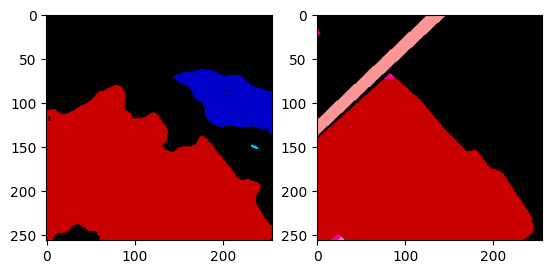

[2023-05-30 22:52:48 swanet_v5](182747771.py 311): INFO Test: [420/728]	Loss 0.7165 (0.3909)	PA@1 82.5974 (90.5933)	MPA@1 44.6173 (82.4853)	KAPPA@1 68.7401 (78.3286)	MIOU@1 22.4774 (72.0394)	FWIOU@1 72.8057 (85.9127)	Mem 44806MB


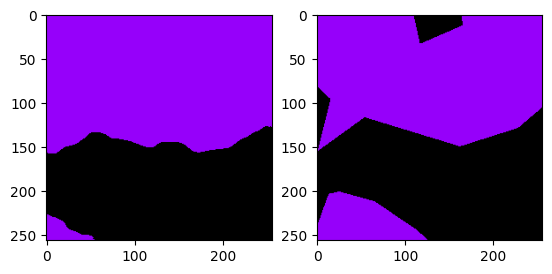

[2023-05-30 22:52:48 swanet_v5](182747771.py 311): INFO Test: [421/728]	Loss 0.5791 (0.3913)	PA@1 86.9492 (90.5846)	MPA@1 86.8954 (82.4958)	KAPPA@1 73.3541 (78.3169)	MIOU@1 76.5306 (72.0501)	FWIOU@1 77.0148 (85.8916)	Mem 44806MB


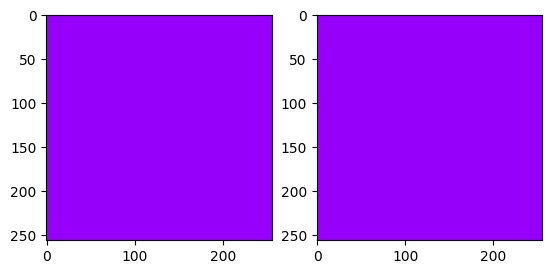

[2023-05-30 22:52:49 swanet_v5](182747771.py 311): INFO Test: [422/728]	Loss 0.0028 (0.3904)	PA@1 99.9985 (90.6069)	MPA@1 50.0000 (82.4189)	KAPPA@1 0.0000 (78.1317)	MIOU@1 49.9992 (71.9980)	FWIOU@1 99.9969 (85.9250)	Mem 44806MB


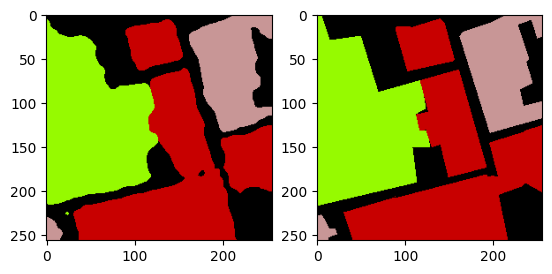

[2023-05-30 22:52:49 swanet_v5](182747771.py 311): INFO Test: [423/728]	Loss 0.1115 (0.3898)	PA@1 95.3781 (90.6181)	MPA@1 95.2409 (82.4492)	KAPPA@1 93.6490 (78.1683)	MIOU@1 91.0729 (72.0429)	FWIOU@1 91.3151 (85.9377)	Mem 44806MB


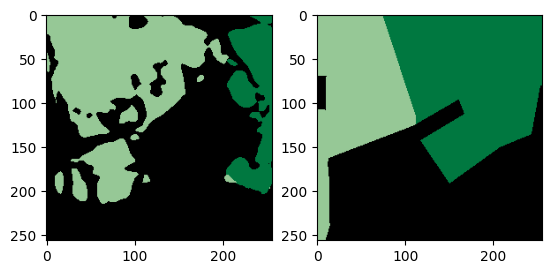

[2023-05-30 22:52:49 swanet_v5](182747771.py 311): INFO Test: [424/728]	Loss 2.0807 (0.3937)	PA@1 52.6733 (90.5289)	MPA@1 54.8777 (82.3843)	KAPPA@1 27.5292 (78.0491)	MIOU@1 33.1233 (71.9514)	FWIOU@1 40.7301 (85.8313)	Mem 44806MB


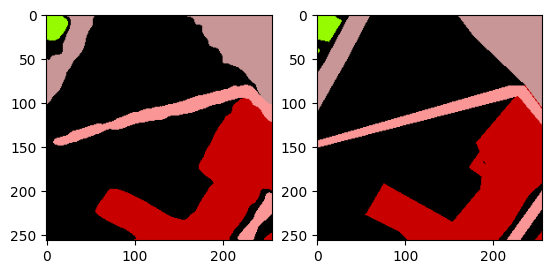

[2023-05-30 22:52:49 swanet_v5](182747771.py 311): INFO Test: [425/728]	Loss 0.0894 (0.3930)	PA@1 96.5134 (90.5429)	MPA@1 95.1161 (82.4142)	KAPPA@1 93.8505 (78.0862)	MIOU@1 90.1878 (71.9942)	FWIOU@1 93.2942 (85.8488)	Mem 44806MB


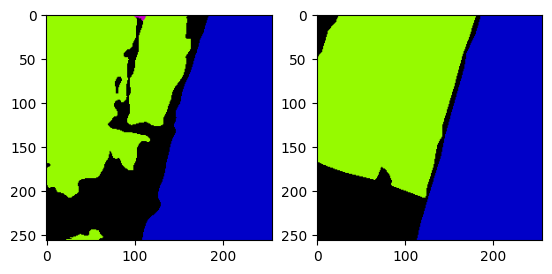

[2023-05-30 22:52:49 swanet_v5](182747771.py 311): INFO Test: [426/728]	Loss 0.3108 (0.3928)	PA@1 87.3871 (90.5355)	MPA@1 61.8220 (82.3660)	KAPPA@1 80.0738 (78.0909)	MIOU@1 55.1290 (71.9547)	FWIOU@1 78.9389 (85.8327)	Mem 44806MB


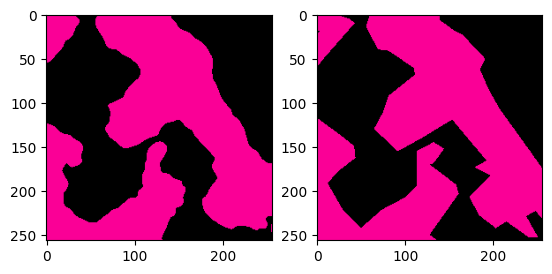

[2023-05-30 22:52:50 swanet_v5](182747771.py 311): INFO Test: [427/728]	Loss 0.0948 (0.3921)	PA@1 96.0938 (90.5485)	MPA@1 96.0920 (82.3980)	KAPPA@1 92.1870 (78.1238)	MIOU@1 92.4807 (72.0026)	FWIOU@1 92.4810 (85.8482)	Mem 44806MB


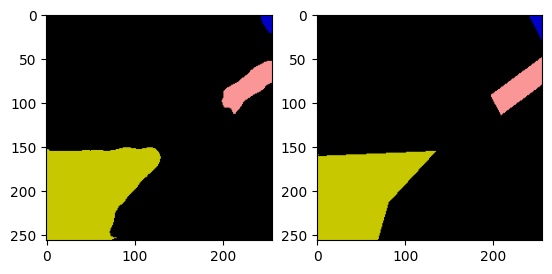

[2023-05-30 22:52:50 swanet_v5](182747771.py 311): INFO Test: [428/728]	Loss 0.0475 (0.3913)	PA@1 98.0194 (90.5659)	MPA@1 96.4610 (82.4308)	KAPPA@1 93.3400 (78.1593)	MIOU@1 69.4773 (71.9968)	FWIOU@1 96.1479 (85.8722)	Mem 44806MB


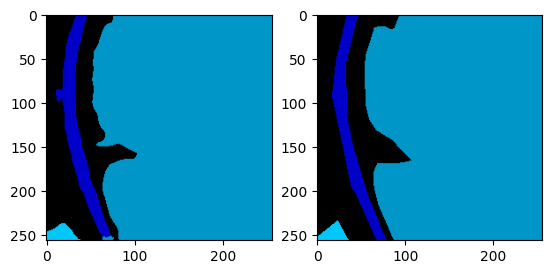

[2023-05-30 22:52:50 swanet_v5](182747771.py 311): INFO Test: [429/728]	Loss 0.0658 (0.3906)	PA@1 97.3190 (90.5816)	MPA@1 92.4136 (82.4540)	KAPPA@1 93.5057 (78.1950)	MIOU@1 87.4850 (72.0328)	FWIOU@1 94.9719 (85.8934)	Mem 44806MB


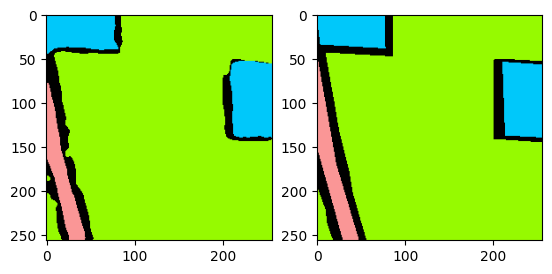

[2023-05-30 22:52:50 swanet_v5](182747771.py 311): INFO Test: [430/728]	Loss 0.0675 (0.3898)	PA@1 97.0383 (90.5966)	MPA@1 94.0622 (82.4810)	KAPPA@1 92.1346 (78.2273)	MIOU@1 85.6485 (72.0644)	FWIOU@1 94.9085 (85.9143)	Mem 44806MB


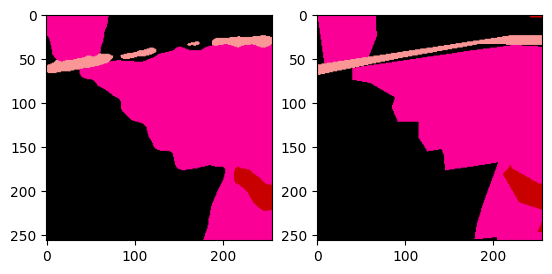

[2023-05-30 22:52:51 swanet_v5](182747771.py 311): INFO Test: [431/728]	Loss 0.0863 (0.3891)	PA@1 96.5912 (90.6105)	MPA@1 92.6295 (82.5045)	KAPPA@1 93.7358 (78.2632)	MIOU@1 83.2566 (72.0903)	FWIOU@1 93.6346 (85.9321)	Mem 44806MB


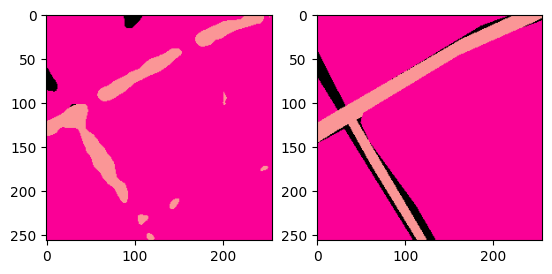

[2023-05-30 22:52:51 swanet_v5](182747771.py 311): INFO Test: [432/728]	Loss 0.2412 (0.3888)	PA@1 92.4896 (90.6148)	MPA@1 69.2617 (82.4739)	KAPPA@1 63.4881 (78.2291)	MIOU@1 53.3292 (72.0469)	FWIOU@1 89.6027 (85.9406)	Mem 44806MB


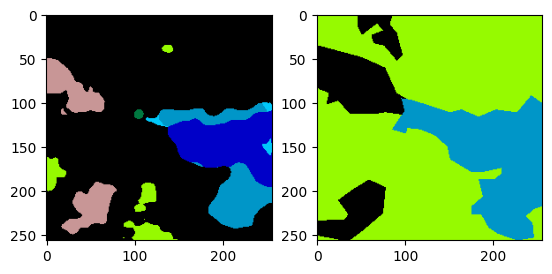

[2023-05-30 22:52:51 swanet_v5](182747771.py 311): INFO Test: [433/728]	Loss 4.2178 (0.3976)	PA@1 18.4875 (90.4486)	MPA@1 29.7847 (82.3525)	KAPPA@1 5.2406 (78.0609)	MIOU@1 6.9340 (71.8969)	FWIOU@1 10.5148 (85.7668)	Mem 44806MB


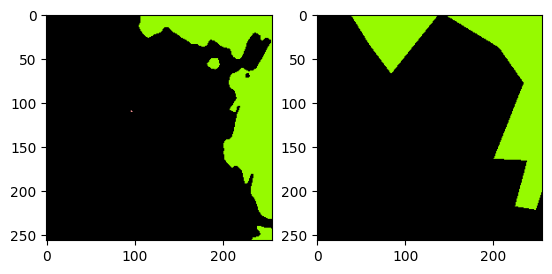

[2023-05-30 22:52:51 swanet_v5](182747771.py 311): INFO Test: [434/728]	Loss 0.3688 (0.3975)	PA@1 89.2303 (90.4458)	MPA@1 55.5650 (82.2909)	KAPPA@1 64.3094 (78.0293)	MIOU@1 47.5109 (71.8409)	FWIOU@1 81.8259 (85.7578)	Mem 44806MB


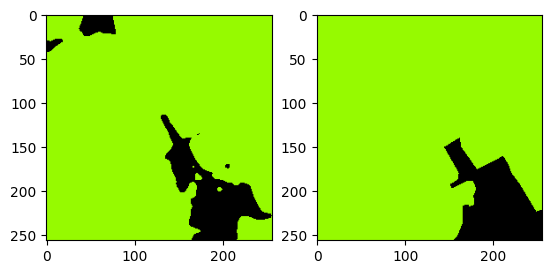

[2023-05-30 22:52:51 swanet_v5](182747771.py 311): INFO Test: [435/728]	Loss 0.2140 (0.3971)	PA@1 93.2327 (90.4522)	MPA@1 82.1994 (82.2907)	KAPPA@1 64.8578 (77.9991)	MIOU@1 72.4784 (71.8423)	FWIOU@1 88.2924 (85.7636)	Mem 44806MB


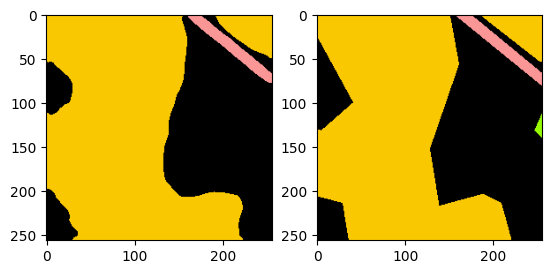

[2023-05-30 22:52:52 swanet_v5](182747771.py 311): INFO Test: [436/728]	Loss 0.1230 (0.3965)	PA@1 95.4788 (90.4637)	MPA@1 96.4901 (82.3232)	KAPPA@1 90.8782 (78.0286)	MIOU@1 68.7778 (71.8353)	FWIOU@1 91.6598 (85.7771)	Mem 44806MB


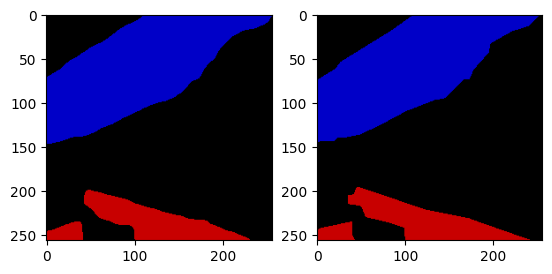

[2023-05-30 22:52:52 swanet_v5](182747771.py 311): INFO Test: [437/728]	Loss 0.0360 (0.3957)	PA@1 98.4970 (90.4821)	MPA@1 98.2875 (82.3596)	KAPPA@1 97.0611 (78.0720)	MIOU@1 95.4700 (71.8893)	FWIOU@1 97.0679 (85.8029)	Mem 44806MB


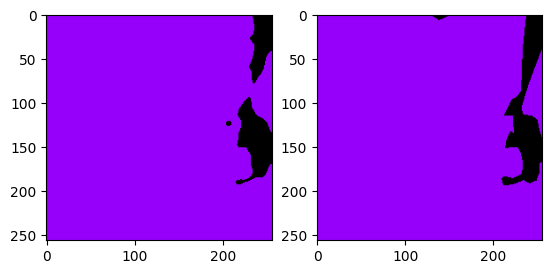

[2023-05-30 22:52:52 swanet_v5](182747771.py 311): INFO Test: [438/728]	Loss 0.0365 (0.3949)	PA@1 98.5870 (90.5005)	MPA@1 96.6183 (82.3921)	KAPPA@1 87.5359 (78.0936)	MIOU@1 88.7668 (71.9277)	FWIOU@1 97.4089 (85.8293)	Mem 44806MB


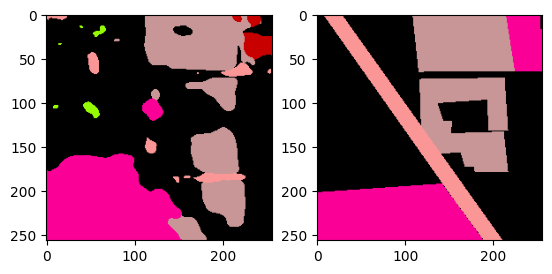

[2023-05-30 22:52:52 swanet_v5](182747771.py 311): INFO Test: [439/728]	Loss 1.3144 (0.3969)	PA@1 68.7088 (90.4510)	MPA@1 41.5172 (82.2992)	KAPPA@1 50.1902 (78.0302)	MIOU@1 28.9569 (71.8300)	FWIOU@1 54.8749 (85.7589)	Mem 44806MB


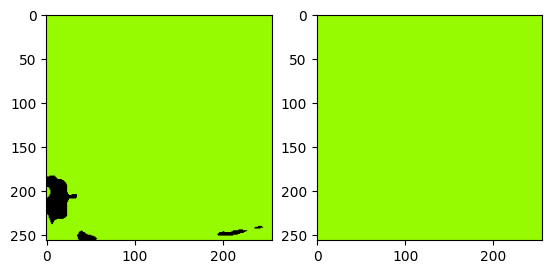

[2023-05-30 22:52:52 swanet_v5](182747771.py 311): INFO Test: [440/728]	Loss 0.0718 (0.3962)	PA@1 97.8470 (90.4678)	MPA@1 50.0000 (82.2260)	KAPPA@1 0.0000 (77.8532)	MIOU@1 48.9235 (71.7781)	FWIOU@1 95.7403 (85.7816)	Mem 44806MB


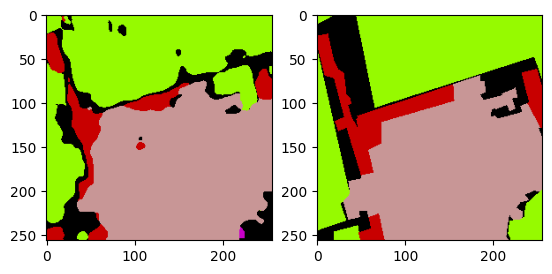

[2023-05-30 22:52:53 swanet_v5](182747771.py 311): INFO Test: [441/728]	Loss 0.6272 (0.3967)	PA@1 79.6768 (90.4434)	MPA@1 57.0550 (82.1690)	KAPPA@1 69.0927 (77.8334)	MIOU@1 45.0703 (71.7177)	FWIOU@1 70.6940 (85.7474)	Mem 44806MB


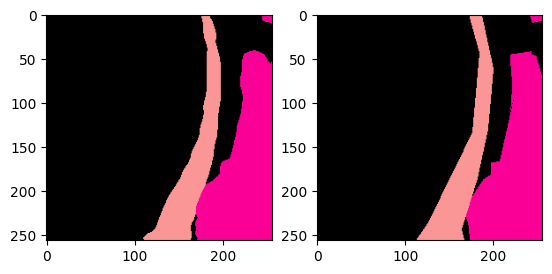

[2023-05-30 22:52:53 swanet_v5](182747771.py 311): INFO Test: [442/728]	Loss 0.0366 (0.3959)	PA@1 98.5367 (90.4616)	MPA@1 97.5712 (82.2038)	KAPPA@1 96.5766 (77.8757)	MIOU@1 95.3250 (71.7710)	FWIOU@1 97.1330 (85.7731)	Mem 44806MB


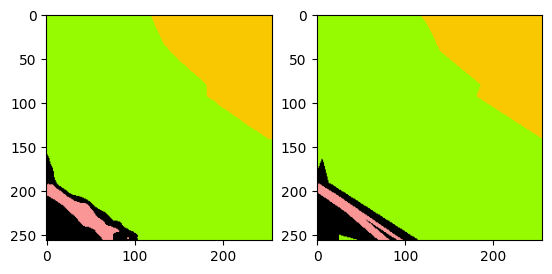

[2023-05-30 22:52:53 swanet_v5](182747771.py 311): INFO Test: [443/728]	Loss 0.0421 (0.3951)	PA@1 98.3871 (90.4795)	MPA@1 90.8067 (82.2232)	KAPPA@1 95.9293 (77.9164)	MIOU@1 85.5365 (71.8020)	FWIOU@1 97.0340 (85.7985)	Mem 44806MB


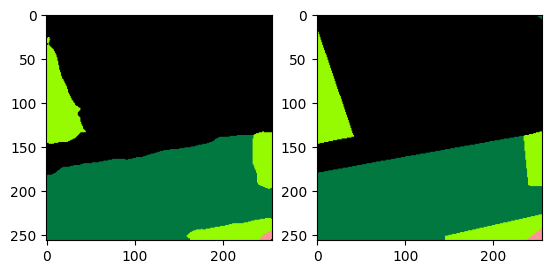

[2023-05-30 22:52:53 swanet_v5](182747771.py 311): INFO Test: [444/728]	Loss 0.0452 (0.3943)	PA@1 98.2483 (90.4969)	MPA@1 97.5905 (82.2577)	KAPPA@1 96.8301 (77.9589)	MIOU@1 87.8521 (71.8380)	FWIOU@1 96.6096 (85.8228)	Mem 44806MB


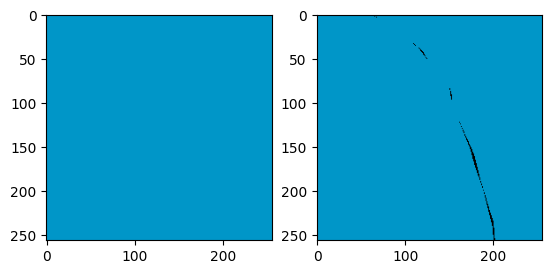

[2023-05-30 22:52:53 swanet_v5](182747771.py 311): INFO Test: [445/728]	Loss 0.0125 (0.3935)	PA@1 99.6384 (90.5174)	MPA@1 99.6384 (82.2967)	KAPPA@1 0.0000 (77.7841)	MIOU@1 49.8192 (71.7887)	FWIOU@1 99.6384 (85.8538)	Mem 44806MB


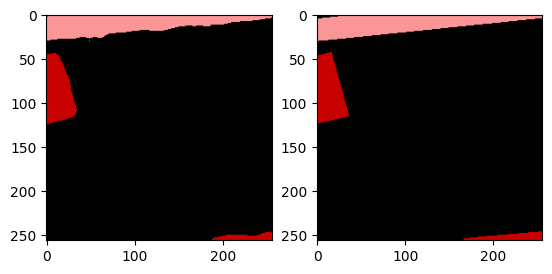

[2023-05-30 22:52:54 swanet_v5](182747771.py 311): INFO Test: [446/728]	Loss 0.0240 (0.3927)	PA@1 99.1287 (90.5367)	MPA@1 97.6206 (82.3309)	KAPPA@1 95.5432 (77.8238)	MIOU@1 94.1953 (71.8388)	FWIOU@1 98.3024 (85.8816)	Mem 44806MB


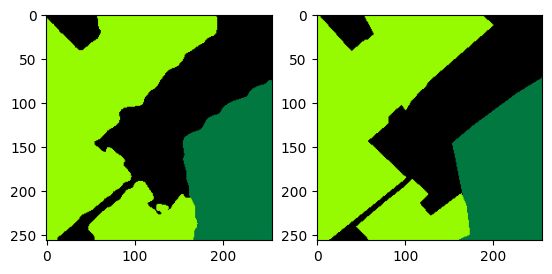

[2023-05-30 22:52:54 swanet_v5](182747771.py 311): INFO Test: [447/728]	Loss 0.0595 (0.3919)	PA@1 97.3007 (90.5518)	MPA@1 97.2800 (82.3643)	KAPPA@1 95.7611 (77.8639)	MIOU@1 71.2415 (71.8375)	FWIOU@1 94.7600 (85.9014)	Mem 44806MB


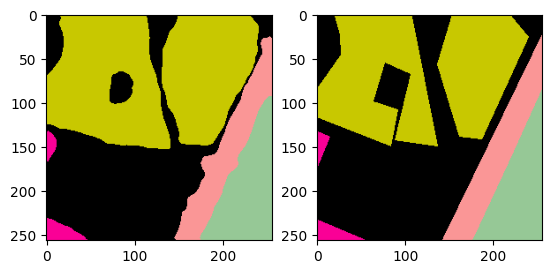

[2023-05-30 22:52:54 swanet_v5](182747771.py 311): INFO Test: [448/728]	Loss 0.2403 (0.3916)	PA@1 91.1652 (90.5532)	MPA@1 92.6886 (82.3873)	KAPPA@1 86.9627 (77.8841)	MIOU@1 86.4141 (71.8699)	FWIOU@1 83.9763 (85.8972)	Mem 44806MB


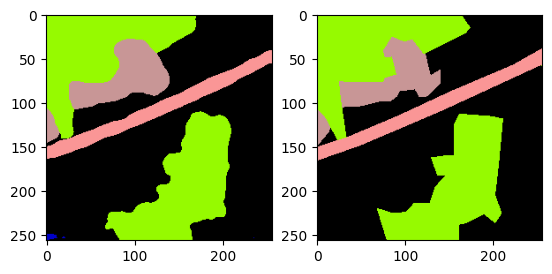

[2023-05-30 22:52:54 swanet_v5](182747771.py 311): INFO Test: [449/728]	Loss 0.0895 (0.3909)	PA@1 96.3943 (90.5661)	MPA@1 75.5144 (82.3720)	KAPPA@1 93.9352 (77.9198)	MIOU@1 72.6891 (71.8718)	FWIOU@1 93.0398 (85.9130)	Mem 44806MB


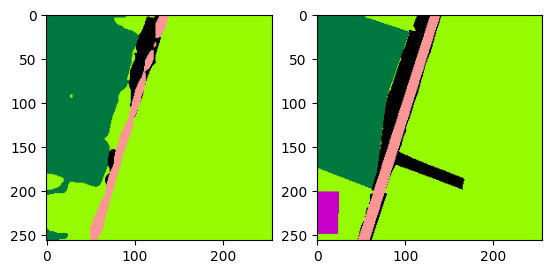

[2023-05-30 22:52:54 swanet_v5](182747771.py 311): INFO Test: [450/728]	Loss 0.4827 (0.3911)	PA@1 90.8142 (90.5667)	MPA@1 89.1708 (82.3871)	KAPPA@1 81.4550 (77.9276)	MIOU@1 55.4029 (71.8352)	FWIOU@1 87.3270 (85.9162)	Mem 44806MB


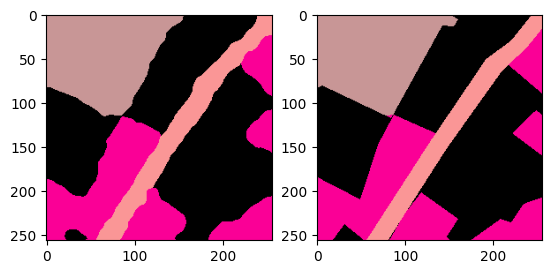

[2023-05-30 22:52:55 swanet_v5](182747771.py 311): INFO Test: [451/728]	Loss 0.0856 (0.3904)	PA@1 96.7743 (90.5804)	MPA@1 95.6509 (82.4164)	KAPPA@1 95.1833 (77.9658)	MIOU@1 93.1949 (71.8825)	FWIOU@1 93.7575 (85.9335)	Mem 44806MB


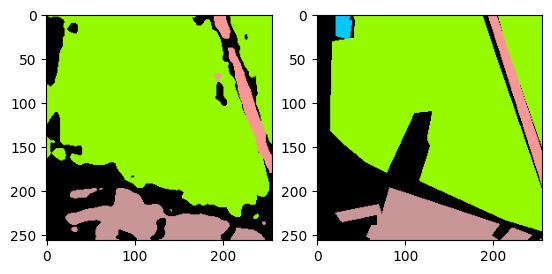

[2023-05-30 22:52:55 swanet_v5](182747771.py 311): INFO Test: [452/728]	Loss 0.4532 (0.3906)	PA@1 85.2005 (90.5686)	MPA@1 65.8034 (82.3798)	KAPPA@1 71.3247 (77.9511)	MIOU@1 46.6175 (71.8267)	FWIOU@1 76.2454 (85.9121)	Mem 44806MB


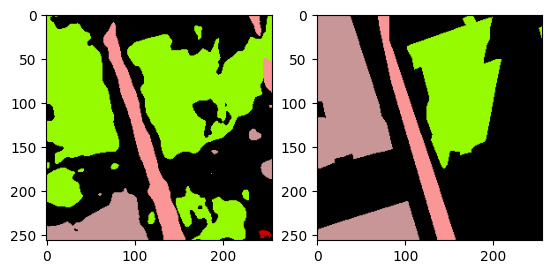

[2023-05-30 22:52:55 swanet_v5](182747771.py 311): INFO Test: [453/728]	Loss 2.8119 (0.3959)	PA@1 60.9009 (90.5032)	MPA@1 53.6414 (82.3165)	KAPPA@1 40.9217 (77.8696)	MIOU@1 35.3689 (71.7464)	FWIOU@1 44.6273 (85.8212)	Mem 44806MB


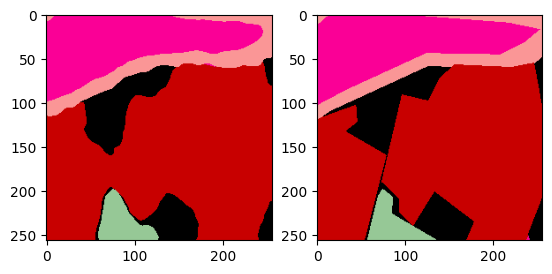

[2023-05-30 22:52:55 swanet_v5](182747771.py 311): INFO Test: [454/728]	Loss 0.0969 (0.3952)	PA@1 96.1441 (90.5156)	MPA@1 93.3880 (82.3408)	KAPPA@1 93.7564 (77.9045)	MIOU@1 88.3173 (71.7828)	FWIOU@1 92.8270 (85.8366)	Mem 44806MB


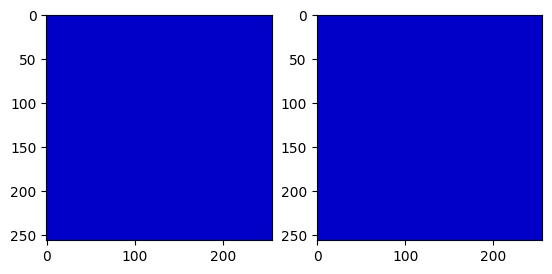

[2023-05-30 22:52:55 swanet_v5](182747771.py 311): INFO Test: [455/728]	Loss 0.0003 (0.3944)	PA@1 100.0000 (90.5364)	MPA@1 100.0000 (82.3795)	KAPPA@1 100.0000 (77.9530)	MIOU@1 100.0000 (71.8447)	FWIOU@1 100.0000 (85.8676)	Mem 44806MB


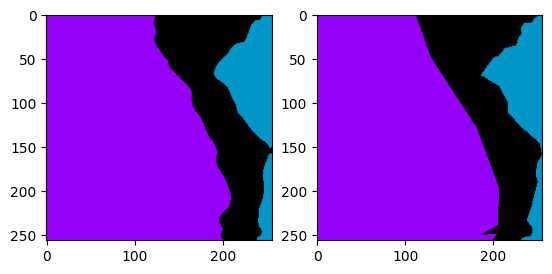

[2023-05-30 22:52:56 swanet_v5](182747771.py 311): INFO Test: [456/728]	Loss 0.0551 (0.3936)	PA@1 97.7570 (90.5522)	MPA@1 96.9394 (82.4114)	KAPPA@1 95.4277 (77.9912)	MIOU@1 93.8868 (71.8929)	FWIOU@1 95.6974 (85.8892)	Mem 44806MB


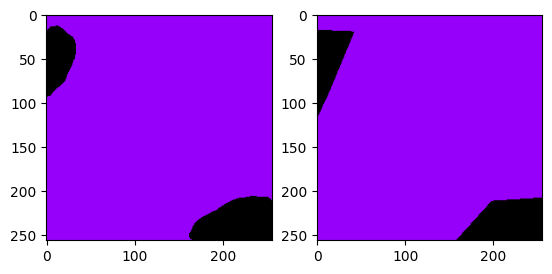

[2023-05-30 22:52:56 swanet_v5](182747771.py 311): INFO Test: [457/728]	Loss 0.0303 (0.3928)	PA@1 98.7595 (90.5701)	MPA@1 96.6555 (82.4425)	KAPPA@1 92.1898 (78.0222)	MIOU@1 92.6689 (71.9383)	FWIOU@1 97.6237 (85.9148)	Mem 44806MB


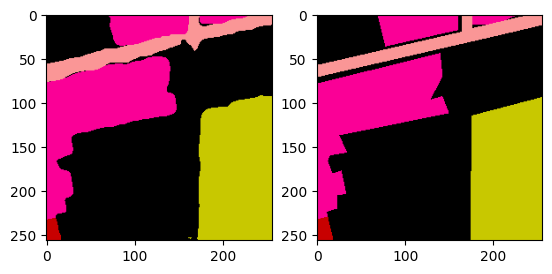

[2023-05-30 22:52:56 swanet_v5](182747771.py 311): INFO Test: [458/728]	Loss 0.0856 (0.3922)	PA@1 96.2646 (90.5825)	MPA@1 94.4355 (82.4686)	KAPPA@1 94.2021 (78.0574)	MIOU@1 90.4138 (71.9786)	FWIOU@1 92.8269 (85.9298)	Mem 44806MB


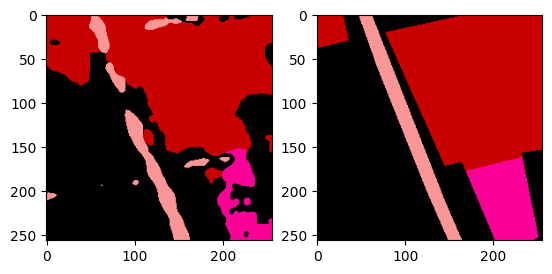

[2023-05-30 22:52:56 swanet_v5](182747771.py 311): INFO Test: [459/728]	Loss 0.6285 (0.3927)	PA@1 79.9591 (90.5594)	MPA@1 80.5088 (82.4644)	KAPPA@1 66.8626 (78.0331)	MIOU@1 60.2410 (71.9530)	FWIOU@1 67.2234 (85.8892)	Mem 44806MB


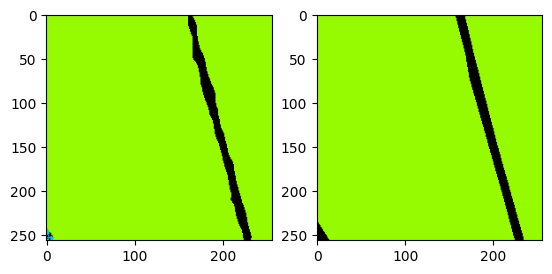

[2023-05-30 22:52:56 swanet_v5](182747771.py 311): INFO Test: [460/728]	Loss 0.0244 (0.3919)	PA@1 98.9822 (90.5777)	MPA@1 64.3651 (82.4251)	KAPPA@1 87.1947 (78.0530)	MIOU@1 58.9900 (71.9249)	FWIOU@1 98.1391 (85.9157)	Mem 44806MB


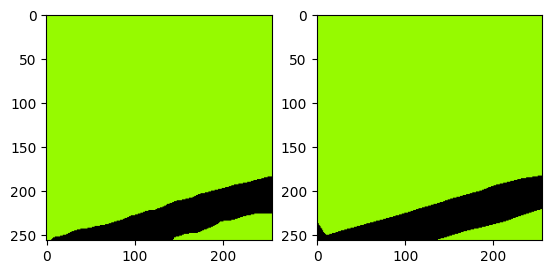

[2023-05-30 22:52:57 swanet_v5](182747771.py 311): INFO Test: [461/728]	Loss 0.0318 (0.3911)	PA@1 98.6450 (90.5952)	MPA@1 98.6404 (82.4602)	KAPPA@1 93.4963 (78.0864)	MIOU@1 93.8118 (71.9723)	FWIOU@1 97.4227 (85.9406)	Mem 44806MB


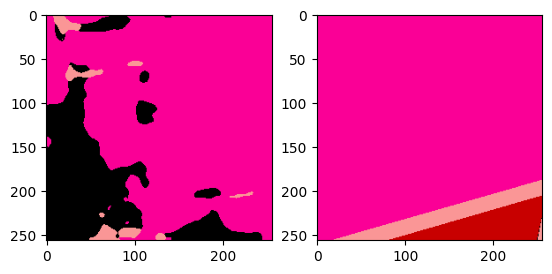

[2023-05-30 22:52:57 swanet_v5](182747771.py 311): INFO Test: [462/728]	Loss 1.6641 (0.3939)	PA@1 66.3956 (90.5429)	MPA@1 42.6001 (82.3741)	KAPPA@1 5.8281 (77.9304)	MIOU@1 20.3563 (71.8608)	FWIOU@1 50.6395 (85.8644)	Mem 44806MB


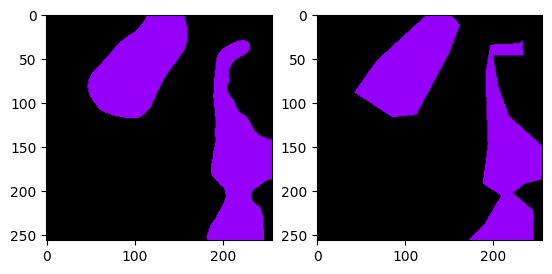

[2023-05-30 22:52:57 swanet_v5](182747771.py 311): INFO Test: [463/728]	Loss 0.0724 (0.3932)	PA@1 96.7270 (90.5562)	MPA@1 94.5276 (82.4003)	KAPPA@1 91.4464 (77.9595)	MIOU@1 91.8682 (71.9039)	FWIOU@1 93.6354 (85.8812)	Mem 44806MB


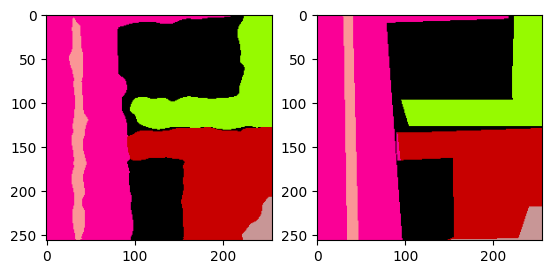

[2023-05-30 22:52:57 swanet_v5](182747771.py 311): INFO Test: [464/728]	Loss 0.1281 (0.3926)	PA@1 94.6701 (90.5651)	MPA@1 90.9879 (82.4188)	KAPPA@1 92.9403 (77.9917)	MIOU@1 84.1210 (71.9302)	FWIOU@1 90.0711 (85.8902)	Mem 44806MB


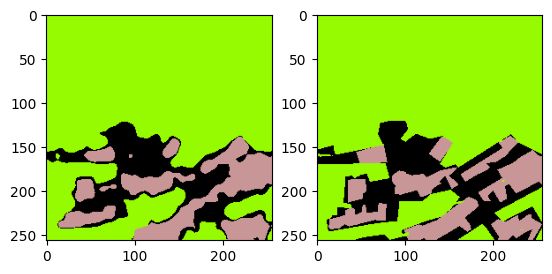

[2023-05-30 22:52:58 swanet_v5](182747771.py 311): INFO Test: [465/728]	Loss 0.1835 (0.3921)	PA@1 92.2958 (90.5688)	MPA@1 87.3775 (82.4294)	KAPPA@1 83.4367 (78.0034)	MIOU@1 76.9877 (71.9411)	FWIOU@1 86.9383 (85.8924)	Mem 44806MB


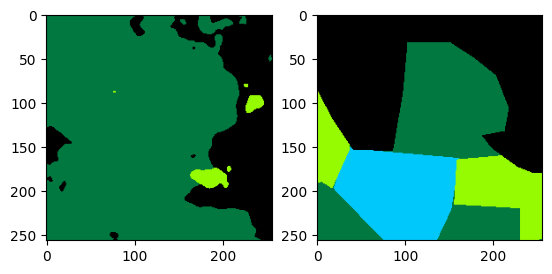

[2023-05-30 22:52:58 swanet_v5](182747771.py 311): INFO Test: [466/728]	Loss 3.4406 (0.3987)	PA@1 44.7388 (90.4707)	MPA@1 56.8136 (82.3746)	KAPPA@1 18.7905 (77.8766)	MIOU@1 19.1162 (71.8279)	FWIOU@1 35.7921 (85.7851)	Mem 44806MB


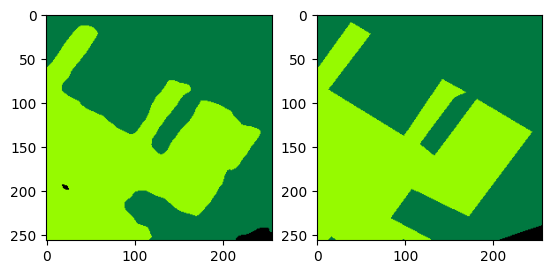

[2023-05-30 22:52:58 swanet_v5](182747771.py 311): INFO Test: [467/728]	Loss 0.0607 (0.3980)	PA@1 97.7539 (90.4862)	MPA@1 95.3836 (82.4024)	KAPPA@1 95.5012 (77.9143)	MIOU@1 90.4558 (71.8677)	FWIOU@1 95.6164 (85.8061)	Mem 44806MB


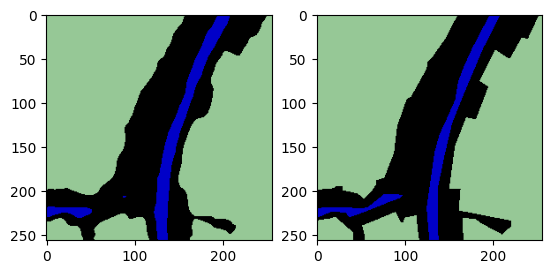

[2023-05-30 22:52:58 swanet_v5](182747771.py 311): INFO Test: [468/728]	Loss 0.0782 (0.3973)	PA@1 96.7133 (90.4995)	MPA@1 92.3850 (82.4236)	KAPPA@1 93.2809 (77.9470)	MIOU@1 87.8453 (71.9018)	FWIOU@1 93.7724 (85.8231)	Mem 44806MB


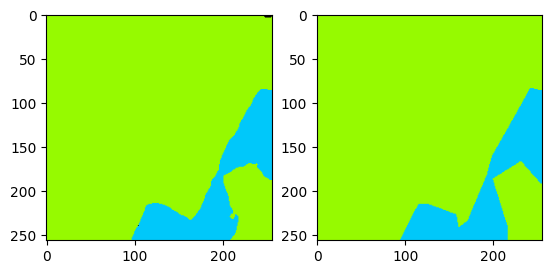

[2023-05-30 22:52:58 swanet_v5](182747771.py 311): INFO Test: [469/728]	Loss 0.0259 (0.3965)	PA@1 99.0417 (90.5177)	MPA@1 83.3884 (82.4257)	KAPPA@1 95.6955 (77.9848)	MIOU@1 79.4058 (71.9178)	FWIOU@1 98.1269 (85.8493)	Mem 44806MB


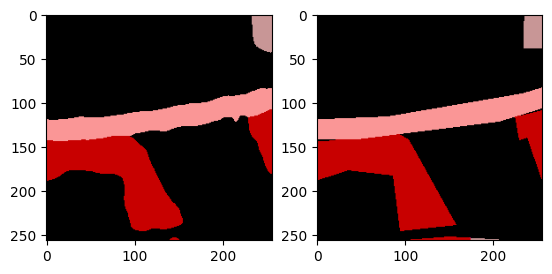

[2023-05-30 22:52:59 swanet_v5](182747771.py 311): INFO Test: [470/728]	Loss 0.0590 (0.3958)	PA@1 97.8836 (90.5333)	MPA@1 95.9152 (82.4543)	KAPPA@1 94.8179 (78.0205)	MIOU@1 73.1828 (71.9205)	FWIOU@1 95.9066 (85.8707)	Mem 44806MB


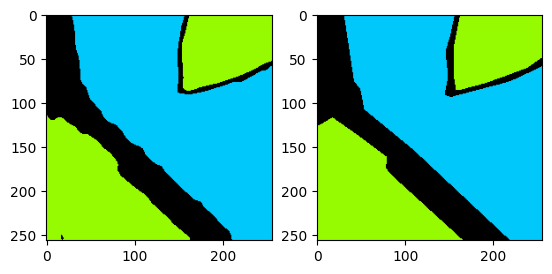

[2023-05-30 22:52:59 swanet_v5](182747771.py 311): INFO Test: [471/728]	Loss 0.0442 (0.3950)	PA@1 98.1873 (90.5495)	MPA@1 98.0953 (82.4875)	KAPPA@1 97.0847 (78.0609)	MIOU@1 95.5979 (71.9706)	FWIOU@1 96.5055 (85.8932)	Mem 44806MB


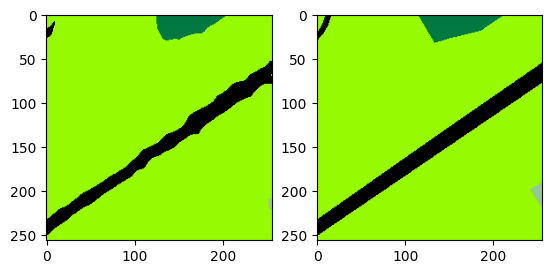

[2023-05-30 22:52:59 swanet_v5](182747771.py 311): INFO Test: [472/728]	Loss 0.0720 (0.3943)	PA@1 97.3099 (90.5638)	MPA@1 92.2904 (82.5082)	KAPPA@1 86.5559 (78.0789)	MIOU@1 68.6556 (71.9636)	FWIOU@1 95.2660 (85.9130)	Mem 44806MB


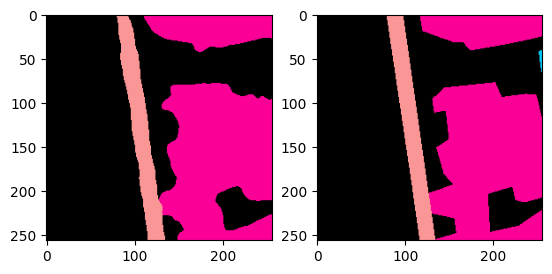

[2023-05-30 22:52:59 swanet_v5](182747771.py 311): INFO Test: [473/728]	Loss 0.0739 (0.3937)	PA@1 97.3511 (90.5781)	MPA@1 96.6944 (82.5381)	KAPPA@1 95.0179 (78.1146)	MIOU@1 70.5075 (71.9606)	FWIOU@1 94.9700 (85.9321)	Mem 44806MB


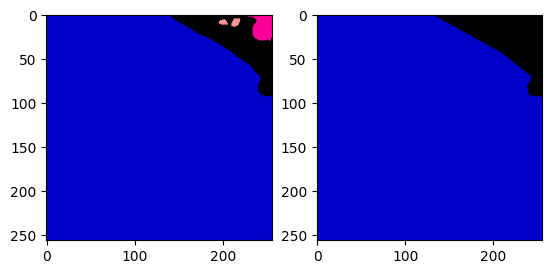

[2023-05-30 22:52:59 swanet_v5](182747771.py 311): INFO Test: [474/728]	Loss 0.0361 (0.3929)	PA@1 98.4329 (90.5947)	MPA@1 49.8821 (82.4694)	KAPPA@1 88.5765 (78.1366)	MIOU@1 44.7109 (71.9032)	FWIOU@1 97.1900 (85.9558)	Mem 44806MB


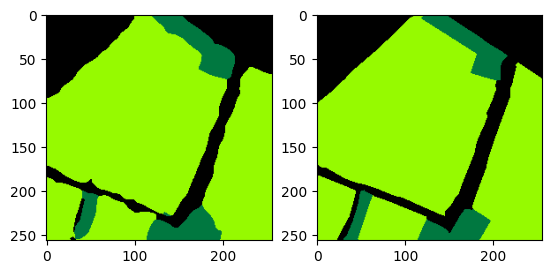

[2023-05-30 22:53:00 swanet_v5](182747771.py 311): INFO Test: [475/728]	Loss 0.0877 (0.3923)	PA@1 96.4005 (90.6069)	MPA@1 93.1636 (82.4918)	KAPPA@1 92.0826 (78.1659)	MIOU@1 88.2503 (71.9375)	FWIOU@1 93.1799 (85.9710)	Mem 44806MB


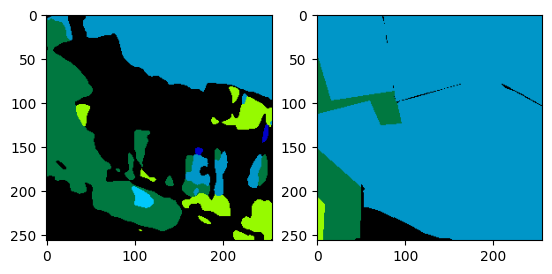

[2023-05-30 22:53:00 swanet_v5](182747771.py 311): INFO Test: [476/728]	Loss 4.2147 (0.4003)	PA@1 30.3650 (90.4806)	MPA@1 19.9707 (82.3608)	KAPPA@1 7.2970 (78.0173)	MIOU@1 7.4709 (71.8024)	FWIOU@1 12.0679 (85.8161)	Mem 44806MB


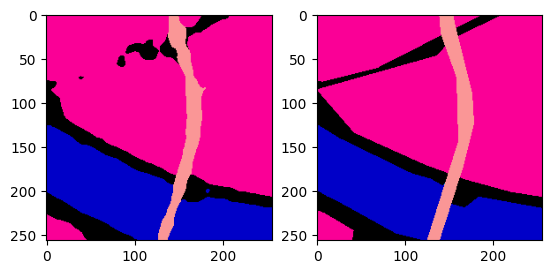

[2023-05-30 22:53:00 swanet_v5](182747771.py 311): INFO Test: [477/728]	Loss 0.1166 (0.3997)	PA@1 95.1797 (90.4904)	MPA@1 93.2118 (82.3835)	KAPPA@1 91.7000 (78.0460)	MIOU@1 69.2858 (71.7971)	FWIOU@1 91.2427 (85.8274)	Mem 44806MB


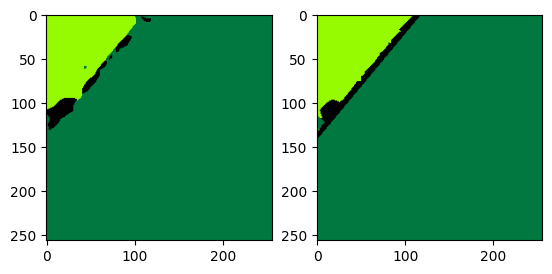

[2023-05-30 22:53:00 swanet_v5](182747771.py 311): INFO Test: [478/728]	Loss 0.0310 (0.3989)	PA@1 98.7045 (90.5076)	MPA@1 92.5730 (82.4047)	KAPPA@1 94.1757 (78.0797)	MIOU@1 82.4853 (71.8194)	FWIOU@1 97.8410 (85.8525)	Mem 44806MB


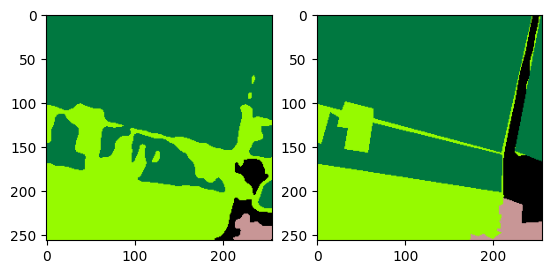

[2023-05-30 22:53:00 swanet_v5](182747771.py 311): INFO Test: [479/728]	Loss 0.4789 (0.3991)	PA@1 84.6436 (90.4953)	MPA@1 80.8765 (82.4016)	KAPPA@1 70.5582 (78.0640)	MIOU@1 55.6113 (71.7857)	FWIOU@1 75.5287 (85.8310)	Mem 44806MB


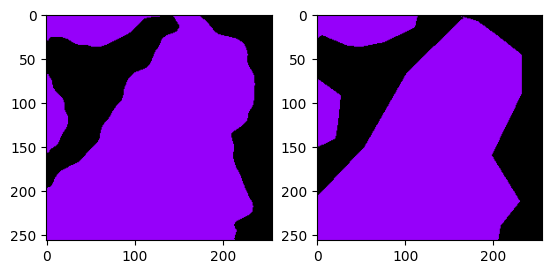

[2023-05-30 22:53:01 swanet_v5](182747771.py 311): INFO Test: [480/728]	Loss 0.1233 (0.3985)	PA@1 95.1065 (90.5049)	MPA@1 95.5410 (82.4289)	KAPPA@1 88.9683 (78.0867)	MIOU@1 89.5951 (71.8227)	FWIOU@1 90.8164 (85.8413)	Mem 44806MB


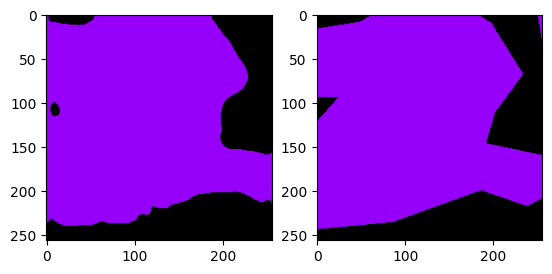

[2023-05-30 22:53:01 swanet_v5](182747771.py 311): INFO Test: [481/728]	Loss 0.0757 (0.3978)	PA@1 97.0703 (90.5185)	MPA@1 95.7151 (82.4564)	KAPPA@1 92.3150 (78.1162)	MIOU@1 92.6615 (71.8659)	FWIOU@1 94.3289 (85.8590)	Mem 44806MB


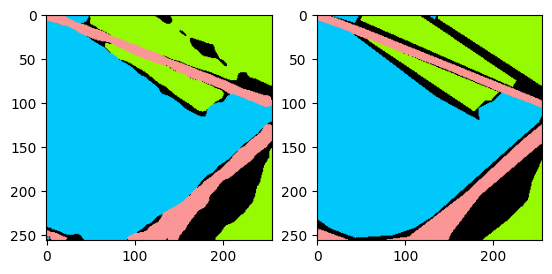

[2023-05-30 22:53:01 swanet_v5](182747771.py 311): INFO Test: [482/728]	Loss 0.1514 (0.3973)	PA@1 93.6111 (90.5249)	MPA@1 91.2495 (82.4746)	KAPPA@1 89.6818 (78.1401)	MIOU@1 82.3247 (71.8876)	FWIOU@1 89.3868 (85.8663)	Mem 44806MB


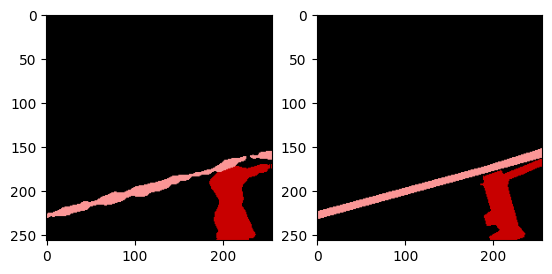

[2023-05-30 22:53:01 swanet_v5](182747771.py 311): INFO Test: [483/728]	Loss 0.0562 (0.3966)	PA@1 97.5830 (90.5395)	MPA@1 87.3947 (82.4848)	KAPPA@1 83.5531 (78.1513)	MIOU@1 80.7374 (71.9059)	FWIOU@1 95.4872 (85.8861)	Mem 44806MB


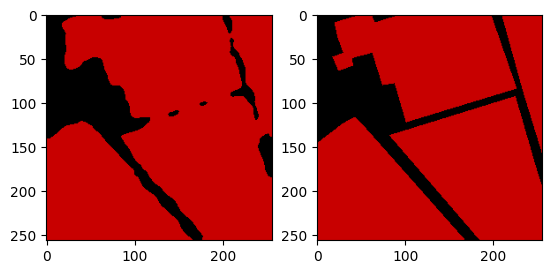

[2023-05-30 22:53:02 swanet_v5](182747771.py 311): INFO Test: [484/728]	Loss 0.0976 (0.3960)	PA@1 95.6863 (90.5501)	MPA@1 95.4219 (82.5115)	KAPPA@1 85.9456 (78.1674)	MIOU@1 87.1680 (71.9373)	FWIOU@1 92.1218 (85.8990)	Mem 44806MB


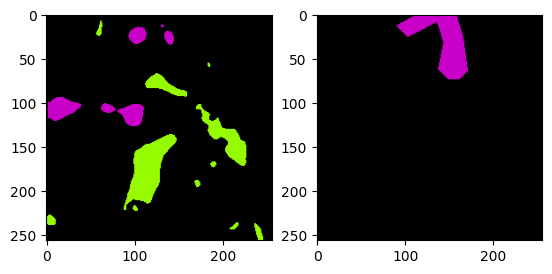

[2023-05-30 22:53:02 swanet_v5](182747771.py 311): INFO Test: [485/728]	Loss 0.3642 (0.3959)	PA@1 86.9492 (90.5427)	MPA@1 35.0430 (82.4138)	KAPPA@1 0.1022 (78.0068)	MIOU@1 30.2717 (71.8516)	FWIOU@1 78.7106 (85.8842)	Mem 44806MB


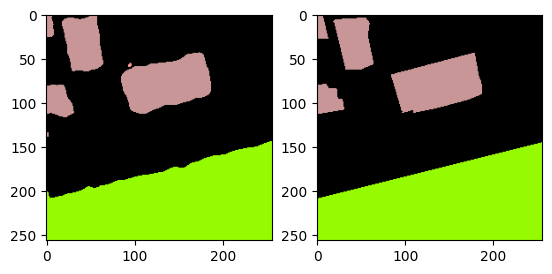

[2023-05-30 22:53:02 swanet_v5](182747771.py 311): INFO Test: [486/728]	Loss 0.0497 (0.3952)	PA@1 98.0927 (90.5582)	MPA@1 72.4072 (82.3933)	KAPPA@1 96.6269 (78.0450)	MIOU@1 71.0140 (71.8499)	FWIOU@1 96.2702 (85.9055)	Mem 44806MB


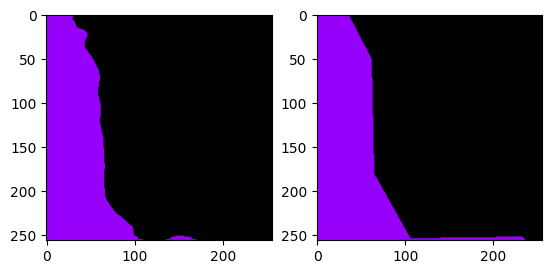

[2023-05-30 22:53:02 swanet_v5](182747771.py 311): INFO Test: [487/728]	Loss 0.0564 (0.3945)	PA@1 97.8073 (90.5731)	MPA@1 98.3619 (82.4260)	KAPPA@1 94.2856 (78.0783)	MIOU@1 94.4767 (71.8962)	FWIOU@1 95.7860 (85.9258)	Mem 44806MB


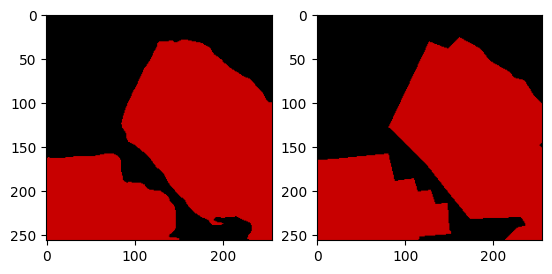

[2023-05-30 22:53:02 swanet_v5](182747771.py 311): INFO Test: [488/728]	Loss 0.0513 (0.3938)	PA@1 97.8333 (90.5879)	MPA@1 97.8501 (82.4575)	KAPPA@1 95.5823 (78.1141)	MIOU@1 95.6795 (71.9449)	FWIOU@1 95.7626 (85.9459)	Mem 44806MB


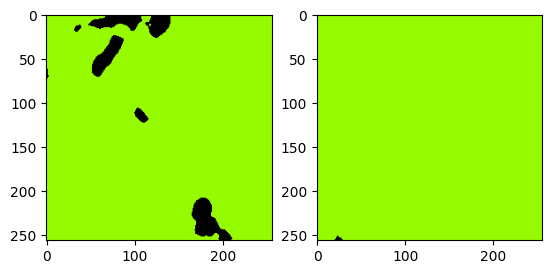

[2023-05-30 22:53:03 swanet_v5](182747771.py 311): INFO Test: [489/728]	Loss 0.1143 (0.3933)	PA@1 94.8624 (90.5967)	MPA@1 49.9799 (82.3912)	KAPPA@1 -0.0758 (77.9545)	MIOU@1 47.4312 (71.8948)	FWIOU@1 90.0249 (85.9542)	Mem 44806MB


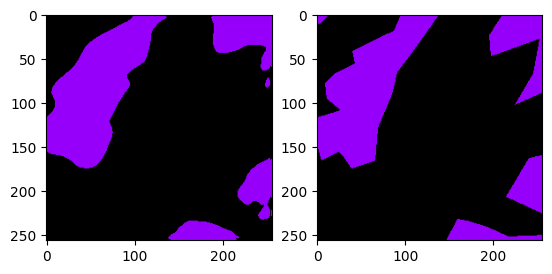

[2023-05-30 22:53:03 swanet_v5](182747771.py 311): INFO Test: [490/728]	Loss 0.1292 (0.3927)	PA@1 94.5068 (90.6046)	MPA@1 92.0684 (82.4110)	KAPPA@1 85.6085 (77.9701)	MIOU@1 86.7706 (71.9251)	FWIOU@1 89.6542 (85.9617)	Mem 44806MB


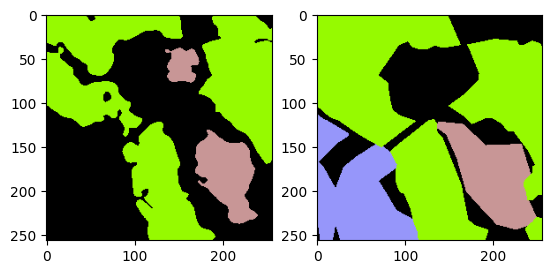

[2023-05-30 22:53:03 swanet_v5](182747771.py 311): INFO Test: [491/728]	Loss 2.2284 (0.3965)	PA@1 65.4694 (90.5535)	MPA@1 70.0047 (82.3857)	KAPPA@1 47.5343 (77.9082)	MIOU@1 40.2699 (71.8608)	FWIOU@1 53.2986 (85.8954)	Mem 44806MB


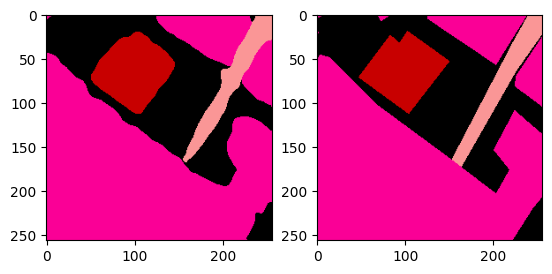

[2023-05-30 22:53:03 swanet_v5](182747771.py 311): INFO Test: [492/728]	Loss 0.0924 (0.3958)	PA@1 96.1487 (90.5649)	MPA@1 94.8638 (82.4111)	KAPPA@1 93.3032 (77.9394)	MIOU@1 90.4933 (71.8986)	FWIOU@1 92.6974 (85.9092)	Mem 44806MB


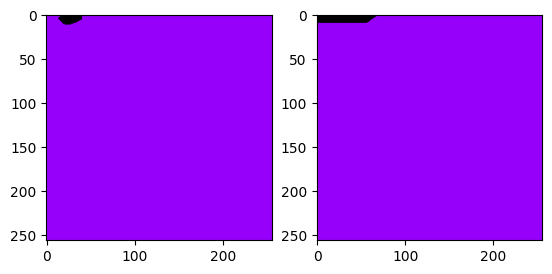

[2023-05-30 22:53:03 swanet_v5](182747771.py 311): INFO Test: [493/728]	Loss 0.0157 (0.3951)	PA@1 99.3561 (90.5827)	MPA@1 95.9065 (82.4384)	KAPPA@1 52.1073 (77.8872)	MIOU@1 67.4139 (71.8895)	FWIOU@1 99.1091 (85.9359)	Mem 44806MB


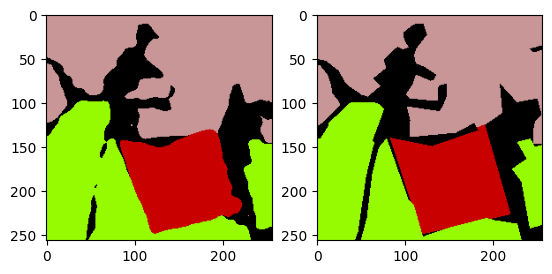

[2023-05-30 22:53:04 swanet_v5](182747771.py 311): INFO Test: [494/728]	Loss 0.1209 (0.3945)	PA@1 94.8898 (90.5914)	MPA@1 75.8792 (82.4251)	KAPPA@1 92.9225 (77.9175)	MIOU@1 71.8582 (71.8895)	FWIOU@1 90.6595 (85.9454)	Mem 44806MB


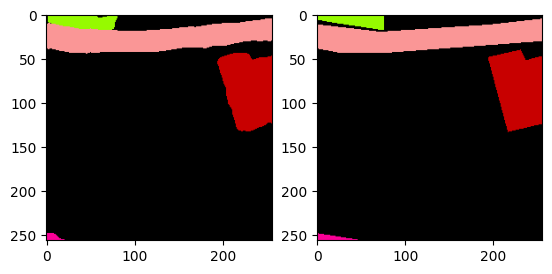

[2023-05-30 22:53:04 swanet_v5](182747771.py 311): INFO Test: [495/728]	Loss 0.0385 (0.3938)	PA@1 98.4451 (90.6072)	MPA@1 92.6802 (82.4458)	KAPPA@1 95.0837 (77.9521)	MIOU@1 82.4536 (71.9108)	FWIOU@1 97.0253 (85.9678)	Mem 44806MB


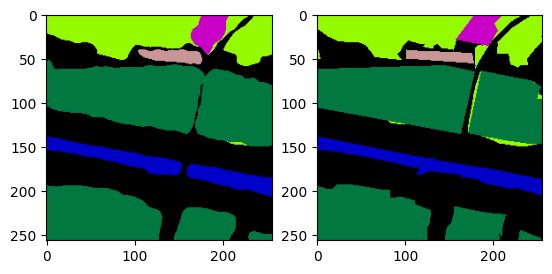

[2023-05-30 22:53:04 swanet_v5](182747771.py 311): INFO Test: [496/728]	Loss 0.1430 (0.3933)	PA@1 94.6167 (90.6153)	MPA@1 90.5085 (82.4620)	KAPPA@1 92.0747 (77.9805)	MIOU@1 85.0808 (71.9373)	FWIOU@1 89.8897 (85.9757)	Mem 44806MB


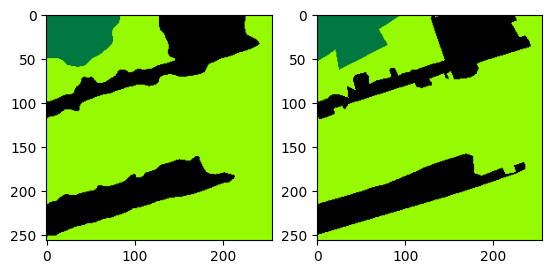

[2023-05-30 22:53:04 swanet_v5](182747771.py 311): INFO Test: [497/728]	Loss 0.0800 (0.3927)	PA@1 96.6049 (90.6273)	MPA@1 95.2476 (82.4877)	KAPPA@1 92.3430 (78.0094)	MIOU@1 91.7554 (71.9771)	FWIOU@1 93.4682 (85.9907)	Mem 44806MB


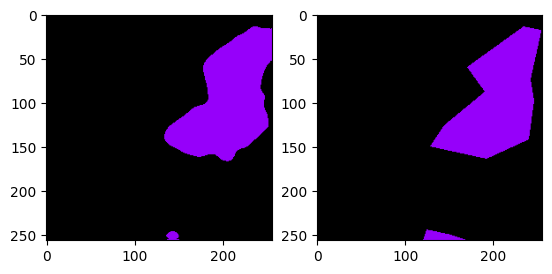

[2023-05-30 22:53:05 swanet_v5](182747771.py 311): INFO Test: [498/728]	Loss 0.0511 (0.3920)	PA@1 97.7280 (90.6415)	MPA@1 95.0342 (82.5128)	KAPPA@1 91.5831 (78.0366)	MIOU@1 92.0665 (72.0173)	FWIOU@1 95.6006 (86.0100)	Mem 44806MB


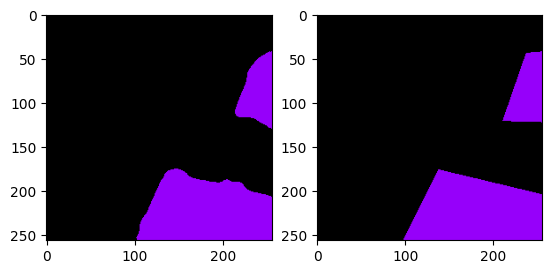

[2023-05-30 22:53:05 swanet_v5](182747771.py 311): INFO Test: [499/728]	Loss 0.0277 (0.3913)	PA@1 98.9532 (90.6582)	MPA@1 98.5838 (82.5450)	KAPPA@1 96.4680 (78.0735)	MIOU@1 96.5534 (72.0664)	FWIOU@1 97.9498 (86.0338)	Mem 44806MB


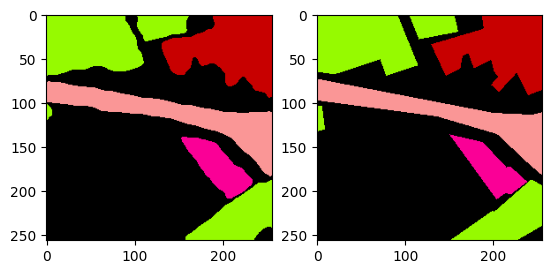

[2023-05-30 22:53:05 swanet_v5](182747771.py 311): INFO Test: [500/728]	Loss 0.0888 (0.3906)	PA@1 96.2982 (90.6694)	MPA@1 94.4083 (82.5687)	KAPPA@1 93.9998 (78.1052)	MIOU@1 91.6676 (72.1055)	FWIOU@1 92.8505 (86.0474)	Mem 44806MB


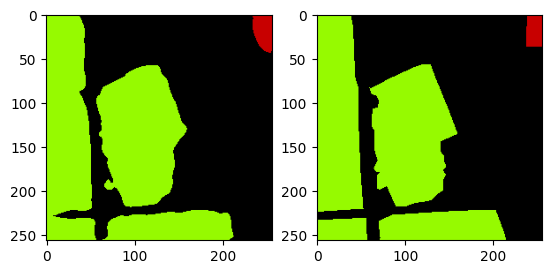

[2023-05-30 22:53:05 swanet_v5](182747771.py 311): INFO Test: [501/728]	Loss 0.0697 (0.3900)	PA@1 97.2000 (90.6824)	MPA@1 92.2938 (82.5880)	KAPPA@1 94.4041 (78.1377)	MIOU@1 89.7316 (72.1406)	FWIOU@1 94.5496 (86.0644)	Mem 44806MB


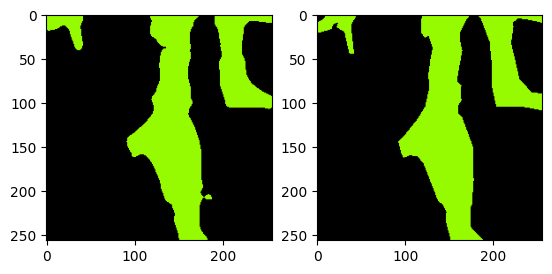

[2023-05-30 22:53:05 swanet_v5](182747771.py 311): INFO Test: [502/728]	Loss 0.0483 (0.3893)	PA@1 97.9965 (90.6970)	MPA@1 97.1635 (82.6170)	KAPPA@1 94.6573 (78.1705)	MIOU@1 94.8293 (72.1857)	FWIOU@1 96.0899 (86.0843)	Mem 44806MB


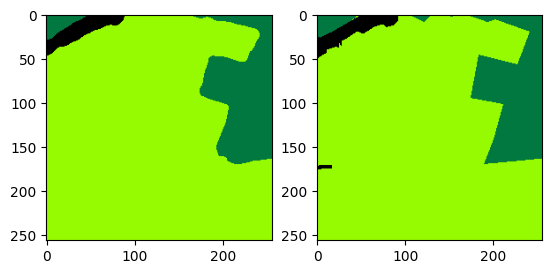

[2023-05-30 22:53:06 swanet_v5](182747771.py 311): INFO Test: [503/728]	Loss 0.0458 (0.3886)	PA@1 98.2391 (90.7119)	MPA@1 95.5690 (82.6427)	KAPPA@1 94.0466 (78.2020)	MIOU@1 89.9464 (72.2210)	FWIOU@1 96.6197 (86.1052)	Mem 44806MB


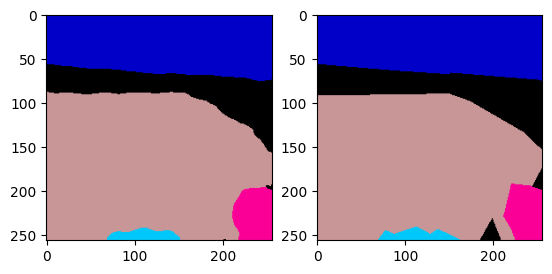

[2023-05-30 22:53:06 swanet_v5](182747771.py 311): INFO Test: [504/728]	Loss 0.0529 (0.3880)	PA@1 97.7173 (90.7258)	MPA@1 97.1838 (82.6715)	KAPPA@1 96.2410 (78.2378)	MIOU@1 92.5192 (72.2612)	FWIOU@1 95.6737 (86.1242)	Mem 44806MB


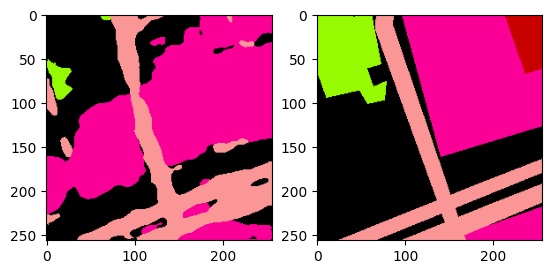

[2023-05-30 22:53:06 swanet_v5](182747771.py 311): INFO Test: [505/728]	Loss 1.9908 (0.3912)	PA@1 59.1522 (90.6634)	MPA@1 67.5039 (82.6415)	KAPPA@1 41.1345 (78.1644)	MIOU@1 31.5130 (72.1806)	FWIOU@1 46.7982 (86.0464)	Mem 44806MB


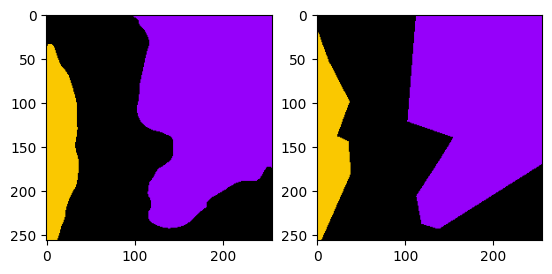

[2023-05-30 22:53:06 swanet_v5](182747771.py 311): INFO Test: [506/728]	Loss 0.0795 (0.3905)	PA@1 96.8033 (90.6755)	MPA@1 95.1281 (82.6662)	KAPPA@1 94.4726 (78.1966)	MIOU@1 92.3820 (72.2205)	FWIOU@1 93.8135 (86.0618)	Mem 44806MB


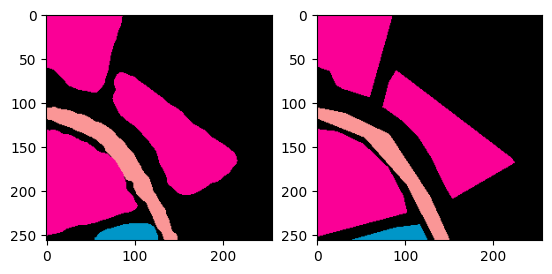

[2023-05-30 22:53:06 swanet_v5](182747771.py 311): INFO Test: [507/728]	Loss 0.0775 (0.3899)	PA@1 96.5759 (90.6871)	MPA@1 90.7828 (82.6821)	KAPPA@1 93.6702 (78.2271)	MIOU@1 87.4648 (72.2505)	FWIOU@1 93.3855 (86.0762)	Mem 44806MB


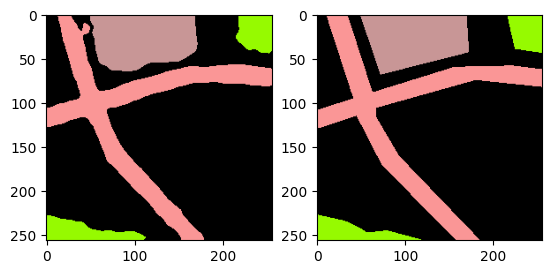

[2023-05-30 22:53:07 swanet_v5](182747771.py 311): INFO Test: [508/728]	Loss 0.0707 (0.3893)	PA@1 96.9833 (90.6995)	MPA@1 95.0793 (82.7065)	KAPPA@1 93.9225 (78.2579)	MIOU@1 92.4649 (72.2902)	FWIOU@1 94.1545 (86.0920)	Mem 44806MB


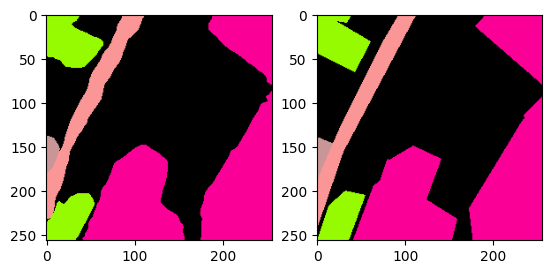

[2023-05-30 22:53:07 swanet_v5](182747771.py 311): INFO Test: [509/728]	Loss 0.0900 (0.3887)	PA@1 96.4630 (90.7108)	MPA@1 93.2497 (82.7272)	KAPPA@1 94.0289 (78.2888)	MIOU@1 88.5113 (72.3220)	FWIOU@1 93.2150 (86.1060)	Mem 44806MB


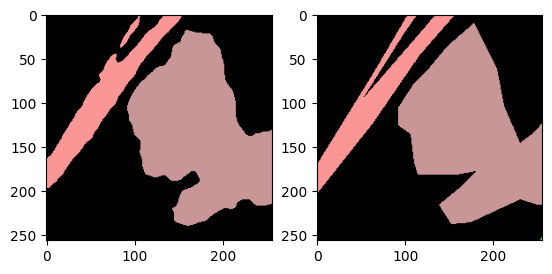

[2023-05-30 22:53:07 swanet_v5](182747771.py 311): INFO Test: [510/728]	Loss 0.0845 (0.3881)	PA@1 96.3715 (90.7219)	MPA@1 95.0664 (82.7513)	KAPPA@1 93.3487 (78.3183)	MIOU@1 68.3643 (72.3143)	FWIOU@1 93.0269 (86.1196)	Mem 44806MB


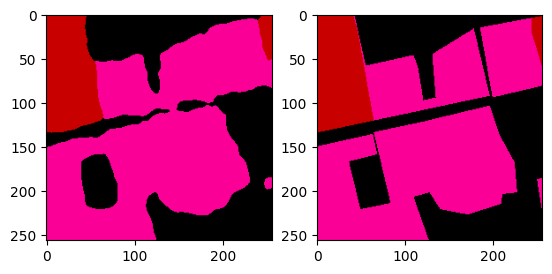

[2023-05-30 22:53:07 swanet_v5](182747771.py 311): INFO Test: [511/728]	Loss 0.1182 (0.3876)	PA@1 95.1309 (90.7305)	MPA@1 95.2666 (82.7757)	KAPPA@1 91.5276 (78.3441)	MIOU@1 91.2363 (72.3512)	FWIOU@1 90.7943 (86.1287)	Mem 44806MB


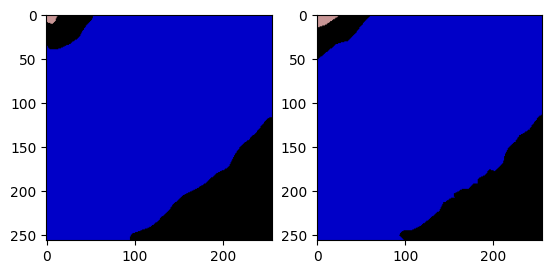

[2023-05-30 22:53:08 swanet_v5](182747771.py 311): INFO Test: [512/728]	Loss 0.0214 (0.3869)	PA@1 98.9838 (90.7466)	MPA@1 99.2086 (82.8078)	KAPPA@1 96.6804 (78.3798)	MIOU@1 79.9377 (72.3660)	FWIOU@1 98.1175 (86.1521)	Mem 44806MB


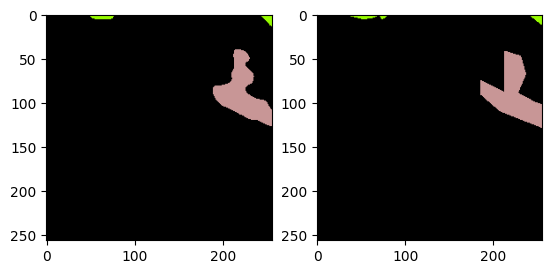

[2023-05-30 22:53:08 swanet_v5](182747771.py 311): INFO Test: [513/728]	Loss 0.0251 (0.3862)	PA@1 98.9792 (90.7626)	MPA@1 92.6103 (82.8269)	KAPPA@1 87.9267 (78.3984)	MIOU@1 81.0288 (72.3829)	FWIOU@1 98.1202 (86.1753)	Mem 44806MB


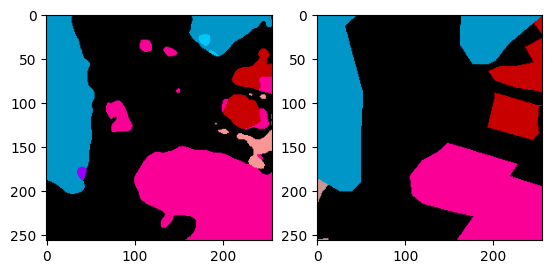

[2023-05-30 22:53:08 swanet_v5](182747771.py 311): INFO Test: [514/728]	Loss 0.3116 (0.3860)	PA@1 88.9938 (90.7592)	MPA@1 52.1379 (82.7673)	KAPPA@1 81.9228 (78.4053)	MIOU@1 37.6608 (72.3154)	FWIOU@1 80.8912 (86.1651)	Mem 44806MB


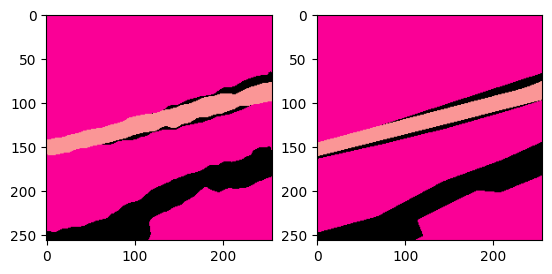

[2023-05-30 22:53:08 swanet_v5](182747771.py 311): INFO Test: [515/728]	Loss 0.0740 (0.3854)	PA@1 97.0016 (90.7713)	MPA@1 93.0687 (82.7872)	KAPPA@1 91.5444 (78.4307)	MIOU@1 88.2402 (72.3463)	FWIOU@1 94.4137 (86.1811)	Mem 44806MB


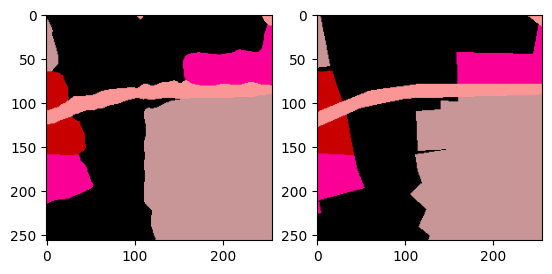

[2023-05-30 22:53:08 swanet_v5](182747771.py 311): INFO Test: [516/728]	Loss 0.0805 (0.3848)	PA@1 96.6553 (90.7826)	MPA@1 93.6144 (82.8082)	KAPPA@1 94.9013 (78.4626)	MIOU@1 90.2573 (72.3809)	FWIOU@1 93.5644 (86.1953)	Mem 44806MB


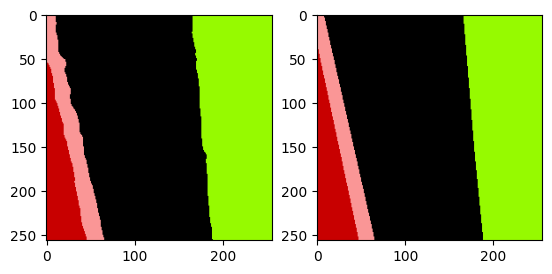

[2023-05-30 22:53:09 swanet_v5](182747771.py 311): INFO Test: [517/728]	Loss 0.0333 (0.3841)	PA@1 98.8876 (90.7983)	MPA@1 97.1622 (82.8359)	KAPPA@1 98.1309 (78.5005)	MIOU@1 95.1115 (72.4248)	FWIOU@1 97.8209 (86.2178)	Mem 44806MB


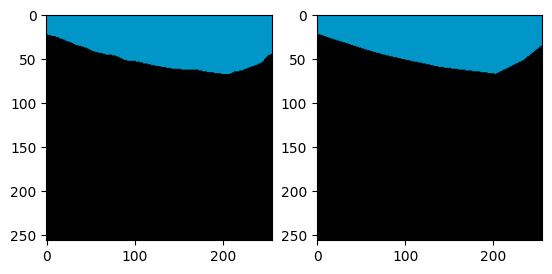

[2023-05-30 22:53:09 swanet_v5](182747771.py 311): INFO Test: [518/728]	Loss 0.0218 (0.3835)	PA@1 99.1028 (90.8143)	MPA@1 97.8322 (82.8648)	KAPPA@1 97.2016 (78.5366)	MIOU@1 97.2534 (72.4727)	FWIOU@1 98.2160 (86.2409)	Mem 44806MB


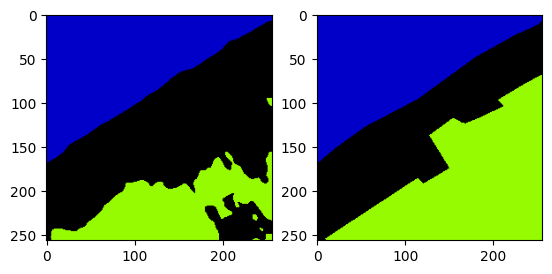

[2023-05-30 22:53:09 swanet_v5](182747771.py 311): INFO Test: [519/728]	Loss 0.6578 (0.3840)	PA@1 80.7541 (90.7949)	MPA@1 86.2012 (82.8712)	KAPPA@1 71.4261 (78.5229)	MIOU@1 69.2788 (72.4665)	FWIOU@1 71.0873 (86.2118)	Mem 44806MB


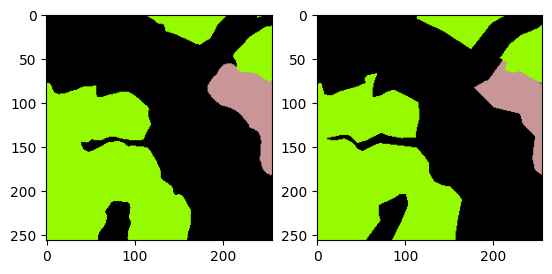

[2023-05-30 22:53:09 swanet_v5](182747771.py 311): INFO Test: [520/728]	Loss 0.0939 (0.3834)	PA@1 96.2799 (90.8055)	MPA@1 94.2718 (82.8931)	KAPPA@1 93.0679 (78.5508)	MIOU@1 91.3259 (72.5027)	FWIOU@1 92.8227 (86.2245)	Mem 44806MB


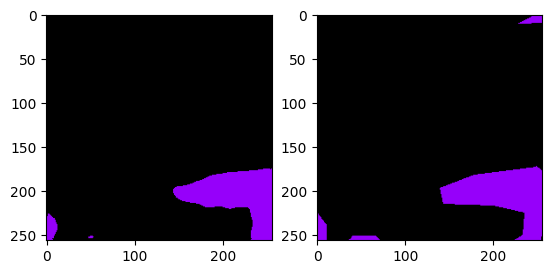

[2023-05-30 22:53:09 swanet_v5](182747771.py 311): INFO Test: [521/728]	Loss 0.0404 (0.3828)	PA@1 98.4283 (90.8201)	MPA@1 97.6574 (82.9214)	KAPPA@1 89.4954 (78.5718)	MIOU@1 90.3484 (72.5369)	FWIOU@1 97.0941 (86.2453)	Mem 44806MB


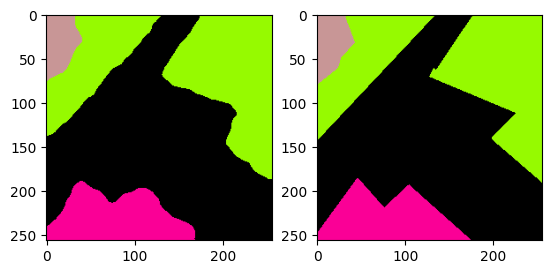

[2023-05-30 22:53:10 swanet_v5](182747771.py 311): INFO Test: [522/728]	Loss 0.0548 (0.3821)	PA@1 97.6151 (90.8331)	MPA@1 97.0292 (82.9483)	KAPPA@1 96.0136 (78.6051)	MIOU@1 94.4636 (72.5788)	FWIOU@1 95.3389 (86.2627)	Mem 44806MB


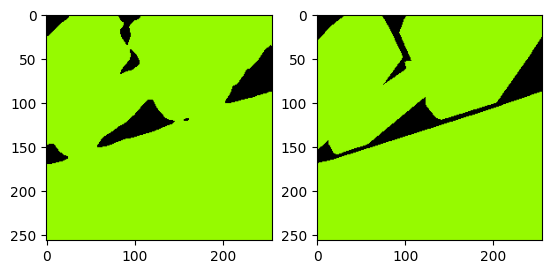

[2023-05-30 22:53:10 swanet_v5](182747771.py 311): INFO Test: [523/728]	Loss 0.0567 (0.3815)	PA@1 97.6608 (90.8461)	MPA@1 95.0641 (82.9715)	KAPPA@1 84.0121 (78.6154)	MIOU@1 85.9105 (72.6043)	FWIOU@1 95.7861 (86.2808)	Mem 44806MB


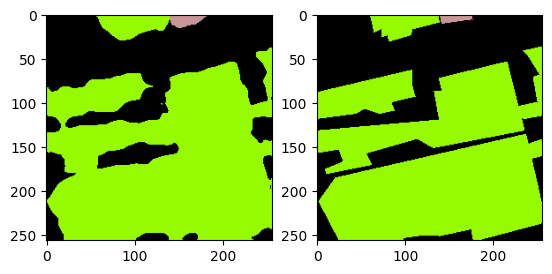

[2023-05-30 22:53:10 swanet_v5](182747771.py 311): INFO Test: [524/728]	Loss 0.1416 (0.3811)	PA@1 93.8980 (90.8519)	MPA@1 83.6373 (82.9727)	KAPPA@1 87.1751 (78.6317)	MIOU@1 59.2694 (72.5789)	FWIOU@1 88.6263 (86.2853)	Mem 44806MB


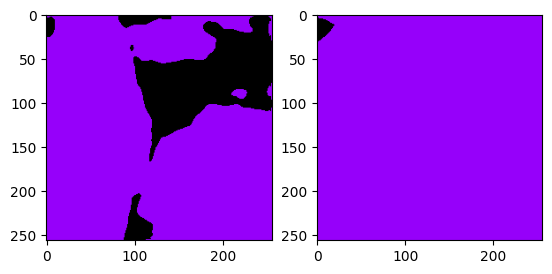

[2023-05-30 22:53:10 swanet_v5](182747771.py 311): INFO Test: [525/728]	Loss 0.5759 (0.3814)	PA@1 78.7292 (90.8289)	MPA@1 50.5220 (82.9110)	KAPPA@1 1.6205 (78.4853)	MIOU@1 39.9894 (72.5169)	FWIOU@1 62.1657 (86.2395)	Mem 44806MB


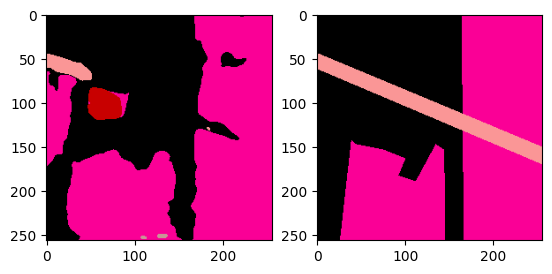

[2023-05-30 22:53:11 swanet_v5](182747771.py 311): INFO Test: [526/728]	Loss 0.7078 (0.3820)	PA@1 82.6431 (90.8133)	MPA@1 50.7997 (82.8501)	KAPPA@1 68.3799 (78.4662)	MIOU@1 33.1356 (72.4422)	FWIOU@1 73.4856 (86.2153)	Mem 44806MB


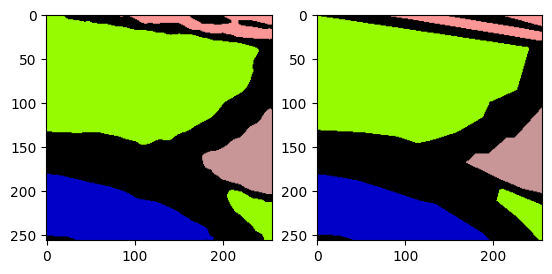

[2023-05-30 22:53:11 swanet_v5](182747771.py 311): INFO Test: [527/728]	Loss 0.0766 (0.3815)	PA@1 96.8658 (90.8248)	MPA@1 93.5916 (82.8704)	KAPPA@1 95.4032 (78.4982)	MIOU@1 90.3028 (72.4760)	FWIOU@1 94.0419 (86.2301)	Mem 44806MB


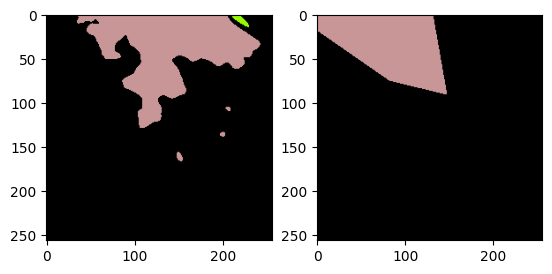

[2023-05-30 22:53:11 swanet_v5](182747771.py 311): INFO Test: [528/728]	Loss 0.4757 (0.3816)	PA@1 84.7977 (90.8134)	MPA@1 46.2031 (82.8011)	KAPPA@1 42.8238 (78.4308)	MIOU@1 39.4801 (72.4136)	FWIOU@1 74.5612 (86.2080)	Mem 44806MB


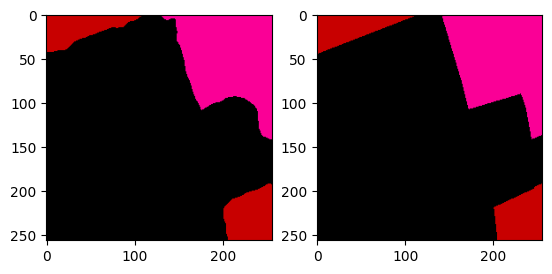

[2023-05-30 22:53:11 swanet_v5](182747771.py 311): INFO Test: [529/728]	Loss 0.0283 (0.3810)	PA@1 98.8480 (90.8286)	MPA@1 97.7733 (82.8294)	KAPPA@1 97.0970 (78.4660)	MIOU@1 96.1957 (72.4585)	FWIOU@1 97.7288 (86.2298)	Mem 44806MB


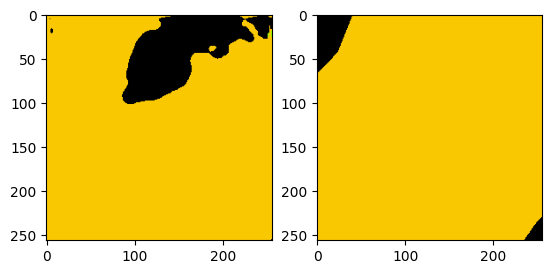

[2023-05-30 22:53:11 swanet_v5](182747771.py 311): INFO Test: [530/728]	Loss 0.3461 (0.3809)	PA@1 83.5770 (90.8149)	MPA@1 32.2751 (82.7342)	KAPPA@1 -4.7122 (78.3094)	MIOU@1 27.9372 (72.3747)	FWIOU@1 72.3545 (86.2036)	Mem 44806MB


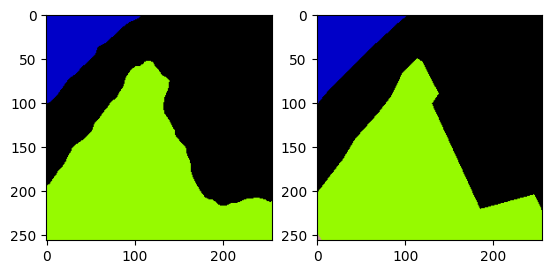

[2023-05-30 22:53:12 swanet_v5](182747771.py 311): INFO Test: [531/728]	Loss 0.0491 (0.3803)	PA@1 97.9401 (90.8283)	MPA@1 97.5036 (82.7619)	KAPPA@1 96.3459 (78.3433)	MIOU@1 72.0751 (72.3741)	FWIOU@1 95.9915 (86.2220)	Mem 44806MB


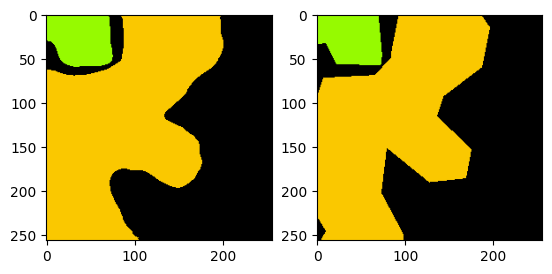

[2023-05-30 22:53:12 swanet_v5](182747771.py 311): INFO Test: [532/728]	Loss 0.0983 (0.3798)	PA@1 96.1807 (90.8383)	MPA@1 95.9537 (82.7867)	KAPPA@1 93.1006 (78.3710)	MIOU@1 93.1261 (72.4130)	FWIOU@1 92.6620 (86.2341)	Mem 44806MB


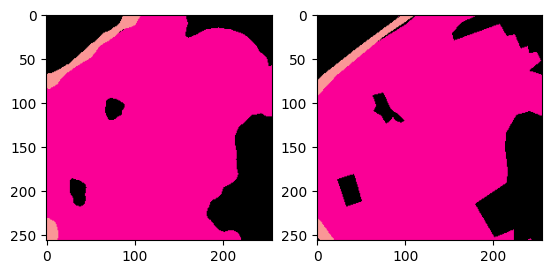

[2023-05-30 22:53:12 swanet_v5](182747771.py 311): INFO Test: [533/728]	Loss 0.0770 (0.3792)	PA@1 96.8124 (90.8495)	MPA@1 92.1337 (82.8042)	KAPPA@1 91.5008 (78.3956)	MIOU@1 86.4859 (72.4394)	FWIOU@1 93.9674 (86.2486)	Mem 44806MB


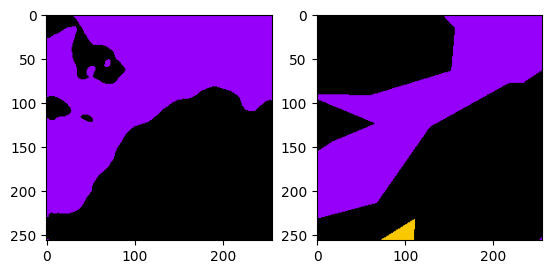

[2023-05-30 22:53:12 swanet_v5](182747771.py 311): INFO Test: [534/728]	Loss 1.0986 (0.3805)	PA@1 73.9288 (90.8179)	MPA@1 73.4163 (82.7866)	KAPPA@1 47.6415 (78.3381)	MIOU@1 38.8533 (72.3766)	FWIOU@1 58.4733 (86.1967)	Mem 44806MB


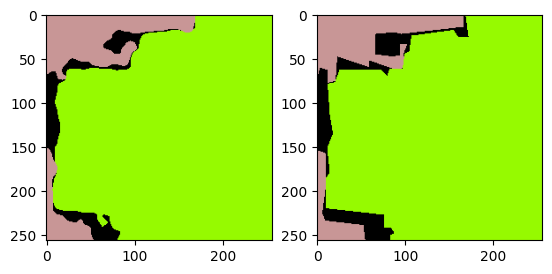

[2023-05-30 22:53:12 swanet_v5](182747771.py 311): INFO Test: [535/728]	Loss 0.0669 (0.3800)	PA@1 97.1512 (90.8297)	MPA@1 93.3464 (82.8063)	KAPPA@1 91.1633 (78.3620)	MIOU@1 83.2228 (72.3969)	FWIOU@1 95.1793 (86.2134)	Mem 44806MB


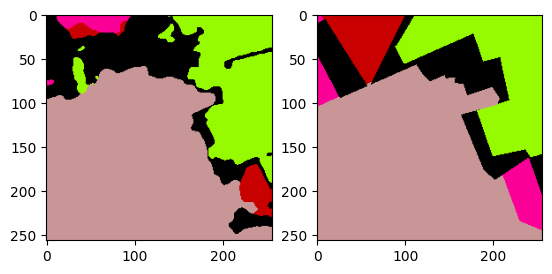

[2023-05-30 22:53:13 swanet_v5](182747771.py 311): INFO Test: [536/728]	Loss 0.8410 (0.3808)	PA@1 78.8696 (90.8074)	MPA@1 49.8370 (82.7449)	KAPPA@1 66.5376 (78.3400)	MIOU@1 41.0544 (72.3385)	FWIOU@1 72.1908 (86.1873)	Mem 44806MB


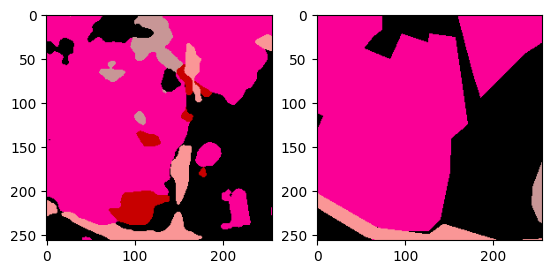

[2023-05-30 22:53:13 swanet_v5](182747771.py 311): INFO Test: [537/728]	Loss 0.7913 (0.3816)	PA@1 75.2869 (90.7786)	MPA@1 42.1123 (82.6694)	KAPPA@1 55.6178 (78.2978)	MIOU@1 33.4282 (72.2662)	FWIOU@1 60.0582 (86.1388)	Mem 44806MB


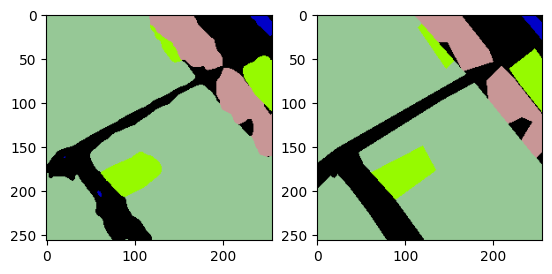

[2023-05-30 22:53:13 swanet_v5](182747771.py 311): INFO Test: [538/728]	Loss 0.1105 (0.3811)	PA@1 95.6482 (90.7876)	MPA@1 92.6239 (82.6879)	KAPPA@1 91.4007 (78.3221)	MIOU@1 85.1447 (72.2901)	FWIOU@1 91.9976 (86.1496)	Mem 44806MB


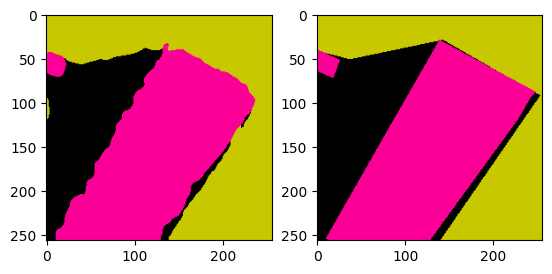

[2023-05-30 22:53:13 swanet_v5](182747771.py 311): INFO Test: [539/728]	Loss 0.1136 (0.3806)	PA@1 95.2118 (90.7958)	MPA@1 95.3537 (82.7113)	KAPPA@1 92.6394 (78.3486)	MIOU@1 90.0195 (72.3229)	FWIOU@1 90.9927 (86.1586)	Mem 44806MB


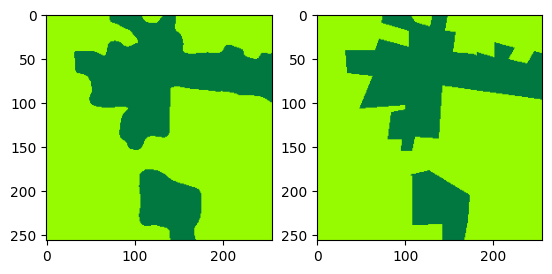

[2023-05-30 22:53:13 swanet_v5](182747771.py 311): INFO Test: [540/728]	Loss 0.0694 (0.3800)	PA@1 97.2717 (90.8078)	MPA@1 96.3521 (82.7366)	KAPPA@1 93.5457 (78.3767)	MIOU@1 93.7760 (72.3625)	FWIOU@1 94.6894 (86.1744)	Mem 44806MB


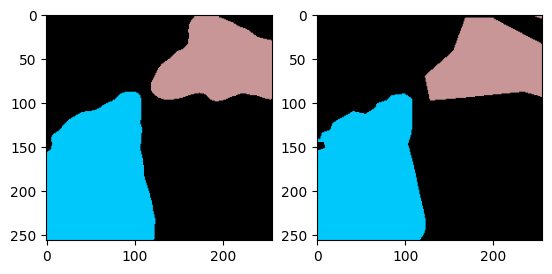

[2023-05-30 22:53:14 swanet_v5](182747771.py 311): INFO Test: [541/728]	Loss 0.0485 (0.3794)	PA@1 97.9309 (90.8209)	MPA@1 96.6055 (82.7621)	KAPPA@1 96.2421 (78.4096)	MIOU@1 94.9101 (72.4041)	FWIOU@1 95.9476 (86.1924)	Mem 44806MB


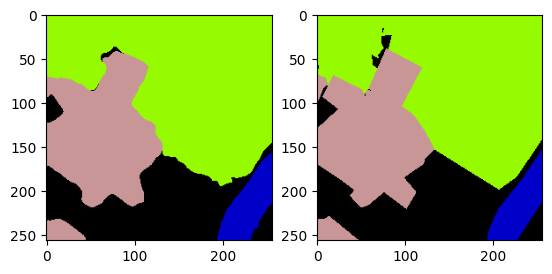

[2023-05-30 22:53:14 swanet_v5](182747771.py 311): INFO Test: [542/728]	Loss 0.0608 (0.3788)	PA@1 97.6425 (90.8335)	MPA@1 97.1498 (82.7886)	KAPPA@1 96.3897 (78.4428)	MIOU@1 94.7638 (72.4453)	FWIOU@1 95.4331 (86.2094)	Mem 44806MB


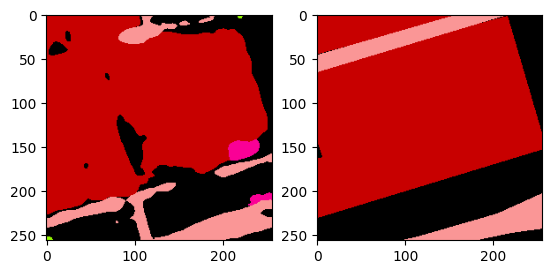

[2023-05-30 22:53:14 swanet_v5](182747771.py 311): INFO Test: [543/728]	Loss 0.5524 (0.3791)	PA@1 83.3008 (90.8197)	MPA@1 44.2091 (82.7177)	KAPPA@1 68.0735 (78.4237)	MIOU@1 36.6364 (72.3795)	FWIOU@1 72.5410 (86.1843)	Mem 44806MB


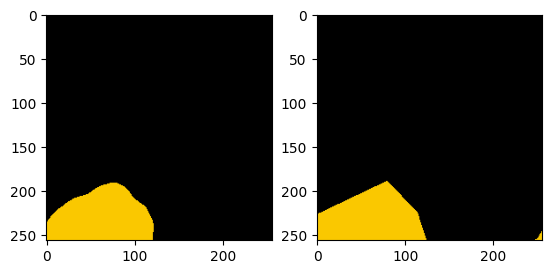

[2023-05-30 22:53:14 swanet_v5](182747771.py 311): INFO Test: [544/728]	Loss 0.0142 (0.3785)	PA@1 99.3988 (90.8354)	MPA@1 97.6928 (82.7452)	KAPPA@1 96.2743 (78.4564)	MIOU@1 96.3869 (72.4235)	FWIOU@1 98.8139 (86.2075)	Mem 44806MB


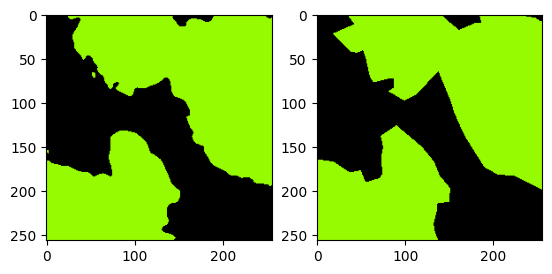

[2023-05-30 22:53:15 swanet_v5](182747771.py 311): INFO Test: [545/728]	Loss 0.0793 (0.3779)	PA@1 96.5958 (90.8459)	MPA@1 96.4933 (82.7704)	KAPPA@1 92.9140 (78.4829)	MIOU@1 93.1653 (72.4615)	FWIOU@1 93.4267 (86.2207)	Mem 44806MB


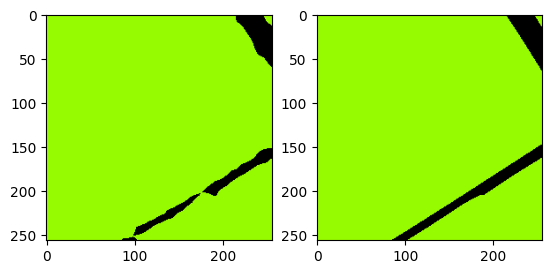

[2023-05-30 22:53:15 swanet_v5](182747771.py 311): INFO Test: [546/728]	Loss 0.0263 (0.3773)	PA@1 98.8998 (90.8607)	MPA@1 97.2259 (82.7968)	KAPPA@1 87.9899 (78.5003)	MIOU@1 89.1636 (72.4921)	FWIOU@1 97.9856 (86.2422)	Mem 44806MB


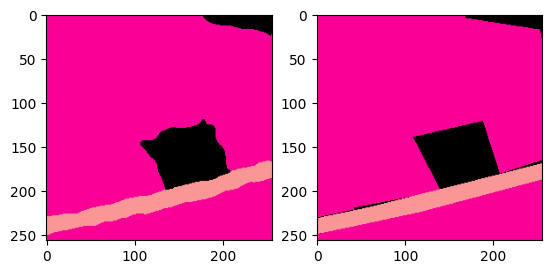

[2023-05-30 22:53:15 swanet_v5](182747771.py 311): INFO Test: [547/728]	Loss 0.0538 (0.3767)	PA@1 97.8943 (90.8735)	MPA@1 94.2145 (82.8176)	KAPPA@1 92.8670 (78.5265)	MIOU@1 90.6862 (72.5253)	FWIOU@1 95.9491 (86.2599)	Mem 44806MB


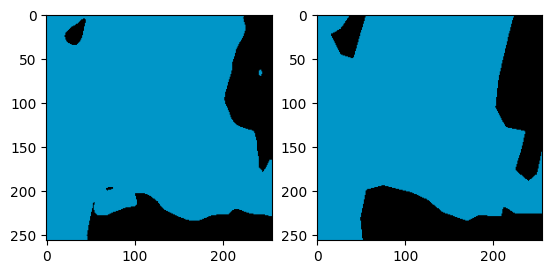

[2023-05-30 22:53:15 swanet_v5](182747771.py 311): INFO Test: [548/728]	Loss 0.1617 (0.3763)	PA@1 95.0531 (90.8811)	MPA@1 96.4302 (82.8424)	KAPPA@1 85.9529 (78.5400)	MIOU@1 87.0815 (72.5518)	FWIOU@1 91.0435 (86.2686)	Mem 44806MB


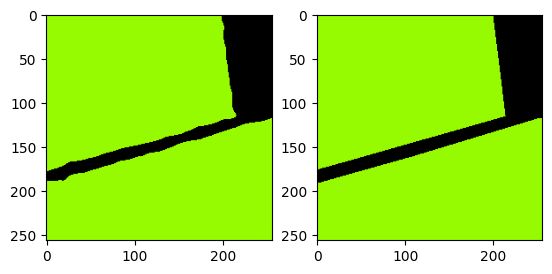

[2023-05-30 22:53:16 swanet_v5](182747771.py 311): INFO Test: [549/728]	Loss 0.0202 (0.3756)	PA@1 99.1516 (90.8962)	MPA@1 98.8616 (82.8716)	KAPPA@1 96.4572 (78.5726)	MIOU@1 96.5497 (72.5954)	FWIOU@1 98.3431 (86.2906)	Mem 44806MB


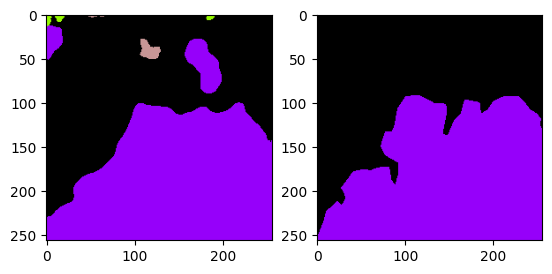

[2023-05-30 22:53:16 swanet_v5](182747771.py 311): INFO Test: [550/728]	Loss 0.2055 (0.3753)	PA@1 91.6763 (90.8976)	MPA@1 46.2344 (82.8051)	KAPPA@1 83.4906 (78.5816)	MIOU@1 42.6627 (72.5411)	FWIOU@1 84.5823 (86.2875)	Mem 44806MB


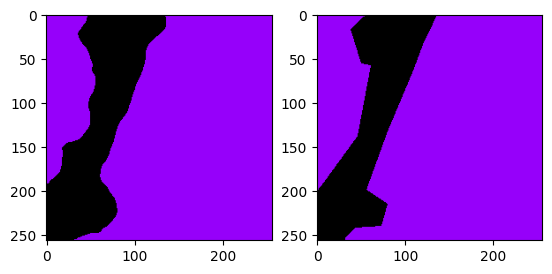

[2023-05-30 22:53:16 swanet_v5](182747771.py 311): INFO Test: [551/728]	Loss 0.0646 (0.3748)	PA@1 97.5769 (90.9097)	MPA@1 95.2006 (82.8275)	KAPPA@1 93.0411 (78.6077)	MIOU@1 93.3382 (72.5788)	FWIOU@1 95.2467 (86.3037)	Mem 44806MB


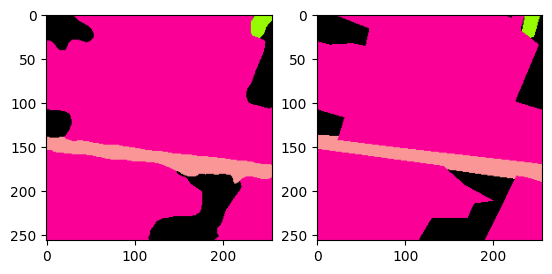

[2023-05-30 22:53:16 swanet_v5](182747771.py 311): INFO Test: [552/728]	Loss 0.0676 (0.3742)	PA@1 97.3373 (90.9213)	MPA@1 90.4479 (82.8413)	KAPPA@1 91.8744 (78.6317)	MIOU@1 87.3080 (72.6054)	FWIOU@1 94.9033 (86.3192)	Mem 44806MB


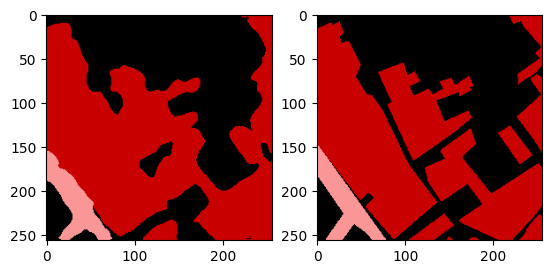

[2023-05-30 22:53:17 swanet_v5](182747771.py 311): INFO Test: [553/728]	Loss 0.1646 (0.3738)	PA@1 92.7582 (90.9246)	MPA@1 92.1320 (82.8581)	KAPPA@1 86.5456 (78.6460)	MIOU@1 85.4628 (72.6286)	FWIOU@1 86.5356 (86.3196)	Mem 44806MB


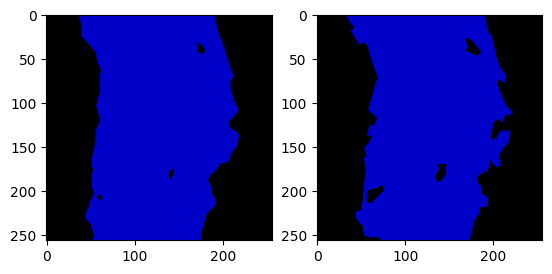

[2023-05-30 22:53:17 swanet_v5](182747771.py 311): INFO Test: [554/728]	Loss 0.0655 (0.3733)	PA@1 97.3053 (90.9361)	MPA@1 97.5498 (82.8845)	KAPPA@1 94.5295 (78.6747)	MIOU@1 94.6750 (72.6683)	FWIOU@1 94.7672 (86.3349)	Mem 44806MB


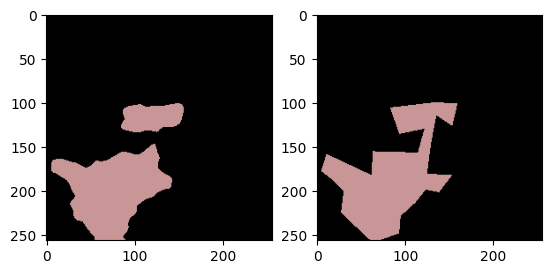

[2023-05-30 22:53:17 swanet_v5](182747771.py 311): INFO Test: [555/728]	Loss 0.0583 (0.3727)	PA@1 97.6410 (90.9482)	MPA@1 96.1917 (82.9085)	KAPPA@1 90.9695 (78.6968)	MIOU@1 91.5299 (72.7023)	FWIOU@1 95.5146 (86.3514)	Mem 44806MB


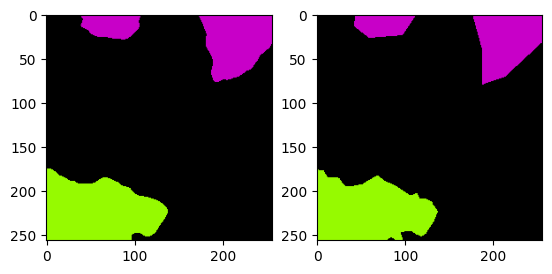

[2023-05-30 22:53:17 swanet_v5](182747771.py 311): INFO Test: [556/728]	Loss 0.0349 (0.3721)	PA@1 98.6679 (90.9620)	MPA@1 96.4215 (82.9327)	KAPPA@1 96.3042 (78.7284)	MIOU@1 95.1974 (72.7426)	FWIOU@1 97.3724 (86.3712)	Mem 44806MB


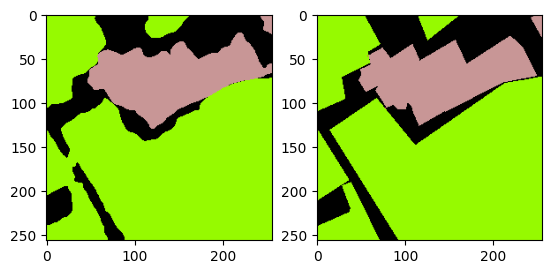

[2023-05-30 22:53:17 swanet_v5](182747771.py 311): INFO Test: [557/728]	Loss 0.0993 (0.3716)	PA@1 95.8771 (90.9708)	MPA@1 94.9223 (82.9542)	KAPPA@1 92.3583 (78.7528)	MIOU@1 67.3369 (72.7330)	FWIOU@1 92.3564 (86.3819)	Mem 44806MB


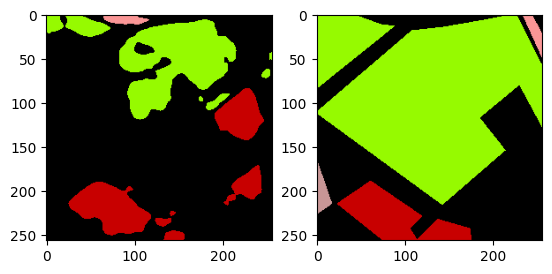

[2023-05-30 22:53:18 swanet_v5](182747771.py 311): INFO Test: [558/728]	Loss 2.5218 (0.3755)	PA@1 51.6891 (90.9006)	MPA@1 47.5803 (82.8909)	KAPPA@1 23.4340 (78.6538)	MIOU@1 21.8052 (72.6419)	FWIOU@1 37.8481 (86.2951)	Mem 44806MB


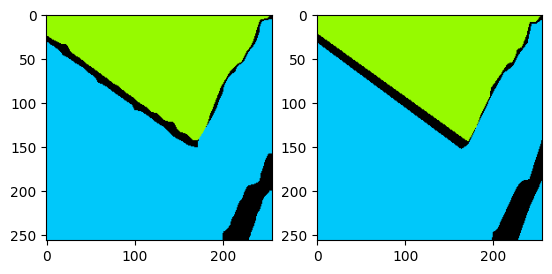

[2023-05-30 22:53:18 swanet_v5](182747771.py 311): INFO Test: [559/728]	Loss 0.0409 (0.3749)	PA@1 98.2391 (90.9137)	MPA@1 96.3880 (82.9150)	KAPPA@1 96.5271 (78.6858)	MIOU@1 91.1464 (72.6749)	FWIOU@1 96.7666 (86.3138)	Mem 44806MB


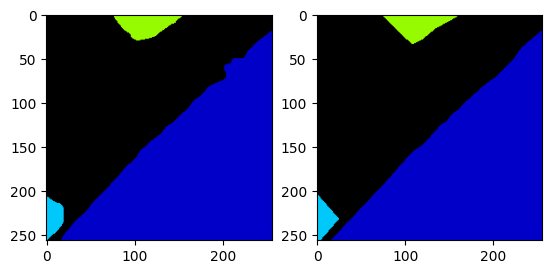

[2023-05-30 22:53:18 swanet_v5](182747771.py 311): INFO Test: [560/728]	Loss 0.0278 (0.3742)	PA@1 98.7793 (90.9277)	MPA@1 96.7514 (82.9397)	KAPPA@1 97.7018 (78.7197)	MIOU@1 92.7252 (72.7106)	FWIOU@1 97.6112 (86.3339)	Mem 44806MB


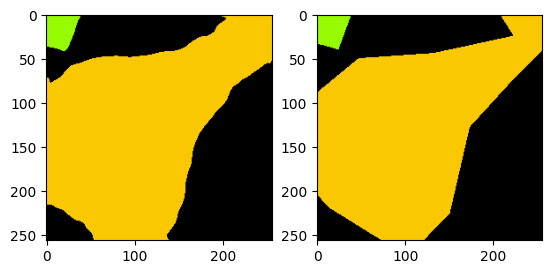

[2023-05-30 22:53:18 swanet_v5](182747771.py 311): INFO Test: [561/728]	Loss 0.0909 (0.3737)	PA@1 96.6354 (90.9378)	MPA@1 96.1889 (82.9633)	KAPPA@1 93.3030 (78.7456)	MIOU@1 93.5044 (72.7476)	FWIOU@1 93.5382 (86.3467)	Mem 44806MB


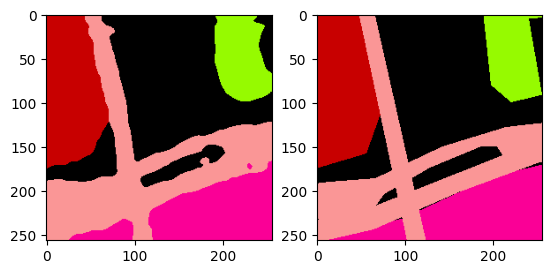

[2023-05-30 22:53:18 swanet_v5](182747771.py 311): INFO Test: [562/728]	Loss 0.1104 (0.3733)	PA@1 95.7489 (90.9464)	MPA@1 96.1168 (82.9867)	KAPPA@1 94.3335 (78.7733)	MIOU@1 92.3132 (72.7824)	FWIOU@1 91.8399 (86.3565)	Mem 44806MB


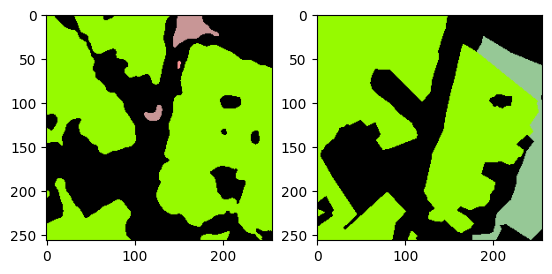

[2023-05-30 22:53:19 swanet_v5](182747771.py 311): INFO Test: [563/728]	Loss 1.4210 (0.3751)	PA@1 75.8713 (90.9197)	MPA@1 38.6515 (82.9080)	KAPPA@1 55.4549 (78.7319)	MIOU@1 26.9317 (72.7011)	FWIOU@1 66.2355 (86.3208)	Mem 44806MB


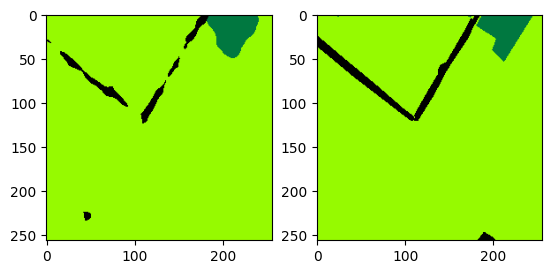

[2023-05-30 22:53:19 swanet_v5](182747771.py 311): INFO Test: [564/728]	Loss 0.0579 (0.3746)	PA@1 97.3801 (90.9311)	MPA@1 90.0639 (82.9207)	KAPPA@1 76.2177 (78.7275)	MIOU@1 75.9686 (72.7069)	FWIOU@1 95.7907 (86.3376)	Mem 44806MB


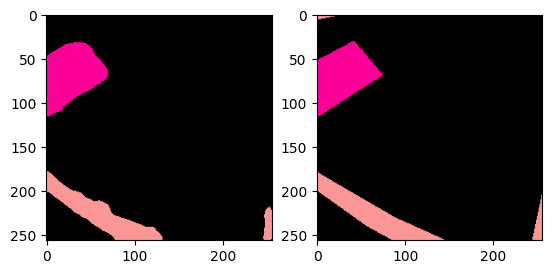

[2023-05-30 22:53:19 swanet_v5](182747771.py 311): INFO Test: [565/728]	Loss 0.0351 (0.3740)	PA@1 98.7198 (90.9449)	MPA@1 95.8336 (82.9435)	KAPPA@1 93.5988 (78.7538)	MIOU@1 92.0582 (72.7411)	FWIOU@1 97.5360 (86.3573)	Mem 44806MB


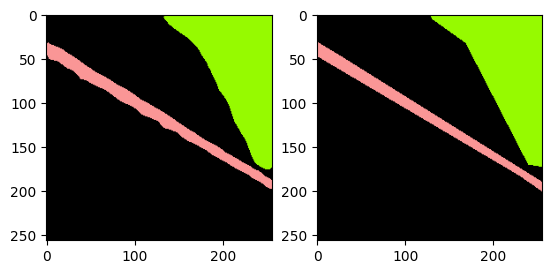

[2023-05-30 22:53:19 swanet_v5](182747771.py 311): INFO Test: [566/728]	Loss 0.0338 (0.3734)	PA@1 98.6008 (90.9584)	MPA@1 94.7451 (82.9643)	KAPPA@1 96.0963 (78.7844)	MIOU@1 92.8555 (72.7765)	FWIOU@1 97.2580 (86.3766)	Mem 44806MB


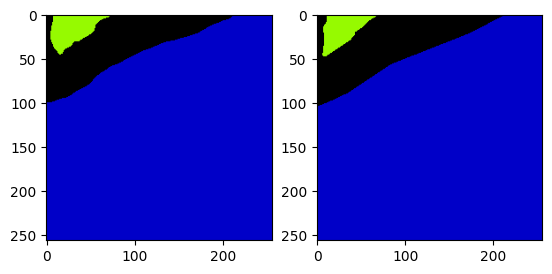

[2023-05-30 22:53:20 swanet_v5](182747771.py 311): INFO Test: [567/728]	Loss 0.0369 (0.3728)	PA@1 98.7152 (90.9720)	MPA@1 94.8988 (82.9853)	KAPPA@1 95.4033 (78.8136)	MIOU@1 91.1943 (72.8090)	FWIOU@1 97.5511 (86.3962)	Mem 44806MB


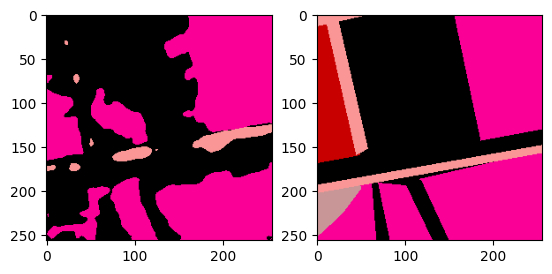

[2023-05-30 22:53:20 swanet_v5](182747771.py 311): INFO Test: [568/728]	Loss 1.8273 (0.3753)	PA@1 69.2581 (90.9338)	MPA@1 49.6530 (82.9268)	KAPPA@1 48.1254 (78.7597)	MIOU@1 25.2929 (72.7255)	FWIOU@1 60.1621 (86.3501)	Mem 44806MB


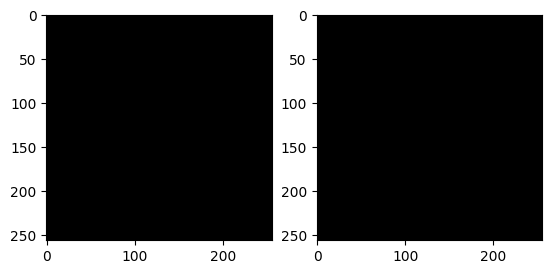

[2023-05-30 22:53:20 swanet_v5](182747771.py 311): INFO Test: [569/728]	Loss 0.0003 (0.3747)	PA@1 100.0000 (90.9498)	MPA@1 100.0000 (82.9567)	KAPPA@1 100.0000 (78.7969)	MIOU@1 100.0000 (72.7733)	FWIOU@1 100.0000 (86.3741)	Mem 44806MB


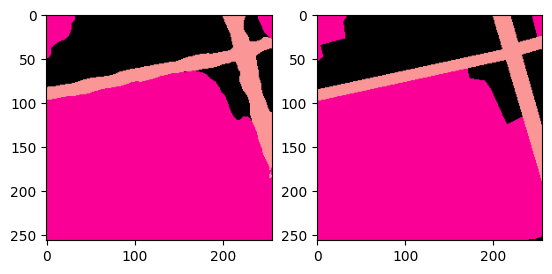

[2023-05-30 22:53:20 swanet_v5](182747771.py 311): INFO Test: [570/728]	Loss 0.0580 (0.3741)	PA@1 97.5540 (90.9613)	MPA@1 94.7527 (82.9774)	KAPPA@1 95.0251 (78.8254)	MIOU@1 91.2733 (72.8057)	FWIOU@1 95.3198 (86.3897)	Mem 44806MB


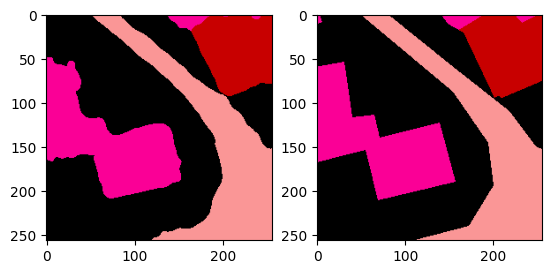

[2023-05-30 22:53:20 swanet_v5](182747771.py 311): INFO Test: [571/728]	Loss 0.0717 (0.3736)	PA@1 97.1130 (90.9721)	MPA@1 96.7806 (83.0015)	KAPPA@1 95.5750 (78.8546)	MIOU@1 94.2699 (72.8432)	FWIOU@1 94.3896 (86.4037)	Mem 44806MB


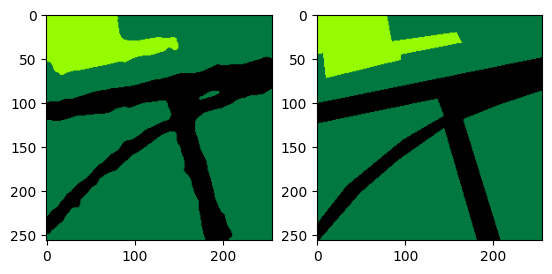

[2023-05-30 22:53:21 swanet_v5](182747771.py 311): INFO Test: [572/728]	Loss 0.0882 (0.3731)	PA@1 96.3364 (90.9814)	MPA@1 95.3468 (83.0231)	KAPPA@1 92.3537 (78.8782)	MIOU@1 90.8369 (72.8746)	FWIOU@1 92.9717 (86.4152)	Mem 44806MB


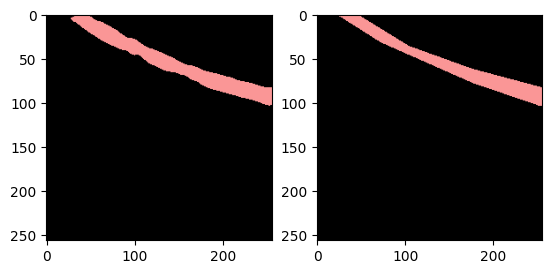

[2023-05-30 22:53:21 swanet_v5](182747771.py 311): INFO Test: [573/728]	Loss 0.0302 (0.3725)	PA@1 98.7167 (90.9949)	MPA@1 91.2717 (83.0374)	KAPPA@1 88.0785 (78.8942)	MIOU@1 89.2160 (72.9031)	FWIOU@1 97.4943 (86.4345)	Mem 44806MB


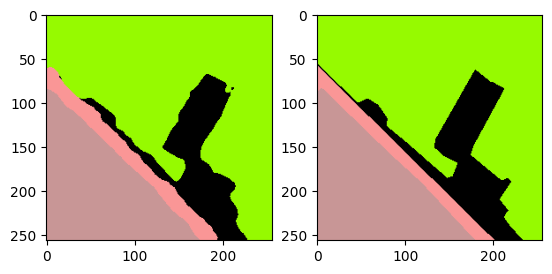

[2023-05-30 22:53:21 swanet_v5](182747771.py 311): INFO Test: [574/728]	Loss 0.0657 (0.3720)	PA@1 97.3648 (91.0060)	MPA@1 94.8173 (83.0579)	KAPPA@1 95.7030 (78.9235)	MIOU@1 91.2655 (72.9350)	FWIOU@1 94.9669 (86.4493)	Mem 44806MB


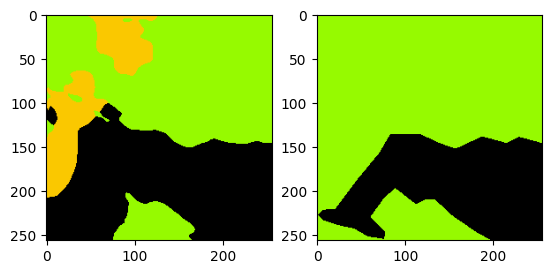

[2023-05-30 22:53:21 swanet_v5](182747771.py 311): INFO Test: [575/728]	Loss 0.9337 (0.3729)	PA@1 77.1576 (90.9819)	MPA@1 58.2425 (83.0148)	KAPPA@1 58.2762 (78.8876)	MIOU@1 47.4270 (72.8908)	FWIOU@1 61.7160 (86.4064)	Mem 44806MB


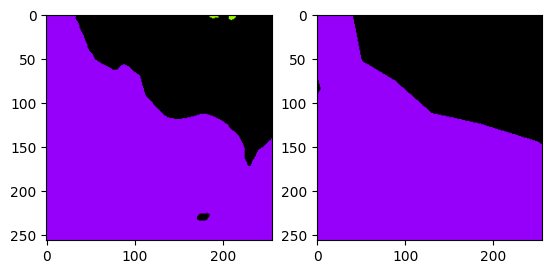

[2023-05-30 22:53:21 swanet_v5](182747771.py 311): INFO Test: [576/728]	Loss 0.0872 (0.3724)	PA@1 96.7575 (90.9920)	MPA@1 64.4600 (82.9827)	KAPPA@1 92.8225 (78.9118)	MIOU@1 62.1022 (72.8721)	FWIOU@1 93.7509 (86.4191)	Mem 44806MB


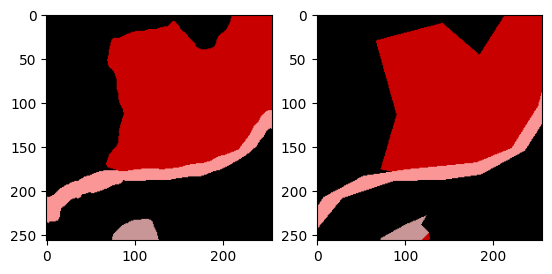

[2023-05-30 22:53:22 swanet_v5](182747771.py 311): INFO Test: [577/728]	Loss 0.0681 (0.3719)	PA@1 97.4091 (91.0031)	MPA@1 90.3022 (82.9953)	KAPPA@1 95.3870 (78.9403)	MIOU@1 87.1986 (72.8968)	FWIOU@1 94.9987 (86.4340)	Mem 44806MB


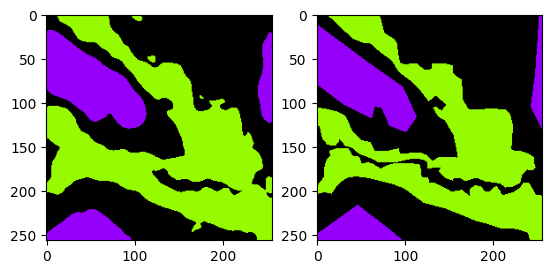

[2023-05-30 22:53:22 swanet_v5](182747771.py 311): INFO Test: [578/728]	Loss 0.1651 (0.3716)	PA@1 92.7322 (91.0060)	MPA@1 91.8358 (83.0106)	KAPPA@1 88.0530 (78.9560)	MIOU@1 86.7029 (72.9207)	FWIOU@1 86.4569 (86.4340)	Mem 44806MB


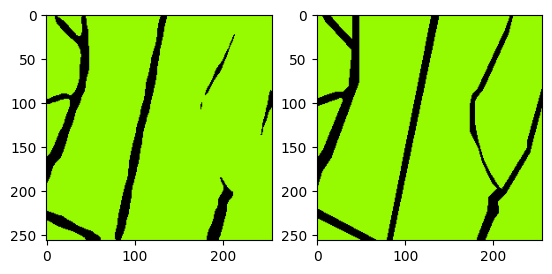

[2023-05-30 22:53:22 swanet_v5](182747771.py 311): INFO Test: [579/728]	Loss 0.0964 (0.3711)	PA@1 95.9091 (91.0145)	MPA@1 92.9607 (83.0278)	KAPPA@1 79.1232 (78.9563)	MIOU@1 82.0714 (72.9365)	FWIOU@1 92.8122 (86.4450)	Mem 44806MB


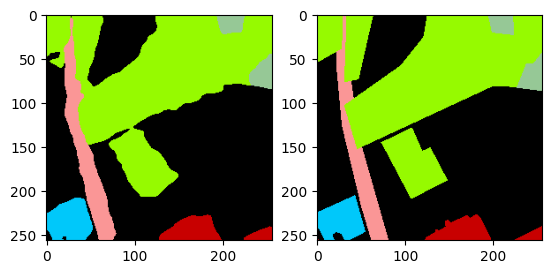

[2023-05-30 22:53:22 swanet_v5](182747771.py 311): INFO Test: [580/728]	Loss 0.1127 (0.3706)	PA@1 95.2866 (91.0219)	MPA@1 92.1437 (83.0435)	KAPPA@1 92.2185 (78.9791)	MIOU@1 87.6331 (72.9618)	FWIOU@1 90.9926 (86.4528)	Mem 44806MB


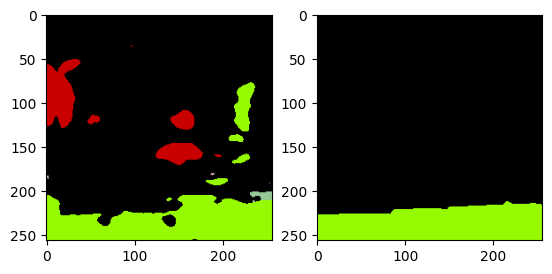

[2023-05-30 22:53:22 swanet_v5](182747771.py 311): INFO Test: [581/728]	Loss 0.3081 (0.3705)	PA@1 89.9048 (91.0199)	MPA@1 35.5501 (82.9618)	KAPPA@1 66.8382 (78.9583)	MIOU@1 32.5440 (72.8923)	FWIOU@1 81.1258 (86.4437)	Mem 44806MB


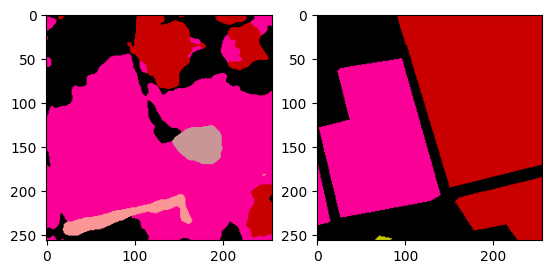

[2023-05-30 22:53:23 swanet_v5](182747771.py 311): INFO Test: [582/728]	Loss 2.6776 (0.3745)	PA@1 50.1129 (90.9498)	MPA@1 39.6929 (82.8876)	KAPPA@1 31.3833 (78.8767)	MIOU@1 17.0761 (72.7966)	FWIOU@1 36.2798 (86.3576)	Mem 44806MB


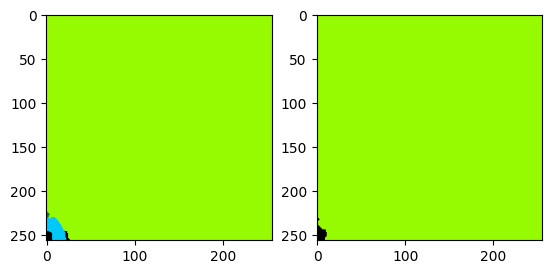

[2023-05-30 22:53:23 swanet_v5](182747771.py 311): INFO Test: [583/728]	Loss 0.0208 (0.3739)	PA@1 99.3073 (90.9641)	MPA@1 42.3684 (82.8182)	KAPPA@1 32.3965 (78.7971)	MIOU@1 33.9256 (72.7300)	FWIOU@1 98.7023 (86.3788)	Mem 44806MB


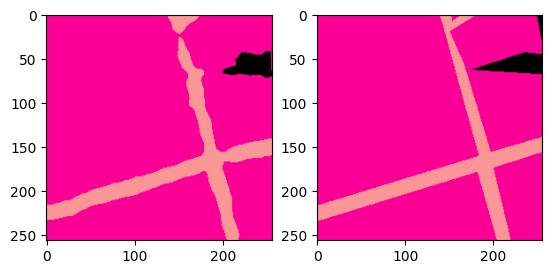

[2023-05-30 22:53:23 swanet_v5](182747771.py 311): INFO Test: [584/728]	Loss 0.0781 (0.3734)	PA@1 96.9101 (90.9742)	MPA@1 89.7759 (82.8301)	KAPPA@1 87.7931 (78.8125)	MIOU@1 79.9580 (72.7424)	FWIOU@1 94.2655 (86.3923)	Mem 44806MB


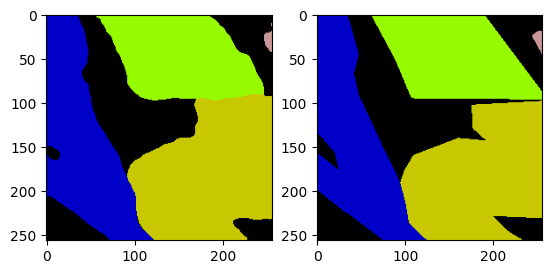

[2023-05-30 22:53:23 swanet_v5](182747771.py 311): INFO Test: [585/728]	Loss 0.1106 (0.3729)	PA@1 95.7001 (90.9823)	MPA@1 95.8672 (82.8524)	KAPPA@1 94.2427 (78.8388)	MIOU@1 88.9824 (72.7701)	FWIOU@1 91.9334 (86.4017)	Mem 44806MB


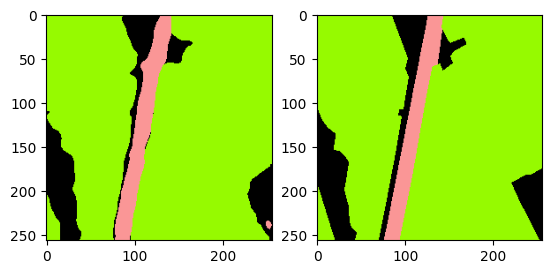

[2023-05-30 22:53:23 swanet_v5](182747771.py 311): INFO Test: [586/728]	Loss 0.0772 (0.3724)	PA@1 96.8796 (90.9924)	MPA@1 94.5489 (82.8723)	KAPPA@1 90.6034 (78.8588)	MIOU@1 88.1925 (72.7964)	FWIOU@1 94.2716 (86.4151)	Mem 44806MB


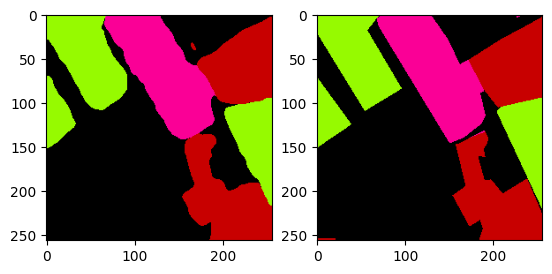

[2023-05-30 22:53:24 swanet_v5](182747771.py 311): INFO Test: [587/728]	Loss 0.0889 (0.3719)	PA@1 96.4066 (91.0016)	MPA@1 95.6125 (82.8940)	KAPPA@1 94.6045 (78.8856)	MIOU@1 92.9368 (72.8306)	FWIOU@1 93.0541 (86.4264)	Mem 44806MB


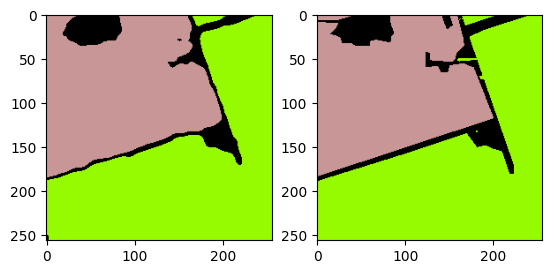

[2023-05-30 22:53:24 swanet_v5](182747771.py 311): INFO Test: [588/728]	Loss 0.0797 (0.3714)	PA@1 96.9681 (91.0117)	MPA@1 95.0188 (82.9146)	KAPPA@1 94.6828 (78.9124)	MIOU@1 88.2367 (72.8568)	FWIOU@1 94.5869 (86.4403)	Mem 44806MB


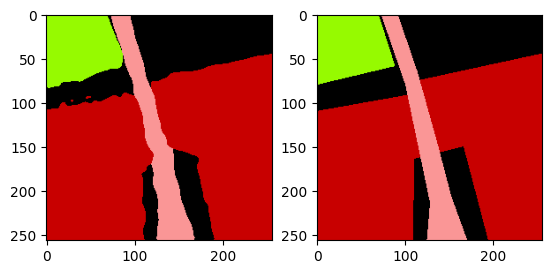

[2023-05-30 22:53:24 swanet_v5](182747771.py 311): INFO Test: [589/728]	Loss 0.0653 (0.3709)	PA@1 97.3557 (91.0224)	MPA@1 96.3250 (82.9373)	KAPPA@1 95.5632 (78.9407)	MIOU@1 93.4583 (72.8917)	FWIOU@1 94.9315 (86.4547)	Mem 44806MB


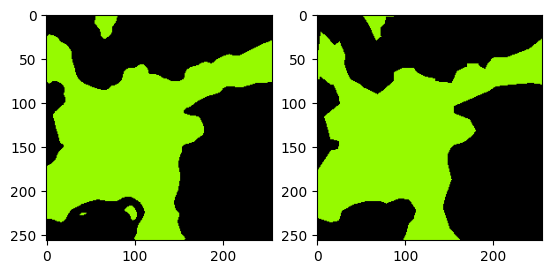

[2023-05-30 22:53:24 swanet_v5](182747771.py 311): INFO Test: [590/728]	Loss 0.0652 (0.3704)	PA@1 97.2778 (91.0330)	MPA@1 97.0724 (82.9612)	KAPPA@1 94.4650 (78.9669)	MIOU@1 94.6152 (72.9284)	FWIOU@1 94.6924 (86.4686)	Mem 44806MB


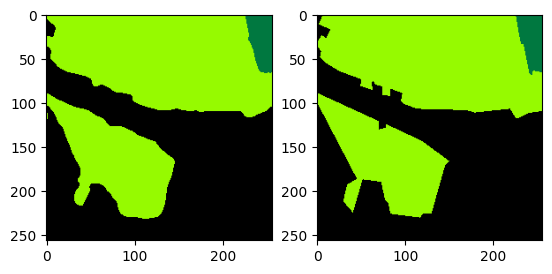

[2023-05-30 22:53:25 swanet_v5](182747771.py 311): INFO Test: [591/728]	Loss 0.0538 (0.3699)	PA@1 97.8180 (91.0445)	MPA@1 97.8428 (82.9864)	KAPPA@1 95.8242 (78.9954)	MIOU@1 95.5356 (72.9666)	FWIOU@1 95.7293 (86.4842)	Mem 44806MB


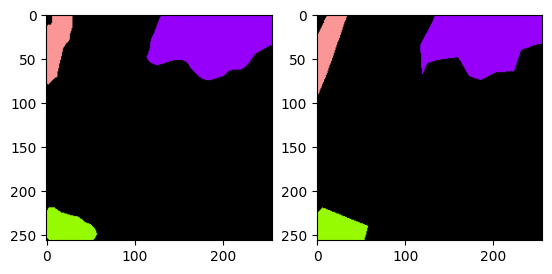

[2023-05-30 22:53:25 swanet_v5](182747771.py 311): INFO Test: [592/728]	Loss 0.0319 (0.3693)	PA@1 98.6816 (91.0574)	MPA@1 95.9968 (83.0083)	KAPPA@1 95.4315 (79.0231)	MIOU@1 93.2069 (73.0008)	FWIOU@1 97.4135 (86.5027)	Mem 44806MB


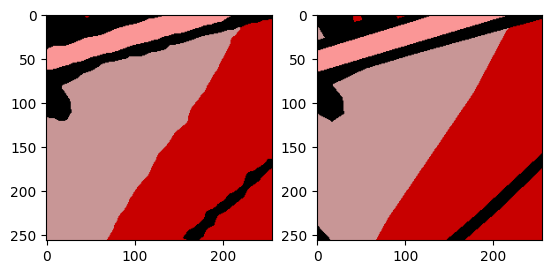

[2023-05-30 22:53:25 swanet_v5](182747771.py 311): INFO Test: [593/728]	Loss 0.0752 (0.3688)	PA@1 97.2656 (91.0678)	MPA@1 96.5870 (83.0312)	KAPPA@1 95.8521 (79.0514)	MIOU@1 92.8982 (73.0343)	FWIOU@1 94.7852 (86.5166)	Mem 44806MB


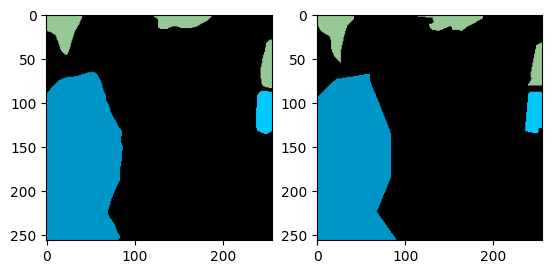

[2023-05-30 22:53:25 swanet_v5](182747771.py 311): INFO Test: [594/728]	Loss 0.0356 (0.3683)	PA@1 98.6954 (91.0806)	MPA@1 96.5548 (83.0539)	KAPPA@1 96.8591 (79.0814)	MIOU@1 92.8907 (73.0676)	FWIOU@1 97.4613 (86.5350)	Mem 44806MB


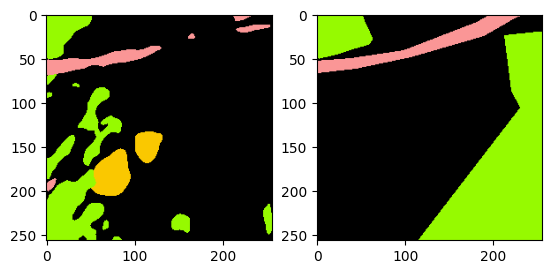

[2023-05-30 22:53:25 swanet_v5](182747771.py 311): INFO Test: [595/728]	Loss 1.7621 (0.3706)	PA@1 59.5062 (91.0277)	MPA@1 42.0895 (82.9851)	KAPPA@1 3.6251 (78.9548)	MIOU@1 27.0390 (72.9904)	FWIOU@1 48.4740 (86.4711)	Mem 44806MB


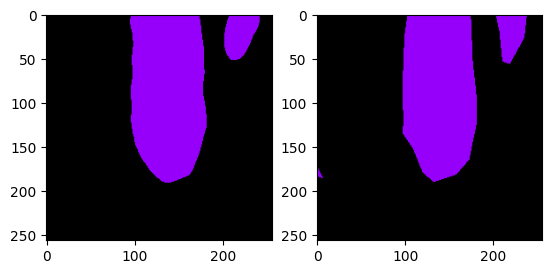

[2023-05-30 22:53:26 swanet_v5](182747771.py 311): INFO Test: [596/728]	Loss 0.0393 (0.3700)	PA@1 98.3887 (91.0400)	MPA@1 97.0920 (83.0088)	KAPPA@1 95.5451 (78.9826)	MIOU@1 95.6673 (73.0284)	FWIOU@1 96.8244 (86.4885)	Mem 44806MB


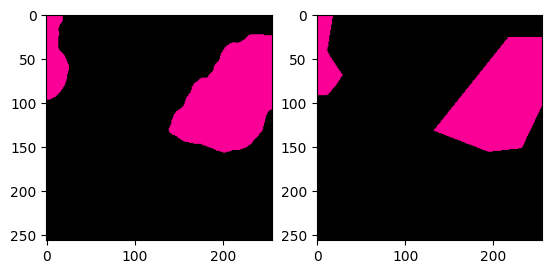

[2023-05-30 22:53:26 swanet_v5](182747771.py 311): INFO Test: [597/728]	Loss 0.0331 (0.3695)	PA@1 98.7183 (91.0528)	MPA@1 97.3825 (83.0328)	KAPPA@1 95.6922 (79.0105)	MIOU@1 95.8181 (73.0665)	FWIOU@1 97.4780 (86.5069)	Mem 44806MB


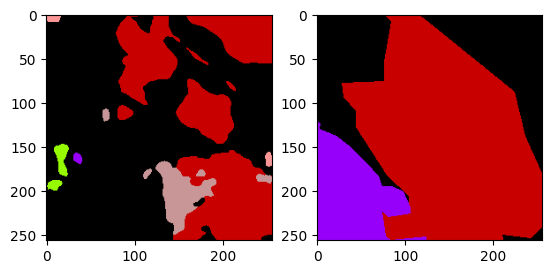

[2023-05-30 22:53:26 swanet_v5](182747771.py 311): INFO Test: [598/728]	Loss 2.6478 (0.3733)	PA@1 45.8069 (90.9773)	MPA@1 35.5881 (82.9536)	KAPPA@1 15.6058 (78.9046)	MIOU@1 11.4822 (72.9637)	FWIOU@1 31.0050 (86.4142)	Mem 44806MB


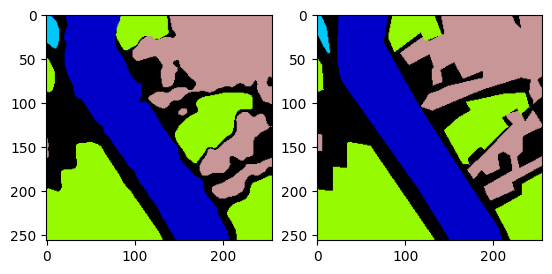

[2023-05-30 22:53:26 swanet_v5](182747771.py 311): INFO Test: [599/728]	Loss 0.1636 (0.3729)	PA@1 92.9077 (90.9805)	MPA@1 88.7570 (82.9633)	KAPPA@1 90.5713 (78.9241)	MIOU@1 83.1955 (72.9807)	FWIOU@1 87.2700 (86.4156)	Mem 44806MB


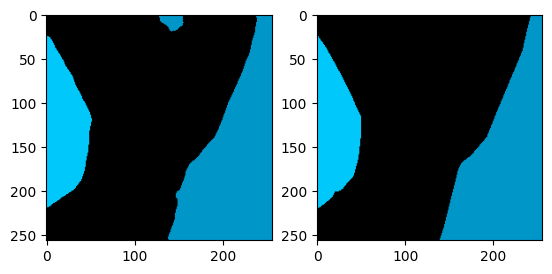

[2023-05-30 22:53:26 swanet_v5](182747771.py 311): INFO Test: [600/728]	Loss 0.0365 (0.3724)	PA@1 98.5016 (90.9930)	MPA@1 97.4765 (82.9874)	KAPPA@1 97.0737 (78.9543)	MIOU@1 96.5989 (73.0200)	FWIOU@1 97.0383 (86.4333)	Mem 44806MB


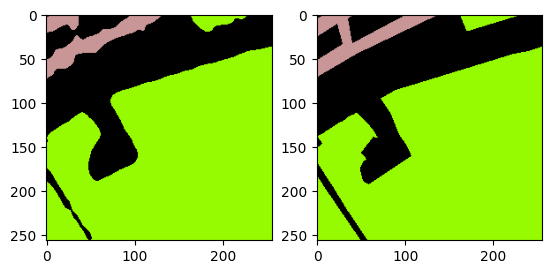

[2023-05-30 22:53:27 swanet_v5](182747771.py 311): INFO Test: [601/728]	Loss 0.0607 (0.3718)	PA@1 97.3602 (91.0036)	MPA@1 94.6346 (83.0068)	KAPPA@1 94.5440 (78.9802)	MIOU@1 67.5042 (73.0109)	FWIOU@1 94.9584 (86.4475)	Mem 44806MB


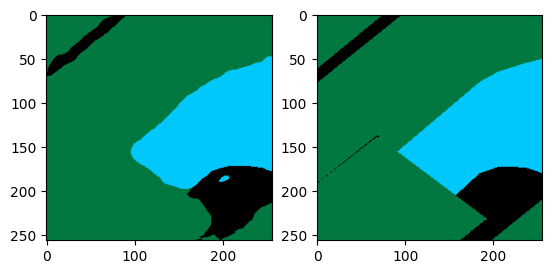

[2023-05-30 22:53:27 swanet_v5](182747771.py 311): INFO Test: [602/728]	Loss 0.0581 (0.3713)	PA@1 97.8165 (91.0149)	MPA@1 96.7704 (83.0296)	KAPPA@1 95.4535 (79.0075)	MIOU@1 69.6461 (73.0053)	FWIOU@1 95.8253 (86.4630)	Mem 44806MB


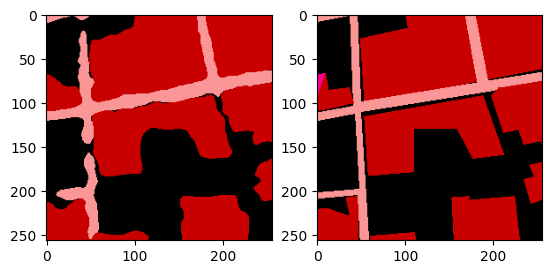

[2023-05-30 22:53:27 swanet_v5](182747771.py 311): INFO Test: [603/728]	Loss 0.1681 (0.3710)	PA@1 93.0801 (91.0183)	MPA@1 89.5271 (83.0404)	KAPPA@1 88.1251 (79.0226)	MIOU@1 62.3408 (72.9876)	FWIOU@1 87.3479 (86.4645)	Mem 44806MB


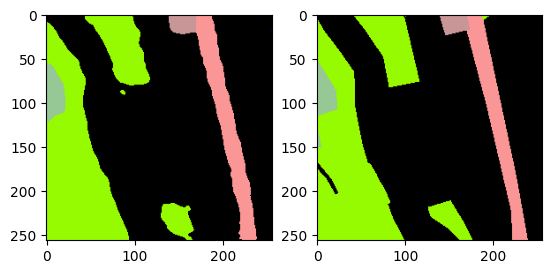

[2023-05-30 22:53:27 swanet_v5](182747771.py 311): INFO Test: [604/728]	Loss 0.0888 (0.3705)	PA@1 96.6614 (91.0277)	MPA@1 76.6513 (83.0298)	KAPPA@1 93.3822 (79.0463)	MIOU@1 73.1200 (72.9879)	FWIOU@1 93.5612 (86.4762)	Mem 44806MB


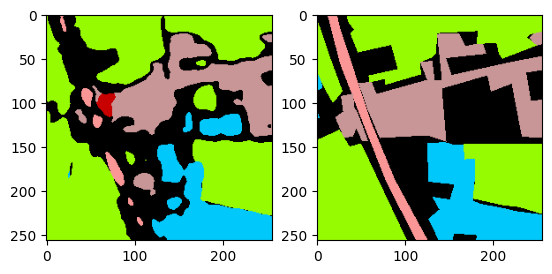

[2023-05-30 22:53:27 swanet_v5](182747771.py 311): INFO Test: [605/728]	Loss 0.5728 (0.3709)	PA@1 78.3096 (91.0067)	MPA@1 67.6719 (83.0045)	KAPPA@1 69.6644 (79.0309)	MIOU@1 48.0637 (72.9467)	FWIOU@1 67.1423 (86.4443)	Mem 44806MB


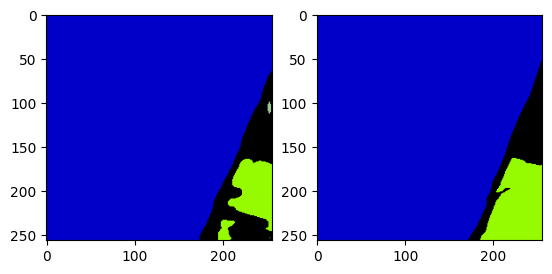

[2023-05-30 22:53:28 swanet_v5](182747771.py 311): INFO Test: [606/728]	Loss 0.1108 (0.3704)	PA@1 96.1380 (91.0151)	MPA@1 51.7807 (82.9530)	KAPPA@1 83.0089 (79.0374)	MIOU@1 42.7025 (72.8969)	FWIOU@1 93.8510 (86.4565)	Mem 44806MB


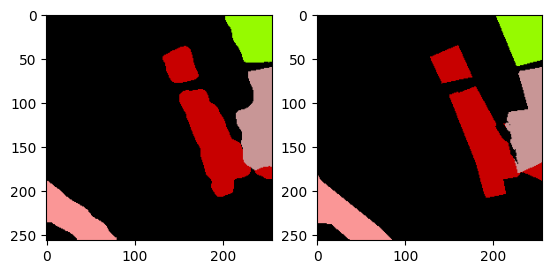

[2023-05-30 22:53:28 swanet_v5](182747771.py 311): INFO Test: [607/728]	Loss 0.0506 (0.3699)	PA@1 98.1567 (91.0269)	MPA@1 96.9741 (82.9761)	KAPPA@1 95.1413 (79.0639)	MIOU@1 93.2137 (72.9303)	FWIOU@1 96.4262 (86.4729)	Mem 44806MB


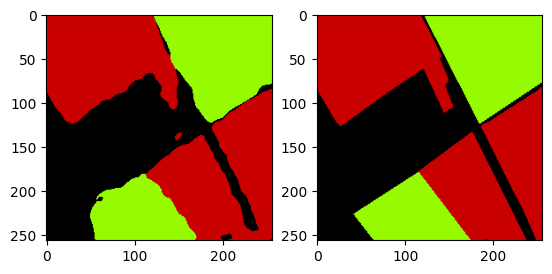

[2023-05-30 22:53:28 swanet_v5](182747771.py 311): INFO Test: [608/728]	Loss 0.0760 (0.3694)	PA@1 96.8674 (91.0365)	MPA@1 96.8214 (82.9988)	KAPPA@1 95.2110 (79.0904)	MIOU@1 93.8559 (72.9647)	FWIOU@1 93.9696 (86.4852)	Mem 44806MB


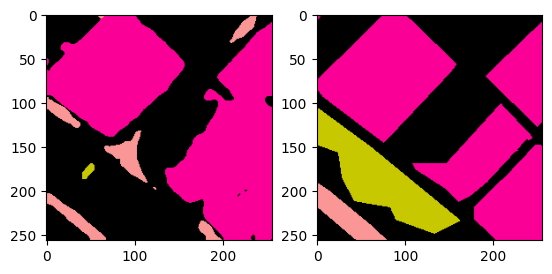

[2023-05-30 22:53:28 swanet_v5](182747771.py 311): INFO Test: [609/728]	Loss 0.9012 (0.3703)	PA@1 77.0325 (91.0135)	MPA@1 57.5678 (82.9571)	KAPPA@1 61.3369 (79.0613)	MIOU@1 33.9922 (72.9008)	FWIOU@1 70.2386 (86.4586)	Mem 44806MB


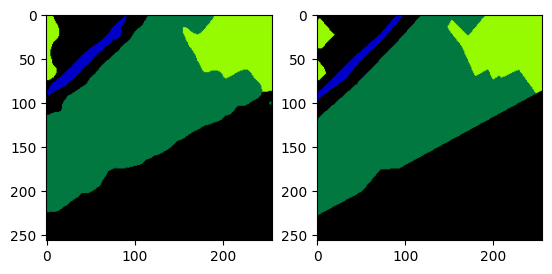

[2023-05-30 22:53:28 swanet_v5](182747771.py 311): INFO Test: [610/728]	Loss 0.0615 (0.3698)	PA@1 97.6074 (91.0243)	MPA@1 92.0228 (82.9720)	KAPPA@1 96.0085 (79.0890)	MIOU@1 88.2722 (72.9259)	FWIOU@1 95.3814 (86.4732)	Mem 44806MB


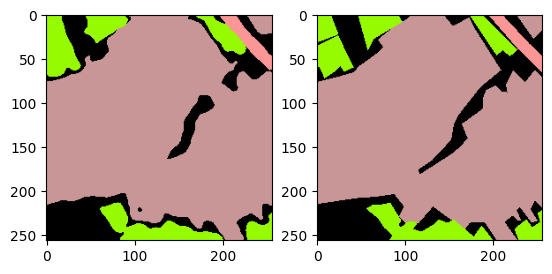

[2023-05-30 22:53:29 swanet_v5](182747771.py 311): INFO Test: [611/728]	Loss 0.1314 (0.3694)	PA@1 94.8563 (91.0305)	MPA@1 91.9858 (82.9867)	KAPPA@1 88.5026 (79.1044)	MIOU@1 84.2670 (72.9445)	FWIOU@1 90.7928 (86.4803)	Mem 44806MB


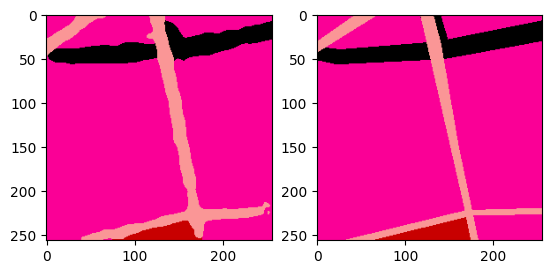

[2023-05-30 22:53:29 swanet_v5](182747771.py 311): INFO Test: [612/728]	Loss 0.0997 (0.3690)	PA@1 95.8313 (91.0384)	MPA@1 91.0177 (82.9998)	KAPPA@1 87.3657 (79.1179)	MIOU@1 82.9245 (72.9608)	FWIOU@1 92.0647 (86.4894)	Mem 44806MB


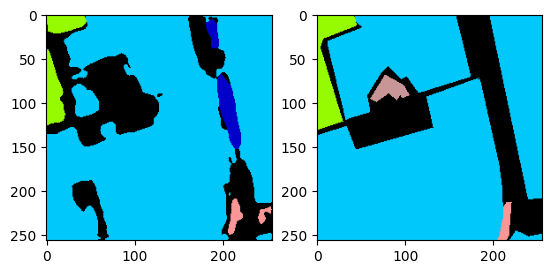

[2023-05-30 22:53:29 swanet_v5](182747771.py 311): INFO Test: [613/728]	Loss 0.4008 (0.3690)	PA@1 84.7931 (91.0282)	MPA@1 61.3128 (82.9645)	KAPPA@1 63.6848 (79.0928)	MIOU@1 42.0870 (72.9105)	FWIOU@1 75.5699 (86.4716)	Mem 44806MB


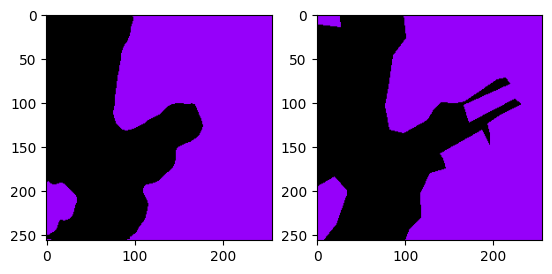

[2023-05-30 22:53:29 swanet_v5](182747771.py 311): INFO Test: [614/728]	Loss 0.1158 (0.3686)	PA@1 95.5231 (91.0355)	MPA@1 95.6022 (82.9850)	KAPPA@1 90.8268 (79.1118)	MIOU@1 91.2367 (72.9403)	FWIOU@1 91.4542 (86.4797)	Mem 44806MB


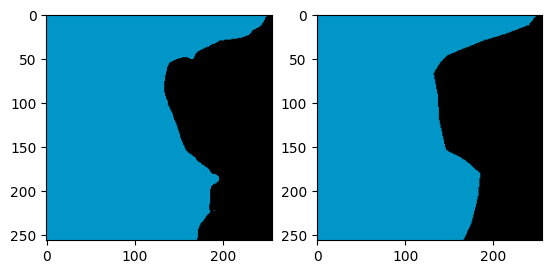

[2023-05-30 22:53:29 swanet_v5](182747771.py 311): INFO Test: [615/728]	Loss 0.0630 (0.3681)	PA@1 97.6349 (91.0462)	MPA@1 98.2084 (83.0097)	KAPPA@1 94.7394 (79.1372)	MIOU@1 94.8843 (72.9759)	FWIOU@1 95.4272 (86.4942)	Mem 44806MB


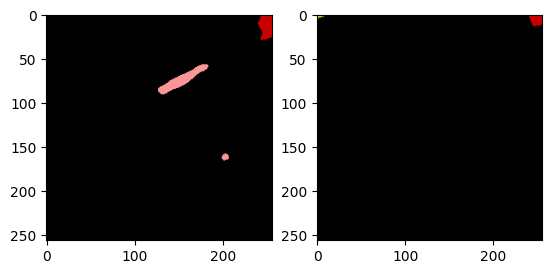

[2023-05-30 22:53:30 swanet_v5](182747771.py 311): INFO Test: [616/728]	Loss 0.0489 (0.3676)	PA@1 98.6526 (91.0586)	MPA@1 48.5497 (82.9539)	KAPPA@1 27.6579 (79.0538)	MIOU@1 35.6520 (72.9154)	FWIOU@1 97.3842 (86.5119)	Mem 44806MB


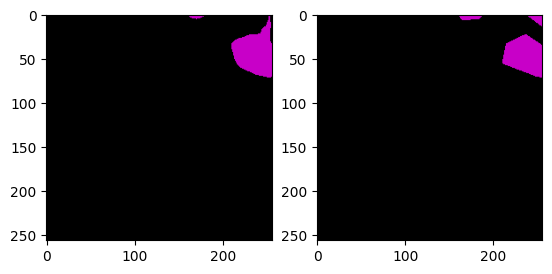

[2023-05-30 22:53:30 swanet_v5](182747771.py 311): INFO Test: [617/728]	Loss 0.0170 (0.3670)	PA@1 99.1058 (91.0716)	MPA@1 91.5485 (82.9678)	KAPPA@1 84.6131 (79.0628)	MIOU@1 86.5536 (72.9375)	FWIOU@1 98.3178 (86.5310)	Mem 44806MB


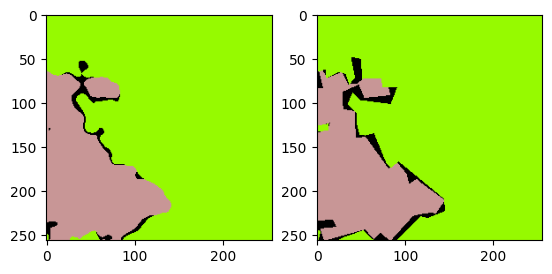

[2023-05-30 22:53:30 swanet_v5](182747771.py 311): INFO Test: [618/728]	Loss 0.0830 (0.3666)	PA@1 96.7911 (91.0808)	MPA@1 87.8652 (82.9757)	KAPPA@1 91.7137 (79.0832)	MIOU@1 74.5171 (72.9400)	FWIOU@1 95.0591 (86.5447)	Mem 44806MB


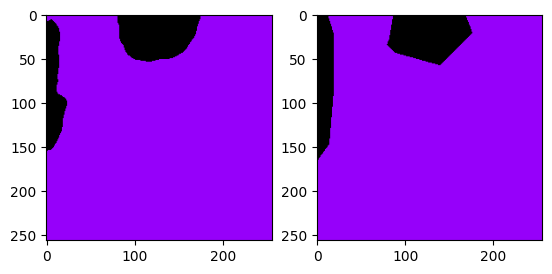

[2023-05-30 22:53:30 swanet_v5](182747771.py 311): INFO Test: [619/728]	Loss 0.0392 (0.3660)	PA@1 98.1613 (91.0922)	MPA@1 96.5001 (82.9975)	KAPPA@1 89.9109 (79.1007)	MIOU@1 90.6735 (72.9686)	FWIOU@1 96.5490 (86.5609)	Mem 44806MB


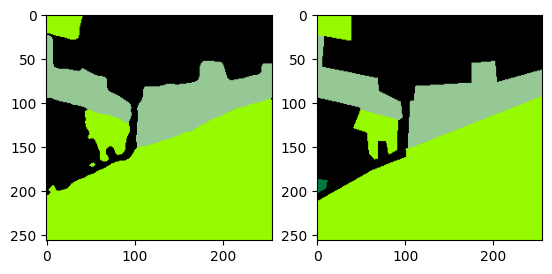

[2023-05-30 22:53:31 swanet_v5](182747771.py 311): INFO Test: [620/728]	Loss 0.0684 (0.3656)	PA@1 97.4152 (91.1024)	MPA@1 96.8132 (83.0198)	KAPPA@1 95.8546 (79.1276)	MIOU@1 70.9962 (72.9654)	FWIOU@1 95.1717 (86.5747)	Mem 44806MB


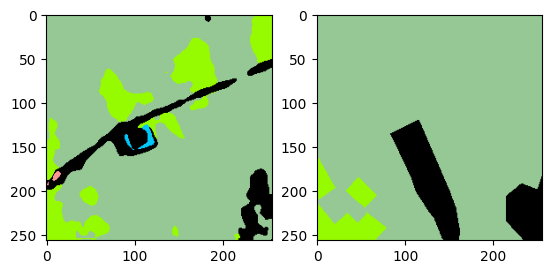

[2023-05-30 22:53:31 swanet_v5](182747771.py 311): INFO Test: [621/728]	Loss 0.7110 (0.3661)	PA@1 77.0142 (91.0798)	MPA@1 31.1808 (82.9364)	KAPPA@1 29.0199 (79.0471)	MIOU@1 24.0818 (72.8869)	FWIOU@1 64.0194 (86.5385)	Mem 44806MB


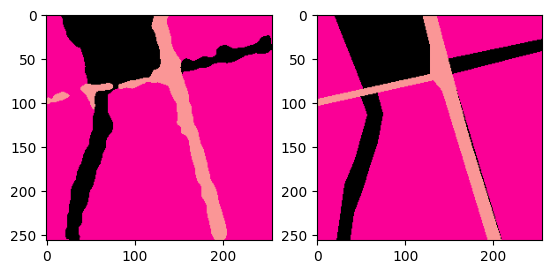

[2023-05-30 22:53:31 swanet_v5](182747771.py 311): INFO Test: [622/728]	Loss 0.1063 (0.3657)	PA@1 96.1334 (91.0879)	MPA@1 92.5594 (82.9519)	KAPPA@1 90.7733 (79.0659)	MIOU@1 86.8394 (72.9093)	FWIOU@1 92.7193 (86.5484)	Mem 44806MB


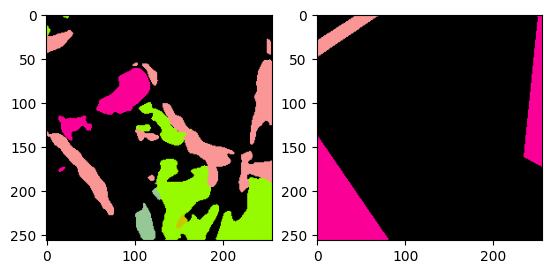

[2023-05-30 22:53:31 swanet_v5](182747771.py 311): INFO Test: [623/728]	Loss 1.4093 (0.3674)	PA@1 63.5178 (91.0437)	MPA@1 15.6106 (82.8439)	KAPPA@1 -2.1534 (78.9358)	MIOU@1 11.7623 (72.8113)	FWIOU@1 47.6459 (86.4861)	Mem 44806MB


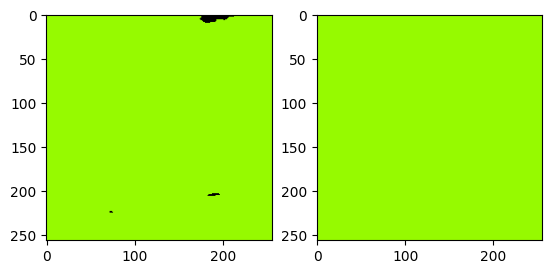

[2023-05-30 22:53:31 swanet_v5](182747771.py 311): INFO Test: [624/728]	Loss 0.0146 (0.3668)	PA@1 99.5331 (91.0573)	MPA@1 50.0000 (82.7914)	KAPPA@1 0.0000 (78.8095)	MIOU@1 49.7665 (72.7744)	FWIOU@1 99.0683 (86.5062)	Mem 44806MB


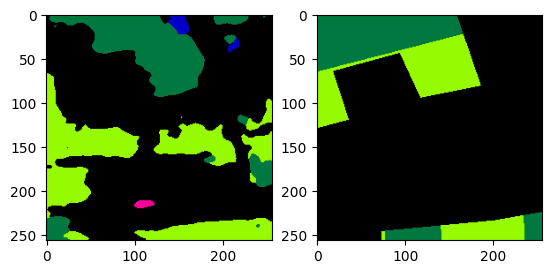

[2023-05-30 22:53:32 swanet_v5](182747771.py 311): INFO Test: [625/728]	Loss 1.3024 (0.3683)	PA@1 66.1072 (91.0174)	MPA@1 29.6374 (82.7065)	KAPPA@1 29.2776 (78.7303)	MIOU@1 21.9263 (72.6932)	FWIOU@1 50.6570 (86.4489)	Mem 44806MB


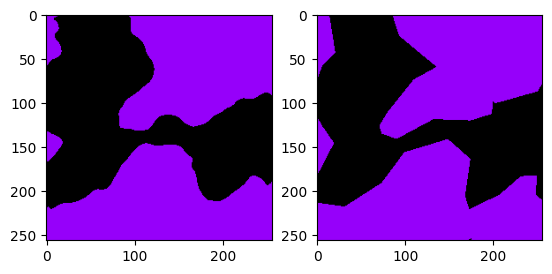

[2023-05-30 22:53:32 swanet_v5](182747771.py 311): INFO Test: [626/728]	Loss 0.1211 (0.3679)	PA@1 94.9661 (91.0237)	MPA@1 94.7661 (82.7257)	KAPPA@1 89.7819 (78.7480)	MIOU@1 90.2838 (72.7212)	FWIOU@1 90.4072 (86.4552)	Mem 44806MB


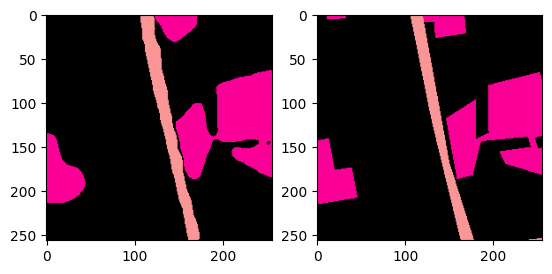

[2023-05-30 22:53:32 swanet_v5](182747771.py 311): INFO Test: [627/728]	Loss 0.0767 (0.3674)	PA@1 96.7392 (91.0328)	MPA@1 91.9181 (82.7404)	KAPPA@1 90.9745 (78.7674)	MIOU@1 88.6387 (72.7466)	FWIOU@1 93.7128 (86.4668)	Mem 44806MB


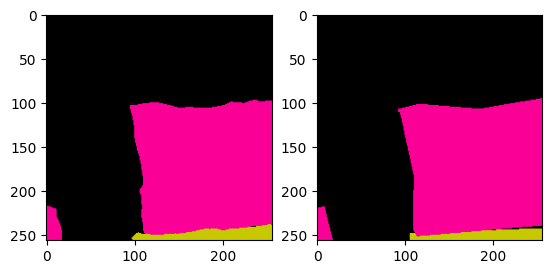

[2023-05-30 22:53:32 swanet_v5](182747771.py 311): INFO Test: [628/728]	Loss 0.0307 (0.3669)	PA@1 98.8861 (91.0453)	MPA@1 94.1380 (82.7585)	KAPPA@1 97.6697 (78.7975)	MIOU@1 93.3091 (72.7793)	FWIOU@1 97.7941 (86.4848)	Mem 44806MB


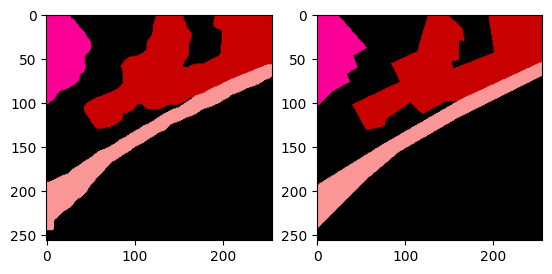

[2023-05-30 22:53:33 swanet_v5](182747771.py 311): INFO Test: [629/728]	Loss 0.0570 (0.3664)	PA@1 97.7219 (91.0559)	MPA@1 96.5445 (82.7804)	KAPPA@1 95.6394 (78.8242)	MIOU@1 94.1975 (72.8133)	FWIOU@1 95.5533 (86.4992)	Mem 44806MB


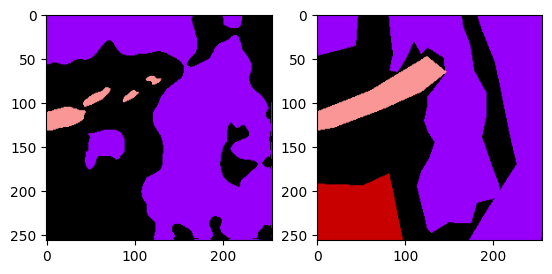

[2023-05-30 22:53:33 swanet_v5](182747771.py 311): INFO Test: [630/728]	Loss 1.4584 (0.3681)	PA@1 67.0135 (91.0178)	MPA@1 76.7127 (82.7707)	KAPPA@1 43.3441 (78.7680)	MIOU@1 35.8897 (72.7547)	FWIOU@1 54.9329 (86.4492)	Mem 44806MB


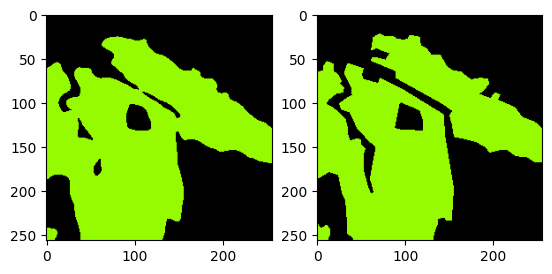

[2023-05-30 22:53:33 swanet_v5](182747771.py 311): INFO Test: [631/728]	Loss 0.0989 (0.3677)	PA@1 95.9641 (91.0256)	MPA@1 95.9937 (82.7917)	KAPPA@1 91.9305 (78.7888)	MIOU@1 92.2412 (72.7856)	FWIOU@1 92.2413 (86.4583)	Mem 44806MB


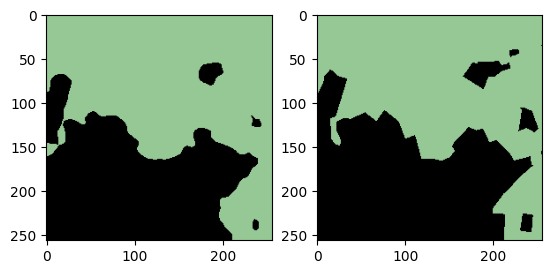

[2023-05-30 22:53:33 swanet_v5](182747771.py 311): INFO Test: [632/728]	Loss 0.0981 (0.3673)	PA@1 95.5490 (91.0328)	MPA@1 96.0197 (82.8126)	KAPPA@1 90.9315 (78.8080)	MIOU@1 91.3221 (72.8149)	FWIOU@1 91.5237 (86.4663)	Mem 44806MB


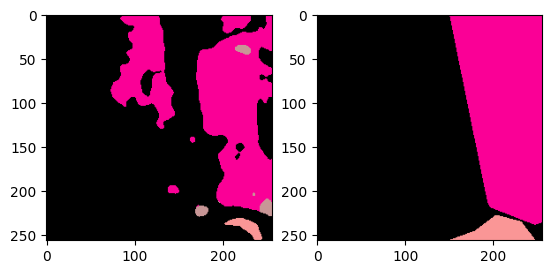

[2023-05-30 22:53:33 swanet_v5](182747771.py 311): INFO Test: [633/728]	Loss 0.6203 (0.3677)	PA@1 80.7159 (91.0165)	MPA@1 60.6526 (82.7776)	KAPPA@1 55.3244 (78.7709)	MIOU@1 38.5971 (72.7609)	FWIOU@1 69.0804 (86.4389)	Mem 44806MB


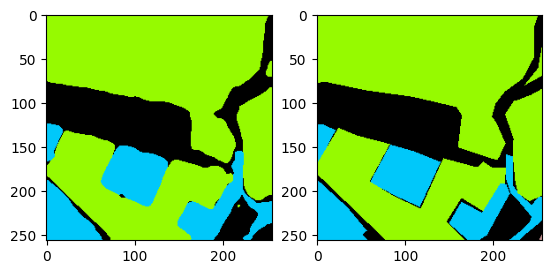

[2023-05-30 22:53:34 swanet_v5](182747771.py 311): INFO Test: [634/728]	Loss 0.1008 (0.3673)	PA@1 95.9579 (91.0243)	MPA@1 93.8410 (82.7950)	KAPPA@1 92.4205 (78.7924)	MIOU@1 67.2795 (72.7523)	FWIOU@1 92.3786 (86.4483)	Mem 44806MB


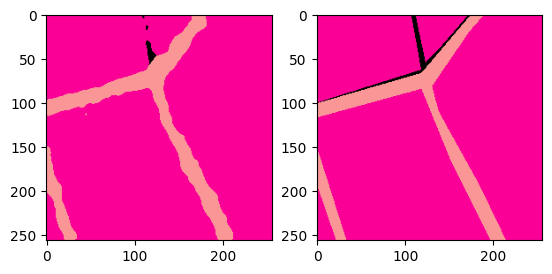

[2023-05-30 22:53:34 swanet_v5](182747771.py 311): INFO Test: [635/728]	Loss 0.0834 (0.3668)	PA@1 96.8872 (91.0335)	MPA@1 89.1061 (82.8050)	KAPPA@1 85.8414 (78.8035)	MIOU@1 64.2150 (72.7388)	FWIOU@1 94.8248 (86.4614)	Mem 44806MB


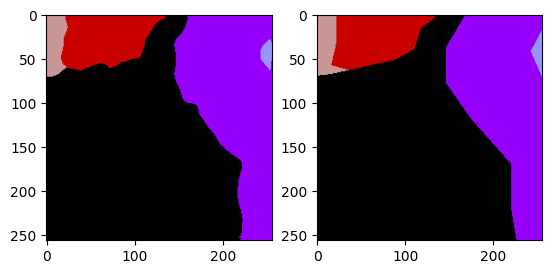

[2023-05-30 22:53:34 swanet_v5](182747771.py 311): INFO Test: [636/728]	Loss 0.0453 (0.3663)	PA@1 98.3612 (91.0450)	MPA@1 96.2581 (82.8261)	KAPPA@1 96.9478 (78.8320)	MIOU@1 89.5279 (72.7652)	FWIOU@1 96.8251 (86.4777)	Mem 44806MB


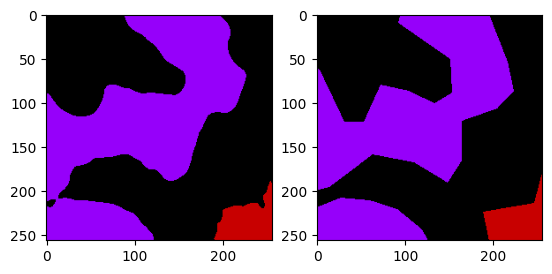

[2023-05-30 22:53:34 swanet_v5](182747771.py 311): INFO Test: [637/728]	Loss 0.1398 (0.3660)	PA@1 94.5984 (91.0506)	MPA@1 94.9186 (82.8450)	KAPPA@1 89.7318 (78.8491)	MIOU@1 89.2385 (72.7910)	FWIOU@1 89.7408 (86.4828)	Mem 44806MB


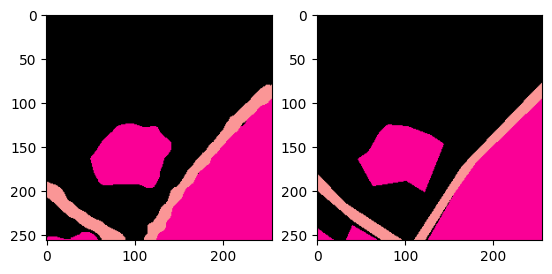

[2023-05-30 22:53:35 swanet_v5](182747771.py 311): INFO Test: [638/728]	Loss 0.0749 (0.3655)	PA@1 96.8628 (91.0597)	MPA@1 90.8970 (82.8576)	KAPPA@1 93.3347 (78.8718)	MIOU@1 87.3316 (72.8138)	FWIOU@1 93.9806 (86.4945)	Mem 44806MB


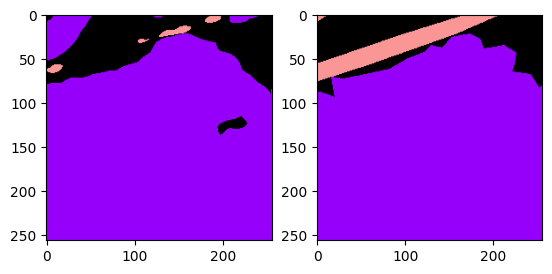

[2023-05-30 22:53:35 swanet_v5](182747771.py 311): INFO Test: [639/728]	Loss 0.4355 (0.3656)	PA@1 89.4745 (91.0572)	MPA@1 85.2796 (82.8614)	KAPPA@1 67.9027 (78.8546)	MIOU@1 52.6062 (72.7822)	FWIOU@1 85.4072 (86.4929)	Mem 44806MB


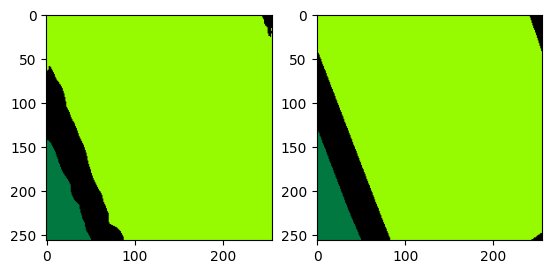

[2023-05-30 22:53:35 swanet_v5](182747771.py 311): INFO Test: [640/728]	Loss 0.0309 (0.3651)	PA@1 98.7869 (91.0693)	MPA@1 97.5177 (82.8843)	KAPPA@1 95.1627 (78.8801)	MIOU@1 93.6800 (72.8148)	FWIOU@1 97.7004 (86.5103)	Mem 44806MB


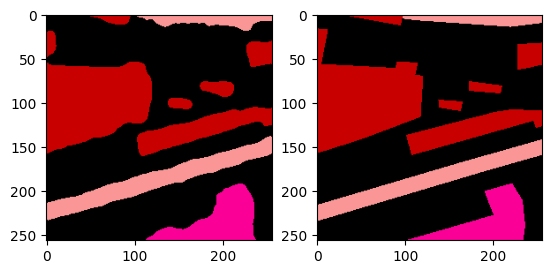

[2023-05-30 22:53:35 swanet_v5](182747771.py 311): INFO Test: [641/728]	Loss 0.1007 (0.3647)	PA@1 95.9442 (91.0769)	MPA@1 93.4945 (82.9008)	KAPPA@1 92.7234 (78.9016)	MIOU@1 90.1579 (72.8418)	FWIOU@1 92.1961 (86.5192)	Mem 44806MB


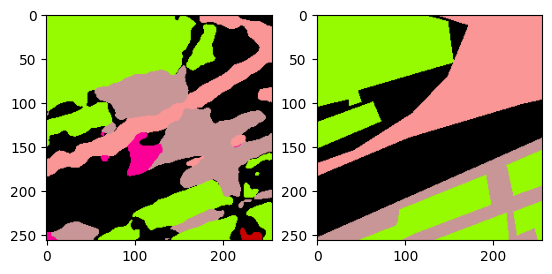

[2023-05-30 22:53:36 swanet_v5](182747771.py 311): INFO Test: [642/728]	Loss 1.5432 (0.3665)	PA@1 60.6598 (91.0295)	MPA@1 41.9231 (82.8371)	KAPPA@1 46.3233 (78.8510)	MIOU@1 28.7532 (72.7732)	FWIOU@1 45.5606 (86.4555)	Mem 44806MB


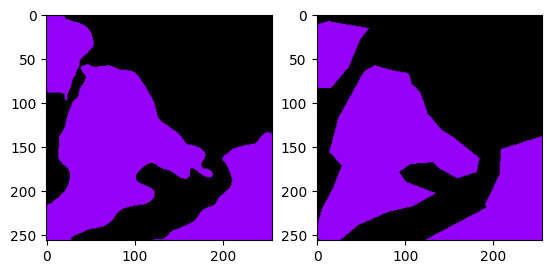

[2023-05-30 22:53:36 swanet_v5](182747771.py 311): INFO Test: [643/728]	Loss 0.1133 (0.3661)	PA@1 95.3110 (91.0362)	MPA@1 95.1307 (82.8562)	KAPPA@1 90.5424 (78.8691)	MIOU@1 90.9690 (72.8015)	FWIOU@1 91.0282 (86.4626)	Mem 44806MB


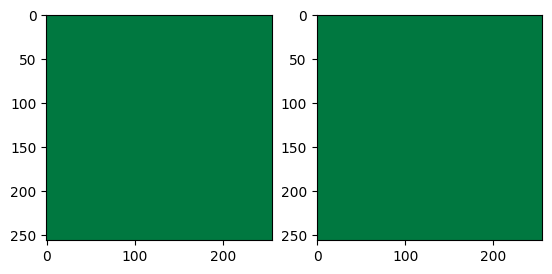

[2023-05-30 22:53:36 swanet_v5](182747771.py 311): INFO Test: [644/728]	Loss 0.0021 (0.3656)	PA@1 100.0000 (91.0501)	MPA@1 100.0000 (82.8827)	KAPPA@1 100.0000 (78.9019)	MIOU@1 100.0000 (72.8437)	FWIOU@1 100.0000 (86.4836)	Mem 44806MB


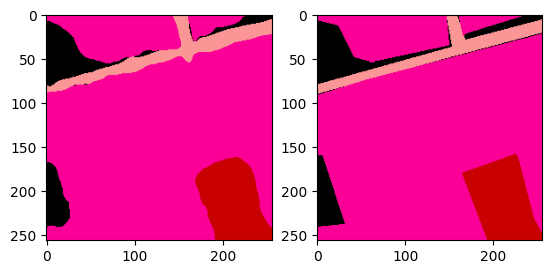

[2023-05-30 22:53:36 swanet_v5](182747771.py 311): INFO Test: [645/728]	Loss 0.0735 (0.3651)	PA@1 97.2382 (91.0597)	MPA@1 94.4670 (82.9007)	KAPPA@1 92.7336 (78.9233)	MIOU@1 88.7868 (72.8683)	FWIOU@1 94.8263 (86.4965)	Mem 44806MB


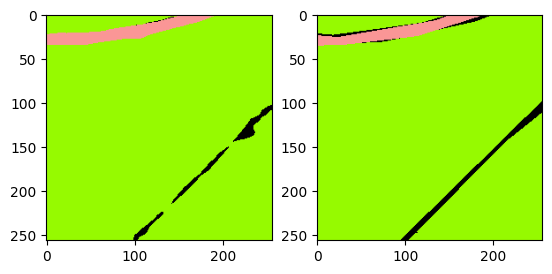

[2023-05-30 22:53:36 swanet_v5](182747771.py 311): INFO Test: [646/728]	Loss 0.0459 (0.3646)	PA@1 98.1354 (91.0706)	MPA@1 88.0992 (82.9087)	KAPPA@1 82.2604 (78.9284)	MIOU@1 75.0431 (72.8717)	FWIOU@1 97.0840 (86.5129)	Mem 44806MB


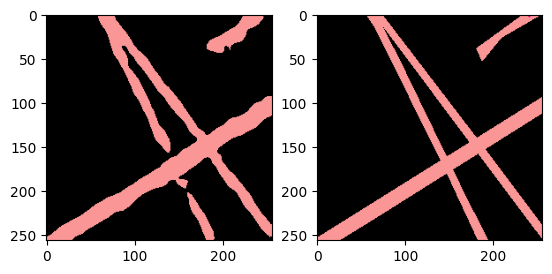

[2023-05-30 22:53:37 swanet_v5](182747771.py 311): INFO Test: [647/728]	Loss 0.1044 (0.3642)	PA@1 95.6284 (91.0776)	MPA@1 90.1173 (82.9198)	KAPPA@1 84.9615 (78.9378)	MIOU@1 57.5932 (72.8481)	FWIOU@1 91.6398 (86.5208)	Mem 44806MB


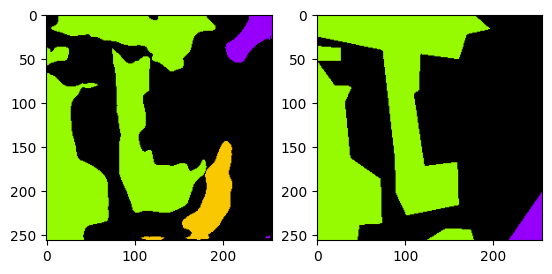

[2023-05-30 22:53:37 swanet_v5](182747771.py 311): INFO Test: [648/728]	Loss 0.3874 (0.3642)	PA@1 84.1171 (91.0669)	MPA@1 45.8338 (82.8627)	KAPPA@1 69.4282 (78.9231)	MIOU@1 39.7535 (72.7971)	FWIOU@1 72.9408 (86.4998)	Mem 44806MB


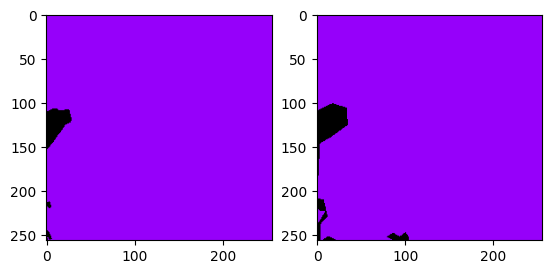

[2023-05-30 22:53:37 swanet_v5](182747771.py 311): INFO Test: [649/728]	Loss 0.0291 (0.3637)	PA@1 98.7091 (91.0787)	MPA@1 97.6702 (82.8855)	KAPPA@1 66.2549 (78.9036)	MIOU@1 74.4490 (72.7997)	FWIOU@1 98.0388 (86.5176)	Mem 44806MB


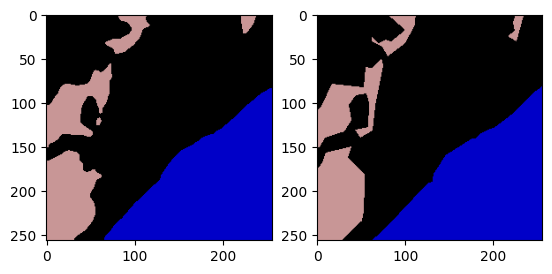

[2023-05-30 22:53:37 swanet_v5](182747771.py 311): INFO Test: [650/728]	Loss 0.0732 (0.3633)	PA@1 96.8796 (91.0876)	MPA@1 94.9419 (82.9040)	KAPPA@1 94.4668 (78.9275)	MIOU@1 91.9642 (72.8291)	FWIOU@1 94.0228 (86.5291)	Mem 44806MB


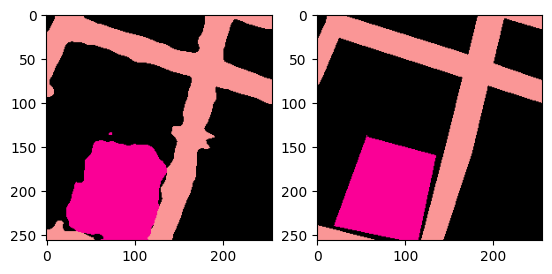

[2023-05-30 22:53:37 swanet_v5](182747771.py 311): INFO Test: [651/728]	Loss 0.0884 (0.3629)	PA@1 96.2585 (91.0955)	MPA@1 94.8521 (82.9223)	KAPPA@1 93.1412 (78.9493)	MIOU@1 91.8675 (72.8583)	FWIOU@1 92.7732 (86.5387)	Mem 44806MB


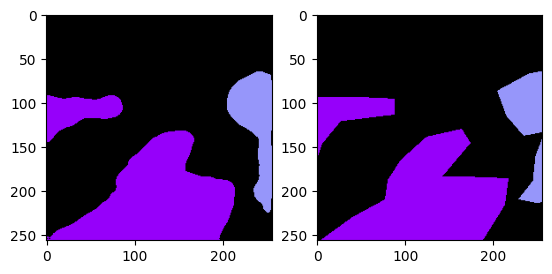

[2023-05-30 22:53:38 swanet_v5](182747771.py 311): INFO Test: [652/728]	Loss 0.0808 (0.3624)	PA@1 96.5546 (91.1039)	MPA@1 91.3964 (82.9353)	KAPPA@1 92.5387 (78.9701)	MIOU@1 88.5278 (72.8823)	FWIOU@1 93.3317 (86.5491)	Mem 44806MB


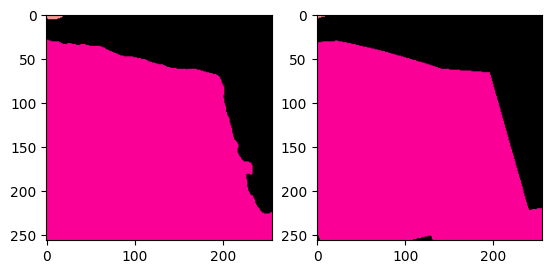

[2023-05-30 22:53:38 swanet_v5](182747771.py 311): INFO Test: [653/728]	Loss 0.0327 (0.3619)	PA@1 98.6603 (91.1154)	MPA@1 79.3110 (82.9298)	KAPPA@1 96.8049 (78.9974)	MIOU@1 78.2025 (72.8904)	FWIOU@1 97.3604 (86.5656)	Mem 44806MB


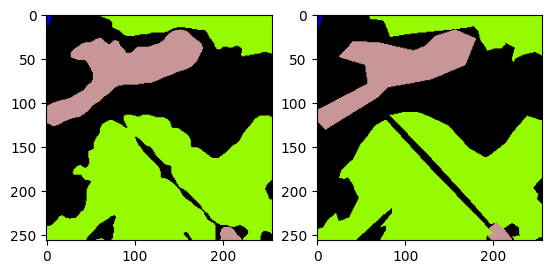

[2023-05-30 22:53:38 swanet_v5](182747771.py 311): INFO Test: [654/728]	Loss 0.1181 (0.3616)	PA@1 94.8776 (91.1212)	MPA@1 93.7817 (82.9463)	KAPPA@1 91.4210 (79.0164)	MIOU@1 87.3373 (72.9125)	FWIOU@1 90.2616 (86.5713)	Mem 44806MB


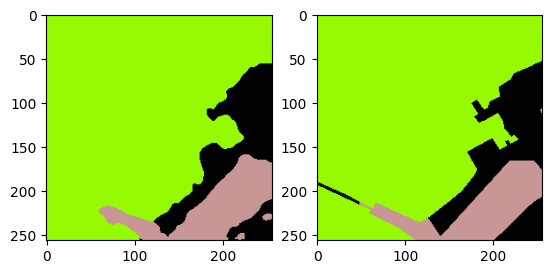

[2023-05-30 22:53:38 swanet_v5](182747771.py 311): INFO Test: [655/728]	Loss 0.0739 (0.3611)	PA@1 97.3450 (91.1307)	MPA@1 95.3653 (82.9653)	KAPPA@1 93.4347 (79.0384)	MIOU@1 90.2397 (72.9389)	FWIOU@1 95.0272 (86.5842)	Mem 44806MB


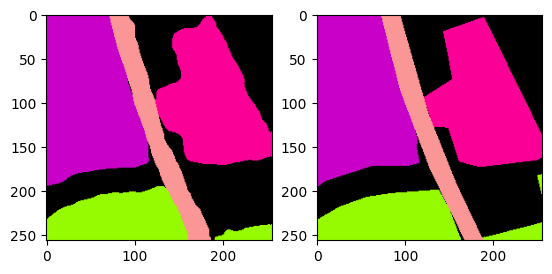

[2023-05-30 22:53:39 swanet_v5](182747771.py 311): INFO Test: [656/728]	Loss 0.0792 (0.3607)	PA@1 96.9589 (91.1395)	MPA@1 96.4574 (82.9858)	KAPPA@1 96.0300 (79.0642)	MIOU@1 93.8405 (72.9707)	FWIOU@1 94.1441 (86.5957)	Mem 44806MB


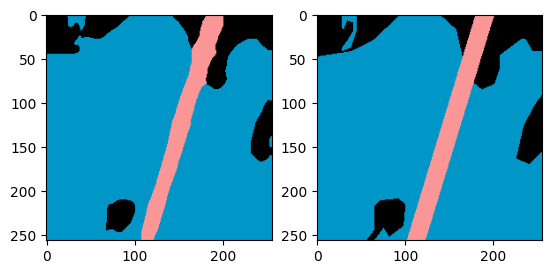

[2023-05-30 22:53:39 swanet_v5](182747771.py 311): INFO Test: [657/728]	Loss 0.0871 (0.3603)	PA@1 96.5271 (91.1477)	MPA@1 96.0656 (83.0057)	KAPPA@1 90.4006 (79.0815)	MIOU@1 88.1893 (72.9938)	FWIOU@1 93.5741 (86.6063)	Mem 44806MB


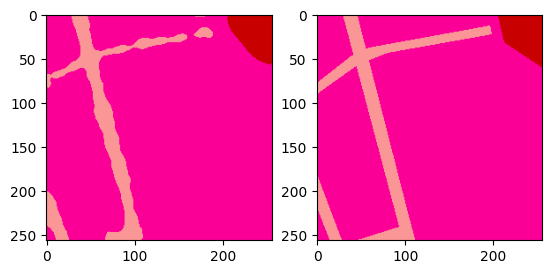

[2023-05-30 22:53:39 swanet_v5](182747771.py 311): INFO Test: [658/728]	Loss 0.0753 (0.3598)	PA@1 96.8658 (91.1564)	MPA@1 95.4645 (83.0246)	KAPPA@1 87.1033 (79.0936)	MIOU@1 88.3309 (73.0171)	FWIOU@1 94.2385 (86.6179)	Mem 44806MB


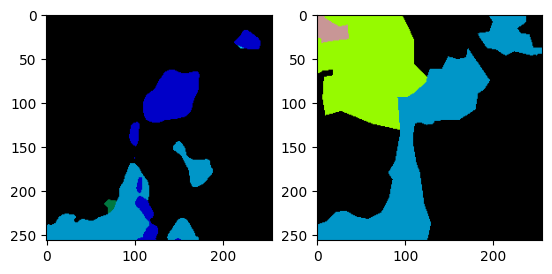

[2023-05-30 22:53:39 swanet_v5](182747771.py 311): INFO Test: [659/728]	Loss 2.5386 (0.3631)	PA@1 64.2578 (91.1156)	MPA@1 28.4790 (82.9419)	KAPPA@1 24.2909 (79.0106)	MIOU@1 13.4809 (72.9269)	FWIOU@1 58.5495 (86.5753)	Mem 44806MB


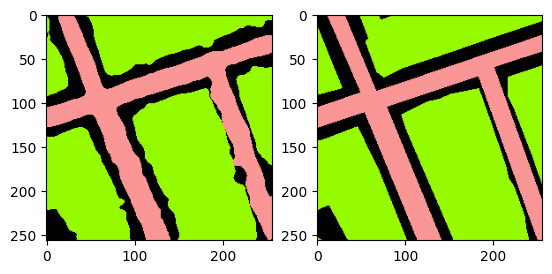

[2023-05-30 22:53:39 swanet_v5](182747771.py 311): INFO Test: [660/728]	Loss 0.1289 (0.3628)	PA@1 94.7556 (91.1211)	MPA@1 93.4065 (82.9578)	KAPPA@1 91.2256 (79.0291)	MIOU@1 87.8756 (72.9495)	FWIOU@1 90.3373 (86.5810)	Mem 44806MB


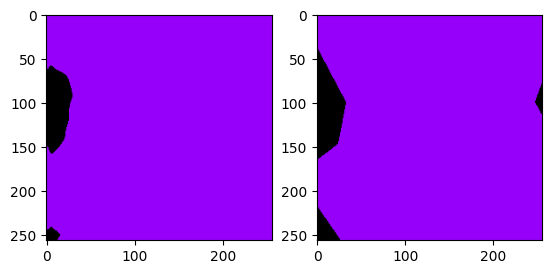

[2023-05-30 22:53:40 swanet_v5](182747771.py 311): INFO Test: [661/728]	Loss 0.0435 (0.3623)	PA@1 98.2529 (91.1319)	MPA@1 96.6482 (82.9784)	KAPPA@1 79.0263 (79.0291)	MIOU@1 82.3699 (72.9638)	FWIOU@1 97.0313 (86.5968)	Mem 44806MB


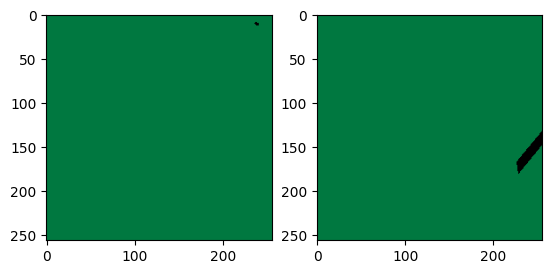

[2023-05-30 22:53:40 swanet_v5](182747771.py 311): INFO Test: [662/728]	Loss 0.0429 (0.3618)	PA@1 99.2584 (91.1442)	MPA@1 49.6398 (82.9282)	KAPPA@1 -0.0418 (78.9098)	MIOU@1 49.6292 (72.9286)	FWIOU@1 99.2372 (86.6159)	Mem 44806MB


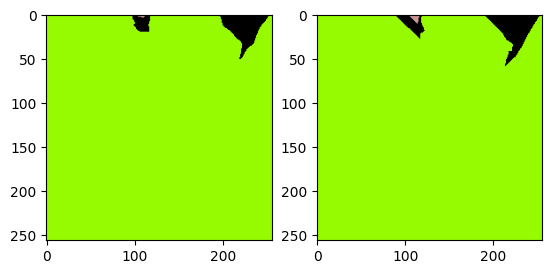

[2023-05-30 22:53:40 swanet_v5](182747771.py 311): INFO Test: [663/728]	Loss 0.0156 (0.3613)	PA@1 99.3652 (91.1566)	MPA@1 94.8150 (82.9461)	KAPPA@1 88.1842 (78.9238)	MIOU@1 70.3864 (72.9247)	FWIOU@1 98.8920 (86.6344)	Mem 44806MB


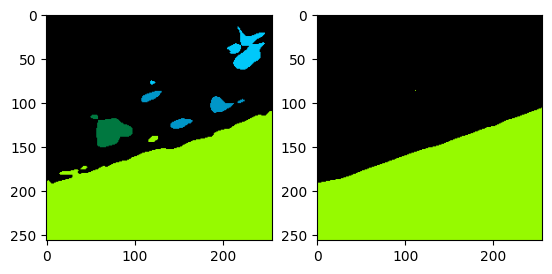

[2023-05-30 22:53:40 swanet_v5](182747771.py 311): INFO Test: [664/728]	Loss 0.1588 (0.3610)	PA@1 94.4229 (91.1615)	MPA@1 39.4183 (82.8806)	KAPPA@1 88.9941 (78.9389)	MIOU@1 37.4218 (72.8713)	FWIOU@1 89.2974 (86.6384)	Mem 44806MB


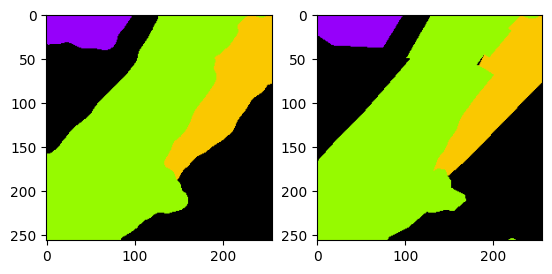

[2023-05-30 22:53:40 swanet_v5](182747771.py 311): INFO Test: [665/728]	Loss 0.0622 (0.3605)	PA@1 97.6440 (91.1712)	MPA@1 96.2484 (82.9007)	KAPPA@1 96.3079 (78.9650)	MIOU@1 94.1277 (72.9033)	FWIOU@1 95.4010 (86.6515)	Mem 44806MB


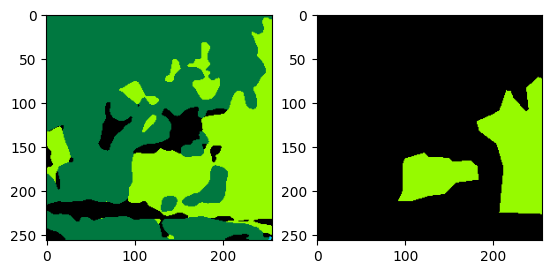

[2023-05-30 22:53:41 swanet_v5](182747771.py 311): INFO Test: [666/728]	Loss 3.9043 (0.3659)	PA@1 25.2426 (91.0724)	MPA@1 39.2059 (82.8352)	KAPPA@1 14.7046 (78.8686)	MIOU@1 16.9975 (72.8194)	FWIOU@1 16.8252 (86.5468)	Mem 44806MB


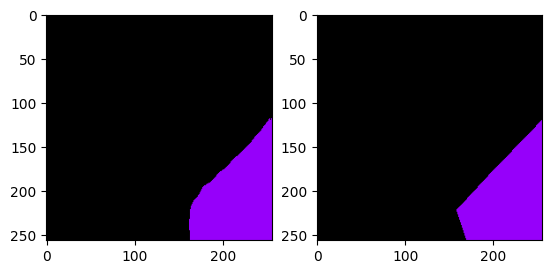

[2023-05-30 22:53:41 swanet_v5](182747771.py 311): INFO Test: [667/728]	Loss 0.0118 (0.3653)	PA@1 99.6292 (91.0852)	MPA@1 99.0467 (82.8594)	KAPPA@1 98.3210 (78.8978)	MIOU@1 98.3427 (72.8577)	FWIOU@1 99.2637 (86.5659)	Mem 44806MB


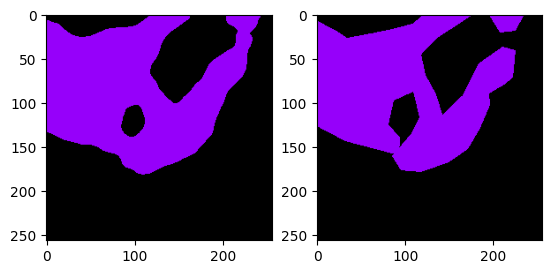

[2023-05-30 22:53:41 swanet_v5](182747771.py 311): INFO Test: [668/728]	Loss 0.1005 (0.3649)	PA@1 95.3751 (91.0916)	MPA@1 94.4342 (82.8767)	KAPPA@1 90.1243 (78.9145)	MIOU@1 90.6078 (72.8842)	FWIOU@1 91.1173 (86.5727)	Mem 44806MB


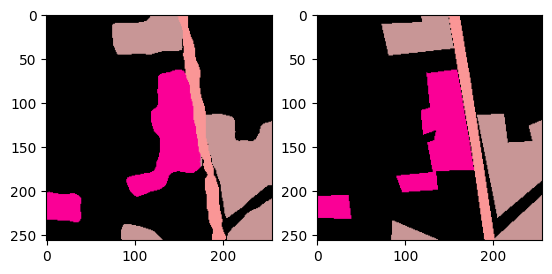

[2023-05-30 22:53:41 swanet_v5](182747771.py 311): INFO Test: [669/728]	Loss 0.0883 (0.3645)	PA@1 96.4035 (91.0995)	MPA@1 92.4903 (82.8911)	KAPPA@1 92.6516 (78.9350)	MIOU@1 88.7894 (72.9079)	FWIOU@1 93.0738 (86.5824)	Mem 44806MB


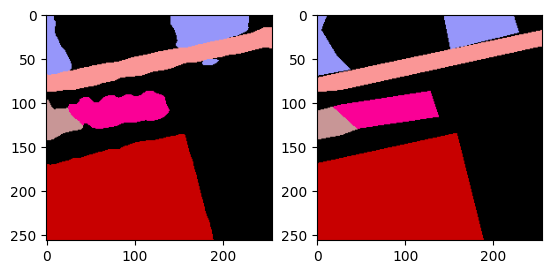

[2023-05-30 22:53:41 swanet_v5](182747771.py 311): INFO Test: [670/728]	Loss 0.0746 (0.3641)	PA@1 97.0169 (91.1083)	MPA@1 93.1912 (82.9064)	KAPPA@1 95.3413 (78.9595)	MIOU@1 89.6768 (72.9329)	FWIOU@1 94.2421 (86.5938)	Mem 44806MB


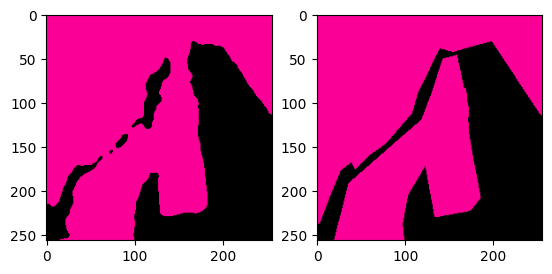

[2023-05-30 22:53:42 swanet_v5](182747771.py 311): INFO Test: [671/728]	Loss 0.0744 (0.3637)	PA@1 96.9177 (91.1170)	MPA@1 96.8265 (82.9271)	KAPPA@1 93.1588 (78.9806)	MIOU@1 93.4057 (72.9634)	FWIOU@1 94.0536 (86.6049)	Mem 44806MB


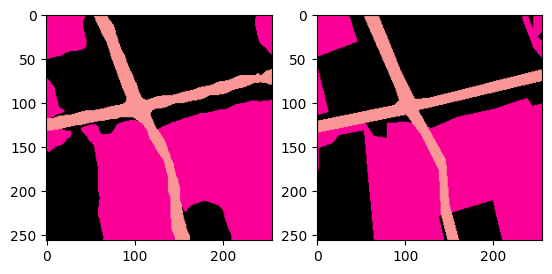

[2023-05-30 22:53:42 swanet_v5](182747771.py 311): INFO Test: [672/728]	Loss 0.1022 (0.3633)	PA@1 95.6726 (91.1237)	MPA@1 93.9906 (82.9436)	KAPPA@1 92.6416 (79.0009)	MIOU@1 89.9385 (72.9886)	FWIOU@1 91.7190 (86.6125)	Mem 44806MB


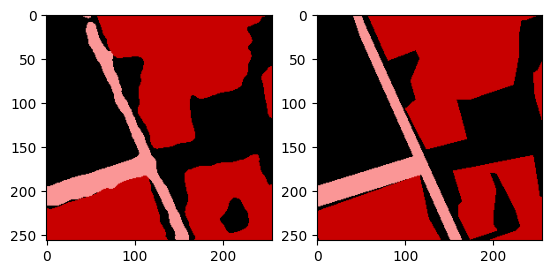

[2023-05-30 22:53:42 swanet_v5](182747771.py 311): INFO Test: [673/728]	Loss 0.1154 (0.3629)	PA@1 95.3644 (91.1300)	MPA@1 94.2475 (82.9604)	KAPPA@1 91.9886 (79.0202)	MIOU@1 89.5467 (73.0132)	FWIOU@1 91.1897 (86.6193)	Mem 44806MB


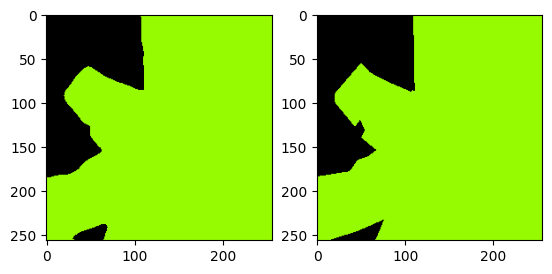

[2023-05-30 22:53:42 swanet_v5](182747771.py 311): INFO Test: [674/728]	Loss 0.0229 (0.3624)	PA@1 99.0997 (91.1418)	MPA@1 98.7735 (82.9838)	KAPPA@1 97.1435 (79.0470)	MIOU@1 97.1982 (73.0490)	FWIOU@1 98.2283 (86.6365)	Mem 44806MB


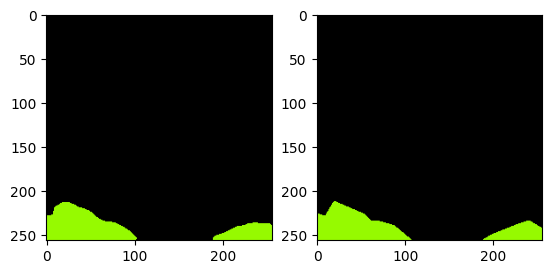

[2023-05-30 22:53:42 swanet_v5](182747771.py 311): INFO Test: [675/728]	Loss 0.0088 (0.3619)	PA@1 99.6567 (91.1544)	MPA@1 97.9367 (83.0059)	KAPPA@1 96.8553 (79.0734)	MIOU@1 96.9409 (73.0843)	FWIOU@1 99.3204 (86.6553)	Mem 44806MB


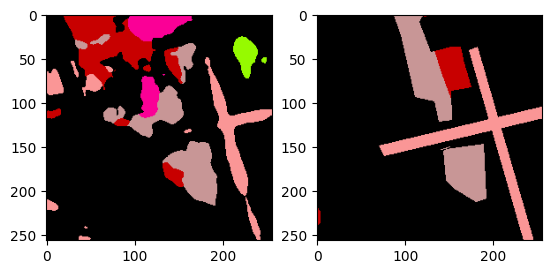

[2023-05-30 22:53:43 swanet_v5](182747771.py 311): INFO Test: [676/728]	Loss 0.8643 (0.3626)	PA@1 75.4547 (91.1312)	MPA@1 36.1095 (82.9366)	KAPPA@1 37.3027 (79.0117)	MIOU@1 25.8186 (73.0145)	FWIOU@1 61.3830 (86.6179)	Mem 44806MB


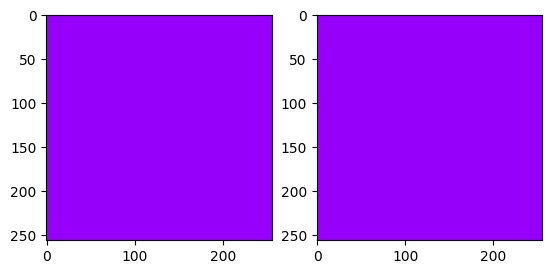

[2023-05-30 22:53:43 swanet_v5](182747771.py 311): INFO Test: [677/728]	Loss 0.0005 (0.3621)	PA@1 100.0000 (91.1443)	MPA@1 100.0000 (82.9618)	KAPPA@1 100.0000 (79.0426)	MIOU@1 100.0000 (73.0543)	FWIOU@1 100.0000 (86.6377)	Mem 44806MB


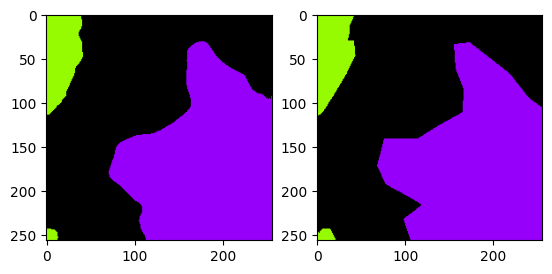

[2023-05-30 22:53:43 swanet_v5](182747771.py 311): INFO Test: [678/728]	Loss 0.0575 (0.3616)	PA@1 97.4930 (91.1537)	MPA@1 97.1514 (82.9827)	KAPPA@1 95.4132 (79.0668)	MIOU@1 94.3281 (73.0857)	FWIOU@1 95.1112 (86.6501)	Mem 44806MB


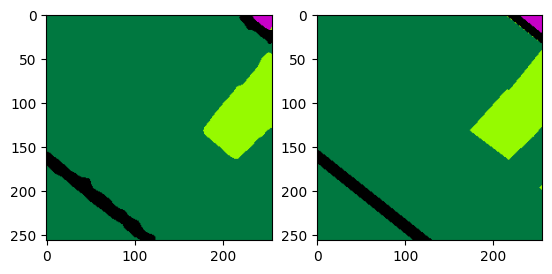

[2023-05-30 22:53:43 swanet_v5](182747771.py 311): INFO Test: [679/728]	Loss 0.0356 (0.3612)	PA@1 98.7381 (91.1648)	MPA@1 95.5289 (83.0011)	KAPPA@1 94.2282 (79.0891)	MIOU@1 88.6293 (73.1085)	FWIOU@1 97.5713 (86.6662)	Mem 44806MB


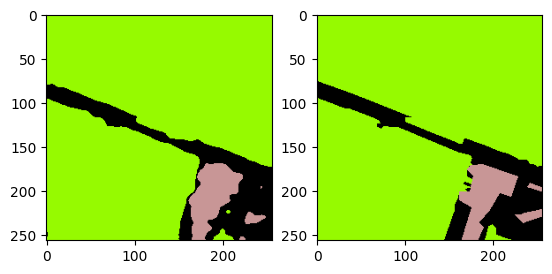

[2023-05-30 22:53:43 swanet_v5](182747771.py 311): INFO Test: [680/728]	Loss 0.0654 (0.3607)	PA@1 97.4625 (91.1741)	MPA@1 91.3122 (83.0134)	KAPPA@1 91.7060 (79.1076)	MIOU@1 84.7081 (73.1256)	FWIOU@1 95.3563 (86.6790)	Mem 44806MB


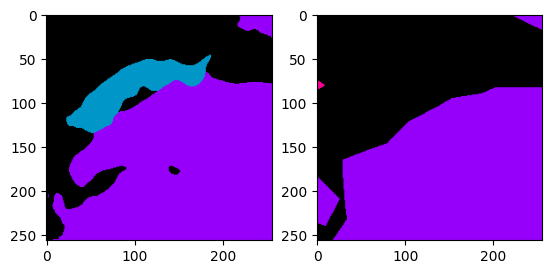

[2023-05-30 22:53:44 swanet_v5](182747771.py 311): INFO Test: [681/728]	Loss 0.5692 (0.3610)	PA@1 82.6630 (91.1616)	MPA@1 60.1565 (82.9798)	KAPPA@1 67.7033 (79.0909)	MIOU@1 37.5185 (73.0733)	FWIOU@1 70.7806 (86.6557)	Mem 44806MB


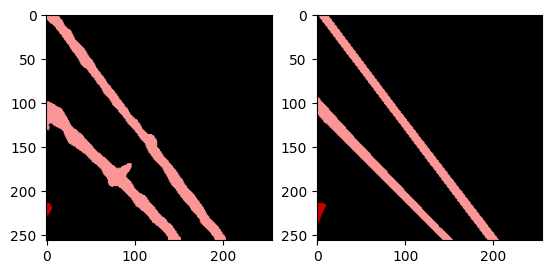

[2023-05-30 22:53:44 swanet_v5](182747771.py 311): INFO Test: [682/728]	Loss 0.0596 (0.3606)	PA@1 97.4319 (91.1708)	MPA@1 92.4386 (82.9937)	KAPPA@1 84.9768 (79.0995)	MIOU@1 74.4677 (73.0754)	FWIOU@1 95.0190 (86.6679)	Mem 44806MB


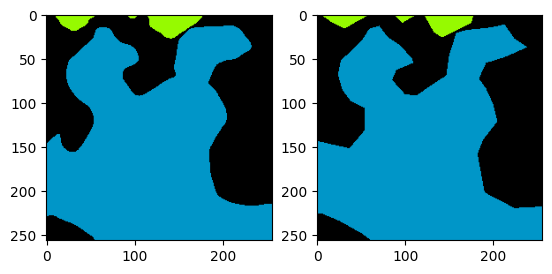

[2023-05-30 22:53:44 swanet_v5](182747771.py 311): INFO Test: [683/728]	Loss 0.0695 (0.3602)	PA@1 97.1466 (91.1795)	MPA@1 92.3311 (83.0073)	KAPPA@1 94.2664 (79.1217)	MIOU@1 87.8774 (73.0970)	FWIOU@1 94.5338 (86.6794)	Mem 44806MB


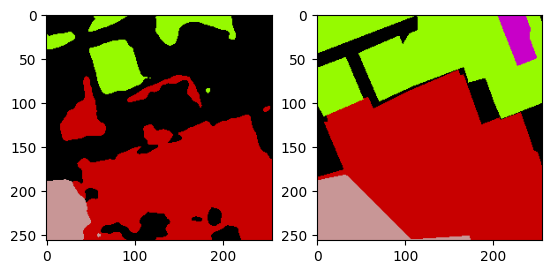

[2023-05-30 22:53:44 swanet_v5](182747771.py 311): INFO Test: [684/728]	Loss 1.9340 (0.3625)	PA@1 56.9687 (91.1296)	MPA@1 76.7777 (82.9982)	KAPPA@1 41.1509 (79.0662)	MIOU@1 33.2088 (73.0388)	FWIOU@1 39.3589 (86.6103)	Mem 44806MB


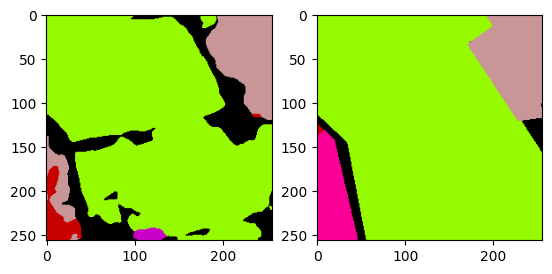

[2023-05-30 22:53:44 swanet_v5](182747771.py 311): INFO Test: [685/728]	Loss 0.8185 (0.3631)	PA@1 81.0684 (91.1149)	MPA@1 38.5407 (82.9334)	KAPPA@1 54.7992 (79.0308)	MIOU@1 28.1061 (72.9733)	FWIOU@1 71.0002 (86.5876)	Mem 44806MB


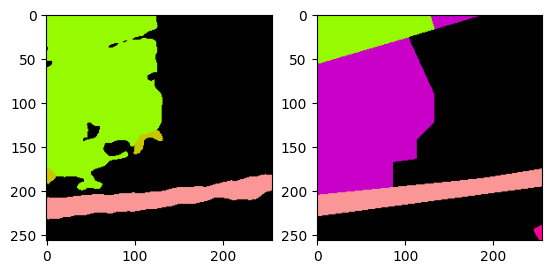

[2023-05-30 22:53:45 swanet_v5](182747771.py 311): INFO Test: [686/728]	Loss 2.7885 (0.3666)	PA@1 64.6484 (91.0764)	MPA@1 44.5480 (82.8776)	KAPPA@1 44.6285 (78.9808)	MIOU@1 26.0918 (72.9051)	FWIOU@1 60.4081 (86.5495)	Mem 44806MB


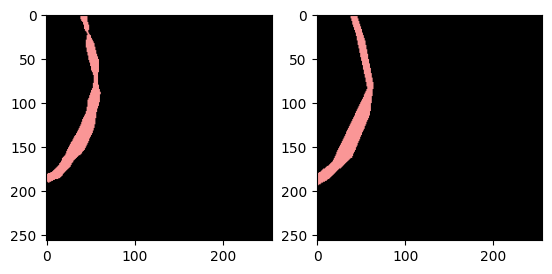

[2023-05-30 22:53:45 swanet_v5](182747771.py 311): INFO Test: [687/728]	Loss 0.0208 (0.3661)	PA@1 99.0997 (91.0880)	MPA@1 95.3980 (82.8958)	KAPPA@1 86.9381 (78.9923)	MIOU@1 88.3484 (72.9275)	FWIOU@1 98.3381 (86.5666)	Mem 44806MB


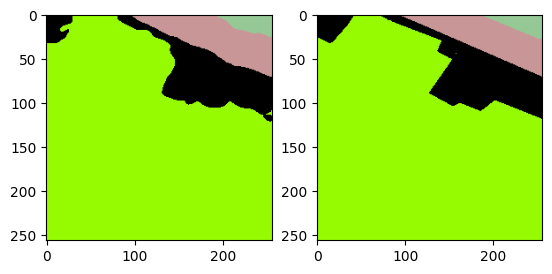

[2023-05-30 22:53:45 swanet_v5](182747771.py 311): INFO Test: [688/728]	Loss 0.0479 (0.3657)	PA@1 97.8226 (91.0978)	MPA@1 95.0681 (82.9134)	KAPPA@1 94.0523 (79.0142)	MIOU@1 90.1992 (72.9526)	FWIOU@1 95.8885 (86.5801)	Mem 44806MB


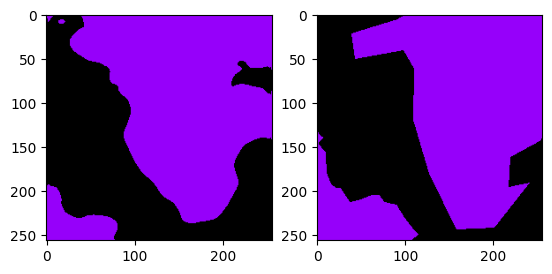

[2023-05-30 22:53:45 swanet_v5](182747771.py 311): INFO Test: [689/728]	Loss 0.5615 (0.3660)	PA@1 84.0668 (91.0876)	MPA@1 83.6430 (82.9145)	KAPPA@1 67.4221 (78.9974)	MIOU@1 72.0580 (72.9513)	FWIOU@1 72.5606 (86.5598)	Mem 44806MB


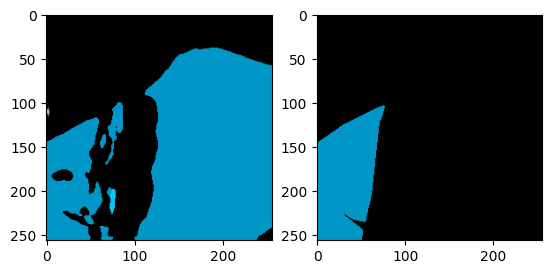

[2023-05-30 22:53:45 swanet_v5](182747771.py 311): INFO Test: [690/728]	Loss 4.0840 (0.3713)	PA@1 52.6840 (91.0321)	MPA@1 27.7778 (82.8347)	KAPPA@1 10.4389 (78.8982)	MIOU@1 16.1283 (72.8690)	FWIOU@1 31.0586 (86.4795)	Mem 44806MB


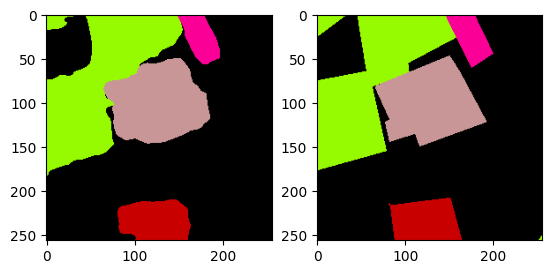

[2023-05-30 22:53:46 swanet_v5](182747771.py 311): INFO Test: [691/728]	Loss 0.0784 (0.3709)	PA@1 96.8735 (91.0405)	MPA@1 95.7768 (82.8534)	KAPPA@1 94.6462 (78.9209)	MIOU@1 91.8499 (72.8965)	FWIOU@1 93.9461 (86.4903)	Mem 44806MB


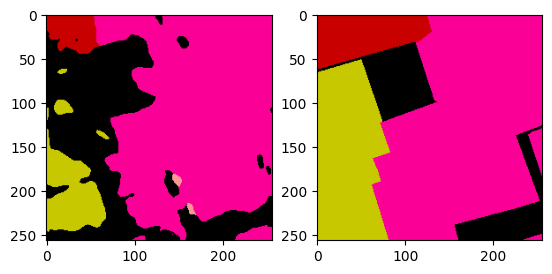

[2023-05-30 22:53:46 swanet_v5](182747771.py 311): INFO Test: [692/728]	Loss 0.8648 (0.3716)	PA@1 72.3923 (91.0136)	MPA@1 64.1975 (82.8265)	KAPPA@1 54.6041 (78.8858)	MIOU@1 36.8048 (72.8444)	FWIOU@1 60.2034 (86.4523)	Mem 44806MB


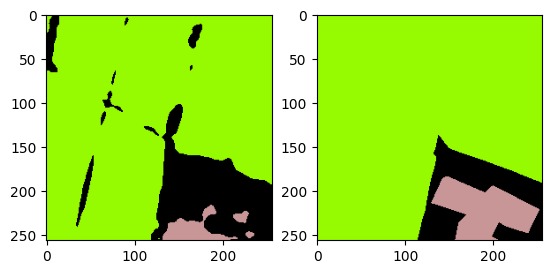

[2023-05-30 22:53:46 swanet_v5](182747771.py 311): INFO Test: [693/728]	Loss 0.3636 (0.3716)	PA@1 88.5986 (91.0101)	MPA@1 68.7378 (82.8062)	KAPPA@1 64.9991 (78.8658)	MIOU@1 51.3931 (72.8135)	FWIOU@1 83.4660 (86.4480)	Mem 44806MB


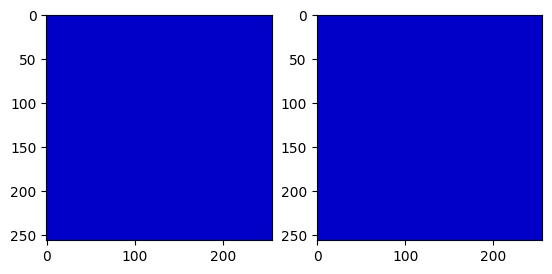

[2023-05-30 22:53:46 swanet_v5](182747771.py 311): INFO Test: [694/728]	Loss 0.0002 (0.3711)	PA@1 100.0000 (91.0230)	MPA@1 100.0000 (82.8309)	KAPPA@1 100.0000 (78.8962)	MIOU@1 100.0000 (72.8526)	FWIOU@1 100.0000 (86.4675)	Mem 44806MB


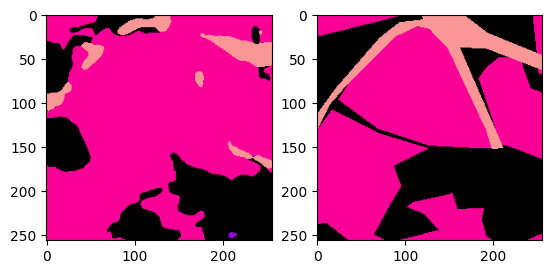

[2023-05-30 22:53:47 swanet_v5](182747771.py 311): INFO Test: [695/728]	Loss 1.2443 (0.3723)	PA@1 69.3634 (90.9919)	MPA@1 51.4037 (82.7858)	KAPPA@1 41.4598 (78.8425)	MIOU@1 33.9237 (72.7967)	FWIOU@1 55.9029 (86.4236)	Mem 44806MB


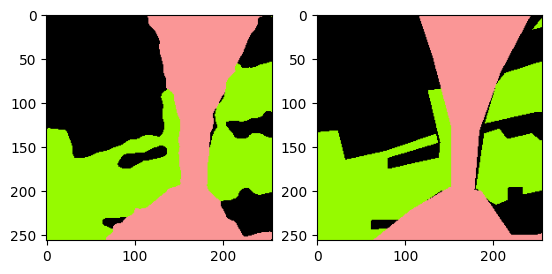

[2023-05-30 22:53:47 swanet_v5](182747771.py 311): INFO Test: [696/728]	Loss 0.1024 (0.3720)	PA@1 95.7886 (90.9988)	MPA@1 95.6678 (82.8042)	KAPPA@1 93.6303 (78.8637)	MIOU@1 92.1012 (72.8244)	FWIOU@1 91.9484 (86.4315)	Mem 44806MB


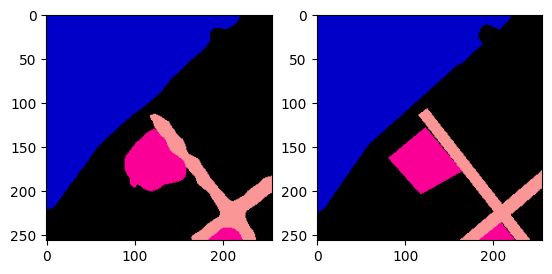

[2023-05-30 22:53:47 swanet_v5](182747771.py 311): INFO Test: [697/728]	Loss 0.0655 (0.3715)	PA@1 97.4243 (91.0080)	MPA@1 94.4153 (82.8209)	KAPPA@1 95.6191 (78.8877)	MIOU@1 90.6350 (72.8499)	FWIOU@1 95.0462 (86.4439)	Mem 44806MB


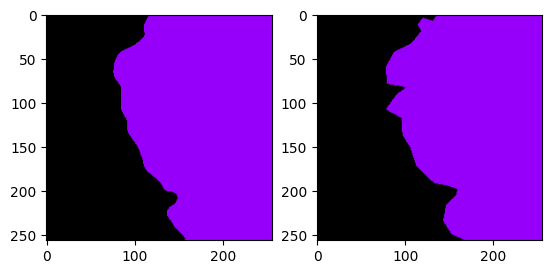

[2023-05-30 22:53:47 swanet_v5](182747771.py 311): INFO Test: [698/728]	Loss 0.0414 (0.3710)	PA@1 98.3002 (91.0184)	MPA@1 98.4927 (82.8433)	KAPPA@1 96.5360 (78.9129)	MIOU@1 96.5953 (72.8838)	FWIOU@1 96.6651 (86.4585)	Mem 44806MB


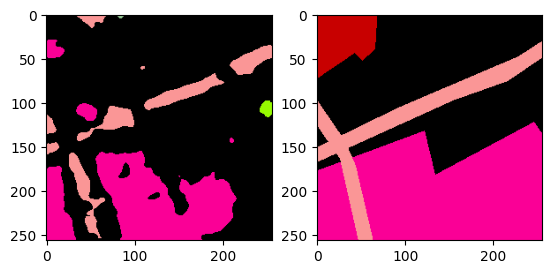

[2023-05-30 22:53:47 swanet_v5](182747771.py 311): INFO Test: [699/728]	Loss 1.6473 (0.3729)	PA@1 67.7536 (90.9852)	MPA@1 47.5582 (82.7929)	KAPPA@1 45.0473 (78.8645)	MIOU@1 25.5977 (72.8163)	FWIOU@1 55.2290 (86.4139)	Mem 44806MB


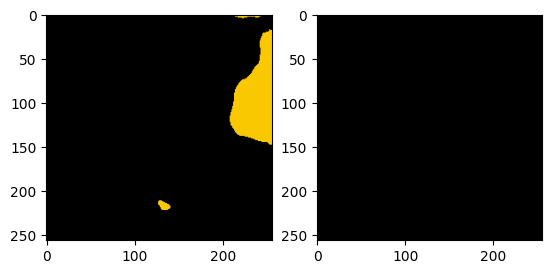

[2023-05-30 22:53:48 swanet_v5](182747771.py 311): INFO Test: [700/728]	Loss 0.1556 (0.3726)	PA@1 93.8492 (90.9893)	MPA@1 50.0000 (82.7461)	KAPPA@1 0.0000 (78.7520)	MIOU@1 46.9246 (72.7794)	FWIOU@1 88.0767 (86.4163)	Mem 44806MB


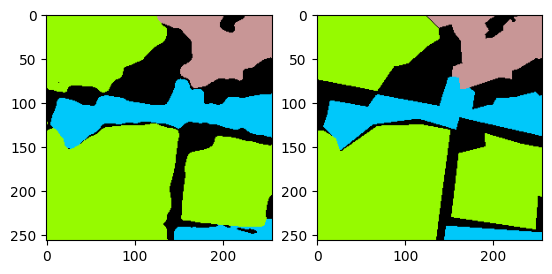

[2023-05-30 22:53:48 swanet_v5](182747771.py 311): INFO Test: [701/728]	Loss 0.1186 (0.3722)	PA@1 95.4468 (90.9956)	MPA@1 94.0656 (82.7622)	KAPPA@1 92.7583 (78.7720)	MIOU@1 89.0872 (72.8026)	FWIOU@1 91.6502 (86.4237)	Mem 44806MB


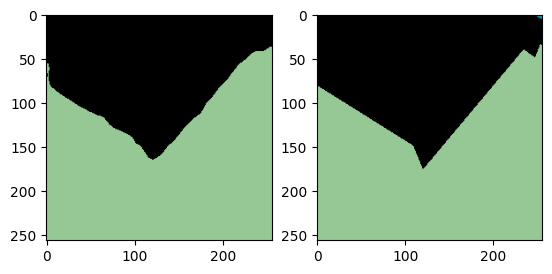

[2023-05-30 22:53:48 swanet_v5](182747771.py 311): INFO Test: [702/728]	Loss 0.0290 (0.3717)	PA@1 99.0311 (91.0071)	MPA@1 99.1152 (82.7855)	KAPPA@1 98.0083 (78.7993)	MIOU@1 65.3829 (72.7920)	FWIOU@1 98.1388 (86.4404)	Mem 44806MB


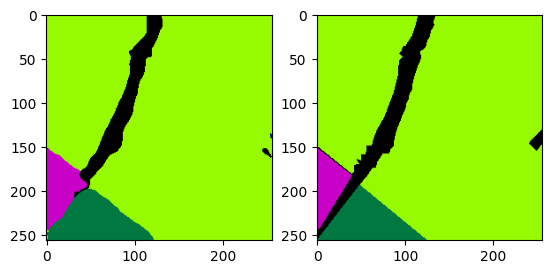

[2023-05-30 22:53:48 swanet_v5](182747771.py 311): INFO Test: [703/728]	Loss 0.0640 (0.3713)	PA@1 97.4747 (91.0163)	MPA@1 73.6869 (82.7726)	KAPPA@1 91.1752 (78.8169)	MIOU@1 68.0722 (72.7853)	FWIOU@1 95.6094 (86.4534)	Mem 44806MB


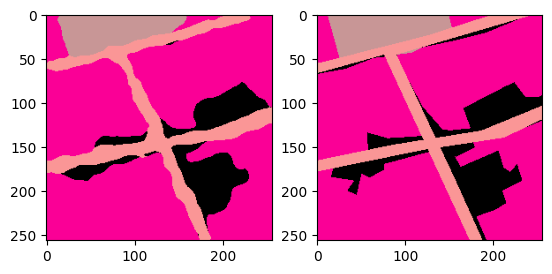

[2023-05-30 22:53:48 swanet_v5](182747771.py 311): INFO Test: [704/728]	Loss 0.1517 (0.3710)	PA@1 94.0979 (91.0206)	MPA@1 92.2063 (82.7860)	KAPPA@1 88.9002 (78.8312)	MIOU@1 85.0532 (72.8027)	FWIOU@1 89.2978 (86.4574)	Mem 44806MB


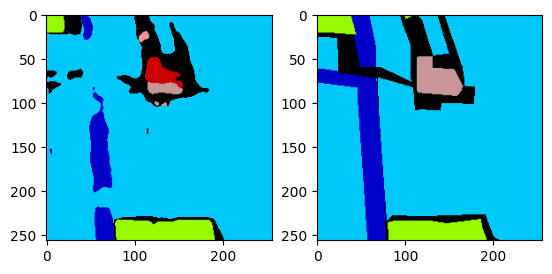

[2023-05-30 22:53:49 swanet_v5](182747771.py 311): INFO Test: [705/728]	Loss 0.4323 (0.3710)	PA@1 86.9415 (91.0149)	MPA@1 62.8752 (82.7578)	KAPPA@1 66.1569 (78.8133)	MIOU@1 40.0845 (72.7564)	FWIOU@1 80.8657 (86.4495)	Mem 44806MB


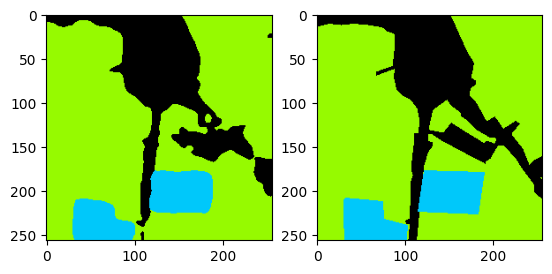

[2023-05-30 22:53:49 swanet_v5](182747771.py 311): INFO Test: [706/728]	Loss 0.1040 (0.3707)	PA@1 95.5139 (91.0212)	MPA@1 95.4229 (82.7757)	KAPPA@1 90.5744 (78.8299)	MIOU@1 90.2998 (72.7812)	FWIOU@1 91.5384 (86.4567)	Mem 44806MB


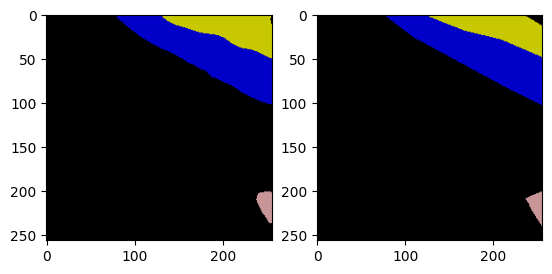

[2023-05-30 22:53:49 swanet_v5](182747771.py 311): INFO Test: [707/728]	Loss 0.0222 (0.3702)	PA@1 99.2020 (91.0328)	MPA@1 95.3626 (82.7934)	KAPPA@1 97.1688 (78.8558)	MIOU@1 93.0379 (72.8098)	FWIOU@1 98.4293 (86.4736)	Mem 44806MB


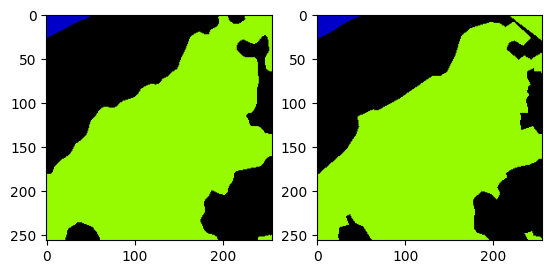

[2023-05-30 22:53:49 swanet_v5](182747771.py 311): INFO Test: [708/728]	Loss 0.0616 (0.3697)	PA@1 97.4518 (91.0418)	MPA@1 97.1815 (82.8137)	KAPPA@1 94.7939 (78.8783)	MIOU@1 94.5079 (72.8404)	FWIOU@1 95.0355 (86.4857)	Mem 44806MB


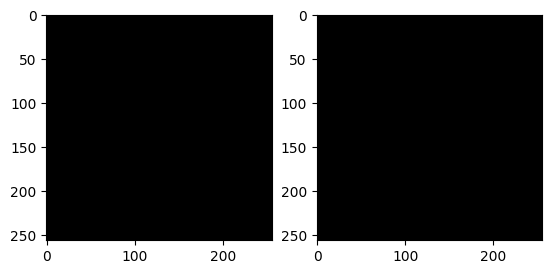

[2023-05-30 22:53:49 swanet_v5](182747771.py 311): INFO Test: [709/728]	Loss 0.0007 (0.3692)	PA@1 100.0000 (91.0544)	MPA@1 100.0000 (82.8379)	KAPPA@1 100.0000 (78.9080)	MIOU@1 100.0000 (72.8787)	FWIOU@1 100.0000 (86.5047)	Mem 44806MB


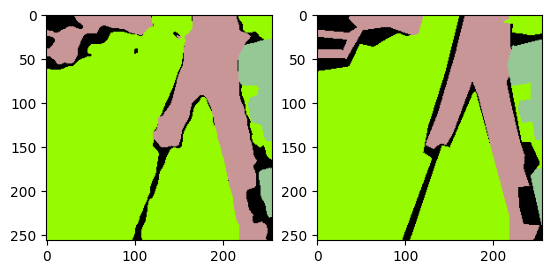

[2023-05-30 22:53:50 swanet_v5](182747771.py 311): INFO Test: [710/728]	Loss 0.1566 (0.3689)	PA@1 93.7424 (91.0582)	MPA@1 90.0473 (82.8481)	KAPPA@1 88.3905 (78.9214)	MIOU@1 80.8581 (72.8899)	FWIOU@1 89.6422 (86.5092)	Mem 44806MB


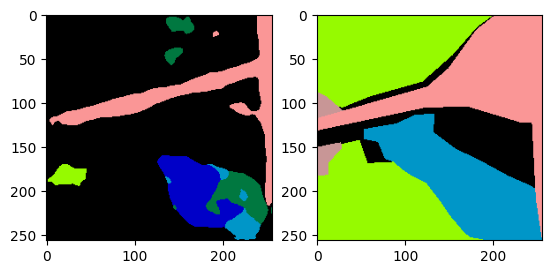

[2023-05-30 22:53:50 swanet_v5](182747771.py 311): INFO Test: [711/728]	Loss 4.0427 (0.3741)	PA@1 27.8076 (90.9694)	MPA@1 52.6819 (82.8057)	KAPPA@1 15.6555 (78.8325)	MIOU@1 10.8537 (72.8028)	FWIOU@1 19.4284 (86.4149)	Mem 44806MB


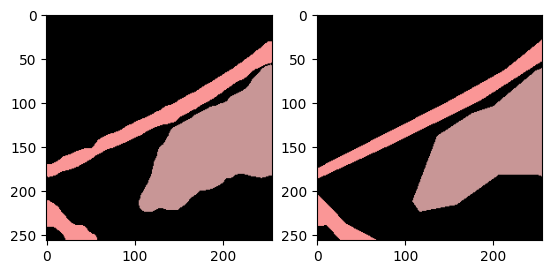

[2023-05-30 22:53:50 swanet_v5](182747771.py 311): INFO Test: [712/728]	Loss 0.0573 (0.3736)	PA@1 97.5510 (90.9786)	MPA@1 94.7749 (82.8225)	KAPPA@1 94.4413 (78.8544)	MIOU@1 92.5016 (72.8304)	FWIOU@1 95.2225 (86.4273)	Mem 44806MB


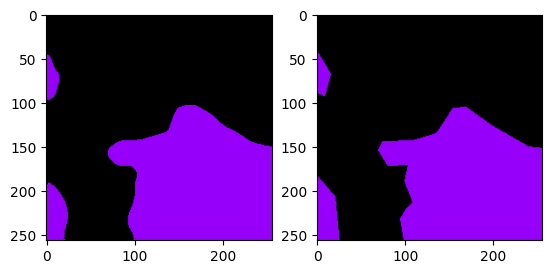

[2023-05-30 22:53:50 swanet_v5](182747771.py 311): INFO Test: [713/728]	Loss 0.0377 (0.3732)	PA@1 98.5397 (90.9892)	MPA@1 98.1449 (82.8440)	KAPPA@1 96.7606 (78.8795)	MIOU@1 96.8170 (72.8640)	FWIOU@1 97.1189 (86.4423)	Mem 44806MB


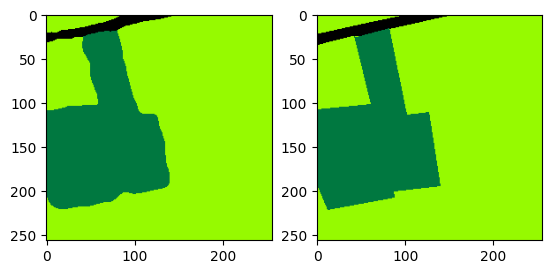

[2023-05-30 22:53:50 swanet_v5](182747771.py 311): INFO Test: [714/728]	Loss 0.0410 (0.3727)	PA@1 98.2727 (90.9994)	MPA@1 96.4920 (82.8630)	KAPPA@1 95.8862 (78.9033)	MIOU@1 90.6734 (72.8889)	FWIOU@1 96.6669 (86.4566)	Mem 44806MB


In [ ]:
if __name__ == '__main__':
#     os.environ['CUDA_VISIBLE_DEVICES']='0,1'
#     os.environ['WORLD_SIZE']='2'
#     os.environ['RANK']='0'
#     os.environ['MASTER_ADDR']='localhost'
#     os.environ['MASTER_PORT']='54321'

    args, config = parse_option()

    if config.AMP_OPT_LEVEL:
        print("[warning] Apex amp has been deprecated, please use pytorch amp instead!")

    if 'RANK' in os.environ and 'WORLD_SIZE' in os.environ:
        rank = int(os.environ["RANK"])
        world_size = int(os.environ['WORLD_SIZE'])
        print(f"RANK and WORLD_SIZE in environ: {rank}/{world_size}")
        torch.cuda.set_device(config.LOCAL_RANK)
        torch.distributed.init_process_group(backend='nccl', init_method='env://', world_size=world_size, rank=rank)
    else:
        rank=0
        world_size=1

    seed = config.SEED + rank
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    cudnn.benchmark = True

    # linear scale the learning rate according to total batch size, may not be optimal
    linear_scaled_lr = config.TRAIN.BASE_LR * config.DATA.BATCH_SIZE * world_size/ 512.0
    linear_scaled_warmup_lr = config.TRAIN.WARMUP_LR * config.DATA.BATCH_SIZE * world_size / 512.0
    linear_scaled_min_lr = config.TRAIN.MIN_LR * config.DATA.BATCH_SIZE * world_size / 512.0
    # gradient accumulation also need to scale the learning rate
    if config.TRAIN.ACCUMULATION_STEPS > 1:
        linear_scaled_lr = linear_scaled_lr * config.TRAIN.ACCUMULATION_STEPS
        linear_scaled_warmup_lr = linear_scaled_warmup_lr * config.TRAIN.ACCUMULATION_STEPS
        linear_scaled_min_lr = linear_scaled_min_lr * config.TRAIN.ACCUMULATION_STEPS
    config.defrost()
    config.TRAIN.BASE_LR = linear_scaled_lr
    config.TRAIN.WARMUP_LR = linear_scaled_warmup_lr
    config.TRAIN.MIN_LR = linear_scaled_min_lr
    config.DATA.BATCH_SIZE = 1
    config.freeze()

    os.makedirs(config.OUTPUT, exist_ok=True)
    logger = create_logger(output_dir=config.OUTPUT, dist_rank=rank, name=f"{config.MODEL.NAME}")

    main(config)